<a href="https://colab.research.google.com/github/lauraceciliadiazdavila/IA-LIDeSIA-Dpto-Computacion/blob/main/ENARGASySMN_CO2_SARIMAX.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**ENARGAS**

Análisis la serie temporal de ENARGAS, que es un conjunto de registros de gas entregado y número de clientes registrados a lo largo del tiempo, discriminado por provincia y tipo de cliente. Las observaciones se registran con una frecuencia mensual.

Prueba de concepto del modelo predictivo ARIMA (con única variable).





# Montaje de datos y análisis previo

In [ ]:
# Montar del Drive. Es necesario para poder leer y escribir archivos en el Drive.

from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# importar librerias, necesarias para la lectura, escritura, manejo de datos temporales y graficadores
import pandas as pd
import numpy as np
import matplotlib
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

from datetime import datetime, timedelta

plt.style.use('fivethirtyeight')
plt.rcParams['figure.figsize'] = (10, 3)

In [ ]:
# Generar un archivo "temporal" que muestre las características del análisis
fecha_actual = datetime.now().strftime("%Y-%m-%d %H:%M:%S")
general = f"""
--------------------------------------------------------------------------------
README GENERADO AUTOMATICAMENTE
Fecha de ejecución: {fecha_actual}
--------------------------------------------------------------------------------
"""
with open('README.txt', 'w') as f:
    f.write(general)
f.close()

variables_ecogas = """
--------------------------------------------------------------------------------
DESCRIPCION VARIABLES PARA EL CODIGO DE ANALISIS GAS NATURAL

Las variables son codificadas bajo las siguientes siglas:

ARG = Argentina
CBA = Cordoba
GE  = Gas Entregado en [miles de m3 de 9300 kcal]
US  = Numero de usuario [unidad]
SDB = Subdistribuidor
RES = Subsector Residencial
IND = Subsector Industrial
GNC = Subsector de gas natural comprimido
ENTES = Subsector de Entidades de Bien Público
COM = Subsector Comercial
CEN = Subsector Centrales Termicas
"""

f = open('README.txt','a')
f.write('\n' + variables_ecogas)
f.close()

In [ ]:
# Lectura de los archivos de ENARGAS

## -- ruta donde se encuentra el archivo conteniendo los datos
#path = '/content/'
path = '/content/drive/MyDrive/PS/BASE_DATO/'

# NOTAS ------------------------------------------------------------------------
# -- Gas Entregado (GE) - En miles de m3 de 9300 kcal
# ------------------------------------------------------------------------------
df_getot = pd.read_excel(path + 'DF_ENARGAS.xlsx','GAS_ENTREGADO_TOTAL', usecols='A:V', index_col='Mes')
df_gesdb = pd.read_excel(path + 'DF_ENARGAS.xlsx','GAS_ENTREGADO_SDB', usecols='A:V', index_col='Mes')
df_geres = pd.read_excel(path + 'DF_ENARGAS.xlsx','GAS_ENTREGADO_RESIDENCIAL', usecols='A:V', index_col='Mes')
df_geind = pd.read_excel(path + 'DF_ENARGAS.xlsx','GAS_ENTREGADO_INDUSTRIAS', usecols='A:V', index_col='Mes')
df_gegnc = pd.read_excel(path + 'DF_ENARGAS.xlsx','GAS_ENTREGADO_GNC', usecols='A:V', index_col='Mes')
df_geent = pd.read_excel(path + 'DF_ENARGAS.xlsx','GAS_ENTREGADO_ENTESOFICIALES', usecols='A:V', index_col='Mes')
df_gecom = pd.read_excel(path + 'DF_ENARGAS.xlsx','GAS_ENTREGADO_COMERCIAL', usecols='A:V', index_col='Mes')
df_gecen = pd.read_excel(path + 'DF_ENARGAS.xlsx','GAS_ENTREGADO_CENTRALESELECTRIC', usecols='A:V', index_col='Mes')

# NOTAS ------------------------------------------------------------------------
# -- Número de Usuarios (US) - En unidades
# ------------------------------------------------------------------------------
df_ustot = pd.read_excel(path + 'DF_ENARGAS.xlsx','USUARIOS_TOTAL', usecols='A:V', index_col='Mes')
df_ussdb = pd.read_excel(path + 'DF_ENARGAS.xlsx','USUARIOS_SDB', usecols='A:V', index_col='Mes')
df_usres = pd.read_excel(path + 'DF_ENARGAS.xlsx','USUARIOS_RESIDENCIAL', usecols='A:V', index_col='Mes')
df_usind = pd.read_excel(path + 'DF_ENARGAS.xlsx','USUARIOS_INDUSTRIA', usecols='A:V', index_col='Mes')
df_usgnc = pd.read_excel(path + 'DF_ENARGAS.xlsx','USUARIOS_GNC', usecols='A:V', index_col='Mes')
df_usent = pd.read_excel(path + 'DF_ENARGAS.xlsx','USUARIOS_ENTESOFICIALES', usecols='A:V', index_col='Mes')
df_uscom = pd.read_excel(path + 'DF_ENARGAS.xlsx','USUARIOS_COMERCIAL', usecols='A:V', index_col='Mes')
df_uscen = pd.read_excel(path + 'DF_ENARGAS.xlsx','USUARIOS_CENTRALESELECTRICAS', usecols='A:V', index_col='Mes')

# Ejemplificamos una base de datos
df_getot.head(5)

,Buenos Aires,Capital Federal,Catamarca,Córdoba,Chubut,Entre Ríos,Jujuy,La Pampa,La Rioja,Mendoza,...,Río Negro,Salta,San Juan,San Luis,Santa Cruz,Santa Fe,Sgo.del Estero,T.del Fuego,Tucumán,Total
Mes,,,,,,,,,,,,,,,,,,,,,
1993-01-01,561742,422539,4836,105972,37629,0,31692,2371,4064,67256,...,20592,46276,13054,6181,28486,119114,12574,14844,26761,1552848
1993-02-01,492654,397772,4591,78951,36227,0,28256,1860,4158,57126,...,21384,45105,14238,6148,25373,113930,9017,15159,25606,1402621
1993-03-01,604614,436311,6820,107536,43311,0,27405,2691,4945,66471,...,26382,44234,14646,8121,34008,142901,9315,17511,25272,1665156
1993-04-01,618844,412233,9613,108549,73015,0,27907,2611,4751,68582,...,37827,37926,12030,7716,39767,133583,8956,16896,29959,1705710
1993-05-01,721477,371337,10072,119461,96521,0,26987,6867,4926,79961,...,48532,47335,14070,10729,54409,144213,10086,26460,29062,1901439


In [ ]:
df_ustot.tail(5)

,Buenos Aires,Capital Federal,Catamarca,Córdoba,Chubut,Entre Ríos,Jujuy,La Pampa,La Rioja,Mendoza,...,Río Negro,Salta,San Juan,San Luis,Santa Cruz,Santa Fe,Sgo.del Estero,T.del Fuego,Tucumán,Total
Mes,,,,,,,,,,,,,,,,,,,,,
2023-03-01,4029135,1472643,21272,756094,189547,117462,89256,145031,15733,420830,...,249031,192416,122625,77724,53573,638103,78075,56394,216455,9140871
2023-04-01,4031795,1472813,21271,761368,189709,117621,89422,145479,15785,421195,...,249551,192567,123064,78113,53685,638033,78158,56577,216766,9152866
2023-05-01,4033641,1472930,21271,752876,190121,118215,89531,146110,15831,421820,...,250182,192784,122820,77862,53825,638317,78170,56766,216997,9150601
2023-06-01,4036856,1473190,21281,753562,190429,118332,89531,146526,15896,422254,...,250775,192784,123051,78077,53921,639712,78320,56980,217611,9160106
2023-07-01,4026890,1473282,21291,754870,190692,118674,86325,146730,15977,422851,...,251293,187486,123242,78239,53965,635765,75945,57186,213470,9135597


Este archivo contiene la cantidad de usuarios por provincia desde 1993 y hasta la actualidad.

La columna, index (Mes), es por defauld la variable temporal.

In [ ]:
df_ustot.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 367 entries, 1993-01-01 to 2023-07-01
Data columns (total 21 columns):
 #   Column           Non-Null Count  Dtype
---  ------           --------------  -----
 0   Buenos Aires     367 non-null    int64
 1   Capital Federal  367 non-null    int64
 2   Catamarca        367 non-null    int64
 3   Córdoba          367 non-null    int64
 4   Chubut           367 non-null    int64
 5   Entre Ríos       367 non-null    int64
 6   Jujuy            367 non-null    int64
 7   La Pampa         367 non-null    int64
 8   La Rioja         367 non-null    int64
 9   Mendoza          367 non-null    int64
 10  Neuquén          367 non-null    int64
 11  Río Negro        367 non-null    int64
 12  Salta            367 non-null    int64
 13  San Juan         367 non-null    int64
 14  San Luis         367 non-null    int64
 15  Santa Cruz       367 non-null    int64
 16  Santa Fe         367 non-null    int64
 17  Sgo.del Estero   367 non-null    in

In [ ]:
df_ustot.describe()

,Buenos Aires,Capital Federal,Catamarca,Córdoba,Chubut,Entre Ríos,Jujuy,La Pampa,La Rioja,Mendoza,...,Río Negro,Salta,San Juan,San Luis,Santa Cruz,Santa Fe,Sgo.del Estero,T.del Fuego,Tucumán,Total
count,3.670000e+02,3.670000e+02,367.000000,367.000000,367.000000,367.000000,367.000000,367.000000,367.000000,367.000000,...,367.000000,367.000000,367.000000,367.000000,367.000000,367.000000,367.000000,367.000000,367.000000,3.670000e+02
mean,3.200524e+06,1.356902e+06,17258.049046,517598.231608,134530.016349,53169.719346,63876.163488,97154.163488,11763.907357,314221.651226,...,171464.108992,125559.449591,83322.326975,48750.277929,39648.482289,464672.539510,51512.757493,36262.455041,150596.049046,7.071920e+06
std,6.104565e+05,8.342478e+04,3308.076767,150413.226809,35109.009609,43404.183939,16976.018103,33070.015549,3501.003152,72857.075200,...,45159.709992,42386.726756,26172.986267,23410.782662,9418.486345,127518.989881,15506.813891,10868.530176,45683.241306,1.431019e+06
min,2.081877e+06,1.212976e+06,10331.000000,263259.000000,70740.000000,0.000000,33783.000000,29230.000000,4195.000000,182228.000000,...,98104.000000,58886.000000,37492.000000,11525.000000,24598.000000,238230.000000,24905.000000,18496.000000,72163.000000,4.552949e+06
25%,2.723247e+06,1.278460e+06,14454.000000,382148.000000,104663.000000,8241.000000,51631.000000,72747.000000,9531.000000,254897.000000,...,132333.000000,91459.000000,61523.500000,25626.000000,31175.500000,347268.500000,43805.500000,27231.500000,119272.000000,5.883033e+06
50%,3.227072e+06,1.352976e+06,18369.000000,510254.000000,134786.000000,50366.000000,64457.000000,98756.000000,13166.000000,313489.000000,...,169333.000000,115957.000000,84051.000000,51380.000000,39100.000000,468189.000000,49229.000000,34108.000000,146910.000000,7.071976e+06
75%,3.812066e+06,1.445974e+06,20142.000000,666827.500000,167056.000000,97367.500000,79426.000000,127747.000000,14759.500000,387749.000000,...,212638.500000,168320.500000,107910.000000,72688.000000,49068.000000,594097.000000,64967.000000,45663.000000,195012.000000,8.492473e+06
max,4.036856e+06,1.473282e+06,21291.000000,761368.000000,190692.000000,118674.000000,89531.000000,146730.000000,15977.000000,422851.000000,...,251293.000000,192784.000000,123242.000000,78239.000000,53965.000000,639712.000000,78320.000000,57186.000000,217611.000000,9.160106e+06


Este comando muestra la cantidad de datos por provincia (columnas). Dtype muestra que son valores numericos enteros. Que todos sean 367, indica que no tenemos datos faltantes, ni null.

In [ ]:
# Creamos una columna nueva teniendo el paso de tiempo
df_ustot['Time'] = np.arange(len(df_ustot.index))
df_ustot.head(5)

,Buenos Aires,Capital Federal,Catamarca,Córdoba,Chubut,Entre Ríos,Jujuy,La Pampa,La Rioja,Mendoza,...,Salta,San Juan,San Luis,Santa Cruz,Santa Fe,Sgo.del Estero,T.del Fuego,Tucumán,Total,Time
Mes,,,,,,,,,,,,,,,,,,,,,
1993-01-01,2081877,1220287,10331,263259,70740,0,33783,29230,4195,182228,...,58886,37492,11525,24615,238230,24905,18496,72163,4552949,0
1993-02-01,2087598,1220311,10672,264774,70986,0,33984,29800,4242,182548,...,62097,38975,12097,24766,238790,24962,18516,72335,4570662,1
1993-03-01,2093328,1212976,10766,266963,71438,0,34181,30205,4334,183824,...,62317,39374,12178,24598,239743,25040,18565,72545,4576610,2
1993-04-01,2096749,1212977,10798,268880,71997,0,34301,30529,4393,185191,...,62597,39619,12293,24599,240750,25108,18638,72936,4587861,3
1993-05-01,2107533,1218373,10884,270796,72502,0,34512,31371,4469,186880,...,62832,39635,12295,25106,242117,25316,18762,73846,4611584,4


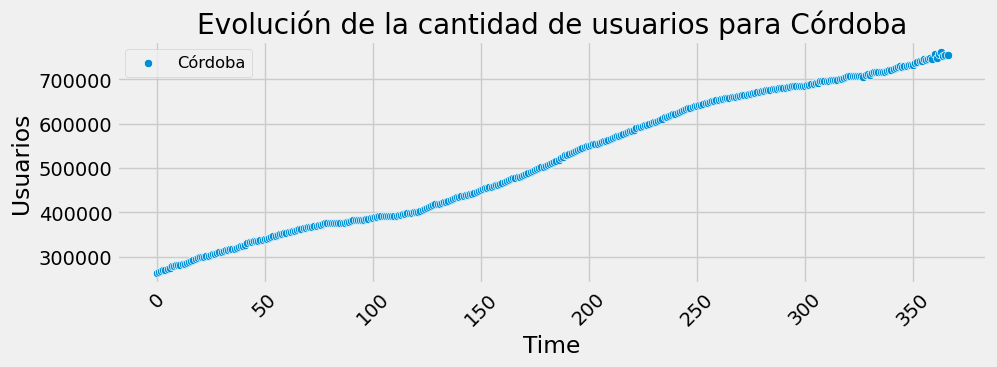

In [ ]:
sns.scatterplot(data = df_ustot, x = df_ustot.Time, y=df_ustot['Córdoba'], label="Córdoba")
# Agregar leyendas a los ejes
plt.xlabel("Time")
plt.ylabel("Usuarios")
# Agregar leyenda con los nombres de las líneas
plt.legend()
plt.legend(loc='upper left', fontsize='small')
# Agregar título al gráfico
plt.title("Evolución de la cantidad de usuarios para Córdoba")
# Rotar el eje x en 45 grados
plt.xticks(rotation=45)
# Mostrar el gráfico
plt.show()

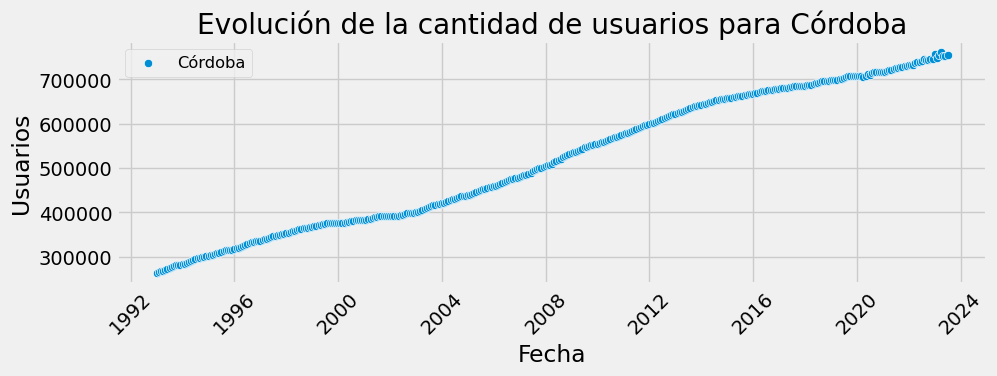

In [ ]:
sns.scatterplot(data=df_ustot, x="Mes", y="Córdoba", label="Córdoba")

plt.xlabel("Fecha")
plt.ylabel("Usuarios")
plt.legend(loc='upper left', fontsize='small')
plt.title("Evolución de la cantidad de usuarios para Córdoba")
plt.xticks(rotation=45)

plt.show()


/tmp/ipython-input-1360905414.py:17: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  plt.gca().set_xticklabels(years, rotation=45)


Text(0, 0.5, 'Usuarios')

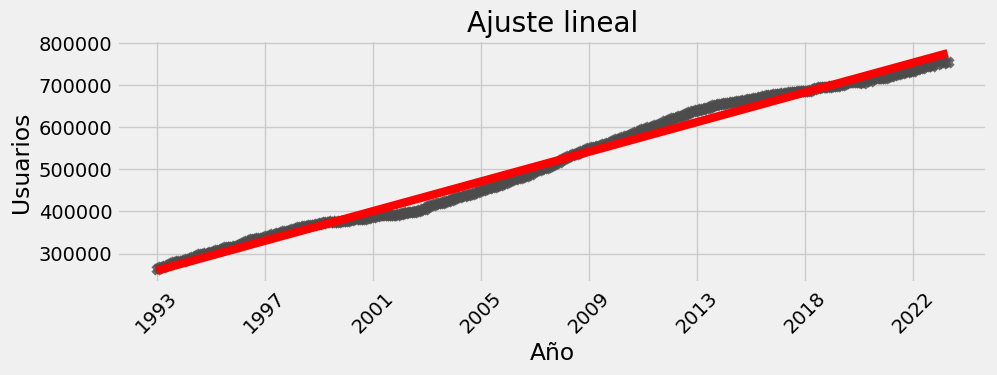

In [ ]:
# Primer ajuste lineal usando el propio graficador (https://seaborn.pydata.org/generated/seaborn.regplot.html)
# order, cambia el orden del ajuste
sns.regplot(data=df_ustot, x = df_ustot.Time, y=df_ustot['Córdoba'], order=1,
            ci=99, marker="x", color=".3", line_kws=dict(color="r"))
plt.title("Ajuste lineal")

# Reemplazar ticks por años reales
ticks = plt.gca().get_xticks()
years = []

for t in ticks:
    if 0 <= int(t) < len(df_ustot):
        years.append(df_ustot.index[int(t)].strftime("%Y"))
    else:
        years.append("")

plt.gca().set_xticklabels(years, rotation=45)
plt.xlabel("Año")
plt.ylabel("Usuarios")


In [ ]:
df_ustot.columns
df_ustot.head()


,Buenos Aires,Capital Federal,Catamarca,Córdoba,Chubut,Entre Ríos,Jujuy,La Pampa,La Rioja,Mendoza,...,Salta,San Juan,San Luis,Santa Cruz,Santa Fe,Sgo.del Estero,T.del Fuego,Tucumán,Total,Time
Mes,,,,,,,,,,,,,,,,,,,,,
1993-01-01,2081877,1220287,10331,263259,70740,0,33783,29230,4195,182228,...,58886,37492,11525,24615,238230,24905,18496,72163,4552949,0
1993-02-01,2087598,1220311,10672,264774,70986,0,33984,29800,4242,182548,...,62097,38975,12097,24766,238790,24962,18516,72335,4570662,1
1993-03-01,2093328,1212976,10766,266963,71438,0,34181,30205,4334,183824,...,62317,39374,12178,24598,239743,25040,18565,72545,4576610,2
1993-04-01,2096749,1212977,10798,268880,71997,0,34301,30529,4393,185191,...,62597,39619,12293,24599,240750,25108,18638,72936,4587861,3
1993-05-01,2107533,1218373,10884,270796,72502,0,34512,31371,4469,186880,...,62832,39635,12295,25106,242117,25316,18762,73846,4611584,4


Modelo de regresión lineal estándar de scikit-learn.

In [ ]:
# https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LinearRegression.html

from sklearn.linear_model import LinearRegression

# Training data
X = df_ustot.loc[:, ['Time']]  # features
y = df_ustot.loc[:, 'Córdoba']  # target

# Train the model
model = LinearRegression()
model.fit(X, y)

# Store the fitted values as a time series with the same time index as the training data
y_pred = pd.Series(model.predict(X), index=X.index)

# Values of model parameters
print('Orden del Modelo =', len(model.coef_),
      'Coeficientes = ', model.coef_,
      'bias', model.intercept_)

Orden del Modelo = 1 Coeficientes =  [1409.760578] bias 259612.04583283985


<Axes: xlabel='Time', ylabel='Córdoba'>

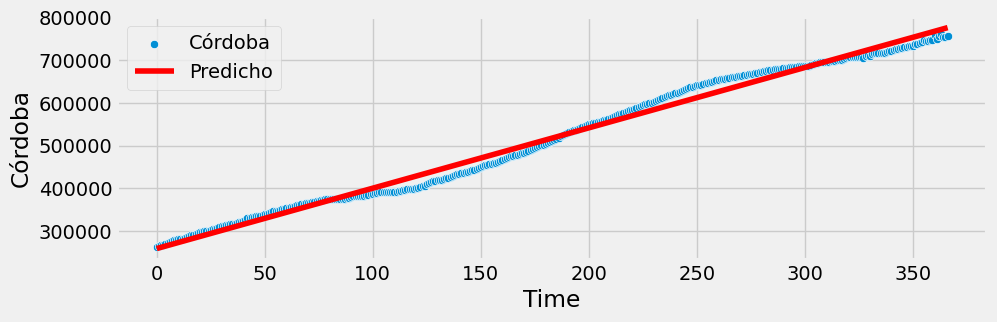

In [ ]:
sns.scatterplot(data = df_ustot, x = df_ustot.Time, y=df_ustot['Córdoba'], label="Córdoba")
sns.lineplot(data = df_ustot, x = df_ustot.Time, y=y_pred, label="Predicho", color= 'r')

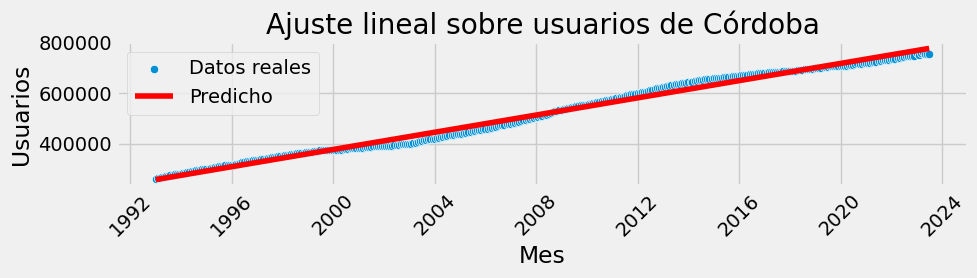

In [ ]:
# Scatter real con fechas reales
sns.scatterplot(
    x=df_ustot.index,   # <--- eje X AHORA ES FECHA REAL
    y=df_ustot["Córdoba"],
    label="Datos reales"
)

# Línea predicha pero sobre las fechas reales
sns.lineplot(
    x=df_ustot.index,
    y=y_pred,
    label="Predicho",
    color="r"
)

plt.xlabel("Mes")
plt.ylabel("Usuarios")
plt.title("Ajuste lineal sobre usuarios de Córdoba")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [ ]:
df_ustot['Córdoba'].describe()

,Córdoba
count,367.000000
mean,517598.231608
std,150413.226809
min,263259.000000
25%,382148.000000
50%,510254.000000
75%,666827.500000
max,761368.000000


In [ ]:
print('Datos Provinciales ', df_ustot.columns)

Datos Provinciales  Index(['Buenos Aires', 'Capital Federal', 'Catamarca', 'Córdoba', 'Chubut',
       'Entre Ríos', 'Jujuy', 'La Pampa', 'La Rioja', 'Mendoza', 'Neuquén',
       'Río Negro', 'Salta', 'San Juan', 'San Luis', 'Santa Cruz', 'Santa Fe',
       'Sgo.del Estero', 'T.del Fuego', 'Tucumán', 'Total', 'Time'],
      dtype='object')


Selección de un porción del dataframe, correspondiente a una provincia, aquella que representa a la provincia de Córdoba.

In [ ]:
# Seleccionar una provincia determinada
prov = 'Córdoba'

# crear dataframe de pandas
df_gas_prov = pd.DataFrame()

df_gas_prov['GE_TOTAL'] = df_getot[prov]
df_gas_prov['US_TOTAL'] = df_ustot[prov]
df_gas_prov['GE_SDB']   = df_gesdb[prov]
df_gas_prov['US_SDB']   = df_ussdb[prov]
df_gas_prov['GE_RES']   = df_geres[prov]
df_gas_prov['US_RES']   = df_usres[prov]
df_gas_prov['GE_IND']   = df_geind[prov]
df_gas_prov['US_IND']   = df_usind[prov]
df_gas_prov['GE_GNC']   = df_gegnc[prov]
df_gas_prov['US_GNC']   = df_usgnc[prov]
df_gas_prov['GE_ENTES'] = df_geent[prov]
df_gas_prov['US_ENTES'] = df_usent[prov]
df_gas_prov['GE_COM']   = df_gecom[prov]
df_gas_prov['US_COM']   = df_uscom[prov]
df_gas_prov['GE_CEN']   = df_gecen[prov]
df_gas_prov['US_CENT']  = df_uscen[prov]


## -- ruta donde se grabará el archivo
# Creamos un nuevo excel con el Dataframe
path = '/content/'
writer = pd.ExcelWriter(path + 'RESULTADOS.xlsx', engine='openpyxl')
df_gas_prov.to_excel(writer, sheet_name=prov,startrow=0, startcol=0)

writer.close()

df_gas_prov.head(5)

,GE_TOTAL,US_TOTAL,GE_SDB,US_SDB,GE_RES,US_RES,GE_IND,US_IND,GE_GNC,US_GNC,GE_ENTES,US_ENTES,GE_COM,US_COM,GE_CEN,US_CENT
Mes,,,,,,,,,,,,,,,,
1993-01-01,105972,263259,1816,10,8880,253398,27205,685,5158,24,1757,1027,2486,8107,58670,8
1993-02-01,78951,264774,1955,10,6479,254889,18924,694,5103,24,1942,1027,1845,8122,42703,8
1993-03-01,107536,266963,2502,10,9916,257016,26165,700,5735,34,1249,1031,2425,8164,59544,8
1993-04-01,108549,268880,2538,10,13790,258894,27492,705,5810,36,2047,1033,3263,8194,53609,8
1993-05-01,119461,270796,3218,10,28745,260649,28758,731,6236,36,3265,1035,4617,8327,44622,8


#Proceder a realizar el análisis del gas entregado




In [ ]:
# Número de días de cada mes desde "start_year" y hasta "end_year"
start_year = 1993
end_year   = datetime.today().year
dias_por_mes_tot = []

for year in range(start_year, end_year + 1):
    for month in range(1, 13):
        last_day_of_month = (datetime(year, month, 1) + timedelta(days=32)).replace(day=1) - timedelta(days=1)
        dias_por_mes_tot.append(last_day_of_month.day)

print('Dias de cada mes, desde 1993')
print(dias_por_mes_tot)

Dias de cada mes, desde 1993
[31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31, 31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31, 31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31, 31, 29, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31, 31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31, 31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31, 31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31, 31, 29, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31, 31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31, 31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31, 31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31, 31, 29, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31, 31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31, 31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31, 31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31, 31, 29, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31, 31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31, 31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31, 31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31, 31, 29, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31, 31, 28, 31

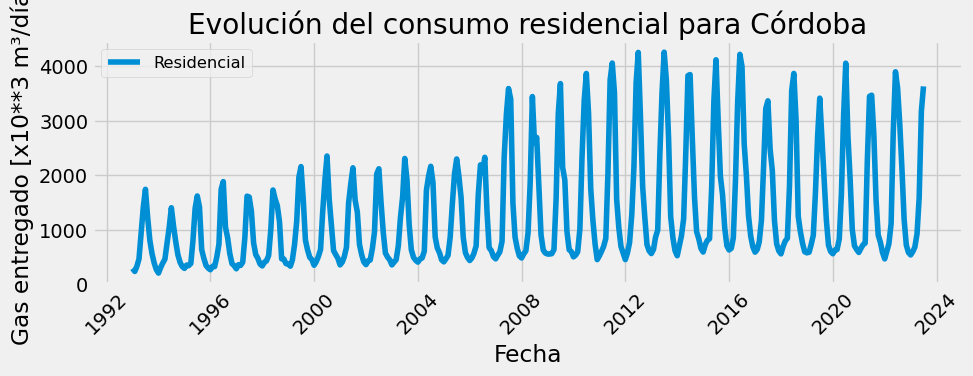

In [ ]:
# Evolución de la demanda residencial

# longitud del dataframe
a = len(df_gas_prov)

# División por los días del mes
df_aux  = df_gas_prov.div(dias_por_mes_tot[0:a], axis=0)

# Solo datos después del 2008
df_aux2 = df_aux[df_aux.index.year >=2008 ]


sns.lineplot(data = df_aux, x = df_aux.index, y=df_aux.GE_RES, label="Residencial")
# Agregar leyendas a los ejes
plt.xlabel("Fecha")
plt.ylabel("Gas entregado [x10**3 m³/día]")
# Agregar leyenda con los nombres de las líneas
plt.legend()
plt.legend(loc='upper left', fontsize='small')
# Agregar título al gráfico
plt.title("Evolución del consumo residencial para "+prov)
# Rotar el eje x en 45 grados
plt.xticks(rotation=45)
# Mostrar el gráfico
plt.show()

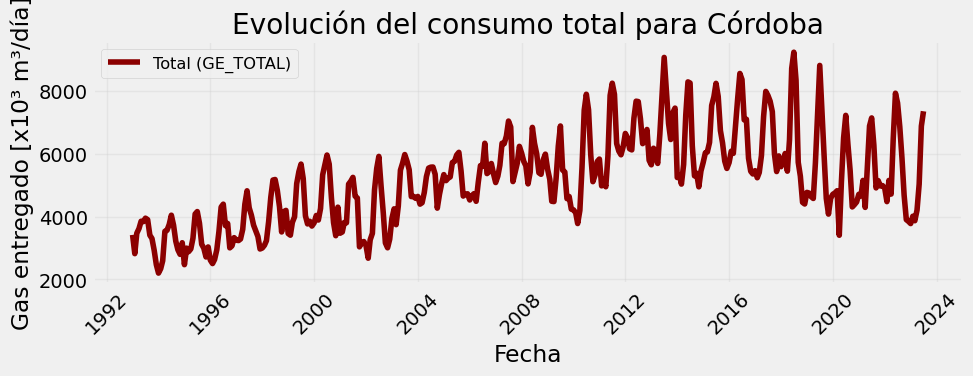

In [ ]:
# Evolución de la demanda total

a = len(df_gas_prov)

# Conversión a consumo promedio diario (se reutiliza df_aux)
df_aux = df_gas_prov.div(dias_por_mes_tot[0:a], axis=0)

# Gráfico Total
sns.lineplot(data=df_aux, x=df_aux.index, y=df_aux.GE_TOTAL, label="Total (GE_TOTAL)", color='darkred')
plt.xlabel("Fecha")
plt.ylabel("Gas entregado [x10³ m³/día]")
plt.title("Evolución del consumo total para " + prov)
plt.legend(loc='upper left', fontsize='small')
plt.xticks(rotation=45)
plt.grid(True, alpha=0.3)
plt.show()


In [ ]:
# --- Recuperar índice de fechas mensual ---
if df_aux2.index.name != 'Mes':
    df_aux2.reset_index(inplace=True)
    if 'Mes' in df_aux2.columns:
        df_aux2['Mes'] = pd.to_datetime(df_aux2['Mes'], errors='coerce')
        df_aux2.set_index('Mes', inplace=True)

# --- Opcional: volver a crear columna 'Time' como contador ---
df_aux2['Time'] = np.arange(len(df_aux2.index))
df_aux2.head()


,GE_TOTAL,US_TOTAL,GE_SDB,US_SDB,GE_RES,US_RES,GE_IND,US_IND,GE_GNC,US_GNC,GE_ENTES,US_ENTES,GE_COM,US_COM,GE_CEN,US_CENT,Time
Mes,,,,,,,,,,,,,,,,,
2008-01-01,6027.709677,16255.741935,69.322581,0.451613,478.806452,15565.483871,1813.967742,23.612903,851.645161,6.838710,14.806452,64.741935,122.612903,594.387097,2676.548387,0.225806,0
2008-02-01,5758.793103,17449.724138,74.758621,0.482759,556.241379,16709.793103,1527.103448,26.241379,883.586207,7.310345,15.655172,68.931034,129.862069,636.689655,2571.586207,0.275862,1
2008-03-01,5620.806452,16381.129032,84.193548,0.451613,607.096774,15687.096774,1729.645161,25.387097,855.258065,6.838710,18.580645,64.419355,131.516129,596.677419,2194.516129,0.258065,2
2008-04-01,5043.766667,17008.466667,129.566667,0.466667,937.533333,16289.000000,1642.466667,26.200000,852.266667,7.133333,31.733333,66.733333,157.333333,618.700000,1292.866667,0.233333,3
2008-05-01,5413.161290,16544.838710,257.709677,0.451613,1859.032258,15843.516129,1619.000000,25.419355,855.354839,6.903226,60.032258,65.161290,219.483871,603.161290,542.548387,0.225806,4


In [ ]:
# Creamos una columna nueva teniendo el paso de tiempo
df_aux2['Time'] = np.arange(len(df_aux2.index))
df_aux2.head(5)

,GE_TOTAL,US_TOTAL,GE_SDB,US_SDB,GE_RES,US_RES,GE_IND,US_IND,GE_GNC,US_GNC,GE_ENTES,US_ENTES,GE_COM,US_COM,GE_CEN,US_CENT,Time
Mes,,,,,,,,,,,,,,,,,
2008-01-01,6027.709677,16255.741935,69.322581,0.451613,478.806452,15565.483871,1813.967742,23.612903,851.645161,6.838710,14.806452,64.741935,122.612903,594.387097,2676.548387,0.225806,0
2008-02-01,5758.793103,17449.724138,74.758621,0.482759,556.241379,16709.793103,1527.103448,26.241379,883.586207,7.310345,15.655172,68.931034,129.862069,636.689655,2571.586207,0.275862,1
2008-03-01,5620.806452,16381.129032,84.193548,0.451613,607.096774,15687.096774,1729.645161,25.387097,855.258065,6.838710,18.580645,64.419355,131.516129,596.677419,2194.516129,0.258065,2
2008-04-01,5043.766667,17008.466667,129.566667,0.466667,937.533333,16289.000000,1642.466667,26.200000,852.266667,7.133333,31.733333,66.733333,157.333333,618.700000,1292.866667,0.233333,3
2008-05-01,5413.161290,16544.838710,257.709677,0.451613,1859.032258,15843.516129,1619.000000,25.419355,855.354839,6.903226,60.032258,65.161290,219.483871,603.161290,542.548387,0.225806,4


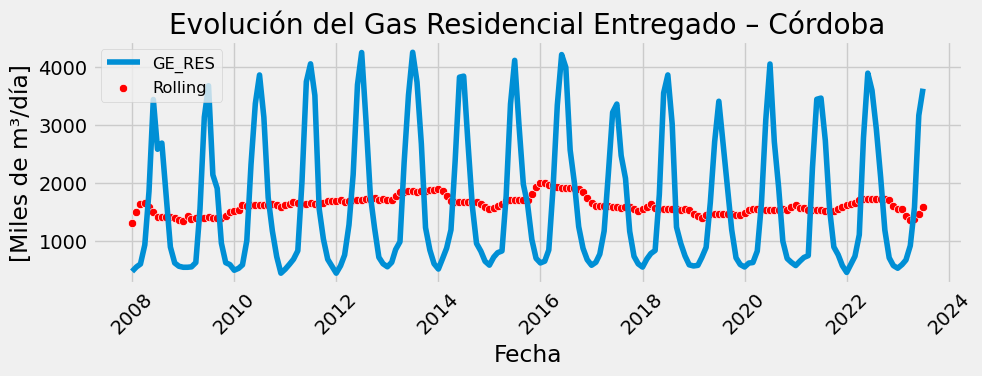

In [ ]:
# El componente de tendencia de una serie temporal representa un cambio persistente y
# de largo plazo en la media de la serie.
# La tendencia es la parte de una serie que se mueve más lentamente, la parte que
# representa la escala temporal de mayor importancia.
#
# Nuestros datos tienen una periodicidad anual (12 meses)
#
# Usaremos los datos posteriores a 2008, porque antes hay un cambio abrupto que molesta (df_aux2)
#
# rolling = https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.rolling.html

moving_average = df_aux2['GE_RES'].rolling(
                                   window=12,        # 12-month window
                                   center=True,      # puts the average at the center of the window
                                   min_periods=6,    # choose about half the window size
                                  ).mean()           # compute the mean (could also do median, std, min, max, ...)



sns.lineplot(data = df_aux2, x = df_aux2.index, y=df_aux2['GE_RES'], label="GE_RES")
sns.scatterplot(data = df_aux2, x = df_aux2.index, y=moving_average, label="Rolling", color= 'r')

plt.xlabel("Fecha")
plt.ylabel("[Miles de m³/día]")
plt.legend(loc='upper left', fontsize='small')
plt.title("Evolución del Gas Residencial Entregado – " + prov)
plt.xticks(rotation=45)
plt.show()

In [ ]:
df_aux2.head(4)

,GE_TOTAL,US_TOTAL,GE_SDB,US_SDB,GE_RES,US_RES,GE_IND,US_IND,GE_GNC,US_GNC,GE_ENTES,US_ENTES,GE_COM,US_COM,GE_CEN,US_CENT,Time
Mes,,,,,,,,,,,,,,,,,
2008-01-01,6027.709677,16255.741935,69.322581,0.451613,478.806452,15565.483871,1813.967742,23.612903,851.645161,6.838710,14.806452,64.741935,122.612903,594.387097,2676.548387,0.225806,0
2008-02-01,5758.793103,17449.724138,74.758621,0.482759,556.241379,16709.793103,1527.103448,26.241379,883.586207,7.310345,15.655172,68.931034,129.862069,636.689655,2571.586207,0.275862,1
2008-03-01,5620.806452,16381.129032,84.193548,0.451613,607.096774,15687.096774,1729.645161,25.387097,855.258065,6.838710,18.580645,64.419355,131.516129,596.677419,2194.516129,0.258065,2
2008-04-01,5043.766667,17008.466667,129.566667,0.466667,937.533333,16289.000000,1642.466667,26.200000,852.266667,7.133333,31.733333,66.733333,157.333333,618.700000,1292.866667,0.233333,3


In [ ]:
df_aux2.index.day

Index([1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       ...
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
      dtype='int32', name='Mes', length=187)

In [ ]:
# Creamos una columna nueva teniendo el paso de tiempo
df_aux2['Time'] = np.arange(len(df_aux2.index))
df_aux2.head(5)

,GE_TOTAL,US_TOTAL,GE_SDB,US_SDB,GE_RES,US_RES,GE_IND,US_IND,GE_GNC,US_GNC,GE_ENTES,US_ENTES,GE_COM,US_COM,GE_CEN,US_CENT,Time
Mes,,,,,,,,,,,,,,,,,
2008-01-01,6027.709677,16255.741935,69.322581,0.451613,478.806452,15565.483871,1813.967742,23.612903,851.645161,6.838710,14.806452,64.741935,122.612903,594.387097,2676.548387,0.225806,0
2008-02-01,5758.793103,17449.724138,74.758621,0.482759,556.241379,16709.793103,1527.103448,26.241379,883.586207,7.310345,15.655172,68.931034,129.862069,636.689655,2571.586207,0.275862,1
2008-03-01,5620.806452,16381.129032,84.193548,0.451613,607.096774,15687.096774,1729.645161,25.387097,855.258065,6.838710,18.580645,64.419355,131.516129,596.677419,2194.516129,0.258065,2
2008-04-01,5043.766667,17008.466667,129.566667,0.466667,937.533333,16289.000000,1642.466667,26.200000,852.266667,7.133333,31.733333,66.733333,157.333333,618.700000,1292.866667,0.233333,3
2008-05-01,5413.161290,16544.838710,257.709677,0.451613,1859.032258,15843.516129,1619.000000,25.419355,855.354839,6.903226,60.032258,65.161290,219.483871,603.161290,542.548387,0.225806,4


Orden del Modelo = 1 Coeficientes =  [-0.0278721] bias 1625.3940828107166


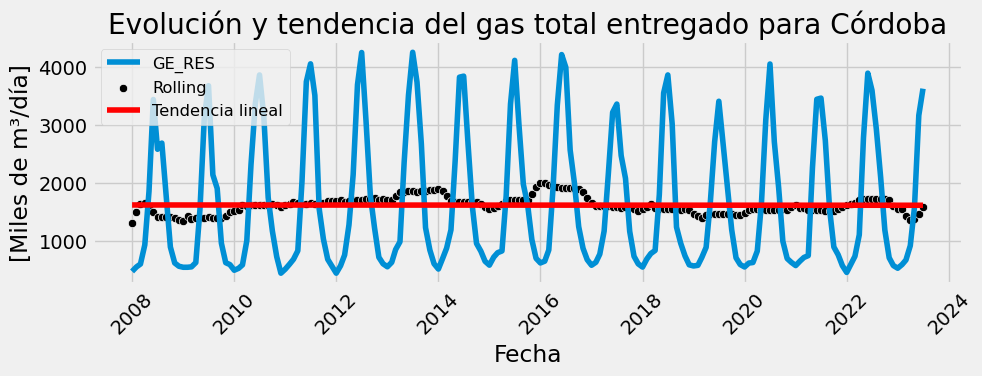

In [ ]:
# https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LinearRegression.html

from sklearn.linear_model import LinearRegression

# Training data
X = df_aux2.loc[:, ['Time']]  # features
y = moving_average  # target

# Train the model
model = LinearRegression()
model.fit(X, y)

# Store the fitted values as a time series with the same time index as the training data
y_pred = pd.Series(model.predict(X), index=X.index)

# Values of model parameters
print('Orden del Modelo =', len(model.coef_),
      'Coeficientes = ', model.coef_,
      'bias', model.intercept_)

sns.lineplot(data = df_aux2, x = df_aux2.index, y=df_aux2['GE_RES'], label="GE_RES")
sns.scatterplot(data = df_aux2, x = df_aux2.index, y=moving_average, label="Rolling", color = 'black')
sns.lineplot(data = df_aux2, x = df_aux2.index, y=y_pred, label="Tendencia lineal", color= 'r')

plt.xlabel("Fecha")
plt.ylabel("[Miles de m³/día]")
plt.legend(loc='upper left', fontsize='small')
plt.title("Evolución y tendencia del gas total entregado para " + prov)
plt.xticks(rotation=45)
plt.show()


In [ ]:
df_aux2.columns

Index(['GE_TOTAL', 'US_TOTAL', 'GE_SDB', 'US_SDB', 'GE_RES', 'US_RES',
       'GE_IND', 'US_IND', 'GE_GNC', 'US_GNC', 'GE_ENTES', 'US_ENTES',
       'GE_COM', 'US_COM', 'GE_CEN', 'US_CENT', 'Time'],
      dtype='object')

<Axes: ylabel='GE_RES'>

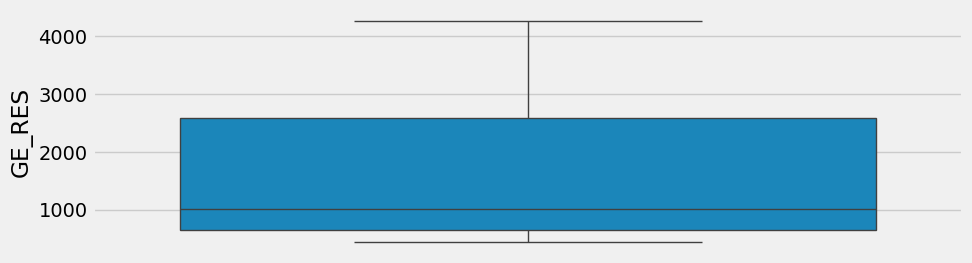

In [ ]:
# https://python-charts.com/es/distribucion/box-plot-seaborn/
sns.boxplot(df_aux2.GE_RES)

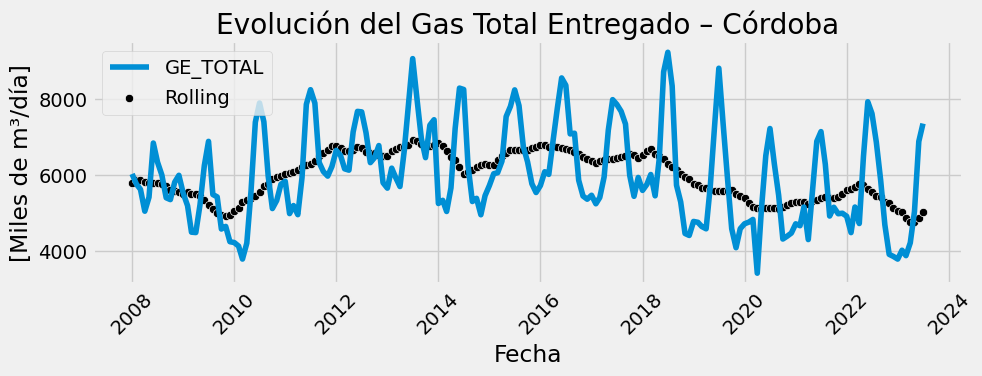

In [ ]:
# =============================================
# 1️⃣ Promedio móvil 12 meses para GE_TOTAL
# =============================================

moving_average_total = df_aux2['GE_TOTAL'].rolling(
    window=12,
    center=True,
    min_periods=6
).mean()

# Gráfico del gas total + rolling
sns.lineplot(data=df_aux2, x=df_aux2.index, y=df_aux2['GE_TOTAL'], label="GE_TOTAL")
sns.scatterplot(data=df_aux2, x=df_aux2.index, y=moving_average_total, label="Rolling", color='black')
plt.xlabel("Fecha")
plt.ylabel("[Miles de m³/día]")
plt.title("Evolución del Gas Total Entregado – "+prov)
plt.xticks(rotation=45)
plt.legend()
plt.show()



Coeficiente: -3.1408829337760267
Intercepto: 6267.472588330778


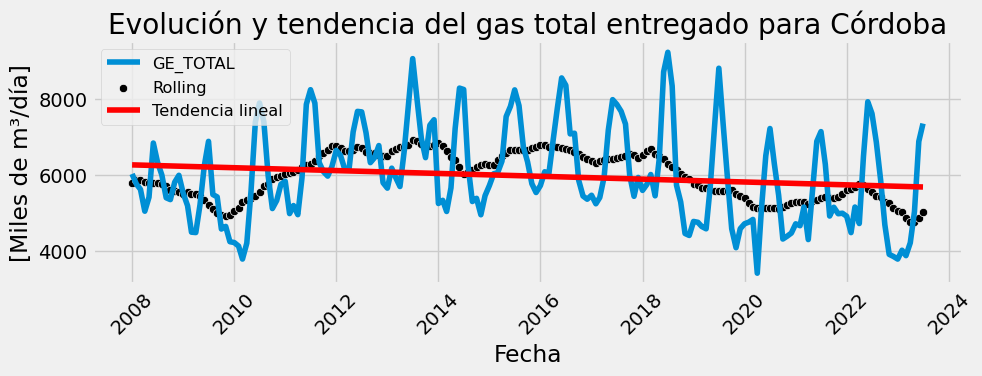

In [ ]:
# ======================
# 1) Suavizado (rolling)
# ======================

moving_average_total = df_aux2['GE_TOTAL'].rolling(
    window=12,
    center=True,
    min_periods=6
).mean()

# ======================
# 2) Crear variable Time
# ======================

df_aux2['Time'] = df_aux2.index.factorize()[0]

# ======================
# 3) Ajuste del modelo lineal
# ======================

from sklearn.linear_model import LinearRegression

X = df_aux2[['Time']]             # variable explicativa
y_total = moving_average_total     # variable suavizada

model_total = LinearRegression()
model_total.fit(X, y_total)

y_pred_total = pd.Series(model_total.predict(X), index=df_aux2.index)

print('Coeficiente:', model_total.coef_[0])
print('Intercepto:', model_total.intercept_)

# ======================
# 4) Gráfico
# ======================

sns.lineplot(data=df_aux2, x=df_aux2.index, y=df_aux2['GE_TOTAL'], label="GE_TOTAL")
sns.scatterplot(data=df_aux2, x=df_aux2.index, y=moving_average_total, label="Rolling", color='black')
sns.lineplot(data=df_aux2, x=df_aux2.index, y=y_pred_total, label="Tendencia lineal", color='r')

plt.xlabel("Fecha")
plt.ylabel("[Miles de m³/día]")
plt.legend(loc='upper left', fontsize='small')
plt.title("Evolución y tendencia del gas total entregado para " + prov)
plt.xticks(rotation=45)
plt.show()



# Modelo ARIMA y SARIMAX


ARIMA (AutoRegressive Integrated Moving Average) y SARIMAX (Seasonal AutoRegressive Integrated Moving Average with eXogenous regressors) son modelos estadísticos ampliamente reconocidos y utilizados para la predicción de series temporales (forecasting).

In [ ]:
#Librerías
from io import StringIO
import contextlib
import re
import matplotlib.pyplot as plt
plt.style.use('seaborn-v0_8-darkgrid')

# pmdarima (comentado por incompatibilidad)
#!pip install pmdarima
#from pmdarima import ARIMA
#from pmdarima import auto_arima

# statsmodels
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import kpss
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.seasonal import seasonal_decompose

# skforecast
#!pip install skforecast
#!pip install skforecast==0.10.0

#from skforecast.sarimax import Sarimax
#from skforecast.sarimax import ForecasterSarimax
#from skforecast.model_selection import backtesting_sarimax, grid_search_sarimax
from sklearn.metrics import mean_absolute_error


import warnings

#from skforecast.Sarimax import Sarimax
#from skforecast.ForecasterSarimax import ForecasterSarimax
#from skforecast.model_selection_sarimax import backtesting_sarimax
#from skforecast.model_selection_sarimax import grid_search_sarimax

ACLARACIÓN: pip no puede instalar skforecast 0.10.0 porque intenta bajar una versión de numpy que no se puede compilar en el entorno actual (Colab ya trae numpy 2.x).

ForecasterSarimax ya no existe en las versiones recientes de skforecast (0.18+). Por eso, aunque instale algo, el import falla.

Conviene eliminar todo lo de skforecast como lo de auto_arima.

Quedarse solo con statsmodels.SARIMAX, backtesting y grid search usando otro código que funcione con numpy 2.x.

In [ ]:
#Selección de datos

#Chequeo de que los datos a utilizar sean desde el 2008 en adelante
#print("Primer registro df_aux2:", df_aux2.index.min())
#print("Último registro df_aux2:", df_aux2.index.max())
#print("Freq inferida del índice:", df_aux2.index.inferred_freq)

#Utiliza el 60% del data frame para entrenamiento y 40% para test
#datos_train= df_aux2.head(int(0.6 * len(df_aux2)))
#datos_test= df_aux2.drop(datos_train.index)                                   # 40% de datos restantes

# Selecciono las variables que necesito, el gas entregado residencial
#var_entrenamiento = datos_train.pop('GE_RES')
#var_test = datos_test.pop('GE_RES')

#Si se quiere conservar la columna GE_RES y no eliminarla del data frame original:
#var_entrenamiento = datos_train['GE_RES'].copy()
#var_test = datos_test['GE_RES'].copy()

#print("train desde", var_entrenamiento.index.min(), "hasta", var_entrenamiento.index.max(), "(n=", len(var_entrenamiento),")")
#print("test  desde", var_test.index.min(), "hasta", var_test.index.max(), "(n=", len(var_test),")")

#Graficamos
#fig, ax=plt.subplots(figsize=(10, 4))
#var_entrenamiento.plot(ax=ax, label='train')
#var_test.plot(ax=ax, label='test')
#ax.set_title('Gas entregado residencial mensual - Córdoba')
#ax.set_ylabel('GE_RES en miles de m3 de 9300 kcal')
#ax.legend();

NOTA: Freq inferida del índice: MS significa Month Start, o sea que los datos están mensuales al comienzo de cada mes (por ejemplo, 2008-01-01, 2008-02-01, etc.)

In [ ]:
# ===========================================================
# 📌 División de datos: entrenamiento = todo salvo últimos 12 meses
# ===========================================================
serie = df_aux2['GE_RES'].dropna()

n_test = 12
var_entrenamiento = serie.iloc[:-n_test]
var_test = serie.iloc[-n_test:]

print("Entrenamiento:", var_entrenamiento.index.min(), "→", var_entrenamiento.index.max(),
      f"({len(var_entrenamiento)} registros)")
print("Prueba:", var_test.index.min(), "→", var_test.index.max(),
      f"({len(var_test)} registros)")




Entrenamiento: 2008-01-01 00:00:00 → 2022-07-01 00:00:00 (175 registros)
Prueba: 2022-08-01 00:00:00 → 2023-07-01 00:00:00 (12 registros)


**Estacionariedad**

Existen varios métodos para evaluar si una serie temporal es estacionaria o no estacionaria:

Inspección visual de la serie temporal: inspeccionando visualmente el gráfico de la serie temporal, es posible identificar la presencia de una tendencia o estacionalidad notables. Si se observan estos patrones, es probable que la serie no sea estacionaria.

Valores estadísticos: calcular estadísticos como la media y la varianza, de varios segmentos de la serie. Si existen diferencias significativas, la serie no es estacionaria.

Pruebas estadísticas: utilizar test estadísticos como la prueba Dickey-Fuller aumentada o la prueba Kwiatkowski-Phillips-Schmidt-Shin (KPSS).

Test de estacionariedad - Serie original
-----------------------------------------
ADF Statistic: -2.2250, p-value: 0.1973
KPSS Statistic: 0.0261, p-value: 0.1000

Test de estacionariedad - Diferenciación de orden 1 (d=1)
---------------------------------------------------------
ADF Statistic: -6.7482, p-value: 0.0000
KPSS Statistic: 0.0145, p-value: 0.1000

Test de estacionariedad - Diferenciación de orden 2 (d=2)
---------------------------------------------------------
ADF Statistic: -10.1845, p-value: 0.0000
KPSS Statistic: 0.1981, p-value: 0.1000


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


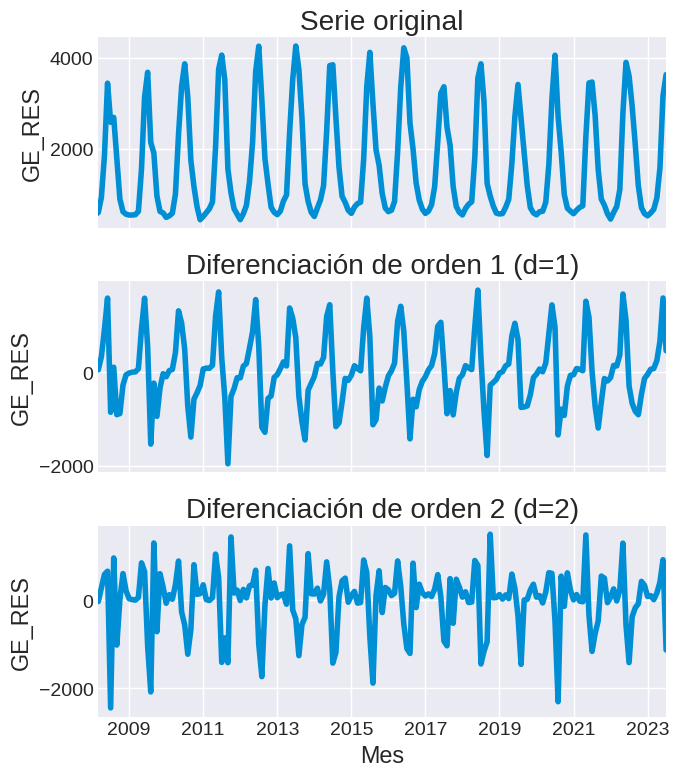

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [ ]:
# Test de estacionariedad usando df_aux2
warnings.filterwarnings("ignore")

# Serie de gas residencial
datos = df_aux2['GE_RES']

# Primera y segunda diferencia
datos_diff_1 = df_aux2['GE_RES'].diff().dropna()
datos_diff_2 = datos_diff_1.diff().dropna()

print('Test de estacionariedad - Serie original')
print('-----------------------------------------')
adfuller_result = adfuller(df_aux2['GE_RES'])
kpss_result = kpss(df_aux2['GE_RES'], regression='c', nlags='auto')
print(f'ADF Statistic: {adfuller_result[0]:.4f}, p-value: {adfuller_result[1]:.4f}')
print(f'KPSS Statistic: {kpss_result[0]:.4f}, p-value: {kpss_result[1]:.4f}')

print('\nTest de estacionariedad - Diferenciación de orden 1 (d=1)')
print('---------------------------------------------------------')
adfuller_result = adfuller(datos_diff_1)
kpss_result = kpss(datos_diff_1, regression='c', nlags='auto')
print(f'ADF Statistic: {adfuller_result[0]:.4f}, p-value: {adfuller_result[1]:.4f}')
print(f'KPSS Statistic: {kpss_result[0]:.4f}, p-value: {kpss_result[1]:.4f}')

print('\nTest de estacionariedad - Diferenciación de orden 2 (d=2)')
print('---------------------------------------------------------')
adfuller_result = adfuller(datos_diff_2)
kpss_result = kpss(datos_diff_2, regression='c', nlags='auto')
print(f'ADF Statistic: {adfuller_result[0]:.4f}, p-value: {adfuller_result[1]:.4f}')
print(f'KPSS Statistic: {kpss_result[0]:.4f}, p-value: {kpss_result[1]:.4f}')

warnings.filterwarnings("default")

# Graficar series
fig, axs = plt.subplots(nrows=3, ncols=1, figsize=(7, 8), sharex=True)
df_aux2['GE_RES'].plot(ax=axs[0], title='Serie original', ylabel='GE_RES')
datos_diff_1.plot(ax=axs[1], title='Diferenciación de orden 1 (d=1)', ylabel='GE_RES')
datos_diff_2.plot(ax=axs[2], title='Diferenciación de orden 2 (d=2)', ylabel='GE_RES')
plt.tight_layout()
plt.show()


* ADF, HO= la serie no es estacionaria, para rechazar esta hipotesis p-value < 0.05 . SE RECHAZA, la serie es estacionaria.

* KPSS, HO= la serie es estacionaria, para rechazar esta hipotesis p-value < 0.05 . SE RECHAZA (es necesario diferenciar)

SERIE ORIGINAL

Para la serie original el p valor para ADF dio mayor a 0.05, entonces, la serie es NO estacionaria. Para KPSS el p valor dio menor a 0.05, entonces, se rechaza la HO, la serie PODRÍA ser estacionaria, es necesario diferenciar.

Diferenciación de orden 1 (d=1)

Para la serie diferenciada (de orden 1) el p valor para ADF dio menor a 0.05, entonces la serie es estacionaria. Para KPSS el valor p dio mayor a 0.05, entonces la serie es estacionaria (no es necesario volver a diferenciar).

Diferenciación de orden 2 (d=2)

(Aunque ya no era necesario volver a diferenciar)
Para la serie difereciada (de orden 2) el p valor para ADF dio menor a 0.05, la serie es estacionaria. Para KPSS, el valor p dio mayor a 0.05, entonces la serie es estacionaria.
Normalmente no es necesario sobre-diferenciar si con d=1 ya es estacionaria, porque puede inducir ruido y hacer que el modelo pierda capacidad de predicción a largo plazo.


CONCLUSIÓN: El p-value obtenido tras la primera diferenciación es estadísticamente significativo acorde al umbral ampliamente reconocido y aceptado de 0.05. Por lo tanto, la selección más adecuada para el parámetro en order=(p,d,q) de SARIMAX, será d=1.

Se repiten las mismas pruebas para gas total:

Test de estacionariedad - Serie original (GE_TOTAL)
---------------------------------------------------
ADF Statistic: -1.3744, p-value: 0.5945
KPSS Statistic: 0.4014, p-value: 0.0766

Test de estacionariedad - Diferenciación de orden 1 (d=1)
-----------------------------------------------------------
ADF Statistic: -4.8676, p-value: 0.0000
KPSS Statistic: 0.0879, p-value: 0.1000

Test de estacionariedad - Diferenciación de orden 2 (d=2)
-----------------------------------------------------------
ADF Statistic: -8.3434, p-value: 0.0000
KPSS Statistic: 0.1422, p-value: 0.1000


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


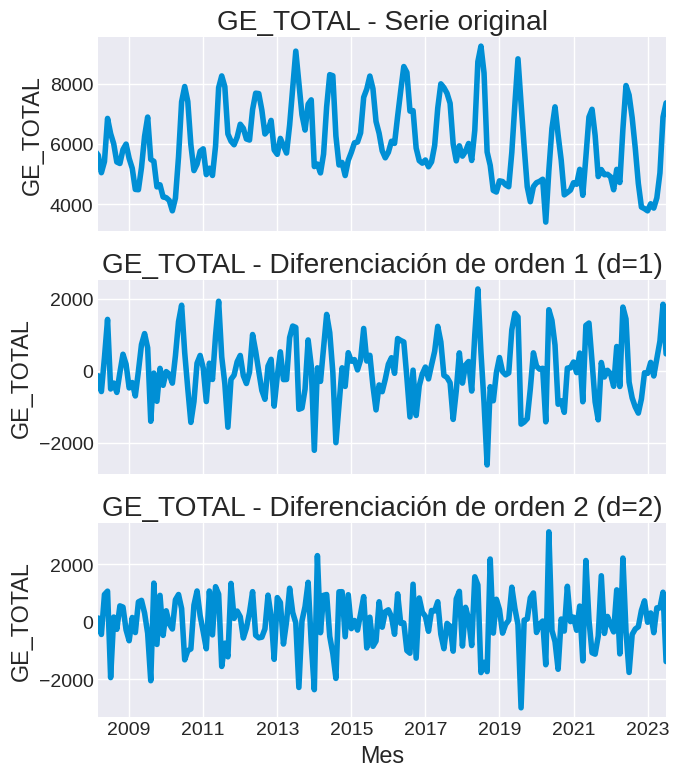

In [ ]:
# Test de estacionariedad usando df_aux2
warnings.filterwarnings("ignore")

# Serie de gas total
datos_total = df_aux2['GE_TOTAL']

# Primera y segunda diferencia
datos_total_diff_1 = datos_total.diff().dropna()
datos_total_diff_2 = datos_total_diff_1.diff().dropna()

print('Test de estacionariedad - Serie original (GE_TOTAL)')
print('---------------------------------------------------')
adfuller_result = adfuller(datos_total)
kpss_result = kpss(datos_total, regression='c', nlags='auto')
print(f'ADF Statistic: {adfuller_result[0]:.4f}, p-value: {adfuller_result[1]:.4f}')
print(f'KPSS Statistic: {kpss_result[0]:.4f}, p-value: {kpss_result[1]:.4f}')

print('\nTest de estacionariedad - Diferenciación de orden 1 (d=1)')
print('-----------------------------------------------------------')
adfuller_result = adfuller(datos_total_diff_1)
kpss_result = kpss(datos_total_diff_1, regression='c', nlags='auto')
print(f'ADF Statistic: {adfuller_result[0]:.4f}, p-value: {adfuller_result[1]:.4f}')
print(f'KPSS Statistic: {kpss_result[0]:.4f}, p-value: {kpss_result[1]:.4f}')

print('\nTest de estacionariedad - Diferenciación de orden 2 (d=2)')
print('-----------------------------------------------------------')
adfuller_result = adfuller(datos_total_diff_2)
kpss_result = kpss(datos_total_diff_2, regression='c', nlags='auto')
print(f'ADF Statistic: {adfuller_result[0]:.4f}, p-value: {adfuller_result[1]:.4f}')
print(f'KPSS Statistic: {kpss_result[0]:.4f}, p-value: {kpss_result[1]:.4f}')

warnings.filterwarnings("default")

# Graficar series
fig, axs = plt.subplots(nrows=3, ncols=1, figsize=(7, 8), sharex=True)

datos_total.plot(ax=axs[0], title='GE_TOTAL - Serie original', ylabel='GE_TOTAL')
datos_total_diff_1.plot(ax=axs[1], title='GE_TOTAL - Diferenciación de orden 1 (d=1)', ylabel='GE_TOTAL')
datos_total_diff_2.plot(ax=axs[2], title='GE_TOTAL - Diferenciación de orden 2 (d=2)', ylabel='GE_TOTAL')

plt.tight_layout()
plt.show()


# Gráficos de autocorrelación para determinar p y q

Autocorrelación

El gráfico de la función de autocorrelación (Autocorrelation Function ACF) y la función de autocorrelación parcial (Partial Autocorrelation Function (PACF)) de la serie temporal proporciona información útil sobre los posibles valores adecuados de  p y  q. La ACF ayuda a identificar el valor de  q (retardos en la parte de media móvil), mientras que la PACF ayuda a identificar el valor de  p
(retardos en la parte autorregresiva).


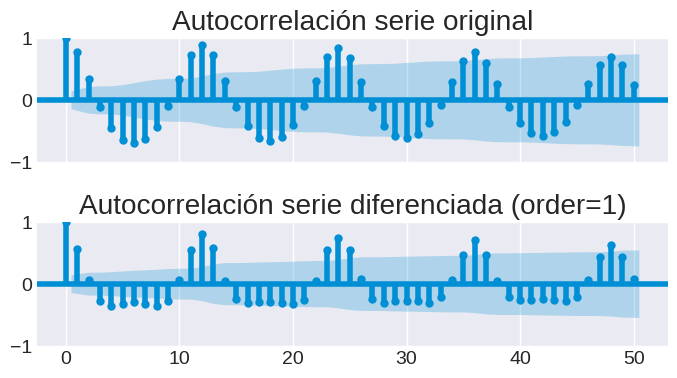

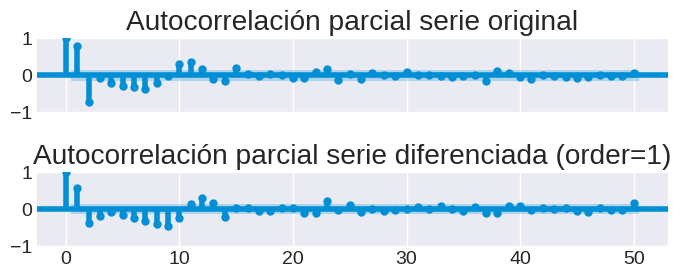

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [ ]:
# Gráfico de autocorrelación para la serie original y la serie diferenciada
# ==============================================================================
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(7, 4), sharex=True)
plot_acf(datos, ax=axs[0], lags=50)
axs[0].set_title('Autocorrelación serie original')
plot_acf(datos_diff_1, ax=axs[1], lags=50)
axs[1].set_title('Autocorrelación serie diferenciada (order=1)')
plt.tight_layout()
plt.show()

# Gráfico de autocorrelación parcial para la serie original y la serie diferenciada
# ==============================================================================
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(7, 3), sharex=True)
plot_pacf(datos, ax=axs[0], lags=50, method='ywm')
axs[0].set_title('Autocorrelación parcial serie original')
plot_pacf(datos_diff_1, ax=axs[1], lags=50, method='ywm')
axs[1].set_title('Autocorrelación parcial serie diferenciada (order=1)')
plt.tight_layout()
plt.show()


#Cambios que hice:

#Eliminé alpha=0.05 que define el nivel de confianza del intervalo de las líneas azules que aparecen en el gráfico (95% de confianza), pero en las versiones nuevas de statsmodels ya viene por defecto este 0.05 (no es necesario, y a veces causa warnings según la versión de statsmodels)

#Agregué method='ywm' en plot_pacf() porque evita warnings del tipo “The default method will change in future versions”. "ywm" (Yule–Walker Modified) es un método estable y recomendado para series reales con posible ruido o valores faltantes.

#Agregué plt.show() para asegurar que los gráficos se muestren bien en Colab y no se mezclen o corten.

In [ ]:
# Grafico de autocorrelación para la serie original y la serie diferenciada
# ==============================================================================
#fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(7, 4), sharex=True)
#plot_acf(datos, ax=axs[0], lags=50, alpha=0.05)
#axs[0].set_title('Autocorrelación serie original')
#plot_acf(datos_diff_1, ax=axs[1], lags=50, alpha=0.05)
#axs[1].set_title('Autocorrelación serie diferenciada (order=1)');

In [ ]:
# Autocorrelación parcial para la serie original y la serie diferenciada
# ==============================================================================
#fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(7, 3), sharex=True)
#plot_pacf(datos, ax=axs[0], lags=50, alpha=0.05)
#axs[0].set_title('Autocorrelación parcial serie original')
#plot_pacf(datos_diff_1, ax=axs[1], lags=50, alpha=0.05)
#axs[1].set_title('Autoorrelación parcial serie diferenciada (order=1)');
#plt.tight_layout();

El retardo en el que cae la ACF (función de autocorrelación) proporciona una estimación del valor de q.

El desfase en el que se corta el PACF (función de autocorrelación parcial) da una idea del valor de p.


Interpretación (chequear):
d = 1  porque la serie necesitó una sola diferenciación para estacionarizarse.

q = 1  ya que el ACF (abajo) tiene un pico significativo en el lag 1 y después decae.

p=1 De la PACF, lag 1 es significativo

s = 12 (mensual).

D = 1  porque la estacionalidad es clara y suele necesitar una diferenciación estacional.

P = 1, Q = 1  porque hay picos visibles cerca del lag 12, lo que indica un componente autorregresivo y de media móvil estacional.

MODELO RECOMENDADO:
(1,1,1)(1,1,1,12)


Ahora para GE_TOTAL:

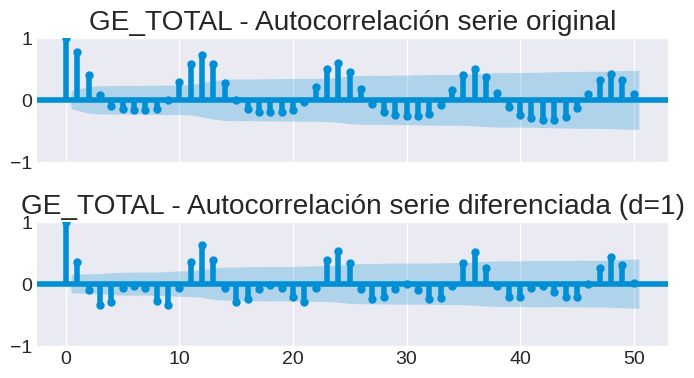

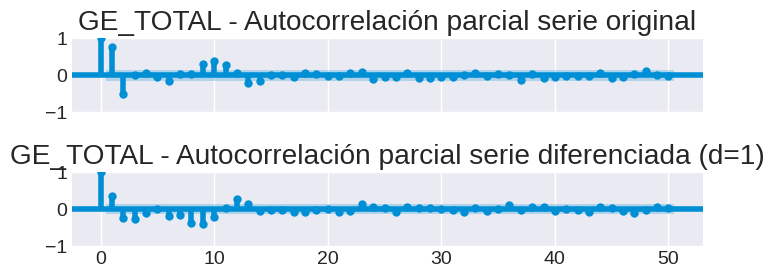

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [ ]:
# Gráfico de autocorrelación para GE_TOTAL (serie original y diferenciada)
# ==============================================================================
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(7, 4), sharex=True)

plot_acf(datos_total, ax=axs[0], lags=50)
axs[0].set_title('GE_TOTAL - Autocorrelación serie original')

plot_acf(datos_total_diff_1, ax=axs[1], lags=50)
axs[1].set_title('GE_TOTAL - Autocorrelación serie diferenciada (d=1)')

plt.tight_layout()
plt.show()


# Gráfico de autocorrelación parcial para GE_TOTAL
# ==============================================================================
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(7, 3), sharex=True)

plot_pacf(datos_total, ax=axs[0], lags=50, method='ywm')
axs[0].set_title('GE_TOTAL - Autocorrelación parcial serie original')

plot_pacf(datos_total_diff_1, ax=axs[1], lags=50, method='ywm')
axs[1].set_title('GE_TOTAL - Autocorrelación parcial serie diferenciada (d=1)')

plt.tight_layout()
plt.show()


# Descomposición de series temporales


Descomposición de la serie original y diferenciada

Útil para análisis exploratorio, no es esencial.

La descomposición de series temporales consiste en descomponer la serie temporal original en sus componentes fundamentales: la tendencia, la estacionalidad y los residuos.

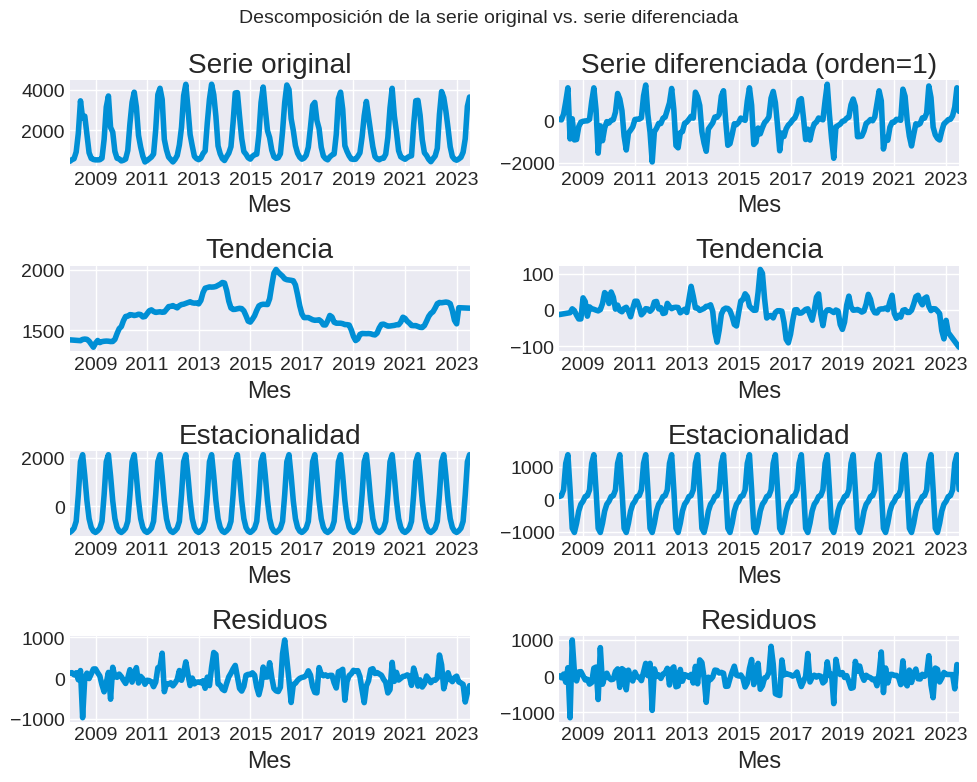

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [ ]:
# Descomposición de la serie original y la serie diferenciada
# ==============================================================================
from statsmodels.tsa.seasonal import seasonal_decompose

# Descomposición (model='additive' o 'multiplicative' según la serie)
res_decompose = seasonal_decompose(datos, model='additive', extrapolate_trend='freq')
res_decompose_diff_1 = seasonal_decompose(datos_diff_1, model='additive', extrapolate_trend='freq')

# Gráficos comparativos
fig, axs = plt.subplots(nrows=4, ncols=2, figsize=(10, 8), sharex=False)

# Serie original
res_decompose.observed.plot(ax=axs[0, 0])
axs[0, 0].set_title('Serie original')
res_decompose.trend.plot(ax=axs[1, 0])
axs[1, 0].set_title('Tendencia')
res_decompose.seasonal.plot(ax=axs[2, 0])
axs[2, 0].set_title('Estacionalidad')
res_decompose.resid.plot(ax=axs[3, 0])
axs[3, 0].set_title('Residuos')

# Serie diferenciada
res_decompose_diff_1.observed.plot(ax=axs[0, 1])
axs[0, 1].set_title('Serie diferenciada (orden=1)')
res_decompose_diff_1.trend.plot(ax=axs[1, 1])
axs[1, 1].set_title('Tendencia')
res_decompose_diff_1.seasonal.plot(ax=axs[2, 1])
axs[2, 1].set_title('Estacionalidad')
res_decompose_diff_1.resid.plot(ax=axs[3, 1])
axs[3, 1].set_title('Residuos')

fig.suptitle('Descomposición de la serie original vs. serie diferenciada', fontsize=14)
plt.tight_layout()
plt.show()


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


A continuación se toma la serie y se aplica dos tipos de diferencias al mismo tiempo:

1- Una diferencia normal (.diff()), que elimina la tendencia.

2- Una diferencia estacional de 12 períodos (.diff(12)), que elimina el patrón anual (porque los datos son mensuales).

El resultado (datos_diff_1_12) es una serie que ya no tiene ni tendencia ni estacionalidad, ideal para un modelo SARIMA o SARIMAX.

Después se corren los test ADF y KPSS para verificar si esa serie resultante es estacionaria.
Si ambos test dan estacionariedad, y eso indica que el modelo debe usar parámetros (d=1, D=1, s=12).

En resumen: Esta celda sirve para justificar los valores de d y D en el modelo SARIMAX.

ACLARACIÓN: Cuando se habla de la serie diferenciada combinada (diff() + diff(12)):

Esa serie ya no tiene tendencia ni estacionalidad, por eso es estacionaria.

Pero eso no significa que se elimina la tendencia y estacionalidad en el modelo.

Más bien, la serie dice qué parámetros usar en SARIMAX:

*   d: Diferenciación no estacional (tendencia)
*   D: Diferenciación estacional
*   s: Periodo estacional (12 meses si es mensual)

Entonces, si la serie combinada (1,12) es estacionaria, significa que:

d = 1 → se necesita una diferencia para eliminar la tendencia.

D = 1, s = 12 → se necesita una diferencia estacional de 12 períodos para eliminar la estacionalidad.





In [ ]:
# Diferenciación de orden 1 + estacional (12 meses)
# ==============================================================================
datos_diff_1_12 = datos.diff().diff(12).dropna()

warnings.filterwarnings("ignore")
adf_result = adfuller(datos_diff_1_12)
print(f'ADF Statistic: {adf_result[0]:.4f}, p-value: {adf_result[1]:.4f}')
kpss_result = kpss(datos_diff_1_12, regression='c')
print(f'KPSS Statistic: {kpss_result[0]:.4f}, p-value: {kpss_result[1]:.4f}')
warnings.filterwarnings("default")


ADF Statistic: -5.2029, p-value: 0.0000
KPSS Statistic: 0.2267, p-value: 0.1000


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [ ]:
# Diferenciaciación de orden 1 combinada con diferenciación estacional
# ==============================================================================
#datos_diff_1_12 = datos_train.diff().diff(12).dropna()

#warnings.filterwarnings("ignore")
#adfuller_result = adfuller(datos_diff_1_12)
#print(f'ADF Statistic: {adfuller_result[0]}, p-value: {adfuller_result[1]}')
#kpss_result = kpss(datos_diff_1_12)
#print(f'KPSS Statistic: {kpss_result[0]}, p-value: {kpss_result[1]}')
#warnings.filterwarnings("default")

Análisis adaptado a la serie de gas total:


--- GE_TOTAL: Test de estacionariedad (serie original) ---
ADF: 0.5945 | KPSS: 0.0766

--- GE_TOTAL: Test de estacionariedad (d=1) ---
ADF: 0.0000 | KPSS: 0.1000


/tmp/ipython-input-3317740706.py:14: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_result = kpss(datos_total_diff_1, regression='c', nlags='auto')
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


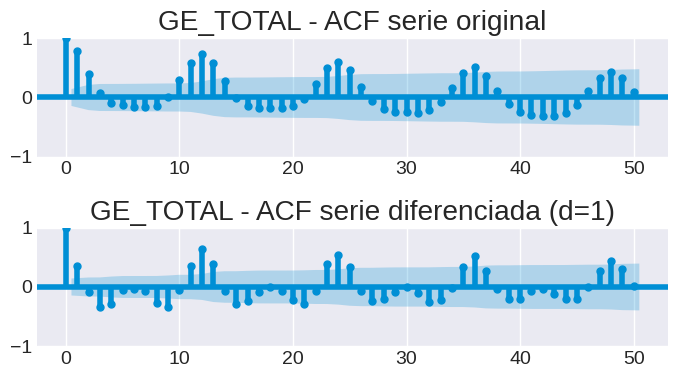

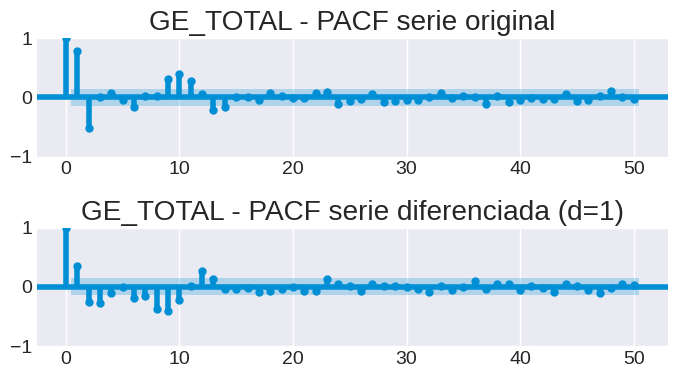

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [ ]:
# Serie de gas total
datos_total = df_aux2['GE_TOTAL']

# Diferencias
datos_total_diff_1 = datos_total.diff().dropna()

print('--- GE_TOTAL: Test de estacionariedad (serie original) ---')
adfuller_result = adfuller(datos_total)
kpss_result = kpss(datos_total, regression='c', nlags='auto')
print(f'ADF: {adfuller_result[1]:.4f} | KPSS: {kpss_result[1]:.4f}')

print('\n--- GE_TOTAL: Test de estacionariedad (d=1) ---')
adfuller_result = adfuller(datos_total_diff_1)
kpss_result = kpss(datos_total_diff_1, regression='c', nlags='auto')
print(f'ADF: {adfuller_result[1]:.4f} | KPSS: {kpss_result[1]:.4f}')

# Gráficos ACF y PACF
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(7, 4))
plot_acf(datos_total, ax=axs[0], lags=50)
axs[0].set_title('GE_TOTAL - ACF serie original')
plot_acf(datos_total_diff_1, ax=axs[1], lags=50)
axs[1].set_title('GE_TOTAL - ACF serie diferenciada (d=1)')
plt.tight_layout()
plt.show()

fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(7, 4))
plot_pacf(datos_total, ax=axs[0], lags=50, method='ywm')
axs[0].set_title('GE_TOTAL - PACF serie original')
plot_pacf(datos_total_diff_1, ax=axs[1], lags=50, method='ywm')
axs[1].set_title('GE_TOTAL - PACF serie diferenciada (d=1)')
plt.tight_layout()
plt.show()


# MODELO ARIMA-SARIMAX

Se va a entrenar un modelo ARIMA-SARIMAX para después predecir datos futuros utilizando tres librerías.

STATSMODELS

In [ ]:
# Modelo SARIMAX con statsmodels
# ==============================================================================
#warnings.filterwarnings("ignore", category=UserWarning, message='Non-invertible|Non-stationary')
#modelo = SARIMAX(endog = var_entrenamiento, order = (1, 1, 1), seasonal_order = (1, 1, 1, 12))
#modelo_res = modelo.fit(disp=0)
#warnings.filterwarnings("default")
#modelo_res.summary()

In [ ]:
# Modelo SARIMAX con statsmodels
#warnings.filterwarnings("ignore", category=UserWarning)
#modelo = SARIMAX(
    #endog=var_entrenamiento,
    #order=(1,1,1),
    #seasonal_order=(1,1,1,12),
    #enforce_stationarity=False,
    #enforce_invertibility=False
#)
#modelo_res = modelo.fit(disp=False)
#warnings.filterwarnings("default")

In [ ]:
# ===========================================================
# 🧠 Ajuste del modelo SARIMAX
# ===========================================================
warnings.filterwarnings("ignore", category=UserWarning)

modelo = SARIMAX(
    endog=var_entrenamiento,
    order=(1, 1, 1),
    seasonal_order=(1, 1, 1, 12),
    enforce_stationarity=False,
    enforce_invertibility=False
)

modelo_res = modelo.fit(disp=False)
warnings.filterwarnings("default")

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


order=(p,d,q) *parámetros no estacionales.*

seasonal_order=(P,D,Q,s)  *parámetros estacionales, con s=12 si es mensual.*

disp=0 suprime la salida durante el fitting (es para que statsmodels que no muestre todo el texto que imprime durante el ajuste (solo devuelva el resultado final)). Pero para versiones nuevas de statmodels es mejor usar disp=False y agregar enforce_stationarity=False, enforce_invertibility=False al modelo para evitar que intente forzar condiciones que generen warnings.

El resumen del modelo muestra mucha información sobre el proceso de ajuste:

-Estadísticas de Ajuste del Modelo: Esta parte incluye varias estadísticas que ayudan a evaluar qué tan bien el modelo se ajusta a los datos observados:

 * Log-Likelihood (Logaritmo de la Verosimilitud): Una medida de qué tan bien el modelo explica los datos observados, donde valores más negativos indican un ajuste deficiente a los datos y valores más cercanos a cero indican un mejor ajuste.

 * AIC (Criterio de Información de Akaike): Una métrica de bondad de ajuste que equilibra el ajuste del modelo con su complejidad. Cuanto menor el valor de AIC mejor es el modelo.

 * BIC (Criterio de Información Bayesiano): Similar al AIC, pero penaliza más la complejidad del modelo. Al igual que con el AIC, valores más bajos de BIC indican un mejor ajuste.

 * HQIC (Criterio de Información de Hannan-Quinn): Otro criterio de selección de modelo, similar al AIC y al BIC.

-Coeficientes: Esta tabla lista los coeficientes estimados para los parámetros del modelo. Incluye tanto los parámetros autoregresivos (AR) como los parámetros de media móvil (MA), así como cualquier variable exógena si se incluyen en el modelo. También incluye los errores estándar asociados con los coeficientes estimados para indicar la incertidumbre de dichas estimaciones, sus p-values, que se utilizan para evaluar la significancia de cada coeficiente, y el intervalo de confianza del 95%.

-Diagnósticos del modelo: Esta sección proporciona información sobre los residuos. Las diferencias entre los valores observados (valores de entrenamiento) y los valores predichos por el modelo.

 * Prueba Ljung-Box: Una prueba de autocorrelación en los residuos.

 * Prueba de Jarque-Bera: Una prueba de normalidad de los residuos.

 * Asimetría y curtosis: Medidas de la forma de la distribución de los residuos.

In [ ]:
# Predicción
# ==============================================================================
#predicciones_statsmodels = modelo_res.get_forecast(steps=len(var_test)).predicted_mean
#predicciones_statsmodels.name = 'statsmodels'
#display(predicciones_statsmodels.head(4))
#display(predicciones_statsmodels.tail(4))

In [ ]:
# ===========================================================
# 📊 Predicción a 12 meses (horizonte del conjunto de prueba)
# ===========================================================
predicciones_statsmodels = (
    modelo_res
    .get_forecast(steps=len(var_test))
    .predicted_mean
)

predicciones_statsmodels.name = 'statsmodels'

display(predicciones_statsmodels.head(4))
display(predicciones_statsmodels.tail(4))


,statsmodels
2022-08-01,2786.322517
2022-09-01,1785.051167
2022-10-01,1081.860775
2022-11-01,744.231468


,statsmodels
2023-04-01,1025.085950
2023-05-01,2178.904130
2023-06-01,3512.021716
2023-07-01,3760.458112


SKFORECAST (se deja comentado por la incompatibilidad con numpy)

In [ ]:
# Modelo SARIMAX con skforecast
# ==============================================================================
#warnings.filterwarnings("ignore", category=UserWarning, message='Non-invertible|Non-stationary')
#warnings.filterwarnings("ignore", category=UserWarning)
#modelo = Sarimax(order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
#modelo.fit(y=var_entrenamiento)
#modelo.summary()
#warnings.filterwarnings("default")

In [ ]:
# Predicción
# ==============================================================================
#predicciones_skforecast = modelo.predict(steps=len(var_test))
#display(predicciones_skforecast.head(4))

PDMARIMA (se deja comentando porque no va a funcionar porque hay conflicto con numpy)

In [ ]:
# Modelo SARIMAX con pdmarima.Sarimax
# ==============================================================================
#modelo = ARIMA(order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
#modelo.fit(y=var_entrenamiento)
#modelo.summary()

In [ ]:
# Prediction
# ==============================================================================
#predicciones_pdmarima = modelo.predict(len(var_test))
#predicciones_pdmarima.name = 'predicciones_pdmarima'
#display(predicciones_pdmarima.head(4))

In [ ]:
# Plot predictions
# ==============================================================================
#fig, ax = plt.subplots(figsize=(8, 4))
#var_entrenamiento.plot(ax=ax, label='train')
#var_test.plot(ax=ax, label='test')
#predicciones_statsmodels.plot(ax=ax, label='statsmodels')
#predicciones_skforecast.columns = ['skforecast']
#predicciones_skforecast.plot(ax=ax, label='skforecast')
#predicciones_pdmarima.plot(ax=ax, label='pmdarima')
#ax.set_title('Predicciones con modelo SARIMAX')
#ax.legend();

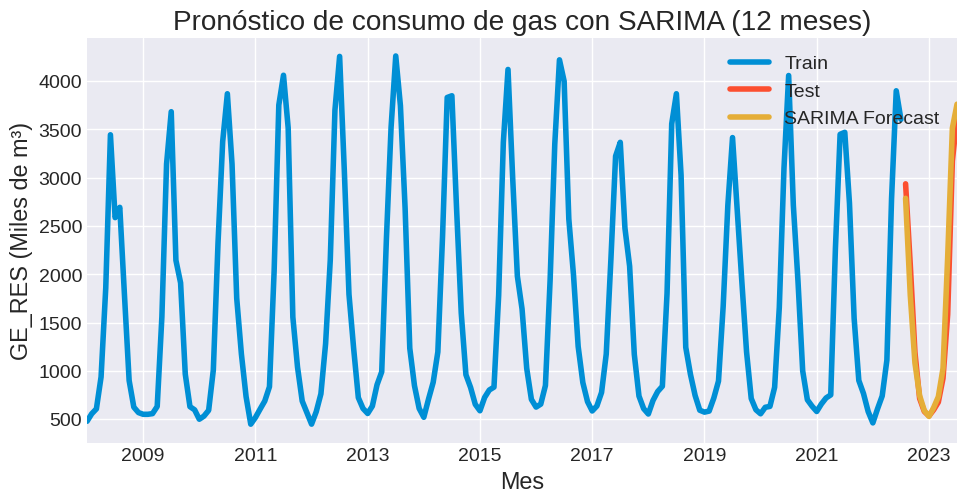

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [ ]:
# ===========================================================
# 📈 Visualización de resultados
# ===========================================================
fig, ax = plt.subplots(figsize=(10, 5))

var_entrenamiento.plot(ax=ax, label='Train')
var_test.plot(ax=ax, label='Test')
predicciones_statsmodels.plot(ax=ax, label='SARIMA Forecast')

ax.set_title('Pronóstico de consumo de gas con SARIMA (12 meses)')
ax.set_ylabel('GE_RES (Miles de m³)')
ax.legend()
plt.show()


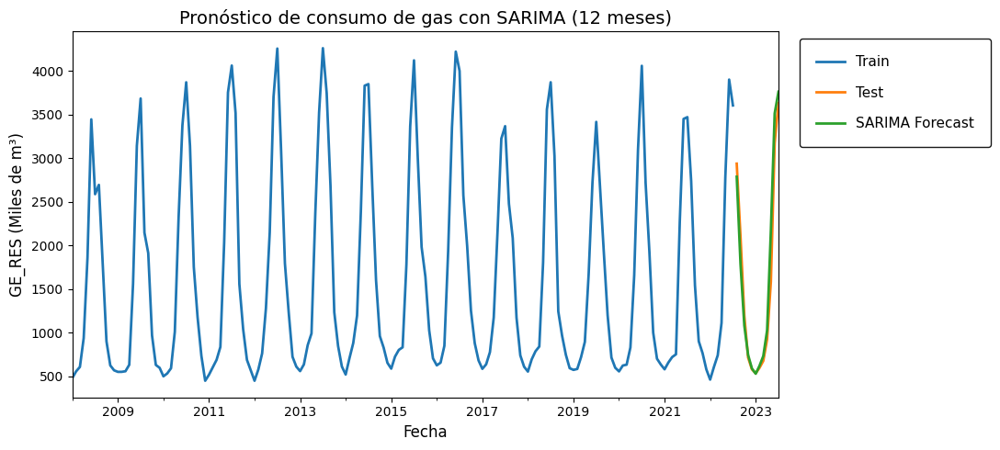

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [ ]:
# ===========================================================
# 📈 Visualización para informe
# ===========================================================
plt.style.use('default')  # Asegura estilo limpio

fig, ax = plt.subplots(figsize=(11, 5))

# Líneas más gruesas para informe
var_entrenamiento.plot(ax=ax, label='Train', linewidth=2)
var_test.plot(ax=ax, label='Test', linewidth=2)
predicciones_statsmodels.plot(ax=ax, label='SARIMA Forecast', linewidth=2)

# Títulos y ejes
ax.set_title('Pronóstico de consumo de gas con SARIMA (12 meses)', fontsize=14)
ax.set_ylabel('GE_RES (Miles de m³)', fontsize=12)
ax.set_xlabel('Fecha', fontsize=12)

# ✔️ Leyenda estética y separada
ax.legend(
    loc='upper left',
    bbox_to_anchor=(1.02, 1),   # La despega del gráfico
    frameon=True,
    framealpha=0.9,
    facecolor='white',
    edgecolor='black',
    borderpad=1.2,              # Espacio texto-borde
    labelspacing=1.2,           # Espacio entre líneas
    fontsize=11
)

plt.tight_layout()
plt.show()


Se repite para GE_TOTAL:

In [ ]:
# ===========================================================
# 📌 División de datos: entrenamiento = todo salvo últimos 12 meses (GE_TOTAL)
# ===========================================================
serie_total = df_aux2['GE_TOTAL'].dropna()

n_test = 12
var_entrenamiento = serie_total.iloc[:-n_test]
var_test = serie_total.iloc[-n_test:]

print("Entrenamiento:", var_entrenamiento.index.min(), "→", var_entrenamiento.index.max(),
      f"({len(var_entrenamiento)} registros)")
print("Prueba:", var_test.index.min(), "→", var_test.index.max(),
      f"({len(var_test)} registros)")


Entrenamiento: 2008-01-01 00:00:00 → 2022-07-01 00:00:00 (175 registros)
Prueba: 2022-08-01 00:00:00 → 2023-07-01 00:00:00 (12 registros)


,statsmodels_GE_TOTAL
2022-08-01,6702.704357
2022-09-01,5594.480282
2022-10-01,5143.147556
2022-11-01,4994.865597


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


,statsmodels_GE_TOTAL
2023-04-01,4783.285563
2023-05-01,6041.410829
2023-06-01,7348.494694
2023-07-01,7561.722396


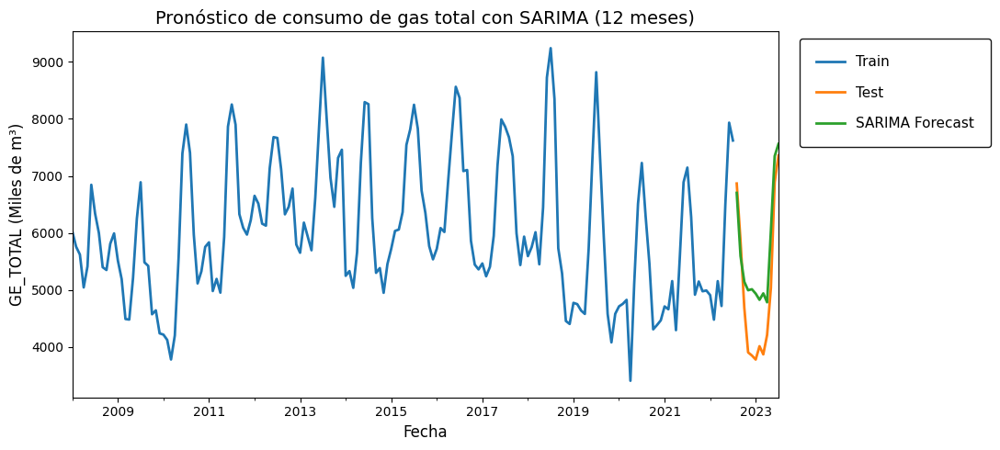

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [ ]:
# ===========================================================
# 🧠 Ajuste del modelo SARIMAX para GE_TOTAL
# ===========================================================
warnings.filterwarnings("ignore", category=UserWarning)

modelo_total = SARIMAX(
    endog=var_entrenamiento,        # GE_TOTAL en entrenamiento
    order=(1, 1, 1),
    seasonal_order=(1, 1, 1, 12),
    enforce_stationarity=False,
    enforce_invertibility=False
)

modelo_total_res = modelo_total.fit(disp=False)
warnings.filterwarnings("default")


# ===========================================================
# 📊 Predicción a 12 meses (horizonte del conjunto de prueba)
# ===========================================================
predicciones_total = (
    modelo_total_res
    .get_forecast(steps=len(var_test))
    .predicted_mean
)

predicciones_total.name = 'statsmodels_GE_TOTAL'

display(predicciones_total.head(4))
display(predicciones_total.tail(4))


# ===========================================================
# 📈 Visualización para informe — GE_TOTAL
# ===========================================================
plt.style.use('default')  # Asegura estilo limpio

fig, ax = plt.subplots(figsize=(11, 5))

# Líneas más gruesas para informe
var_entrenamiento.plot(ax=ax, label='Train', linewidth=2)
var_test.plot(ax=ax, label='Test', linewidth=2)
predicciones_total.plot(ax=ax, label='SARIMA Forecast', linewidth=2)

# Títulos y ejes
ax.set_title('Pronóstico de consumo de gas total con SARIMA (12 meses)', fontsize=14)
ax.set_ylabel('GE_TOTAL (Miles de m³)', fontsize=12)
ax.set_xlabel('Fecha', fontsize=12)

# ✔️ Leyenda estética y separada
ax.legend(
    loc='upper left',
    bbox_to_anchor=(1.02, 1),
    frameon=True,
    framealpha=0.9,
    facecolor='white',
    edgecolor='black',
    borderpad=1.2,
    labelspacing=1.2,
    fontsize=11
)

plt.tight_layout()
plt.show()


# ForecasterSarimax y backtesting con skforecaster

ForecasterSarimax (trae problemas de compatibilidad)

Entrenamiento - Predicción


In [ ]:
# Modelo ARIMA con ForecasterSarimax y skforecast Sarimax
# ==============================================================================
#forecaster = ForecasterSarimax(
                 #regressor=Sarimax(order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
             #)
#forecaster.fit(y=var_entrenamiento, suppress_warnings=True)



In [ ]:
#print(len(var_entrenamiento))
#print(len(var_test))


In [ ]:
# Predicción
#predicciones = forecaster.predict(steps=len(var_test))
#predicciones.head(4)

Backtesting



In [ ]:
# Backtest forecaster
# ==============================================================================
#forecaster = ForecasterSarimax(
                 #regressor=Sarimax(
                                #order=(1, 1, 1),
                                #seasonal_order=(1, 1, 1, 12),
                                #maxiter=200
                           # )
             #)

#metrica, predicciones = backtesting_sarimax(
                            #forecaster            = forecaster,
                            #y                     = df_gas_prov['GE_RES'],
                            #initial_train_size    = len(var_entrenamiento),
                            #fixed_train_size      = False,
                            #steps                 = 12,
                            #metric                = 'mean_absolute_error',
                            #refit                 = True,
                            #n_jobs                = "auto",
                            #suppress_warnings_fit = True,
                            #verbose               = True,
                            #show_progress         = True
                       # )

#print(f"Metrica (mean absolute error): {metrica}")
#display(predicciones.head(4))

In [ ]:
# Gráfico predicciones de backtesting
#fig, ax = plt.subplots(figsize=(6, 3))
#var_test.plot(ax=ax, label='test')
#predicciones.plot(ax=ax)
#ax.set_title('Predicciones de backtesting con un modelo SARIMAX')
#ax.legend();

# **Búsqueda de los hiperparámetros P, D y Q**

Hay dos enfoques ampliamente utilizados:

* Criterios estadísticos: Las métricas de criterios de información, como el Criterio de Información de Akaike (AIC) o el Criterio de Información Bayesiano (BIC), utilizan diferentes penalizaciones sobre la estimación de máxima verosimilitud del modelo como medida de la bondad de ajuste. La ventaja de utilizar estas métricas es que se calculan únicamente con los datos de entrenamiento, lo que elimina la necesidad de realizar predicciones sobre nuevos datos. Como resultado, el proceso de optimización se acelera considerablemente. El conocido algoritmo Auto Arima utiliza este enfoque.

(ACLARACIÓN: No se va a usar ARIMA porque la librería pdmarima no funciona con la versión que se puede usar actualmente con Python 3 y también hay problemas con skforecast)

* Técnicas de validación: El uso de técnicas de validación, especialmente el backtesting, es otra estrategia efectiva. El backtesting consiste en evaluar el rendimiento del modelo utilizando datos históricos para simular las condiciones del mundo real. Esto ayuda a validar la eficacia de los hiperparámetros en diferentes escenarios, proporcionando una evaluación práctica de su viabilidad.

(ACLARACIÓN: Tampoco se va a utilizar porque ForecasterSarimax tiene problemas de compatibilidad)

# Posible nueva DIVISIÓN DE LOS DATOS (train, test y validación)


In [ ]:
#Seleccionamos los datos para entrenar
# Vamos a utilizar el 40% de mi df
#from sklearn.model_selection import train_test_split
# División 60% para entrenamiento y 40% para validación + prueba
#datos_entrenamiento, datos_temp = train_test_split(df_aux2, test_size=0.39, shuffle=False, random_state=42)
# División 50% de datos temporales para validación y 50% para prueba
#datos_validacion, datos_test = train_test_split(datos_temp, test_size=0.5, shuffle=False,  random_state=42)

#print (
    #f"Fechas entrenamiento : {datos_entrenamiento.index.min()} --- {datos_entrenamiento.index.max()}  "
    #f"(n={len(datos_entrenamiento)})")
#print(
    #f"Fechas validacion    : {datos_validacion.index.min()} --- {datos_validacion.index.max()}  "
    #f"(n={len(datos_validacion)})"
#)
#print(
    #f"Fechas test          : {datos_test.index.min()} --- {datos_test.index.max()}  "
    #f"(n={len(datos_test)})"
#)

In [ ]:
#Gráfico de la división de los datos en 3 partes
#fig, ax = plt.subplots(figsize=(7, 3))
#datos_entrenamiento['GE_RES'].plot(ax=ax, label = 'train')
#datos_validacion['GE_RES'].plot(ax=ax, label = 'validacion')
#datos_test['GE_RES'].plot(ax=ax, label = 'test' )
#ax.set_title('GAS ENTREGADO RESIDENCIAL - Córdoba')
#ax.legend();

In [ ]:
#datos_validacion.info()

In [ ]:
#datos_combinados = pd.concat([datos_entrenamiento['GE_RES'],datos_validacion['GE_RES']])
#datos_combinados.info()

In [ ]:
# Grid search basado en backtesting
# ==============================================================================
#forecaster = ForecasterSarimax(
                 #regressor=Sarimax(
                                #order=(1, 1, 1), # Placeholder replaced in the grid search
                                #maxiter=500
                            #)
             #)

#param_grid = {
    #'order': [(0, 1, 0), (0, 1, 1), (1, 1, 0), (1, 1, 1), (2, 1, 1)],
    #'seasonal_order': [(0, 0, 0, 0), (0, 1, 0, 12), (1, 1, 1, 12)],
    #'trend': [None, 'n', 'c']
#}

#resultados_grid = grid_search_sarimax(
                        #forecaster            = forecaster,
                        #y                     = datos_combinados,
                        #param_grid            = param_grid,
                        #steps                 = 12,
                        #refit                 = True,
                        #metric                = 'mean_absolute_error',
                        #initial_train_size    = len(var_entrenamiento),
                        #fixed_train_size      = False,
                        #return_best           = False,
                        #n_jobs                = 'auto',
                        #suppress_warnings_fit = True,
                        #verbose               = False,
                        #show_progress         = True
                   #)

#resultados_grid.head(5)

In [ ]:
# Auto arima: seleccion basada en AIC

#modelo = auto_arima(
            #y                 = datos_combinados,
            #start_p           = 0,
            #start_q           = 0,
            #max_p             = 3,
            #max_q             = 3,
            #seasonal          = True,
            #test              = 'adf',
            #m                 = 12, # periodicidad de la estacionalidad
            #d                 = None, # El algoritmo determina 'd'
            #D                 = None, # El algoritmo determina 'D'
            #trace             = True,
            #error_action      = 'ignore',
            #suppress_warnings = True,
            #stepwise          = True
        #)

In [ ]:
# Capture auto_arima trace in a pandas datosframe
# ==============================================================================
#buffer = StringIO()
#with contextlib.redirect_stdout(buffer):
    #auto_arima(
            #y                 =  datos_combinados,
            #start_p           = 0,
            #start_q           = 0,
            #max_p             = 3,
            #max_q             = 3,
            #seasonal          = True,
            #test              = 'adf',
            #m                 = 12, # periodicidad de la estacionalidad
            #d                 = None, # El algoritmo determina 'd'
            #D                 = None, # El algoritmo determina 'D'
            #trace             = True,
            #error_action      = 'ignore',
            #suppress_warnings = True,
            #stepwise          = True
        #)
#trace_autoarima = buffer.getvalue()
#pattern = r'ARIMA\((\d+),(\d+),(\d+)\)\((\d+),(\d+),(\d+)\)\[(\d+)\]\s+(intercept)?\s+:\s+AIC=([\d\.]+), Time=([\d\.]+) sec'
#matches = re.findall(pattern, trace_autoarima)
#results = pd.DataFrame(matches, columns=['p', 'd', 'q', 'P', 'D', 'Q', 'm', 'intercept', 'AIC', 'Time'])
#results['order'] = results[['p', 'd', 'q']].apply(lambda x: f"({x[0]},{x[1]},{x[2]})", axis=1)
#results['seasonal_order'] = results[['P', 'D', 'Q', 'm']].apply(lambda x: f"({x[0]},{x[1]},{x[2]},{x[3]})", axis=1)
#results = results[['order', 'seasonal_order', 'intercept', 'AIC', 'Time']]
#results.sort_values(by='AIC').reset_index(drop=True)

In [ ]:
# Predicciones de backtesting con el mejor modelo según el grid search
# ==============================================================================
#forecaster = ForecasterSarimax(
                 #regressor=Sarimax(order=(3, 1,0), seasonal_order=(1, 0, 1, 12), maxiter=500),
             #)

#metrica_m1, predicciones_m1 = backtesting_sarimax(
                                #forecaster            = forecaster,
                                #y                     = datos,
                                #initial_train_size    = len(datos_combinados),
                                #steps                 = 12,
                                #metric                = 'mean_absolute_error',
                                #refit                 = True,
                                #n_jobs                = "auto",
                                #suppress_warnings_fit = True,
                                #verbose               = False,
                                #show_progress         = True
                          #  )
# Predicciones de backtesting con el mejor modelo según auto arima
# ==============================================================================
#forecaster = ForecasterSarimax(
                 #regressor=Sarimax(order=(3, 1, 1), seasonal_order=(1, 0, 1, 12), maxiter=500),
           #  )

#metrica_m2, predicciones_m2 = backtesting_sarimax(
                                #forecaster            = forecaster,
                                #y                     = datos,
                                #initial_train_size    = len(datos_combinados),
                                #steps                 = 12,
                                #metric                = 'mean_absolute_error',
                                #refit                 = True,
                                #n_jobs                = "auto",
                                #suppress_warnings_fit = True,
                                #verbose               = False,
                                #show_progress         = True
                           # )

In [ ]:
#datos_test.info()

In [ ]:
# Comparación de métricas
# ==============================================================================
#print(f"Metrica (mean absolute error) del modelo grid search : {metrica_m1}")
#print(f"Metric (mean_absolute_error) del modelo auto arima   : {metrica_m2}")

#fig, ax = plt.subplots(figsize=(6, 3))
# Concatenar las series de validación y prueba

#datos_test['GAS_RES'].plot(ax=ax, label='test')

#predicciones_m1 = predicciones_m1.rename(columns={'pred': 'grid search'})
#predicciones_m2 = predicciones_m2.rename(columns={'pred': 'autoarima'})
#predicciones_m1.plot(ax=ax)
#predicciones_m2.plot(ax=ax)
#ax.set_title('Predicciones de backtesting con un modelo SARIMA')
#ax.legend();

Ese código me permite seleccionar los valores p,d,q,P,D,Q con base en el criterio de información AIC más bajo, el cual penaliza la complejidad del modelo.

# EMISIONES DE CO2 PARA GE_ RES CON PARÁMETROS BASE

,IPCC,EPA,ARG
2022-08-01,5572.645035,5433.328909,5489.055359
2022-09-01,3570.102335,3480.849776,3516.550800
2022-10-01,2163.721551,2109.628512,2131.265727
2022-11-01,1488.462937,1451.251363,1466.135993
2022-12-01,1179.400150,1149.915146,1161.709147


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


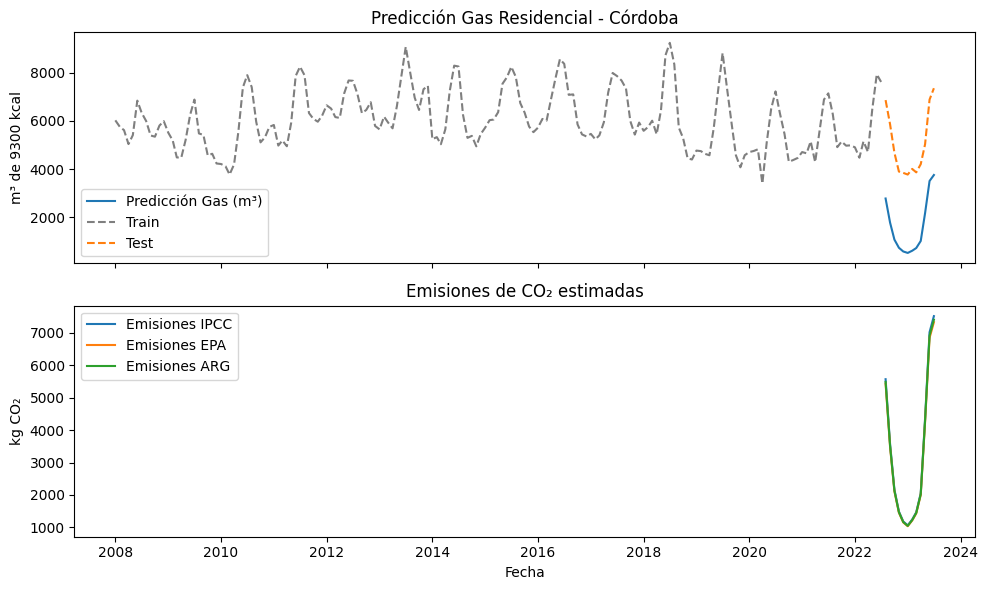

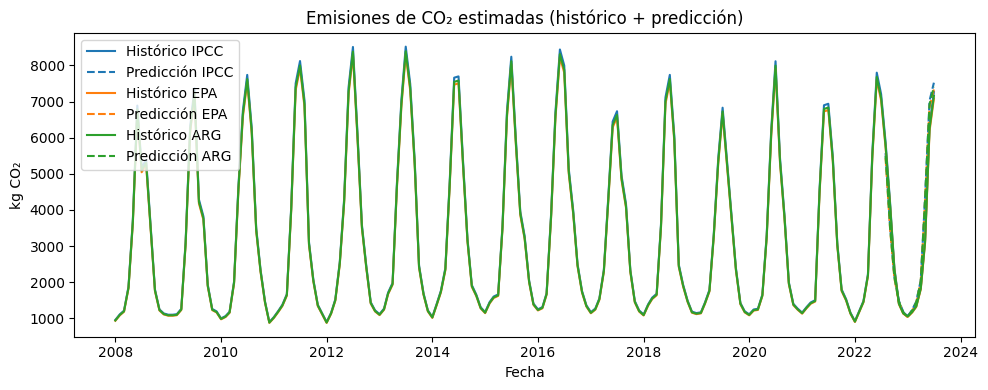

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [ ]:
# Factores de emisión (kg CO₂ por m³ de gas natural 9300 kcal)
factores_emision = {
    'IPCC': 2.0,
    'EPA': 1.95,
    'ARG': 1.97
}

# DataFrame para almacenar emisiones mensuales
emisiones_mensuales = pd.DataFrame(index=predicciones_statsmodels.index)

# Calcular emisiones usando cada factor
for nombre, factor in factores_emision.items():
    emisiones_mensuales[nombre] = predicciones_statsmodels * factor

# Mostrar primeras filas
display(emisiones_mensuales.head())

# Graficar predicciones y emisiones
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(10, 6), sharex=True)

# Predicciones de gas entregado
axs[0].plot(predicciones_statsmodels.index, predicciones_statsmodels, label='Predicción Gas (m³)', color='tab:blue')
axs[0].plot(var_entrenamiento.index, var_entrenamiento, label='Train', linestyle='--', color='tab:gray')
axs[0].plot(var_test.index, var_test, label='Test', linestyle='--', color='tab:orange')
axs[0].set_title('Predicción Gas Residencial - Córdoba')
axs[0].set_ylabel('m³ de 9300 kcal')
axs[0].legend()

# Emisiones estimadas de CO₂ según distintos factores
for nombre in factores_emision.keys():
    axs[1].plot(emisiones_mensuales.index, emisiones_mensuales[nombre], label=f'Emisiones {nombre}')
axs[1].set_title('Emisiones de CO₂ estimadas')
axs[1].set_ylabel('kg CO₂')
axs[1].set_xlabel('Fecha')
axs[1].legend()

plt.tight_layout()
plt.show()

# Emisiones históricas (sobre los datos reales)
emisiones_historicas = pd.DataFrame(index=df_aux2.index)
for nombre, factor in factores_emision.items():
    emisiones_historicas[nombre] = df_aux2['GE_RES'] * factor

# Concatenar histórico + predicciones
#emisiones_totales = pd.concat([emisiones_historicas, emisiones_mensuales])

# Colores asignados a cada factor de emisión
colores = {
    'IPCC': 'tab:blue',
    'EPA': 'tab:orange',
    'ARG': 'tab:green'
}

fig, ax = plt.subplots(figsize=(10,4))

for nombre in factores_emision.keys():
    # Histórico: línea sólida
    ax.plot(emisiones_historicas.index, emisiones_historicas[nombre],
            label=f'Histórico {nombre}', linestyle='-', color=colores[nombre])
    # Predicción: línea punteada
    ax.plot(emisiones_mensuales.index, emisiones_mensuales[nombre],
            label=f'Predicción {nombre}', linestyle='--', color=colores[nombre])

ax.set_title('Emisiones de CO₂ estimadas (histórico + predicción)')
ax.set_ylabel('kg CO₂')
ax.set_xlabel('Fecha')
ax.legend()
plt.tight_layout()
plt.show()




# Modelo SARIMAX con variables exógenas

1- Preparación de los datos exógenos (SMN)
2- Mejor modelo SARIMAX con variables exógenos
3- Cálculo de emisiones con factor de emisión
4- Gráfico de resultados


Recorte del rango de gas al rango de los datos del SMN para que coincidan y se pueda usar SARIMAX en el código próximo.

In [ ]:
print("Columnas disponibles en df_aux2:")
print(df_aux2.columns.tolist())
display(df_aux2.head())


Columnas disponibles en df_aux2:
['GE_TOTAL', 'US_TOTAL', 'GE_SDB', 'US_SDB', 'GE_RES', 'US_RES', 'GE_IND', 'US_IND', 'GE_GNC', 'US_GNC', 'GE_ENTES', 'US_ENTES', 'GE_COM', 'US_COM', 'GE_CEN', 'US_CENT', 'Time']


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


,GE_TOTAL,US_TOTAL,GE_SDB,US_SDB,GE_RES,US_RES,GE_IND,US_IND,GE_GNC,US_GNC,GE_ENTES,US_ENTES,GE_COM,US_COM,GE_CEN,US_CENT,Time
Mes,,,,,,,,,,,,,,,,,
2008-01-01,6027.709677,16255.741935,69.322581,0.451613,478.806452,15565.483871,1813.967742,23.612903,851.645161,6.838710,14.806452,64.741935,122.612903,594.387097,2676.548387,0.225806,0
2008-02-01,5758.793103,17449.724138,74.758621,0.482759,556.241379,16709.793103,1527.103448,26.241379,883.586207,7.310345,15.655172,68.931034,129.862069,636.689655,2571.586207,0.275862,1
2008-03-01,5620.806452,16381.129032,84.193548,0.451613,607.096774,15687.096774,1729.645161,25.387097,855.258065,6.838710,18.580645,64.419355,131.516129,596.677419,2194.516129,0.258065,2
2008-04-01,5043.766667,17008.466667,129.566667,0.466667,937.533333,16289.000000,1642.466667,26.200000,852.266667,7.133333,31.733333,66.733333,157.333333,618.700000,1292.866667,0.233333,3
2008-05-01,5413.161290,16544.838710,257.709677,0.451613,1859.032258,15843.516129,1619.000000,25.419355,855.354839,6.903226,60.032258,65.161290,219.483871,603.161290,542.548387,0.225806,4


In [ ]:
print("Primeras filas de df_aux2:")
print(df_aux2.head())

print("\nColumnas del DataFrame:")
print(df_aux2.columns)

print("\nÍndice del DataFrame:")
print(df_aux2.index)



Primeras filas de df_aux2:
               GE_TOTAL      US_TOTAL      GE_SDB    US_SDB       GE_RES  \
Mes                                                                        
2008-01-01  6027.709677  16255.741935   69.322581  0.451613   478.806452   
2008-02-01  5758.793103  17449.724138   74.758621  0.482759   556.241379   
2008-03-01  5620.806452  16381.129032   84.193548  0.451613   607.096774   
2008-04-01  5043.766667  17008.466667  129.566667  0.466667   937.533333   
2008-05-01  5413.161290  16544.838710  257.709677  0.451613  1859.032258   

                  US_RES       GE_IND     US_IND      GE_GNC    US_GNC  \
Mes                                                                      
2008-01-01  15565.483871  1813.967742  23.612903  851.645161  6.838710   
2008-02-01  16709.793103  1527.103448  26.241379  883.586207  7.310345   
2008-03-01  15687.096774  1729.645161  25.387097  855.258065  6.838710   
2008-04-01  16289.000000  1642.466667  26.200000  852.266667  7.133333

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [ ]:
import pandas as pd

# --- Cargar archivo ---
df_smn = pd.read_excel('/content/drive/MyDrive/PS/BASE_DATO/DF_SMN_LIMPIO_MENSUAL.xlsx')

# --- Asegurar tipos correctos ---
df_smn['MES_ANIO'] = pd.to_datetime(df_smn['MES_ANIO'], errors='coerce')
for col in ['TEMP', 'HUM', 'PNM', 'FF', 'DD']:
    df_smn[col] = pd.to_numeric(df_smn[col], errors='coerce')

# --- Quitar filas vacías ---
df_smn = df_smn.dropna(subset=['MES_ANIO', 'ESTACION'])

# --- Ordenar por estación y fecha ---
df_smn = df_smn.sort_values(['ESTACION', 'MES_ANIO'])

# --- Verificar estructura ---
print("✅ Estaciones en el dataset:", df_smn['ESTACION'].unique())
print("📅 Rango total:", df_smn['MES_ANIO'].min(), "→", df_smn['MES_ANIO'].max())
print("🔢 Total de filas:", len(df_smn))

# --- Crear un diccionario con un DataFrame por estación ---
df_estaciones = {
    estacion: g.set_index('MES_ANIO').asfreq('MS')
    for estacion, g in df_smn.groupby('ESTACION')
}

# --- Comprobar algunas ---
for e, df_e in list(df_estaciones.items())[:3]:
    print(f"\n📍 {e}: {df_e.shape[0]} meses ({df_e.index.min().date()} → {df_e.index.max().date()})")


✅ Estaciones en el dataset: ['CORDOBA AERO' 'CORDOBA OBSERVATO' 'ESCUELA DE AVIACI' 'LABOULAYE AERO'
 'MARCOS JUAREZ AER' 'PILAR OBSERVATORI' 'RIO CUARTO AERO'
 'VILLA DE MARIA DE' 'VILLA DOLORES AER']
📅 Rango total: 2018-01-01 00:00:00 → 2024-02-01 00:00:00
🔢 Total de filas: 603

📍 CORDOBA AERO: 74 meses (2018-01-01 → 2024-02-01)

📍 CORDOBA OBSERVATO: 74 meses (2018-01-01 → 2024-02-01)

📍 ESCUELA DE AVIACI: 53 meses (2019-10-01 → 2024-02-01)


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [ ]:
# --- Cantidad de meses por estación ---
resumen_meses = (
    df_smn.groupby('ESTACION')['MES_ANIO']
    .nunique()
    .reset_index(name='CANT_MESES')
    .sort_values('CANT_MESES')
)

print(resumen_meses)


            ESTACION  CANT_MESES
2  ESCUELA DE AVIACI          53
5  PILAR OBSERVATORI          53
7  VILLA DE MARIA DE          53
0       CORDOBA AERO          74
3     LABOULAYE AERO          74
1  CORDOBA OBSERVATO          74
4  MARCOS JUAREZ AER          74
6    RIO CUARTO AERO          74
8  VILLA DOLORES AER          74


# GE_RES

GE_RES Y VARIABLES EXÓGENAS DE A UNA  Y CON TODAS CON SARIMAX DE BASE (1,1,1)(1,1,1)12 CON MAE, RMSE, AIC Y BIC

Para cada estación:

Entrena uno por uno:

SARIMAX con TEMP

SARIMAX con HUM

SARIMAX con PNM

SARIMAX con FF

SARIMAX con DD (convertida a seno/coseno)

Luego entrena:

SARIMAX con todas las variables juntas

Todo usando únicamente:

order = (1,1,1)
seasonal_order = (1,1,1,12)


Al final se genera una tabla con todos los modelos, todas las estadísticas, tabla final ordenada para el informe



🏷️ Estación: CORDOBA AERO

📊 SARIMAX con una única exógena: TEMP


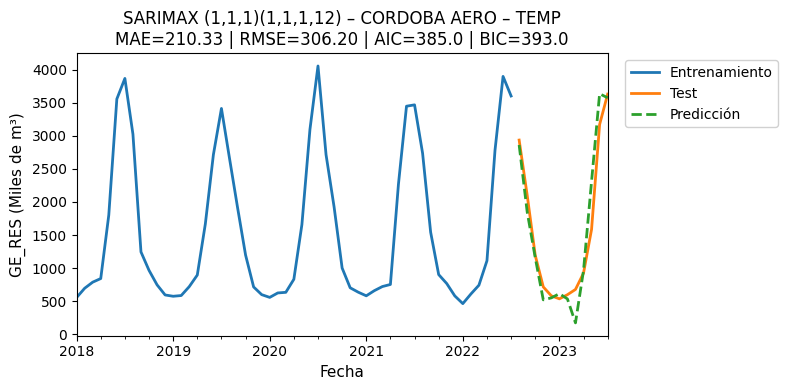

   ✓ Entrenado - MAE=210.334 - RMSE=306.196 - AIC=385.0 - BIC=393.0

📊 SARIMAX con una única exógena: HUM


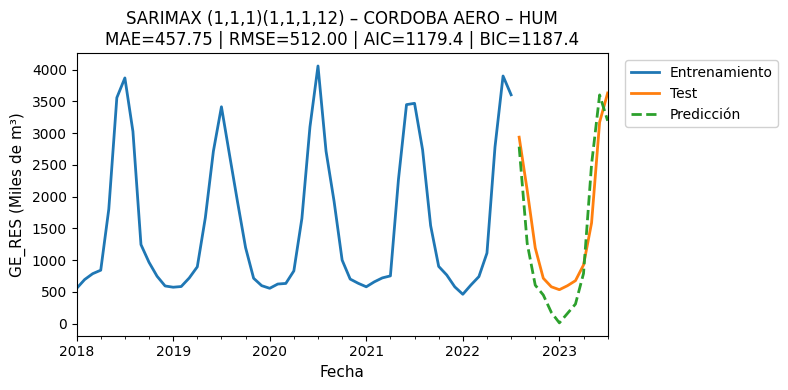

   ✓ Entrenado - MAE=457.750 - RMSE=511.998 - AIC=1179.4 - BIC=1187.4

📊 SARIMAX con una única exógena: PNM


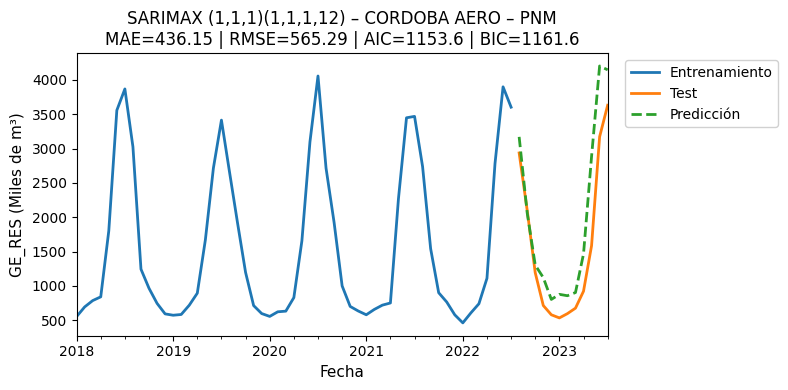

   ✓ Entrenado - MAE=436.149 - RMSE=565.290 - AIC=1153.6 - BIC=1161.6

📊 SARIMAX con una única exógena: FF


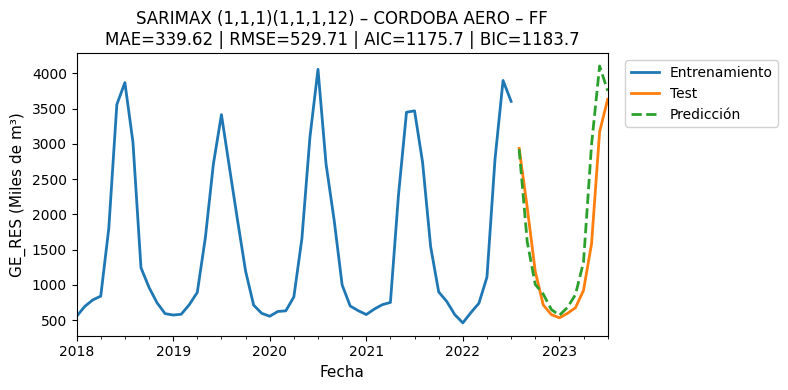

   ✓ Entrenado - MAE=339.621 - RMSE=529.707 - AIC=1175.7 - BIC=1183.7

📊 SARIMAX con una única exógena: DD


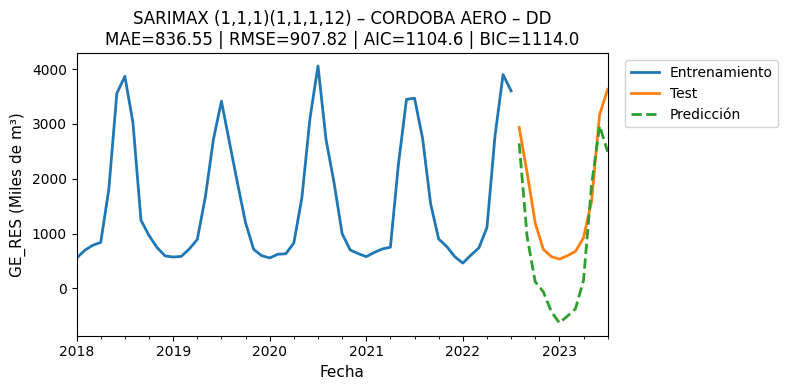

   ✓ Entrenado - MAE=836.547 - RMSE=907.818 - AIC=1104.6 - BIC=1114.0

🌡️ SARIMAX con TODAS LAS VARIABLES CLIMÁTICAS


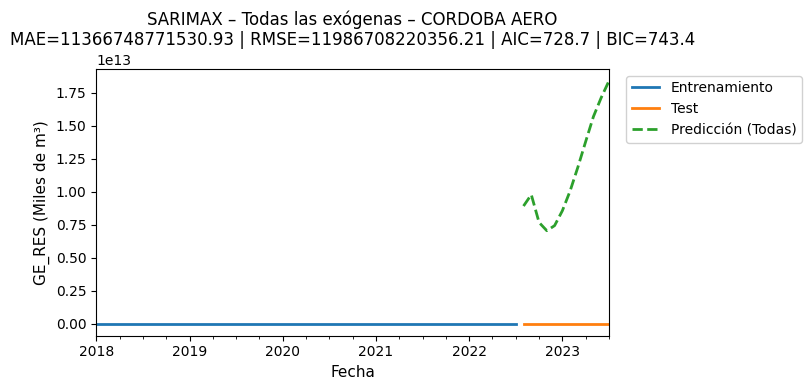

   ✓ Todas – MAE=11366748771530.930 - RMSE=11986708220356.213 - AIC=728.7 - BIC=743.4


🏷️ Estación: CORDOBA OBSERVATO

📊 SARIMAX con una única exógena: TEMP


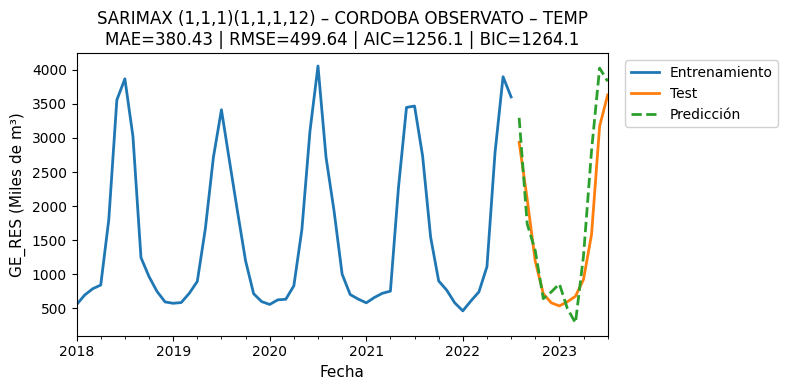

   ✓ Entrenado - MAE=380.433 - RMSE=499.642 - AIC=1256.1 - BIC=1264.1

📊 SARIMAX con una única exógena: HUM


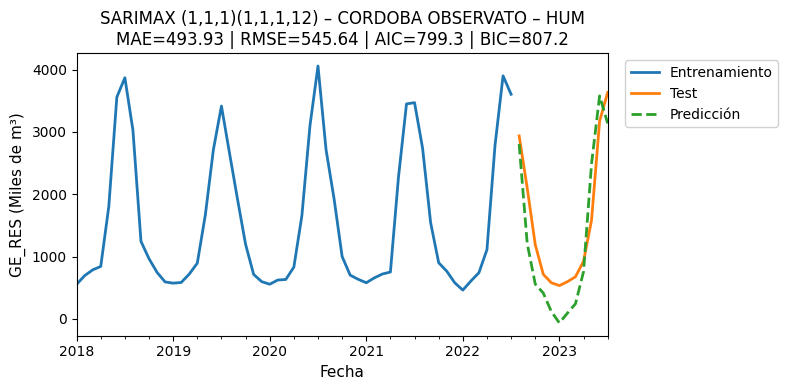

   ✓ Entrenado - MAE=493.926 - RMSE=545.642 - AIC=799.3 - BIC=807.2

📊 SARIMAX con una única exógena: PNM


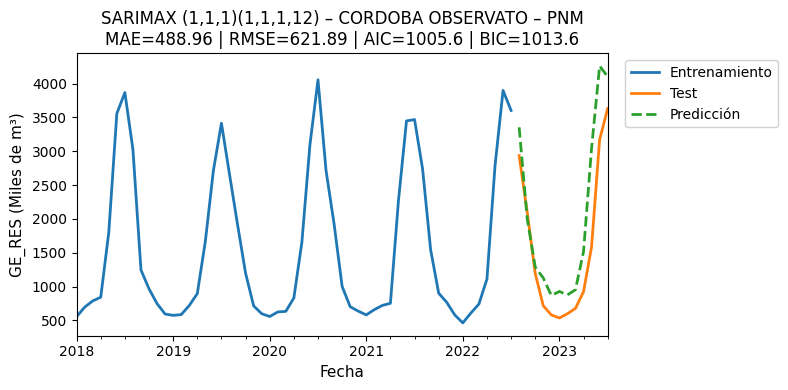

   ✓ Entrenado - MAE=488.961 - RMSE=621.891 - AIC=1005.6 - BIC=1013.6

📊 SARIMAX con una única exógena: FF


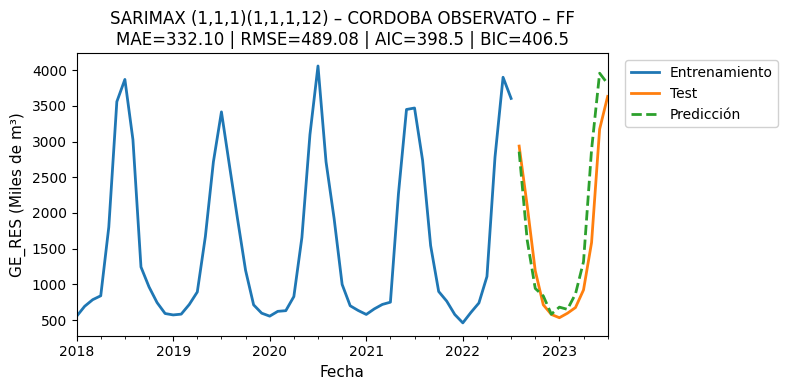

   ✓ Entrenado - MAE=332.101 - RMSE=489.084 - AIC=398.5 - BIC=406.5

📊 SARIMAX con una única exógena: DD


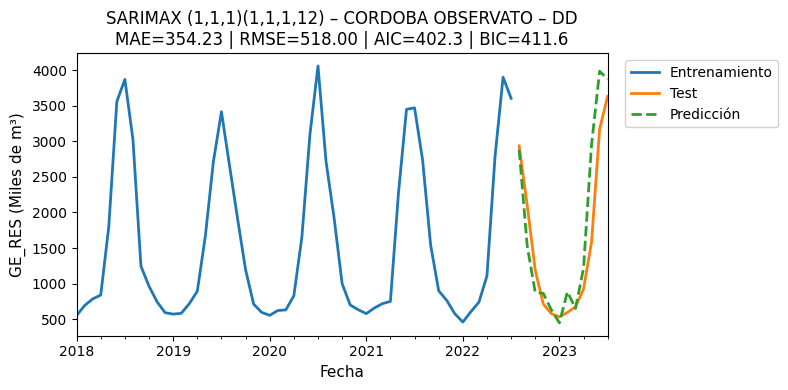

   ✓ Entrenado - MAE=354.234 - RMSE=518.002 - AIC=402.3 - BIC=411.6

🌡️ SARIMAX con TODAS LAS VARIABLES CLIMÁTICAS


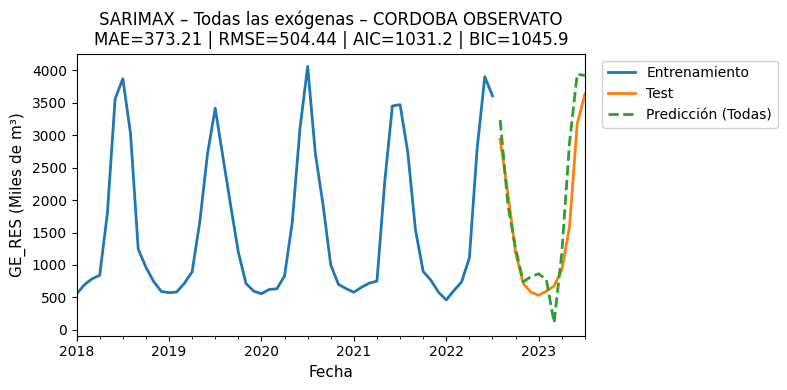

   ✓ Todas – MAE=373.214 - RMSE=504.441 - AIC=1031.2 - BIC=1045.9


🏷️ Estación: ESCUELA DE AVIACI
⚠️ ESCUELA DE AVIACI tiene pocos datos (46 meses).


🏷️ Estación: LABOULAYE AERO

📊 SARIMAX con una única exógena: TEMP


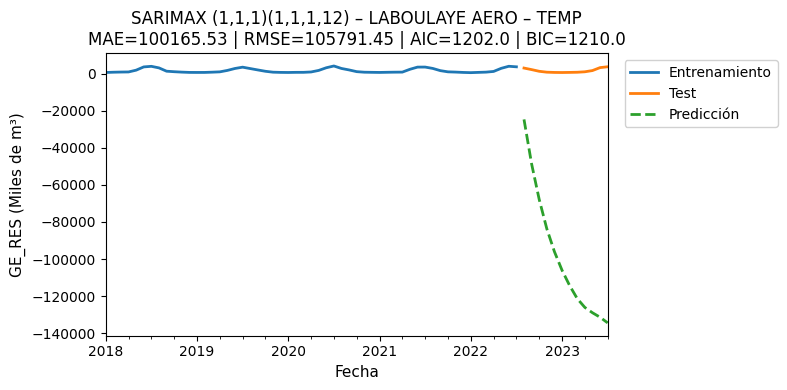

   ✓ Entrenado - MAE=100165.529 - RMSE=105791.452 - AIC=1202.0 - BIC=1210.0

📊 SARIMAX con una única exógena: HUM


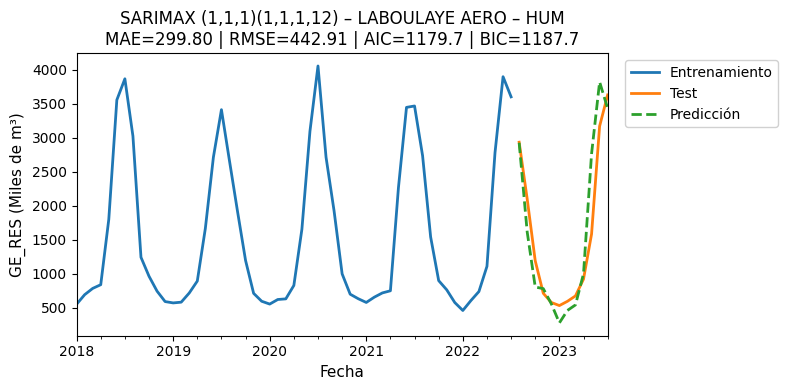

   ✓ Entrenado - MAE=299.803 - RMSE=442.909 - AIC=1179.7 - BIC=1187.7

📊 SARIMAX con una única exógena: PNM


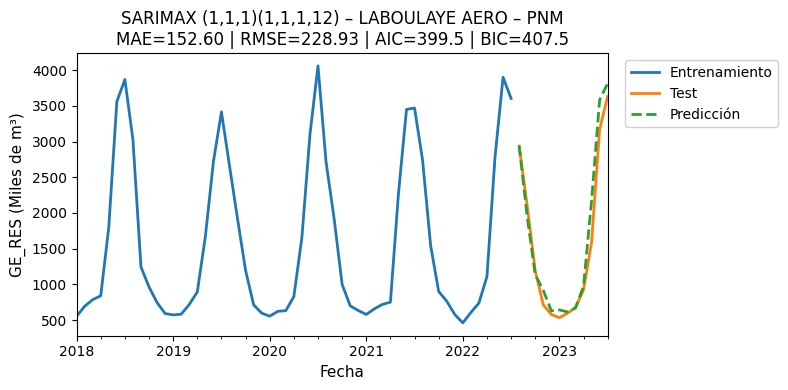

   ✓ Entrenado - MAE=152.603 - RMSE=228.929 - AIC=399.5 - BIC=407.5

📊 SARIMAX con una única exógena: FF


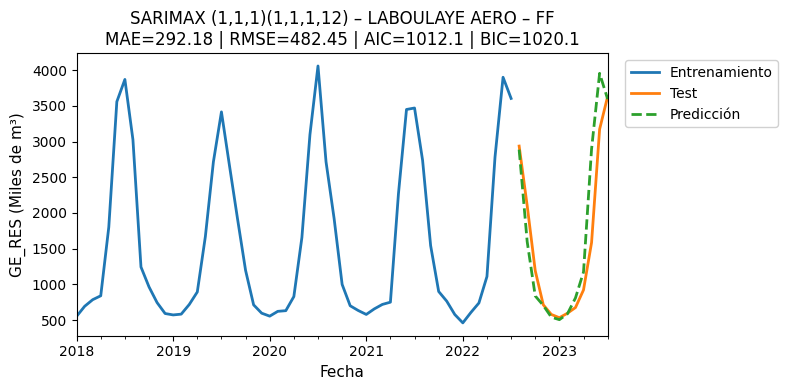

   ✓ Entrenado - MAE=292.181 - RMSE=482.447 - AIC=1012.1 - BIC=1020.1

📊 SARIMAX con una única exógena: DD


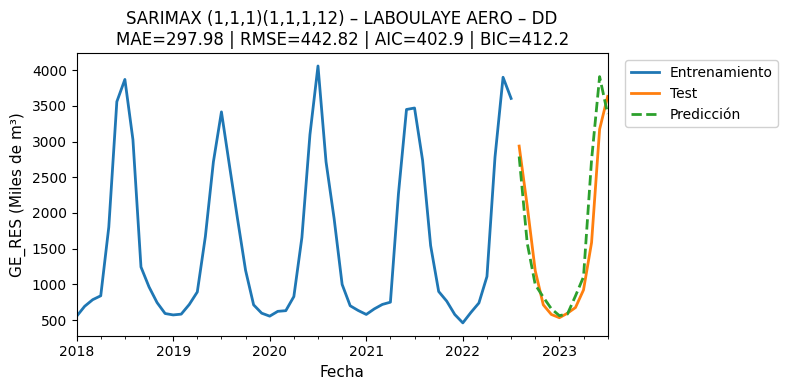

   ✓ Entrenado - MAE=297.977 - RMSE=442.823 - AIC=402.9 - BIC=412.2

🌡️ SARIMAX con TODAS LAS VARIABLES CLIMÁTICAS


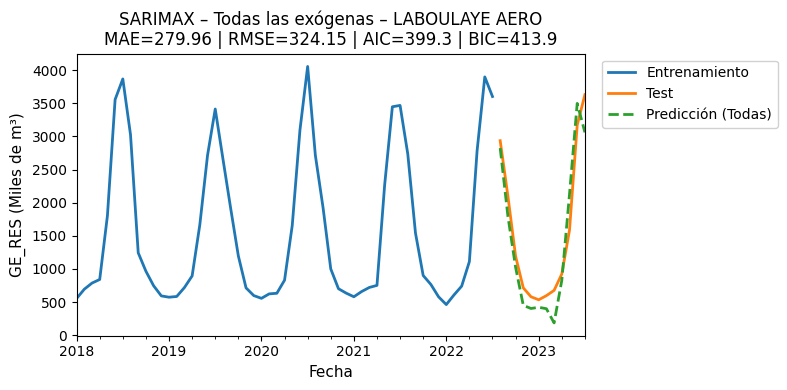

   ✓ Todas – MAE=279.961 - RMSE=324.150 - AIC=399.3 - BIC=413.9


🏷️ Estación: MARCOS JUAREZ AER

📊 SARIMAX con una única exógena: TEMP


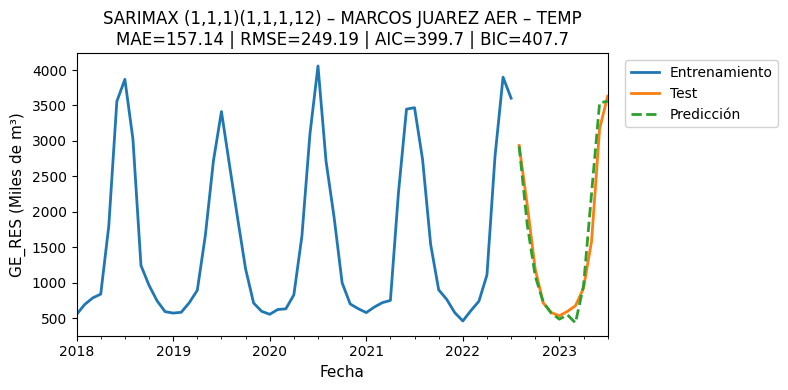

   ✓ Entrenado - MAE=157.144 - RMSE=249.189 - AIC=399.7 - BIC=407.7

📊 SARIMAX con una única exógena: HUM


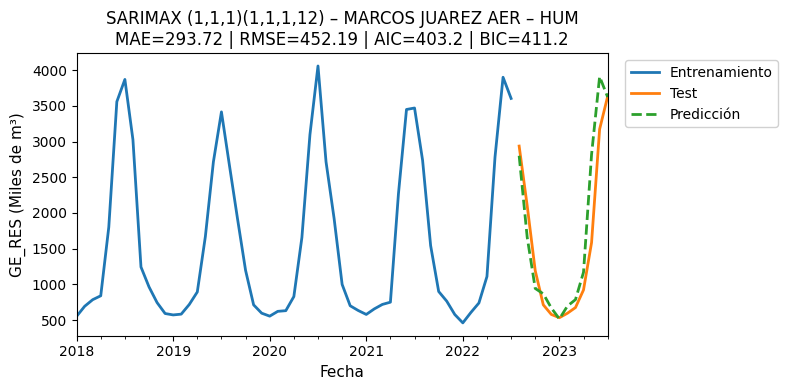

   ✓ Entrenado - MAE=293.723 - RMSE=452.186 - AIC=403.2 - BIC=411.2

📊 SARIMAX con una única exógena: PNM


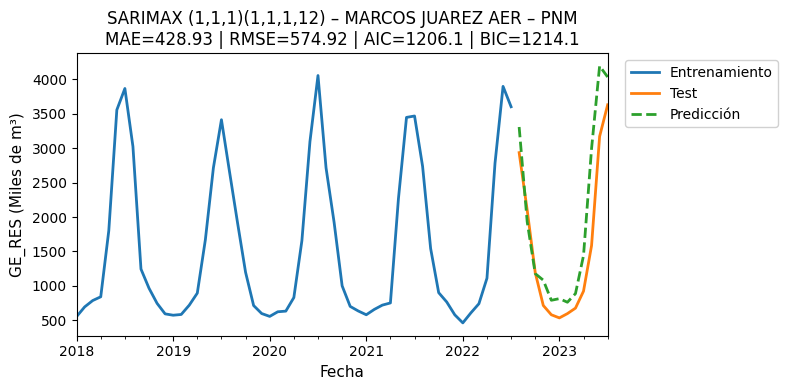

   ✓ Entrenado - MAE=428.934 - RMSE=574.919 - AIC=1206.1 - BIC=1214.1

📊 SARIMAX con una única exógena: FF


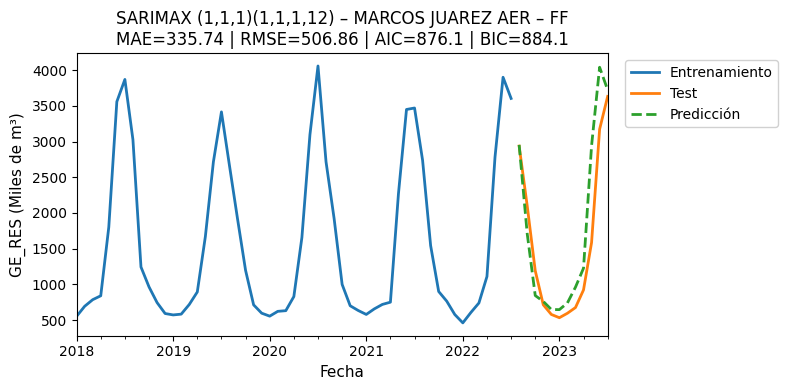

   ✓ Entrenado - MAE=335.742 - RMSE=506.865 - AIC=876.1 - BIC=884.1

📊 SARIMAX con una única exógena: DD


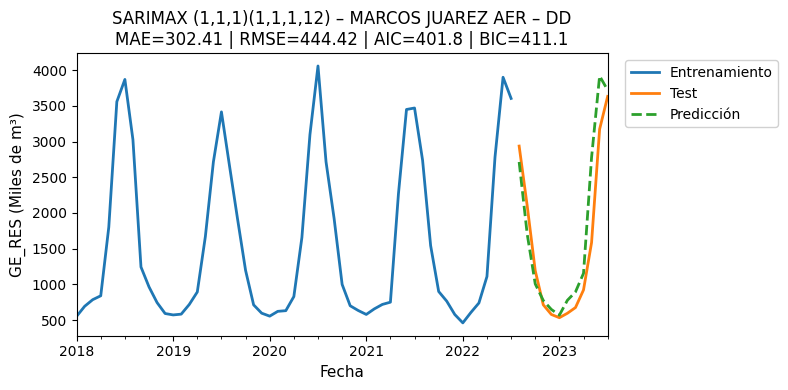

   ✓ Entrenado - MAE=302.410 - RMSE=444.415 - AIC=401.8 - BIC=411.1

🌡️ SARIMAX con TODAS LAS VARIABLES CLIMÁTICAS


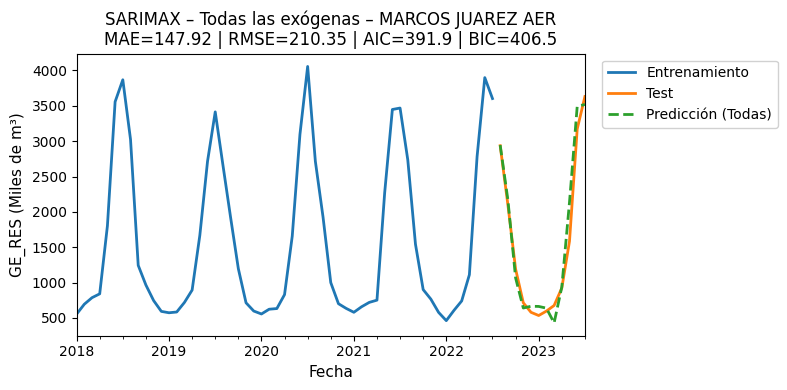

   ✓ Todas – MAE=147.922 - RMSE=210.350 - AIC=391.9 - BIC=406.5


🏷️ Estación: PILAR OBSERVATORI
⚠️ PILAR OBSERVATORI tiene pocos datos (46 meses).


🏷️ Estación: RIO CUARTO AERO

📊 SARIMAX con una única exógena: TEMP


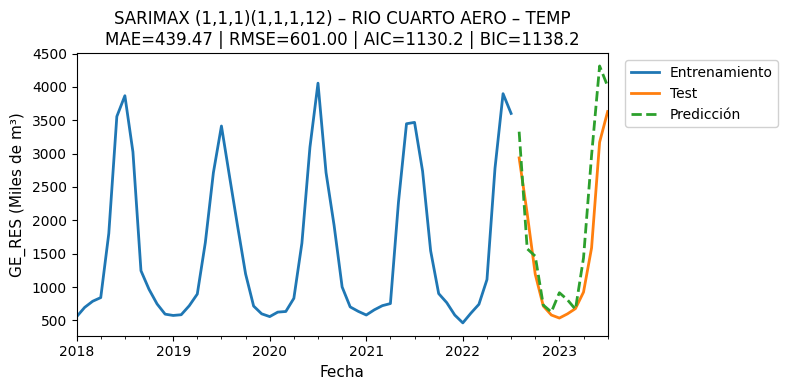

   ✓ Entrenado - MAE=439.474 - RMSE=601.001 - AIC=1130.2 - BIC=1138.2

📊 SARIMAX con una única exógena: HUM


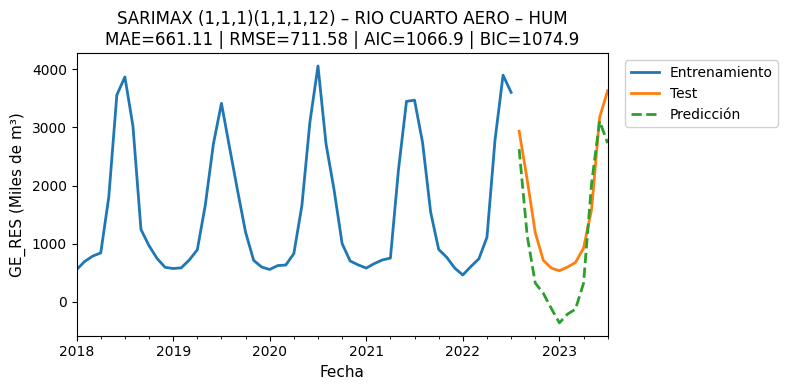

   ✓ Entrenado - MAE=661.111 - RMSE=711.576 - AIC=1066.9 - BIC=1074.9

📊 SARIMAX con una única exógena: PNM


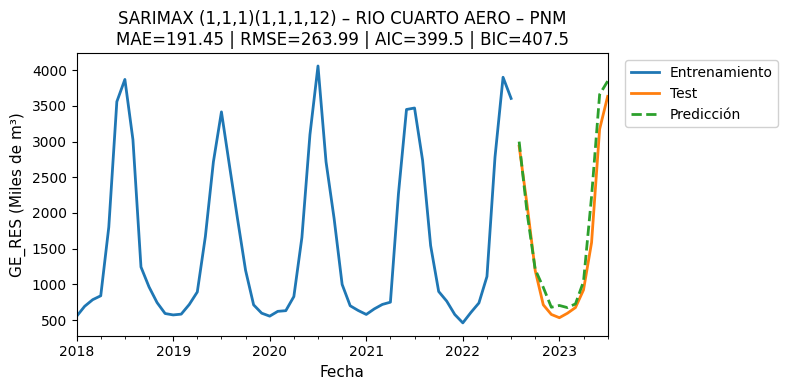

   ✓ Entrenado - MAE=191.452 - RMSE=263.992 - AIC=399.5 - BIC=407.5

📊 SARIMAX con una única exógena: FF


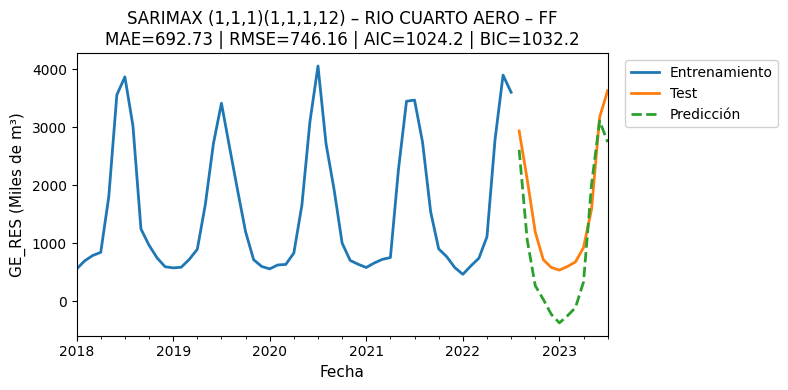

   ✓ Entrenado - MAE=692.732 - RMSE=746.157 - AIC=1024.2 - BIC=1032.2

📊 SARIMAX con una única exógena: DD


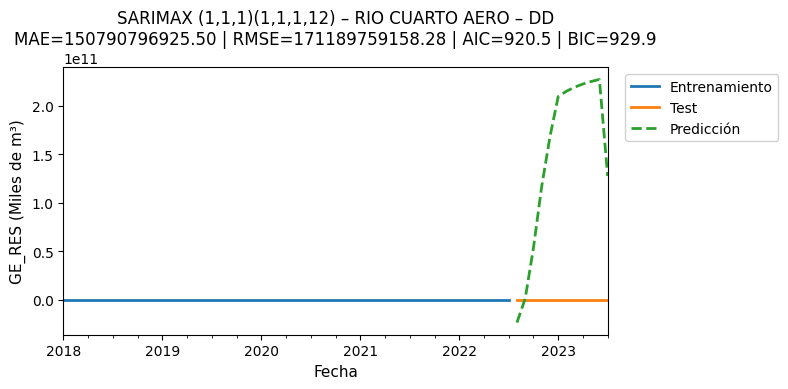

   ✓ Entrenado - MAE=150790796925.502 - RMSE=171189759158.282 - AIC=920.5 - BIC=929.9

🌡️ SARIMAX con TODAS LAS VARIABLES CLIMÁTICAS


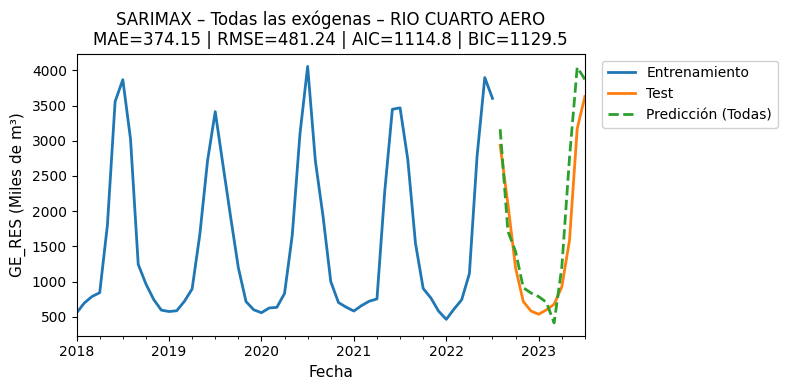

   ✓ Todas – MAE=374.150 - RMSE=481.245 - AIC=1114.8 - BIC=1129.5


🏷️ Estación: VILLA DE MARIA DE
⚠️ VILLA DE MARIA DE tiene pocos datos (46 meses).


🏷️ Estación: VILLA DOLORES AER

📊 SARIMAX con una única exógena: TEMP


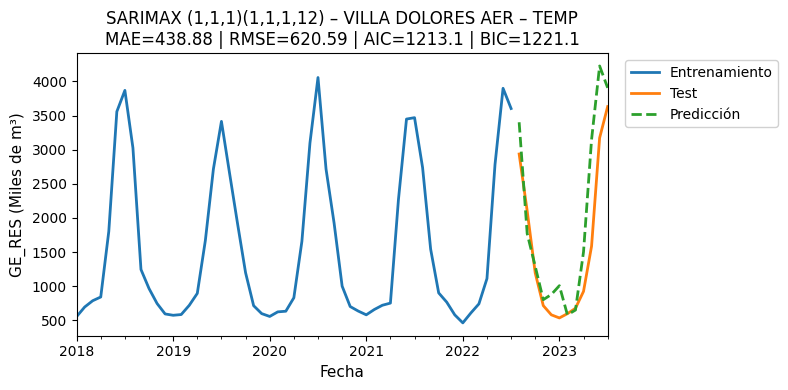

   ✓ Entrenado - MAE=438.876 - RMSE=620.594 - AIC=1213.1 - BIC=1221.1

📊 SARIMAX con una única exógena: HUM


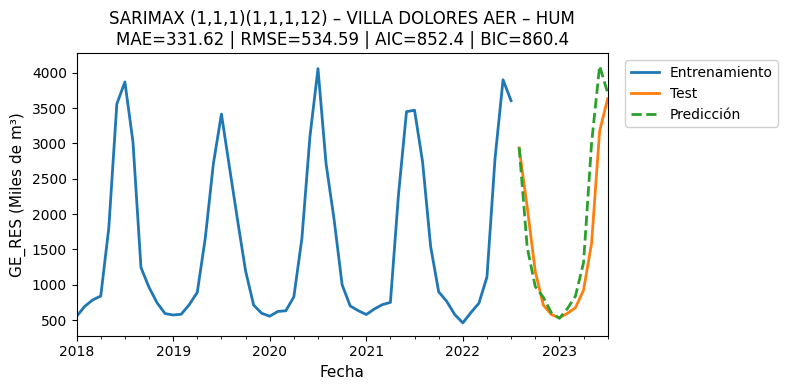

   ✓ Entrenado - MAE=331.619 - RMSE=534.595 - AIC=852.4 - BIC=860.4

📊 SARIMAX con una única exógena: PNM


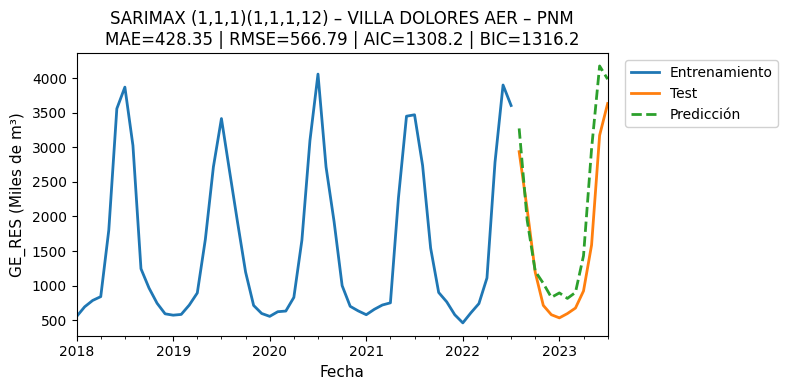

   ✓ Entrenado - MAE=428.347 - RMSE=566.786 - AIC=1308.2 - BIC=1316.2

📊 SARIMAX con una única exógena: FF


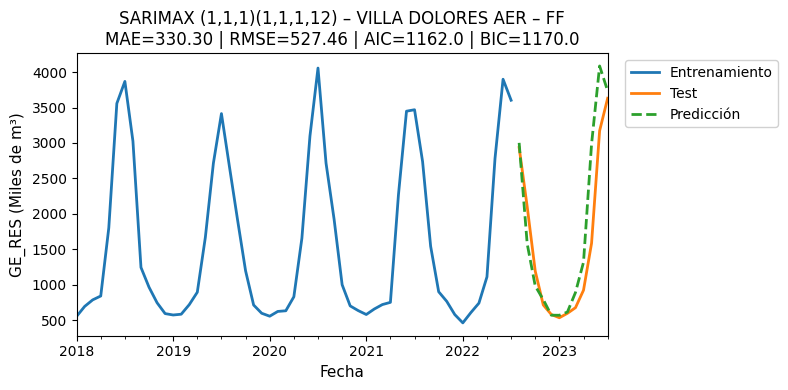

   ✓ Entrenado - MAE=330.299 - RMSE=527.464 - AIC=1162.0 - BIC=1170.0

📊 SARIMAX con una única exógena: DD


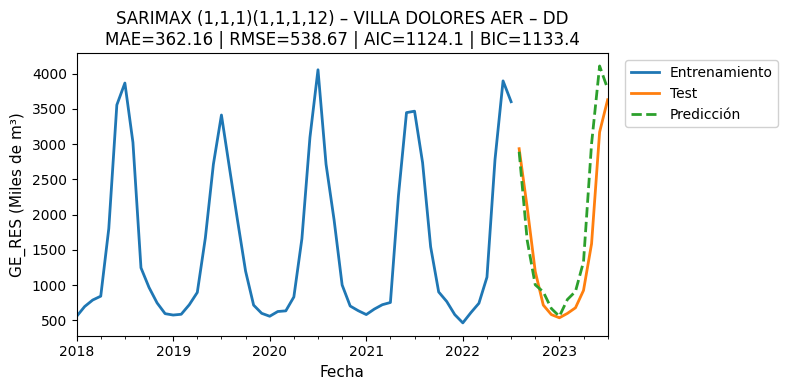

   ✓ Entrenado - MAE=362.163 - RMSE=538.673 - AIC=1124.1 - BIC=1133.4

🌡️ SARIMAX con TODAS LAS VARIABLES CLIMÁTICAS


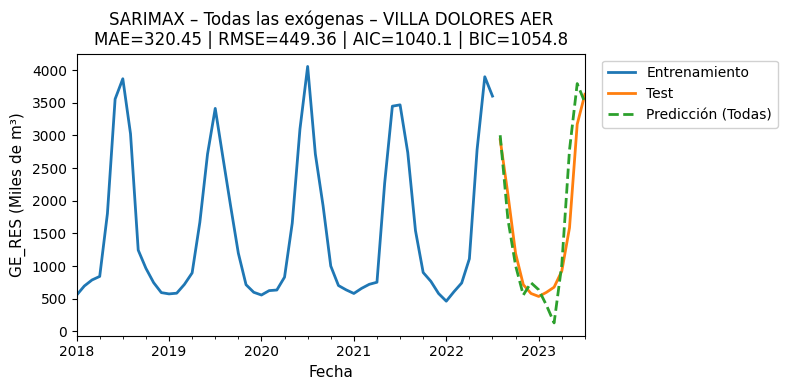

   ✓ Todas – MAE=320.447 - RMSE=449.360 - AIC=1040.1 - BIC=1054.8

========== RESUMEN DE MODELOS ==========



,Estación,Exógena,MAE,RMSE,AIC,BIC
0,CORDOBA AERO,TEMP,2.103339e+02,3.061955e+02,384.978758,392.971985
1,CORDOBA AERO,FF,3.396208e+02,5.297072e+02,1175.723190,1183.716417
2,CORDOBA AERO,PNM,4.361494e+02,5.652904e+02,1153.623868,1161.617095
3,CORDOBA AERO,HUM,4.577497e+02,5.119981e+02,1179.437584,1187.430811
4,CORDOBA AERO,DD,8.365471e+02,9.078184e+02,1104.646693,1113.972125
5,CORDOBA AERO,ALL,1.136675e+13,1.198671e+13,728.714702,743.368952
6,CORDOBA OBSERVATO,FF,3.321008e+02,4.890836e+02,398.543656,406.536883
7,CORDOBA OBSERVATO,DD,3.542342e+02,5.180020e+02,402.259680,411.585112
8,CORDOBA OBSERVATO,ALL,3.732143e+02,5.044410e+02,1031.205957,1045.860206
9,CORDOBA OBSERVATO,TEMP,3.804333e+02,4.996419e+02,1256.061009,1264.054236


             Estación Exógena           MAE          RMSE          AIC  \
0        CORDOBA AERO    TEMP  2.103339e+02  3.061955e+02   384.978758   
1        CORDOBA AERO      FF  3.396208e+02  5.297072e+02  1175.723190   
2        CORDOBA AERO     PNM  4.361494e+02  5.652904e+02  1153.623868   
3        CORDOBA AERO     HUM  4.577497e+02  5.119981e+02  1179.437584   
4        CORDOBA AERO      DD  8.365471e+02  9.078184e+02  1104.646693   
5        CORDOBA AERO     ALL  1.136675e+13  1.198671e+13   728.714702   
6   CORDOBA OBSERVATO      FF  3.321008e+02  4.890836e+02   398.543656   
7   CORDOBA OBSERVATO      DD  3.542342e+02  5.180020e+02   402.259680   
8   CORDOBA OBSERVATO     ALL  3.732143e+02  5.044410e+02  1031.205957   
9   CORDOBA OBSERVATO    TEMP  3.804333e+02  4.996419e+02  1256.061009   
10  CORDOBA OBSERVATO     PNM  4.889610e+02  6.218908e+02  1005.598894   
11  CORDOBA OBSERVATO     HUM  4.939260e+02  5.456415e+02   799.254942   
12     LABOULAYE AERO     PNM  1.52603

In [ ]:
# ===========================================
# 1️⃣ IMPORTS
# ===========================================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.preprocessing import StandardScaler
import warnings
warnings.filterwarnings("ignore")

# ===========================================
# 2️⃣ PREPARACIÓN DE DATOS
# ===========================================
df_smn = df_smn.copy()
df_aux2 = df_aux2.copy()

df_smn['MES_ANIO'] = pd.to_datetime(df_smn['MES_ANIO'], errors='coerce')
df_aux2.index = pd.to_datetime(df_aux2.index, errors='coerce')

# Variables exógenas originales
cols_exog = ['TEMP','HUM','PNM','FF','DD']
for col in cols_exog:
    df_smn[col] = pd.to_numeric(df_smn[col], errors='coerce')

# DD → sin/cos
df_smn['DD_sin'] = np.sin(np.deg2rad(df_smn['DD']))
df_smn['DD_cos'] = np.cos(np.deg2rad(df_smn['DD']))

# Escalar exógenas
cols_exog_std = ['TEMP','HUM','PNM','FF','DD_sin','DD_cos']
scaler = StandardScaler()
df_smn[cols_exog_std] = scaler.fit_transform(df_smn[cols_exog_std])

# ===========================================
# 3️⃣ MODELOS SARIMAX FIJOS
# ===========================================
resultados_basicos = {}
estaciones_pocos_datos = []
min_meses = 48

order = (1,1,1)
seasonal_order = (1,1,1,12)

plt.style.use('default')

for estacion, df_estacion in df_smn.groupby('ESTACION'):

    print(f"\n\n==============================")
    print(f"🏷️ Estación: {estacion}")
    print("==============================")

    df_estacion = df_estacion.set_index('MES_ANIO').asfreq('MS')

    fecha_inicio = df_estacion.index.min()
    fecha_fin = df_estacion.index.max()

    df_gas_recorte = df_aux2.loc[(df_aux2.index >= fecha_inicio) &
                                 (df_aux2.index <= fecha_fin)]

    fechas_comunes = df_gas_recorte.index.intersection(df_estacion.index)
    df_gas_recorte = df_gas_recorte.loc[fechas_comunes]
    df_estacion = df_estacion.loc[fechas_comunes]

    if len(df_gas_recorte) < min_meses:
        print(f"⚠️ {estacion} tiene pocos datos ({len(df_gas_recorte)} meses).")
        estaciones_pocos_datos.append(estacion)
        continue

    # ⚠️ CAMBIAR POR 'GE_TOTAL' SI SE QUIERE LA VERSIÓN TOTAL
    serie = df_gas_recorte['GE_RES']

    var_train = serie.iloc[:-12]
    var_test = serie.iloc[-12:]

    # =====================================================
    # 3.1 ENTRENAMIENTO POR VARIABLE EXÓGENA
    # =====================================================
    for col in cols_exog:
        print(f"\n📊 SARIMAX con una única exógena: {col}")

        if col == 'DD':
            exog_train = df_estacion[['DD_sin', 'DD_cos']].iloc[:-12]
            exog_test  = df_estacion[['DD_sin', 'DD_cos']].iloc[-12:]
        else:
            exog_train = df_estacion[[col]].iloc[:-12]
            exog_test  = df_estacion[[col]].iloc[-12:]

        try:
            modelo = SARIMAX(
                var_train,
                exog=exog_train,
                order=order,
                seasonal_order=seasonal_order,
                enforce_stationarity=False,
                enforce_invertibility=False
            )
            res = modelo.fit(disp=False)
            pred = res.get_forecast(steps=12, exog=exog_test).predicted_mean

            mae = np.mean(np.abs(var_test - pred))
            rmse = np.sqrt(np.mean((var_test - pred)**2))
            aic = res.aic
            bic = res.bic

            resultados_basicos[(estacion, col)] = {
                'modelo': res,
                'pred': pred,
                'mae': mae,
                'rmse': rmse,
                'aic': aic,
                'bic': bic
            }

            # =======================
            # GRÁFICO DE RESULTADOS
            # =======================
            fig, ax = plt.subplots(figsize=(8,4))

            var_train.plot(ax=ax, label='Entrenamiento', linewidth=2)
            var_test.plot(ax=ax, label='Test', linewidth=2)
            pred.plot(ax=ax, label='Predicción', linestyle='--', linewidth=2)

            ax.set_title(
                f"SARIMAX (1,1,1)(1,1,1,12) – {estacion} – {col}\n"
                f"MAE={mae:.2f} | RMSE={rmse:.2f} | AIC={aic:.1f} | BIC={bic:.1f}",
                fontsize=12
            )

            ax.set_ylabel("GE_RES (Miles de m³)", fontsize=11)
            ax.set_xlabel("Fecha", fontsize=11)

            ax.legend(
                loc='upper left',
                bbox_to_anchor=(1.02, 1),
                frameon=True,
                framealpha=0.9
            )

            plt.tight_layout()
            plt.show()

            print(f"   ✓ Entrenado - MAE={mae:.3f} - RMSE={rmse:.3f} - AIC={aic:.1f} - BIC={bic:.1f}")

        except Exception as e:
            print(f"   ❌ Error con {col}: {e}")
            continue

    # =====================================================
    # 3.2 TODAS LAS EXÓGENAS
    # =====================================================
    print(f"\n🌡️ SARIMAX con TODAS LAS VARIABLES CLIMÁTICAS")

    exog_cols_all = ['TEMP','HUM','PNM','FF','DD_sin','DD_cos']

    exog_train = df_estacion[exog_cols_all].iloc[:-12]
    exog_test  = df_estacion[exog_cols_all].iloc[-12:]

    try:
        modelo = SARIMAX(
            var_train,
            exog=exog_train,
            order=order,
            seasonal_order=seasonal_order,
            enforce_stationarity=False,
            enforce_invertibility=False
        )
        res = modelo.fit(disp=False)
        pred = res.get_forecast(steps=12, exog=exog_test).predicted_mean

        mae = np.mean(np.abs(var_test - pred))
        rmse = np.sqrt(np.mean((var_test - pred)**2))
        aic = res.aic
        bic = res.bic

        resultados_basicos[(estacion, 'ALL')] = {
            'modelo': res,
            'pred': pred,
            'mae': mae,
            'rmse': rmse,
            'aic': aic,
            'bic': bic
        }

        # =======================
        # GRÁFICO – TODAS
        # =======================
        fig, ax = plt.subplots(figsize=(8,4))

        var_train.plot(ax=ax, label='Entrenamiento', linewidth=2)
        var_test.plot(ax=ax, label='Test', linewidth=2)
        pred.plot(ax=ax, label='Predicción (Todas)', linestyle='--', linewidth=2)

        ax.set_title(
            f"SARIMAX – Todas las exógenas – {estacion}\n"
            f"MAE={mae:.2f} | RMSE={rmse:.2f} | AIC={aic:.1f} | BIC={bic:.1f}",
            fontsize=12
        )

        ax.set_ylabel("GE_RES (Miles de m³)", fontsize=11)
        ax.set_xlabel("Fecha", fontsize=11)

        ax.legend(
            loc='upper left',
            bbox_to_anchor=(1.02, 1),
            frameon=True,
            framealpha=0.9
        )

        plt.tight_layout()
        plt.show()

        print(f"   ✓ Todas – MAE={mae:.3f} - RMSE={rmse:.3f} - AIC={aic:.1f} - BIC={bic:.1f}")

    except Exception as e:
        print(f"   ❌ Error con el modelo con todas las exógenas: {e}")


# =======================================================
# TABLA DE RESULTADOS COMPARATIVA
# =======================================================
print("\n========== RESUMEN DE MODELOS ==========\n")

tabla_resultados = pd.DataFrame([
    {
        'Estación': k[0],
        'Exógena': k[1],
        'MAE': v.get('mae'),
        'RMSE': v.get('rmse'),
        'AIC': v.get('aic'),
        'BIC': v.get('bic')
    }
    for k, v in resultados_basicos.items()
])

tabla_resultados = tabla_resultados.sort_values(['Estación','MAE']).reset_index(drop=True)

from IPython.display import display
display(tabla_resultados)
print(tabla_resultados)


## GE_RES Y VARIABLES EXÓGENAS DE A UNA Y BÚSQUEDA DE PARÁMETROS

In [ ]:
# ======================================================
# 1️⃣ IMPORTS
# ======================================================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.preprocessing import StandardScaler
import warnings
warnings.filterwarnings("ignore")

# ======================================================
# 2️⃣ CONFIGURACIÓN GENERAL
# ======================================================

df_smn = df_smn.copy()
df_aux2 = df_aux2.copy()

# Fechas
df_smn["MES_ANIO"] = pd.to_datetime(df_smn["MES_ANIO"], errors="coerce")
df_aux2.index = pd.to_datetime(df_aux2.index, errors="coerce")

# Variables exógenas
cols_exog = ["TEMP", "HUM", "PNM", "FF", "DD"]
for col in cols_exog:
    df_smn[col] = pd.to_numeric(df_smn[col], errors="coerce")

# Dirección del viento → sen/cos
df_smn["DD_sin"] = np.sin(np.deg2rad(df_smn["DD"]))
df_smn["DD_cos"] = np.cos(np.deg2rad(df_smn["DD"]))

# Todas las columnas exógenas posibles
cols_exog_all = ["TEMP", "HUM", "PNM", "FF", "DD_sin", "DD_cos"]

# Escalado
scaler = StandardScaler()
df_smn[cols_exog_all] = scaler.fit_transform(df_smn[cols_exog_all])

# ======================================================
# 3️⃣ BÚSQUEDA DE PARÁMETROS PARA GE_RES
# ======================================================

param_grid = [
    (p, d, q, P, D, Q, s)
    for p in [0, 1]
    for d in [1]
    for q in [0, 1]
    for P in [0, 1]
    for D in [1]
    for Q in [0, 1]
    for s in [12]
]

min_meses = 48
resultados = {}

for estacion, df_est in df_smn.groupby("ESTACION"):

    print(f"\n🏷️ Estación: {estacion}")

    df_est = df_est.set_index("MES_ANIO").asfreq("MS")

    inicio, fin = df_est.index.min(), df_est.index.max()
    df_gas = df_aux2.loc[(df_aux2.index >= inicio) & (df_aux2.index <= fin)]

    fechas = df_gas.index.intersection(df_est.index)
    df_gas = df_gas.loc[fechas]
    df_est = df_est.loc[fechas]

    if len(df_gas) < min_meses:
        print(f"⚠️ {estacion}: pocos datos ({len(df_gas)} meses). Salteada.")
        continue

    serie = df_gas["GE_RES"]

    if serie.std() < 1e-3:
        print(f"⚠️ {estacion}: serie casi constante. Salteada.")
        continue

    train = serie.iloc[:-12]
    test  = serie.iloc[-12:]

    todos_modelos = []

    # 🔥 PROBAR UNA EXÓGENA POR VEZ
    for col in cols_exog:

        print(f"   → Variable exógena: {col}")

        if col == "DD":
            exog_train = df_est[["DD_sin", "DD_cos"]].iloc[:-12]
            exog_test  = df_est[["DD_sin", "DD_cos"]].iloc[-12:]
        else:
            exog_train = df_est[[col]].iloc[:-12]
            exog_test  = df_est[[col]].iloc[-12:]

        for (p, d, q, P, D, Q, s) in param_grid:
            try:
                modelo = SARIMAX(
                    train,
                    exog=exog_train,
                    order=(p, d, q),
                    seasonal_order=(P, D, Q, s),
                    enforce_stationarity=False,
                    enforce_invertibility=False
                )

                ajuste = modelo.fit(disp=False)
                pred = ajuste.get_forecast(steps=12, exog=exog_test).predicted_mean

                mae  = np.mean(np.abs(test - pred))
                rmse = np.sqrt(np.mean((test - pred) ** 2))
                aic  = ajuste.aic
                bic  = ajuste.bic

                todos_modelos.append({
                    "estacion": estacion,
                    "variable": col,
                    "orden": (p, d, q, P, D, Q, s),
                    "mae": mae,
                    "rmse": rmse,
                    "aic": aic,
                    "bic": bic
                })

            except Exception:
                continue

    if todos_modelos:
        df_temp = pd.DataFrame(todos_modelos)
        resultados[estacion] = df_temp.sort_values("rmse").head(10)

# ======================================================
# 4️⃣ GUARDAR EXCEL (TOP-10 POR ESTACIÓN)
# ======================================================

writer = pd.ExcelWriter("resumen_mejores_GE_RES.xlsx", engine="openpyxl")

for est, df_top in resultados.items():
    df_top.to_excel(writer, sheet_name=est[:31], index=False)

writer.close()

print("\n📁 Archivo generado: resumen_mejores_GE_RES.xlsx")

# ======================================================
# 5️⃣ SELECCIÓN DEL MEJOR MODELO FINAL POR ESTACIÓN
# ======================================================

seleccion_final = []

for estacion, df_top in resultados.items():
    fila = df_top.loc[df_top["rmse"].idxmin()].copy()
    fila["estacion"] = estacion
    seleccion_final.append(fila)

df_final = pd.DataFrame(seleccion_final)

df_final.to_excel("seleccion_final_por_estacion_GE_RES.xlsx", index=False)

print("\n🏆 Archivo con mejores modelos finales:")
print("👉 seleccion_final_por_estacion_GE_RES.xlsx")



🏷️ Estación: CORDOBA AERO
   → Variable exógena: TEMP
   → Variable exógena: HUM
   → Variable exógena: PNM
   → Variable exógena: FF
   → Variable exógena: DD

🏷️ Estación: CORDOBA OBSERVATO
   → Variable exógena: TEMP
   → Variable exógena: HUM
   → Variable exógena: PNM
   → Variable exógena: FF
   → Variable exógena: DD

🏷️ Estación: ESCUELA DE AVIACI
⚠️ ESCUELA DE AVIACI: pocos datos (46 meses). Salteada.

🏷️ Estación: LABOULAYE AERO
   → Variable exógena: TEMP
   → Variable exógena: HUM
   → Variable exógena: PNM
   → Variable exógena: FF
   → Variable exógena: DD

🏷️ Estación: MARCOS JUAREZ AER
   → Variable exógena: TEMP
   → Variable exógena: HUM
   → Variable exógena: PNM
   → Variable exógena: FF
   → Variable exógena: DD

🏷️ Estación: PILAR OBSERVATORI
⚠️ PILAR OBSERVATORI: pocos datos (46 meses). Salteada.

🏷️ Estación: RIO CUARTO AERO
   → Variable exógena: TEMP
   → Variable exógena: HUM
   → Variable exógena: PNM
   → Variable exógena: FF
   → Variable exógena: DD

🏷️ 


📈 Generando gráficos finales por estación (GE_RES)...

📍 Estación: CORDOBA AERO — variable exógena: TEMP


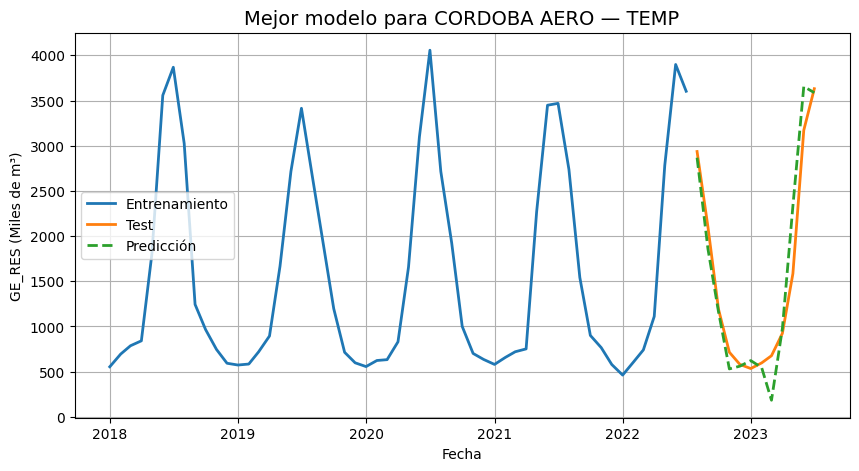


📍 Estación: CORDOBA OBSERVATO — variable exógena: TEMP


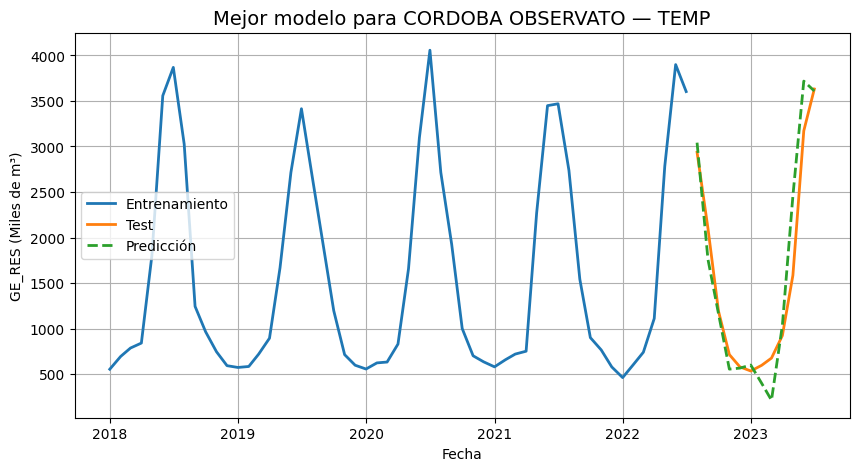


📍 Estación: LABOULAYE AERO — variable exógena: PNM


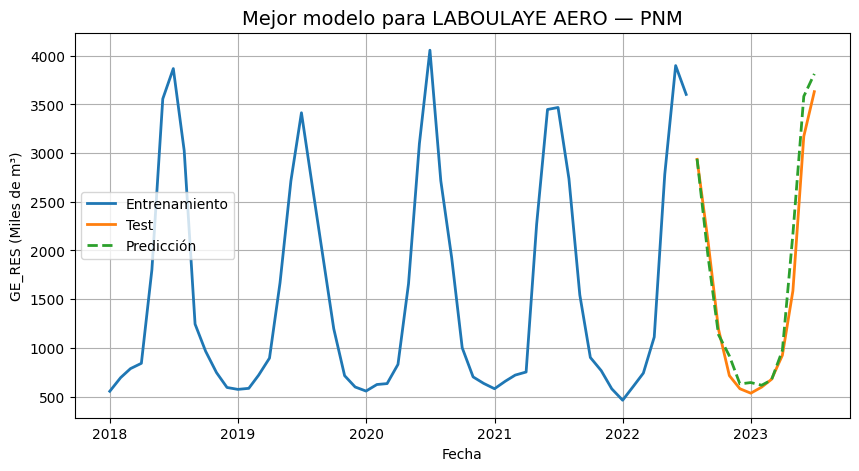


📍 Estación: MARCOS JUAREZ AER — variable exógena: TEMP


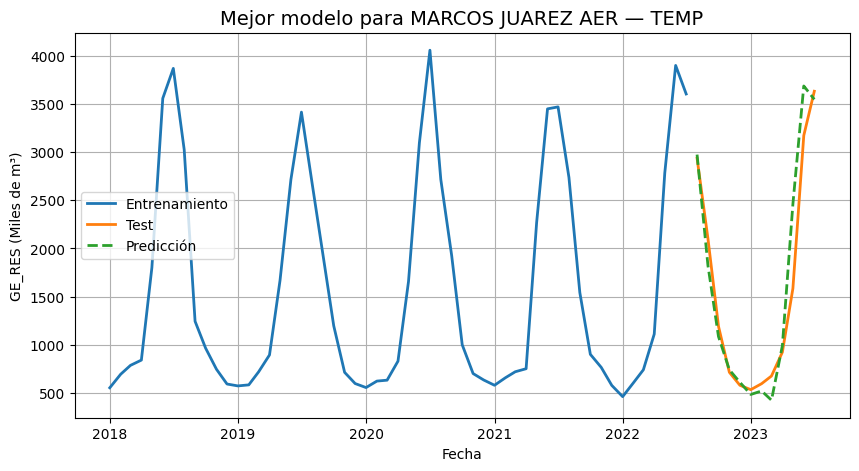


📍 Estación: RIO CUARTO AERO — variable exógena: PNM


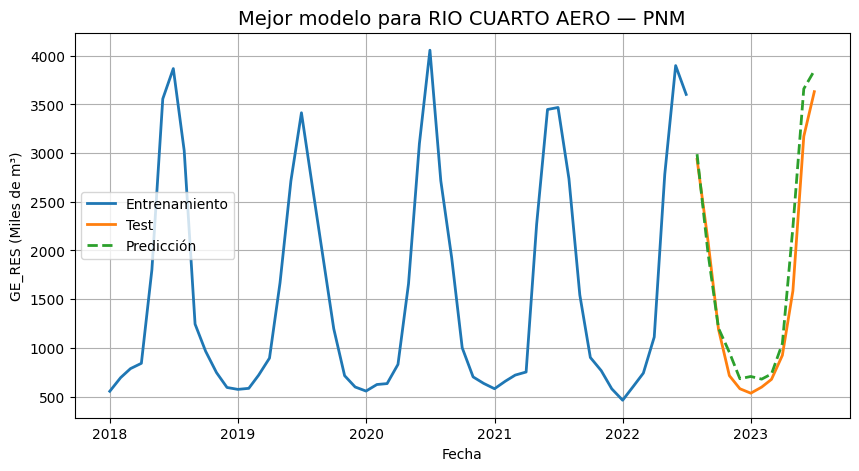


📍 Estación: VILLA DOLORES AER — variable exógena: TEMP


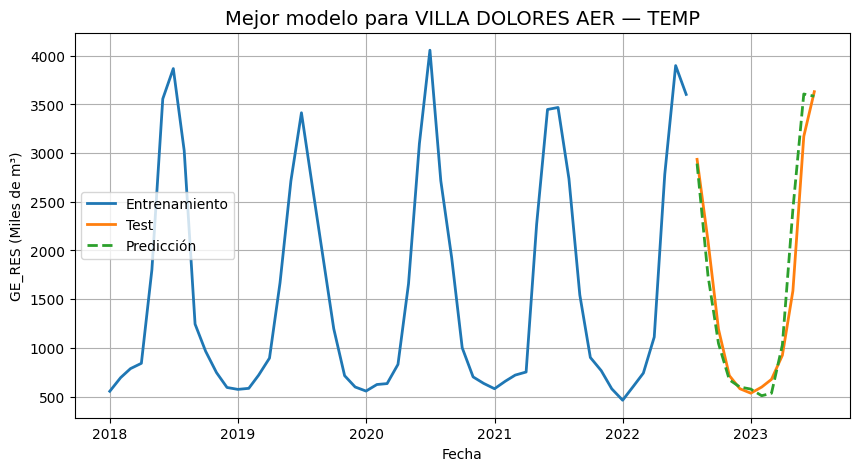

In [ ]:
# ======================================================
# 6️⃣ GRAFICAR EL MEJOR MODELO POR ESTACIÓN (GE_RES)
# ======================================================

import ast
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX

df_final = pd.read_excel("seleccion_final_por_estacion_GE_RES.xlsx")

variable_gas = "GE_RES"

print("\n📈 Generando gráficos finales por estación (GE_RES)...")

for i, fila in df_final.iterrows():

    estacion = fila["estacion"]
    orden = ast.literal_eval(fila["orden"])
    variable_exog = fila["variable"]

    print(f"\n📍 Estación: {estacion} — variable exógena: {variable_exog}")

    # --- Preparar datos ---
    df_est = df_smn[df_smn["ESTACION"] == estacion].copy()
    df_est = df_est.set_index("MES_ANIO").asfreq("MS")

    inicio, fin = df_est.index.min(), df_est.index.max()
    df_gas = df_aux2.loc[(df_aux2.index >= inicio) & (df_aux2.index <= fin)]

    fechas = df_gas.index.intersection(df_est.index)
    df_est = df_est.loc[fechas]
    df_gas = df_gas.loc[fechas]

    serie = df_gas[variable_gas]

    # División train–test
    train = serie.iloc[:-12]
    test  = serie.iloc[-12:]

    # --- Exógena correspondiente ---
    if variable_exog == "DD":
        exog_train = df_est[["DD_sin", "DD_cos"]].iloc[:-12]
        exog_test  = df_est[["DD_sin", "DD_cos"]].iloc[-12:]
    else:
        exog_train = df_est[[variable_exog]].iloc[:-12]
        exog_test  = df_est[[variable_exog]].iloc[-12:]

    # --- Entrenar modelo final ---
    modelo = SARIMAX(
        train,
        exog=exog_train,
        order=orden[:3],
        seasonal_order=orden[3:],
        enforce_stationarity=False,
        enforce_invertibility=False
    ).fit(disp=False)

    pred = modelo.get_forecast(steps=12, exog=exog_test).predicted_mean

    # ======================================================
    # 📉 GRÁFICO FINAL
    # ======================================================
    plt.figure(figsize=(10, 5))

    plt.plot(train.index, train, label="Entrenamiento", linewidth=2)
    plt.plot(test.index, test, label="Test", linewidth=2)
    plt.plot(pred.index, pred, label="Predicción", linestyle="--", linewidth=2)

    plt.title(f"Mejor modelo para {estacion} — {variable_exog}", fontsize=14)
    plt.xlabel("Fecha")
    plt.ylabel("GE_RES (Miles de m³)")
    plt.legend()
    plt.grid()

    plt.show()


##GE_RES CON TODAS LAS VARIABLES EXÓGENAS Y BÚSQUEDA DE PARÁMETROS

In [ ]:
# ======================================================
# 1️⃣ IMPORTS
# ======================================================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.preprocessing import StandardScaler
import warnings
warnings.filterwarnings("ignore")

# ======================================================
# 2️⃣ CONFIGURACIÓN GENERAL
# ======================================================

# Elegir variable de gas: 'GE_RES' o 'GE_TOTAL'
variable_gas = 'GE_RES'

print(f"\n🔄 MODELANDO VARIABLE DE GAS: {variable_gas}\n")

df_smn = df_smn.copy()
df_aux2 = df_aux2.copy()

# Fechas
df_smn['MES_ANIO'] = pd.to_datetime(df_smn['MES_ANIO'], errors='coerce')
df_aux2.index = pd.to_datetime(df_aux2.index, errors='coerce')

# Variables exógenas originales
cols_exog = ['TEMP','HUM','PNM','FF','DD']

# Asegurar numéricos
for col in cols_exog:
    df_smn[col] = pd.to_numeric(df_smn[col], errors='coerce')

# Transformación de dirección del viento
df_smn['DD_sin'] = np.sin(np.deg2rad(df_smn['DD']))
df_smn['DD_cos'] = np.cos(np.deg2rad(df_smn['DD']))

# Variables exógenas para SARIMAX FINAL
cols_exog_all = ['TEMP','HUM','PNM','FF','DD_sin','DD_cos']

# Escalado
scaler = StandardScaler()
df_smn[cols_exog_all] = scaler.fit_transform(df_smn[cols_exog_all])

# ======================================================
# 3️⃣ BÚSQUEDA DE PARÁMETROS SARIMAX (TODAS LAS EXÓGENAS)
# ======================================================

param_grid = [
    (p,d,q,P,D,Q,s)
    for p in [0,1]
    for d in [1]
    for q in [0,1]
    for P in [0,1]
    for D in [1]
    for Q in [0,1]
    for s in [12]
]

min_meses = 48
resultados = {}
estaciones_descartadas = []

for estacion, df_est in df_smn.groupby("ESTACION"):

    print(f"\n🏷️ Estación: {estacion.upper()}")

    # Indexar por fecha
    df_est = df_est.set_index("MES_ANIO").asfreq("MS")

    # Alinear con tiempos de gas
    inicio, fin = df_est.index.min(), df_est.index.max()
    df_gas = df_aux2.loc[(df_aux2.index >= inicio) & (df_aux2.index <= fin)]

    fechas_comunes = df_gas.index.intersection(df_est.index)
    df_gas = df_gas.loc[fechas_comunes]
    df_est = df_est.loc[fechas_comunes]

    if len(df_gas) < min_meses:
        print(f"⚠️ {estacion}: pocos datos ({len(df_gas)} meses). Se descarta.")
        estaciones_descartadas.append(estacion)
        continue

    serie = df_gas[variable_gas]

    if serie.std() < 1e-3:
        print(f"⚠️ {estacion}: serie casi constante. No se modela.")
        continue

    # División train–test
    train = serie.iloc[:-12]
    test = serie.iloc[-12:]

    exog_train = df_est[cols_exog_all].iloc[:-12]
    exog_test = df_est[cols_exog_all].iloc[-12:]

    mejores = []

    # PROBAR TODOS LOS MODELOS
    for (p,d,q,P,D,Q,s) in param_grid:
        try:
            modelo = SARIMAX(
                train,
                exog=exog_train,
                order=(p,d,q),
                seasonal_order=(P,D,Q,s),
                enforce_stationarity=False,
                enforce_invertibility=False
            )

            ajuste = modelo.fit(disp=False)

            pred = ajuste.get_forecast(steps=12, exog=exog_test).predicted_mean

            mae = np.mean(np.abs(test - pred))
            rmse = np.sqrt(np.mean((test - pred)**2))
            aic = ajuste.aic
            bic = ajuste.bic

            mejores.append({
                "estacion": estacion,
                "orden": (p,d,q,P,D,Q,s),
                "mae": mae,
                "rmse": rmse,
                "aic": aic,
                "bic": bic,
                "pred": pred,
                "modelo": ajuste
            })

        except Exception as e:
            print(f"  ❌ Error en SARIMA({p},{d},{q})×({P},{D},{Q},{s}): {e}")

    # Guardar todos los modelos probados para la estación
    if mejores:
        df_mejores = pd.DataFrame(mejores)

        # Guardar top 10 por estación
        resultados[estacion] = df_mejores.sort_values("rmse").head(10)


# ======================================================
# 4️⃣ CREAR EXCEL CON TODOS LOS TOP-10 POR ESTACIÓN
# ======================================================

writer = pd.ExcelWriter("resumen_mejores_GE_RES_multivariado.xlsx", engine="openpyxl")

for est, df_top in resultados.items():
    df_top.to_excel(writer, sheet_name=est[:31], index=False)

writer.close()

print("\n📁 Archivo generado: resumen_mejores_GE_RES_multivariado.xlsx")


# ======================================================
# 5️⃣ SELECCIÓN DEL MEJOR MODELO GLOBAL POR ESTACIÓN
#    (criterio: RMSE mínimo)
# ======================================================

seleccion_final_para_excel = []

for estacion, df_top in resultados.items():
    mejor_fila_df = df_top.loc[df_top['rmse'].idxmin()]
    row_dict = mejor_fila_df.to_dict()
    row_dict['estacion'] = estacion
    row_dict['variable'] = 'ALL_EXOG'
    seleccion_final_para_excel.append(row_dict)

df_final = pd.DataFrame(seleccion_final_para_excel)

df_final = df_final[['estacion', 'variable', 'orden', 'mae', 'rmse', 'aic', 'bic', 'pred', 'modelo']]
df_final.to_excel("seleccion_final_por_GE_RES.xlsx", index=False)

print("\n🏆 Selección final por estación guardada en:")
print("👉 seleccion_final_por_GE_RES.xlsx")



🔄 MODELANDO VARIABLE DE GAS: GE_RES


🏷️ Estación: CORDOBA AERO

🏷️ Estación: CORDOBA OBSERVATO

🏷️ Estación: ESCUELA DE AVIACI
⚠️ ESCUELA DE AVIACI: pocos datos (46 meses). Se descarta.

🏷️ Estación: LABOULAYE AERO

🏷️ Estación: MARCOS JUAREZ AER

🏷️ Estación: PILAR OBSERVATORI
⚠️ PILAR OBSERVATORI: pocos datos (46 meses). Se descarta.

🏷️ Estación: RIO CUARTO AERO

🏷️ Estación: VILLA DE MARIA DE
⚠️ VILLA DE MARIA DE: pocos datos (46 meses). Se descarta.

🏷️ Estación: VILLA DOLORES AER

📁 Archivo generado: resumen_mejores_GE_RES_multivariado.xlsx

🏆 Selección final por estación guardada en:
👉 seleccion_final_por_GE_RES.xlsx


In [ ]:
# ===========================================
# 1️⃣ Imports
# ===========================================
import pandas as pd
import matplotlib.pyplot as plt
import ast
from statsmodels.tsa.statespace.sarimax import SARIMAX

# ===========================================
# 2️⃣ Lectura del resumen final
# ===========================================
df_final = pd.read_excel("seleccion_final_por_GE_RES.xlsx")

print("Modelos finales por estación cargados correctamente.")
df_final


Modelos finales por estación cargados correctamente.


,estacion,variable,orden,mae,rmse,aic,bic,pred,modelo
0,CORDOBA AERO,ALL_EXOG,"(1, 1, 1, 0, 1, 0, 12)",206.857696,302.259451,554.102722,569.302637,2022-08-01 2924.017192\n2022-09-01 1983....,<statsmodels.tsa.statespace.sarimax.SARIMAXRes...
1,CORDOBA OBSERVATO,ALL_EXOG,"(0, 1, 1, 1, 1, 0, 12)",222.495226,336.642475,423.490359,436.101136,2022-08-01 3003.064557\n2022-09-01 1882....,<statsmodels.tsa.statespace.sarimax.SARIMAXRes...
2,LABOULAYE AERO,ALL_EXOG,"(0, 1, 1, 1, 1, 1, 12)",236.289556,291.050320,398.825805,412.147850,2022-08-01 2778.211981\n2022-09-01 1894....,<statsmodels.tsa.statespace.sarimax.SARIMAXRes...
3,MARCOS JUAREZ AER,ALL_EXOG,"(0, 1, 1, 1, 1, 0, 12)",189.803591,257.193739,419.468789,432.079565,2022-08-01 2975.056574\n2022-09-01 2282....,<statsmodels.tsa.statespace.sarimax.SARIMAXRes...
4,RIO CUARTO AERO,ALL_EXOG,"(1, 1, 1, 0, 1, 0, 12)",227.944484,326.910848,560.663337,575.863252,2022-08-01 2956.077192\n2022-09-01 1800....,<statsmodels.tsa.statespace.sarimax.SARIMAXRes...
5,VILLA DOLORES AER,ALL_EXOG,"(0, 1, 1, 0, 1, 0, 12)",226.687551,330.532326,569.802750,583.313786,2022-08-01 2998.092342\n2022-09-01 1942....,<statsmodels.tsa.statespace.sarimax.SARIMAXRes...



📌 Generando modelo final para estación: CORDOBA AERO
   → Orden elegido: (1, 1, 1, 0, 1, 0, 12)


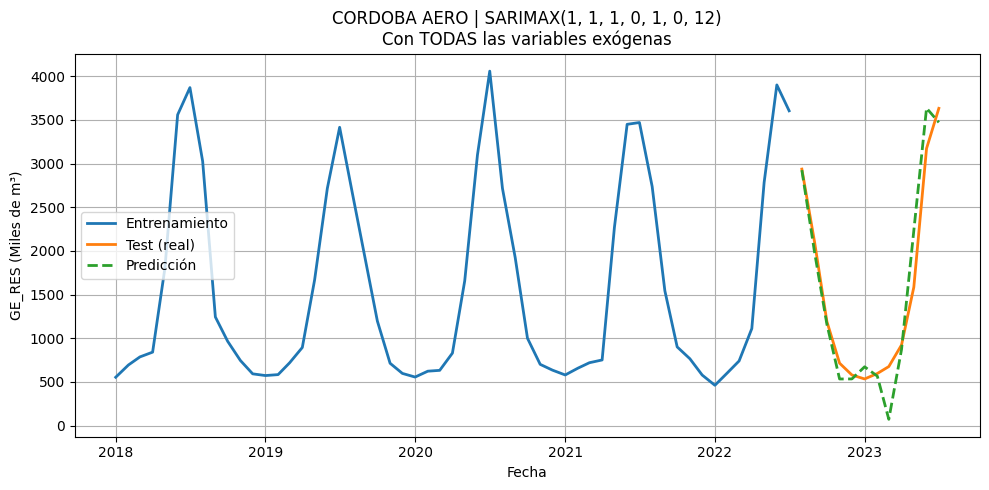


📌 Generando modelo final para estación: CORDOBA OBSERVATO
   → Orden elegido: (0, 1, 1, 1, 1, 0, 12)


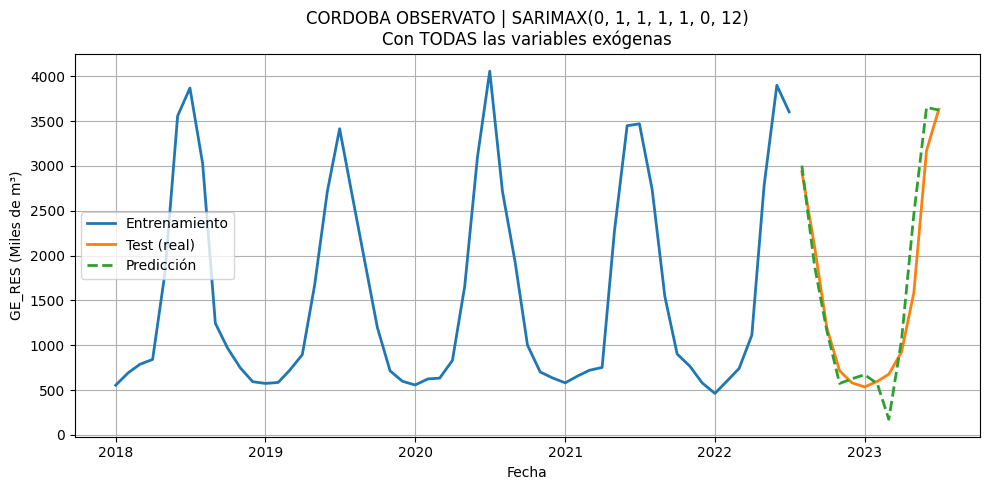


📌 Generando modelo final para estación: LABOULAYE AERO
   → Orden elegido: (0, 1, 1, 1, 1, 1, 12)


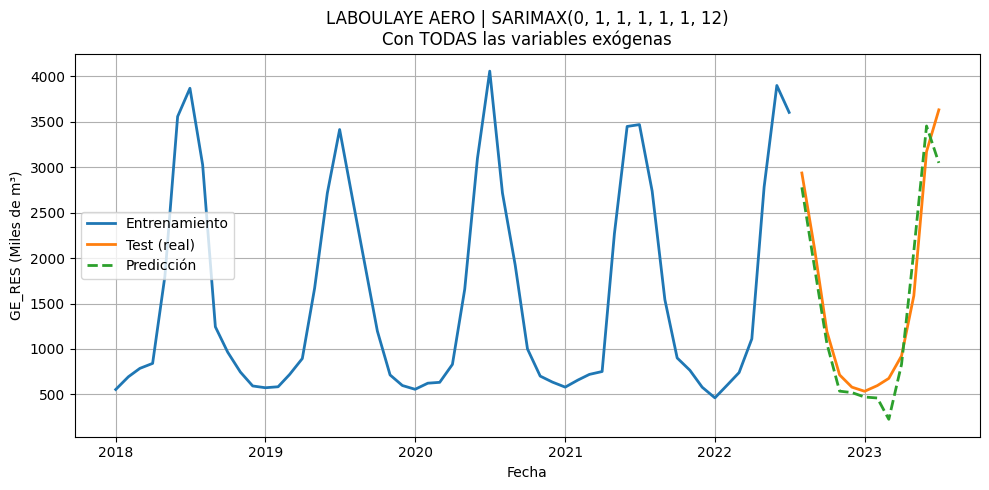


📌 Generando modelo final para estación: MARCOS JUAREZ AER
   → Orden elegido: (0, 1, 1, 1, 1, 0, 12)


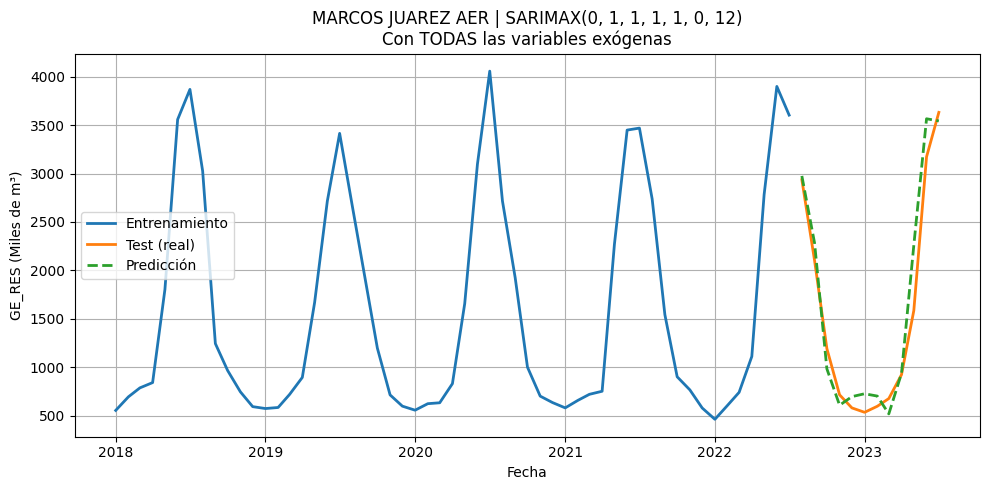


📌 Generando modelo final para estación: RIO CUARTO AERO
   → Orden elegido: (1, 1, 1, 0, 1, 0, 12)


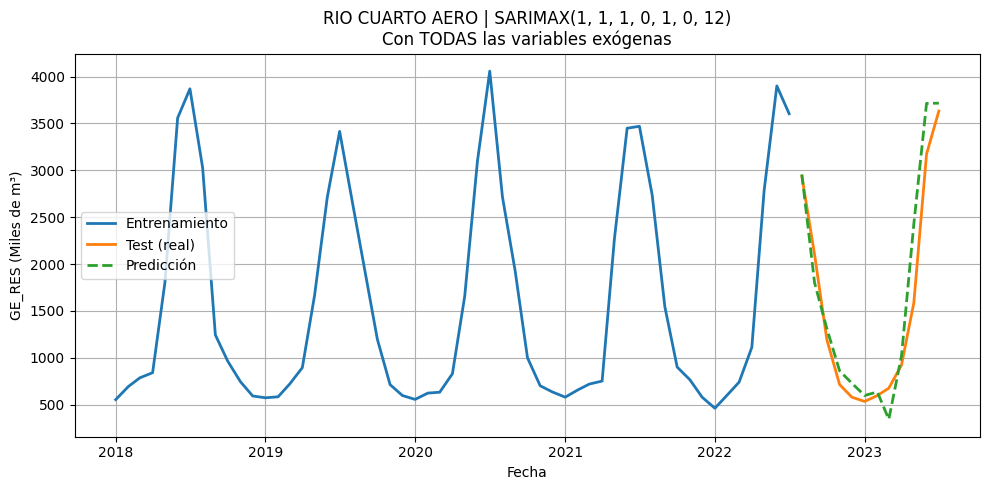


📌 Generando modelo final para estación: VILLA DOLORES AER
   → Orden elegido: (0, 1, 1, 0, 1, 0, 12)


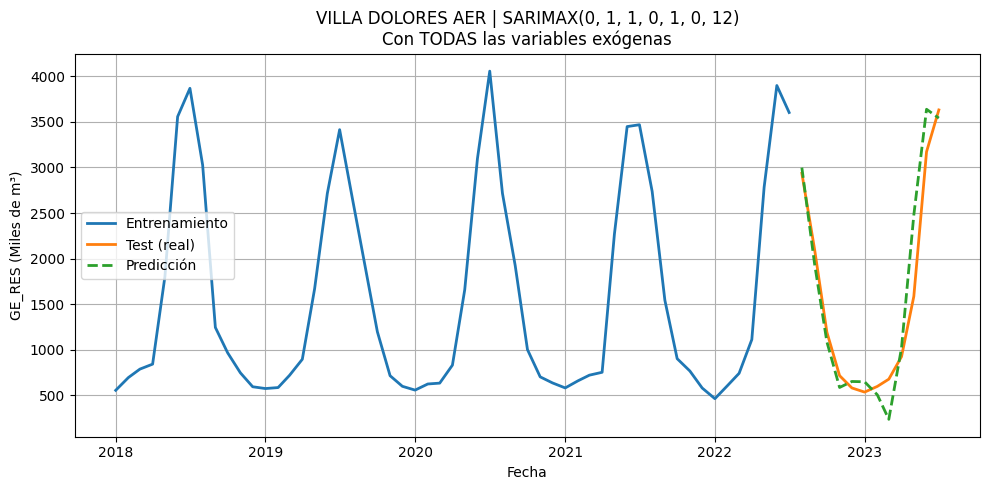

In [ ]:
# ===========================================
# 📌 GRAFICAR MODELO FINAL POR ESTACIÓN (TODAS LAS EXÓGENAS)
#       → con entrenamiento, test y predicción
# ===========================================

variable_objetivo = "GE_RES"
cols_exog_all = ['TEMP','HUM','PNM','FF','DD_sin','DD_cos']

def graficar_modelo_estacion(estacion, df_final, df_aux2, variable_objetivo):

    print(f"\n📌 Generando modelo final para estación: {estacion}")

    # Fila seleccionada del mejor modelo
    fila = df_final[df_final["estacion"] == estacion].iloc[0]

    # Orden SARIMAX
    orden = ast.literal_eval(fila["orden"])
    print(f"   → Orden elegido: {orden}")

    # Serie objetivo
    serie = df_aux2[variable_objetivo]

    # Datos de estación SMN
    df_est = df_smn[df_smn["ESTACION"] == estacion].set_index("MES_ANIO").asfreq("MS")

    # Fechas coincidentes
    fechas = serie.index.intersection(df_est.index)
    serie = serie.loc[fechas]
    df_est = df_est.loc[fechas]

    # Exógenas completas
    exog_all = df_est[cols_exog_all]

    # Dividir entrenamiento y test (12 meses)
    train = serie.iloc[:-12]
    test = serie.iloc[-12:]

    exog_train = exog_all.iloc[:-12]
    exog_test = exog_all.iloc[-12:]

    # Ajuste del modelo final
    model = SARIMAX(
        train,
        exog=exog_train,
        order=tuple(orden[:3]),
        seasonal_order=tuple(orden[3:]),
        enforce_stationarity=False,
        enforce_invertibility=False
    )

    fitted = model.fit(disp=False)

    # Predicción (12 pasos)
    pred = fitted.get_forecast(steps=12, exog=exog_test).predicted_mean

    # ================== GRÁFICO ==================
    plt.figure(figsize=(10,5))

    plt.plot(train, label="Entrenamiento", linewidth=2)
    plt.plot(test, label="Test (real)", linewidth=2)
    plt.plot(pred, '--', label="Predicción", linewidth=2)

    plt.title(f"{estacion} | SARIMAX{orden}\nCon TODAS las variables exógenas")
    plt.xlabel("Fecha")
    plt.ylabel("GE_RES (Miles de m³)")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


# ===========================================
# Ejecutar para todas las estaciones finales
# ===========================================
for estacion in df_final["estacion"].unique():
    graficar_modelo_estacion(estacion, df_final, df_aux2, variable_objetivo)


# GE_TOTAL

GE_TOTAL Y VARAIBLES EXÓGENAS DE A UNA  Y CON TODAS CON SARIMAX DE BASE (1,1,1)(1,1,1)12 CON MAE, RMSE, AIC Y BIC

Para cada estación:

Entrena uno por uno:

SARIMAX con TEMP

SARIMAX con HUM

SARIMAX con PNM

SARIMAX con FF

SARIMAX con DD (convertida a seno/coseno)

Luego entrena:

SARIMAX con todas las variables juntas

Todo usando únicamente:

order = (1,1,1)
seasonal_order = (1,1,1,12)


Al final se genera una tabla con todos los modelos, todas las estadísticas, tabla final ordenada para el informe



🏷️ Estación: CORDOBA AERO

📊 SARIMAX con una única exógena: TEMP


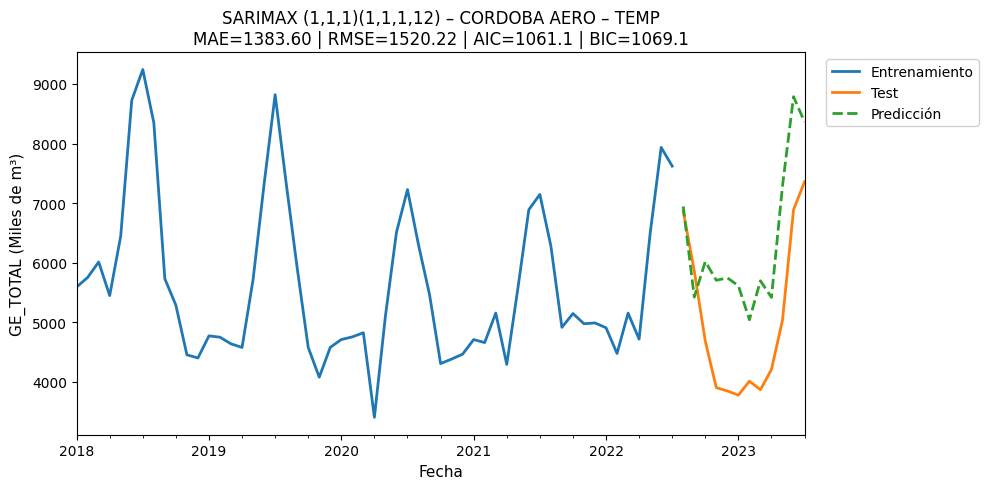


📊 SARIMAX con una única exógena: HUM


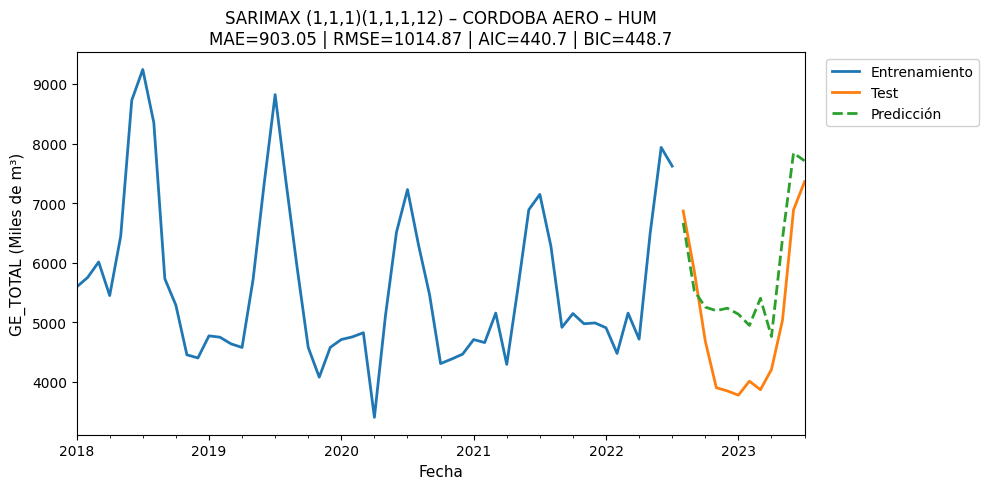


📊 SARIMAX con una única exógena: PNM


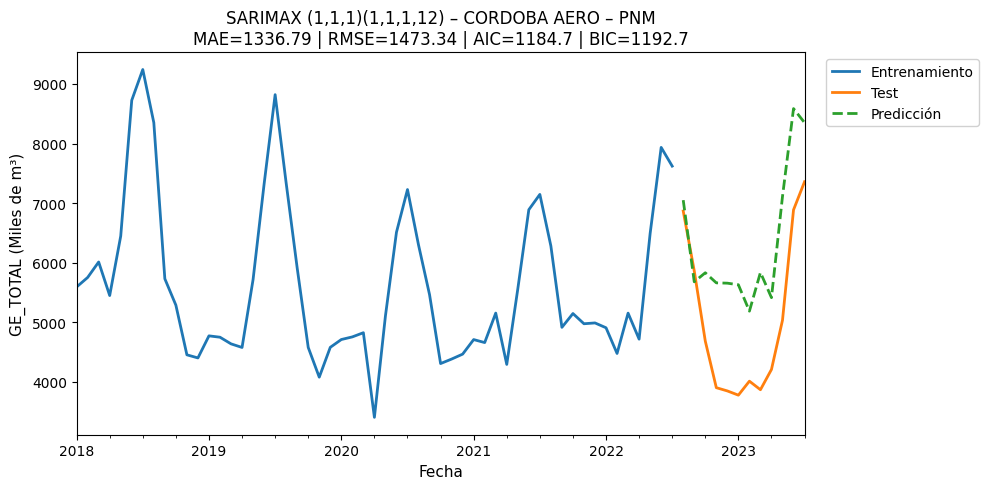


📊 SARIMAX con una única exógena: FF


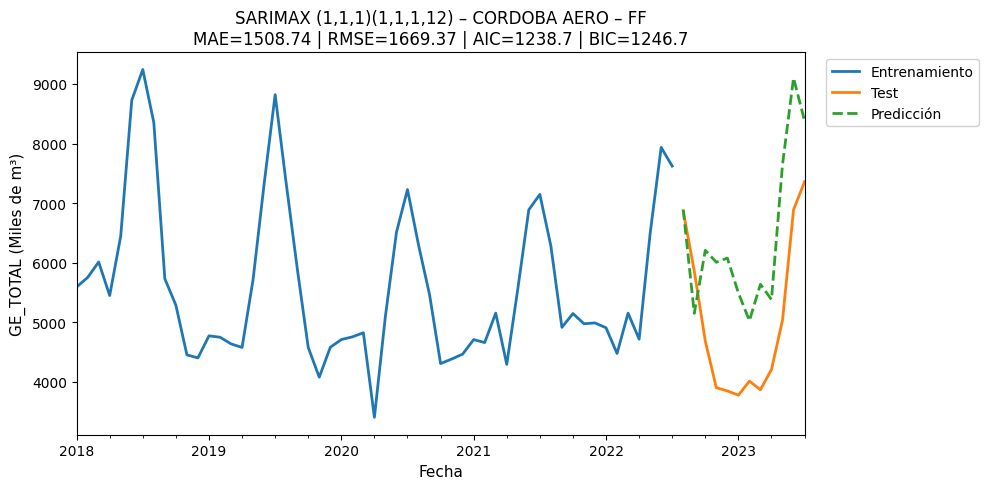


📊 SARIMAX con una única exógena: DD


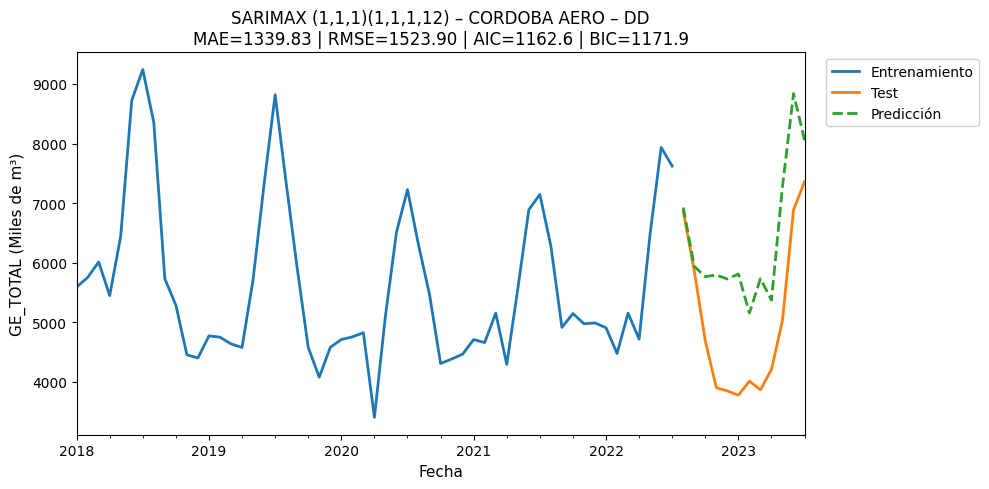


🌡️ SARIMAX con TODAS LAS VARIABLES CLIMÁTICAS


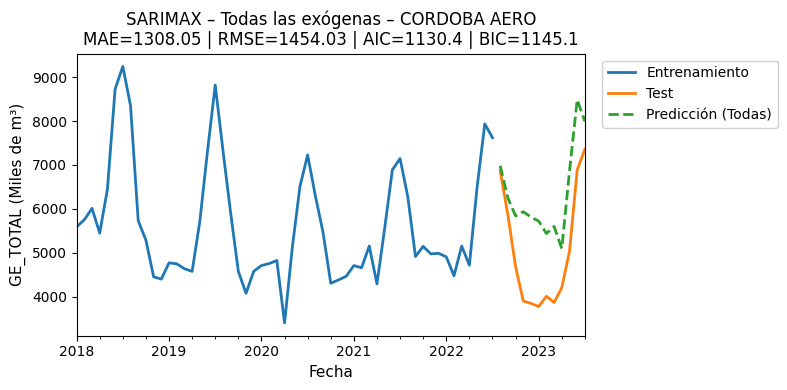



🏷️ Estación: CORDOBA OBSERVATO

📊 SARIMAX con una única exógena: TEMP


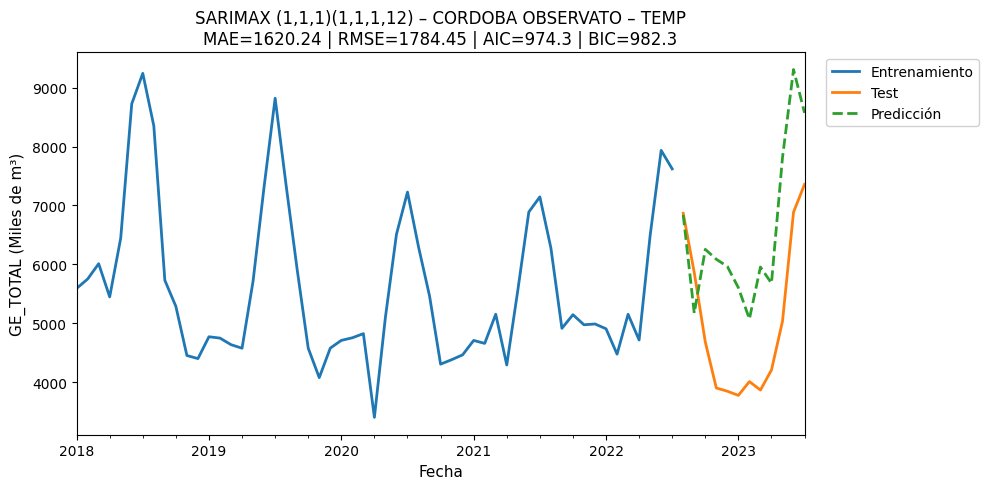


📊 SARIMAX con una única exógena: HUM


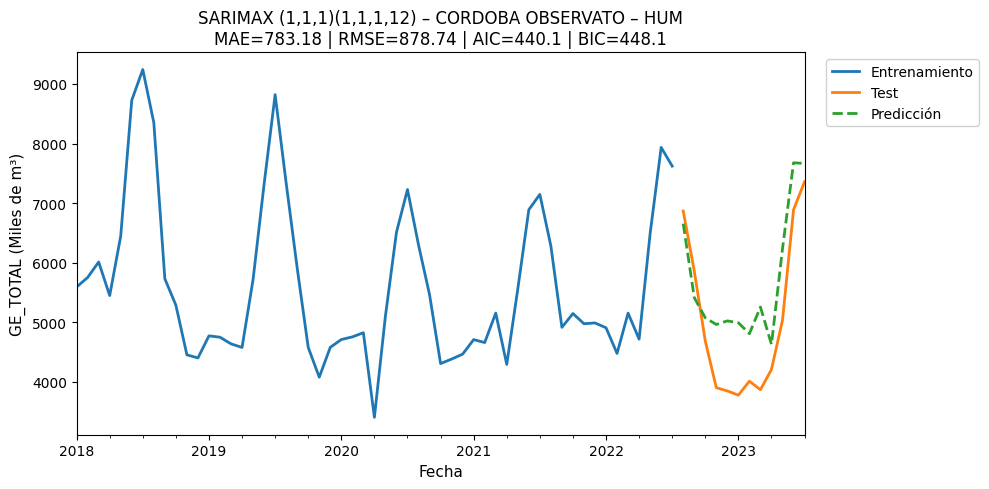


📊 SARIMAX con una única exógena: PNM


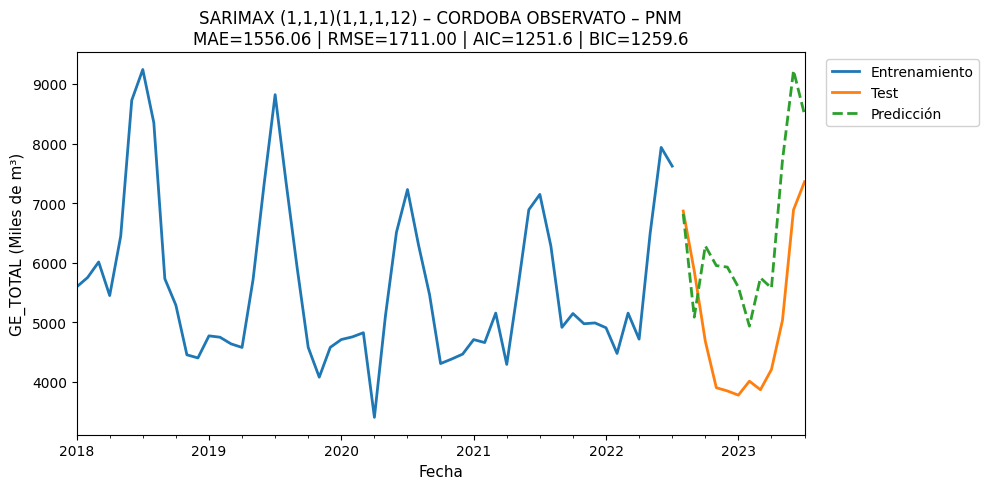


📊 SARIMAX con una única exógena: FF


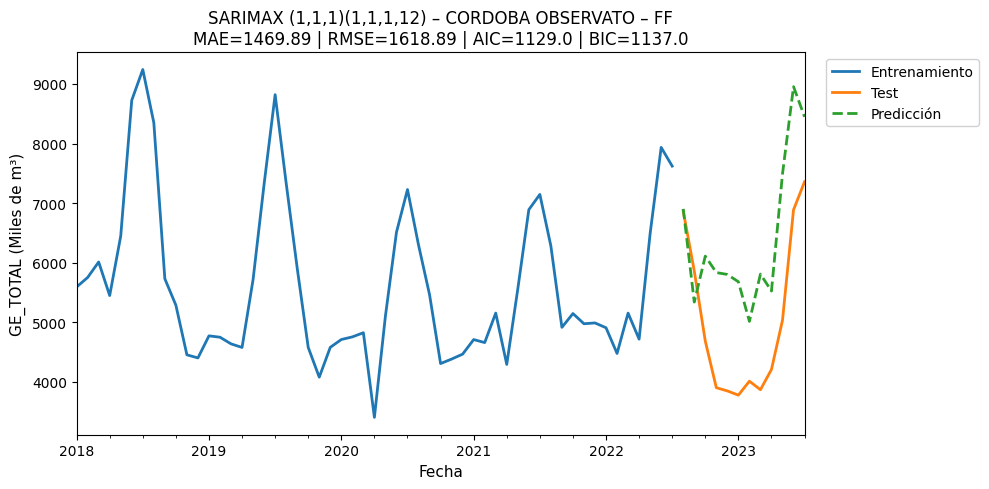


📊 SARIMAX con una única exógena: DD


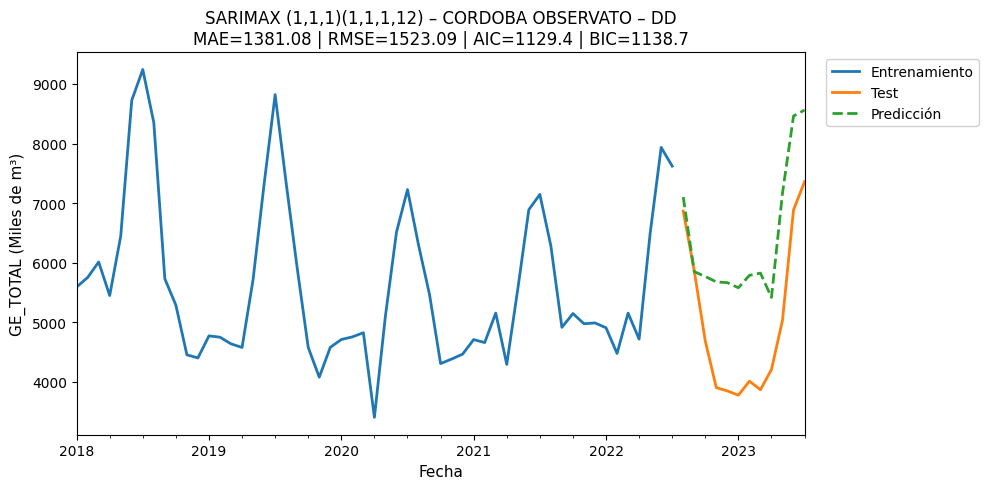


🌡️ SARIMAX con TODAS LAS VARIABLES CLIMÁTICAS


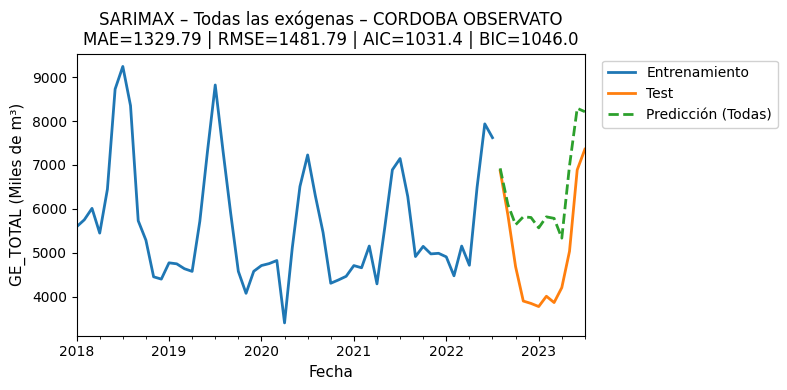



🏷️ Estación: ESCUELA DE AVIACI
⚠️ ESCUELA DE AVIACI tiene pocos datos (46 meses).


🏷️ Estación: LABOULAYE AERO

📊 SARIMAX con una única exógena: TEMP


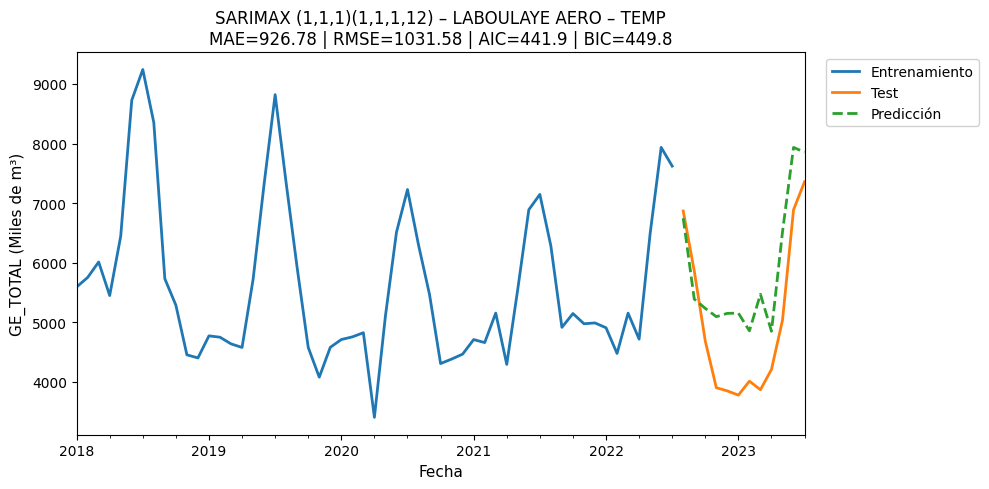


📊 SARIMAX con una única exógena: HUM


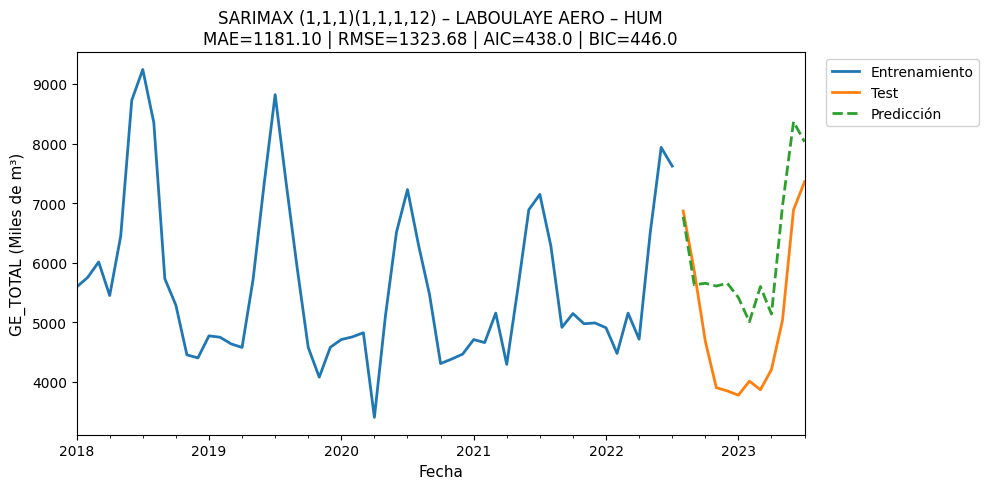


📊 SARIMAX con una única exógena: PNM


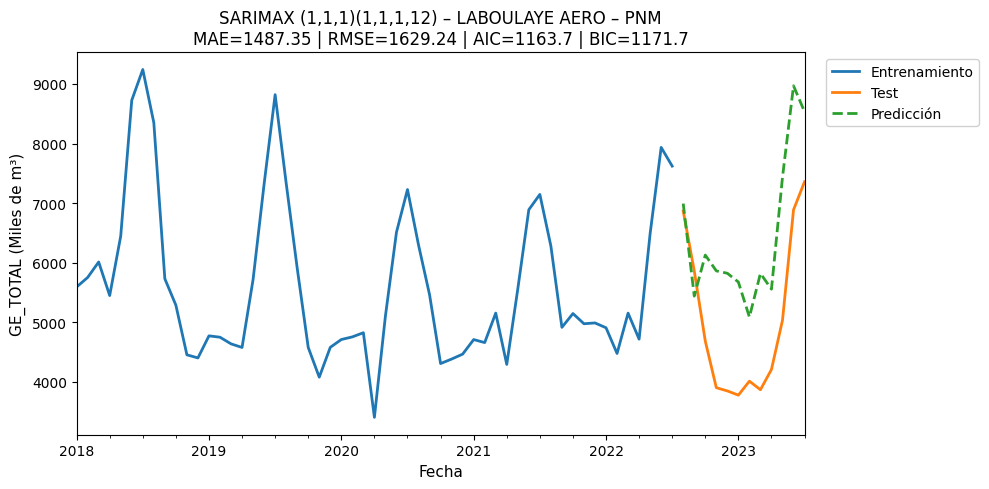


📊 SARIMAX con una única exógena: FF


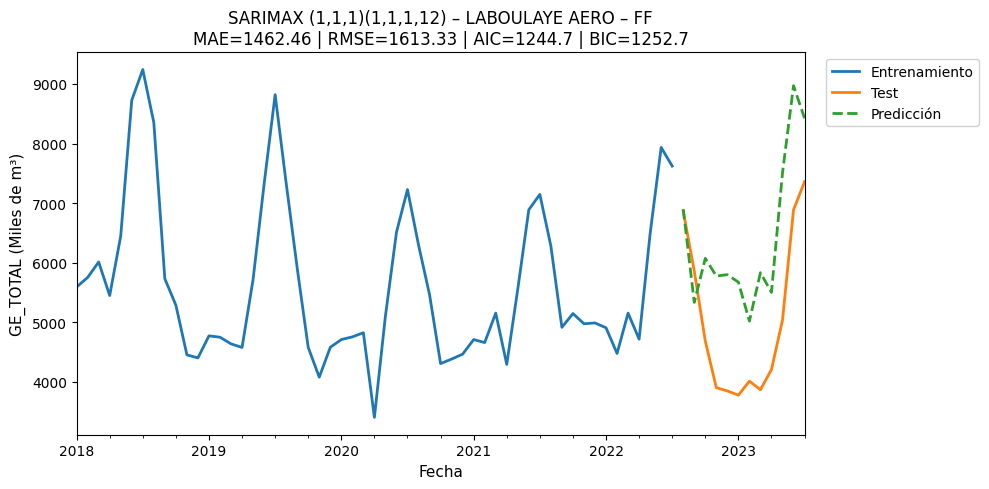


📊 SARIMAX con una única exógena: DD


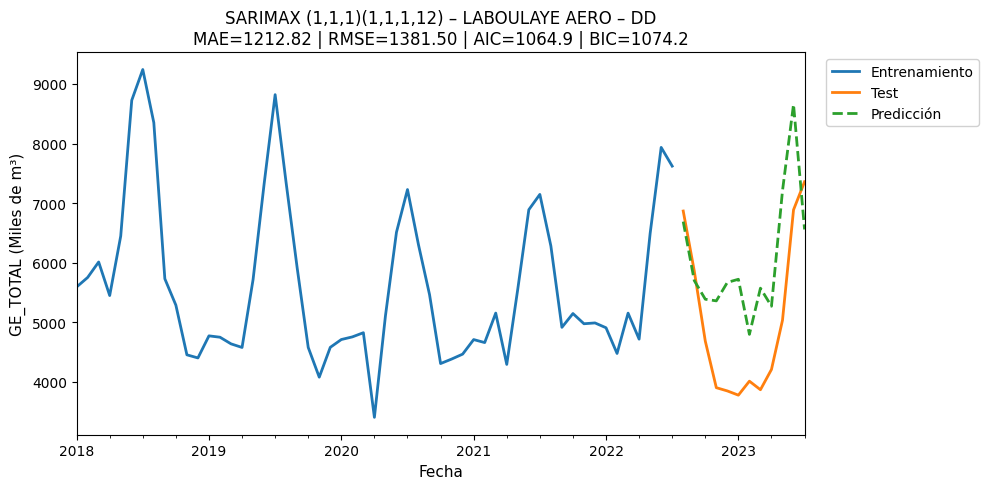


🌡️ SARIMAX con TODAS LAS VARIABLES CLIMÁTICAS


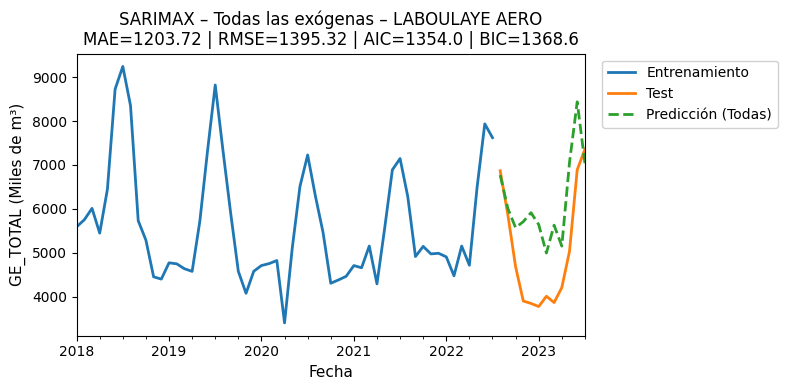



🏷️ Estación: MARCOS JUAREZ AER

📊 SARIMAX con una única exógena: TEMP


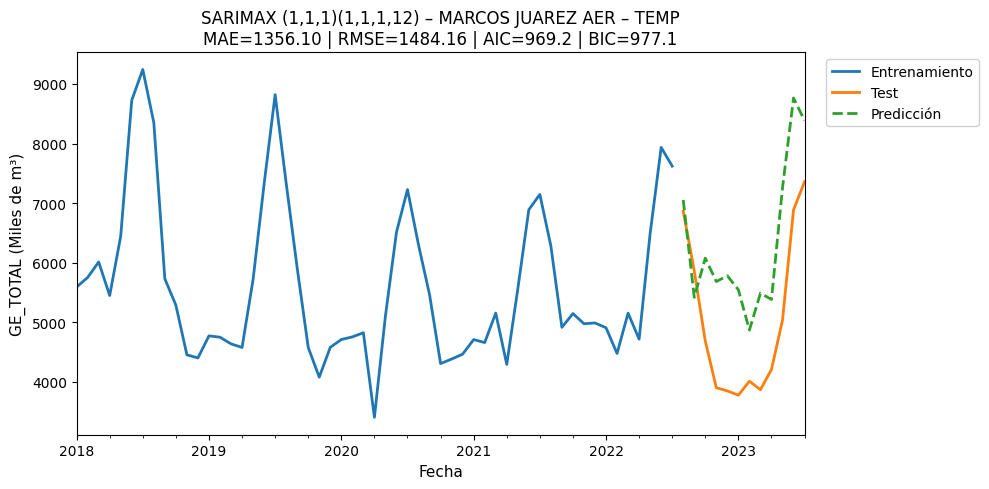


📊 SARIMAX con una única exógena: HUM


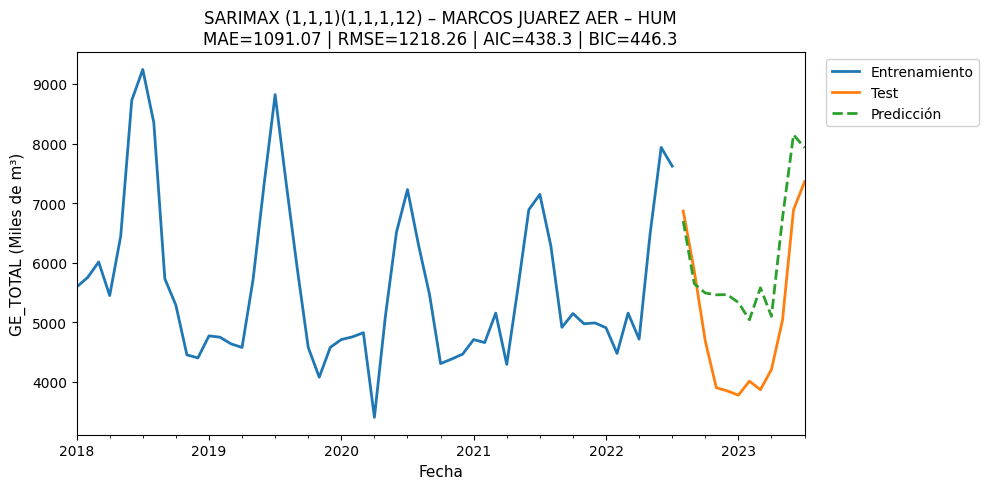


📊 SARIMAX con una única exógena: PNM


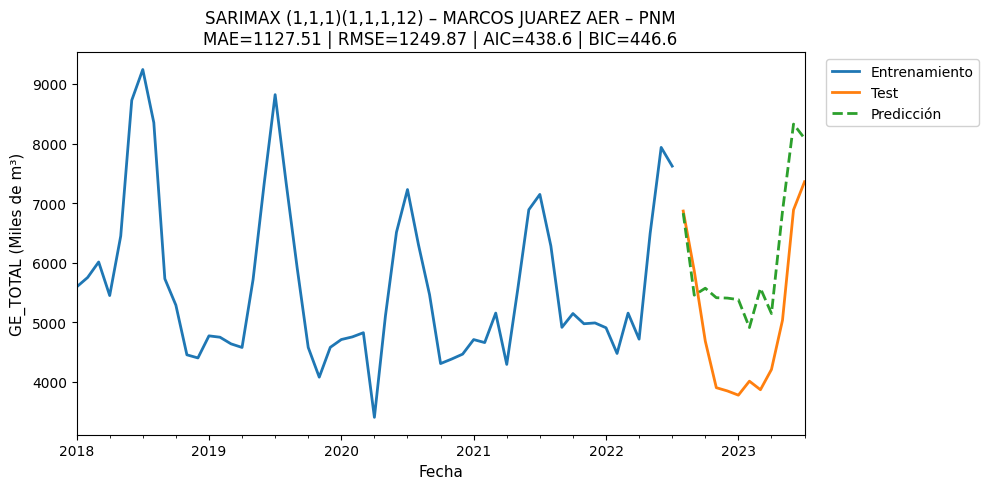


📊 SARIMAX con una única exógena: FF


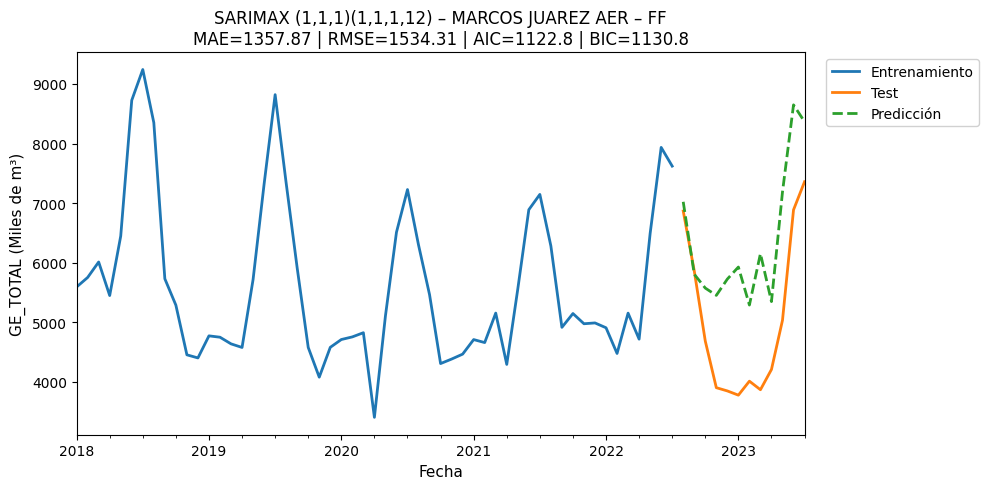


📊 SARIMAX con una única exógena: DD


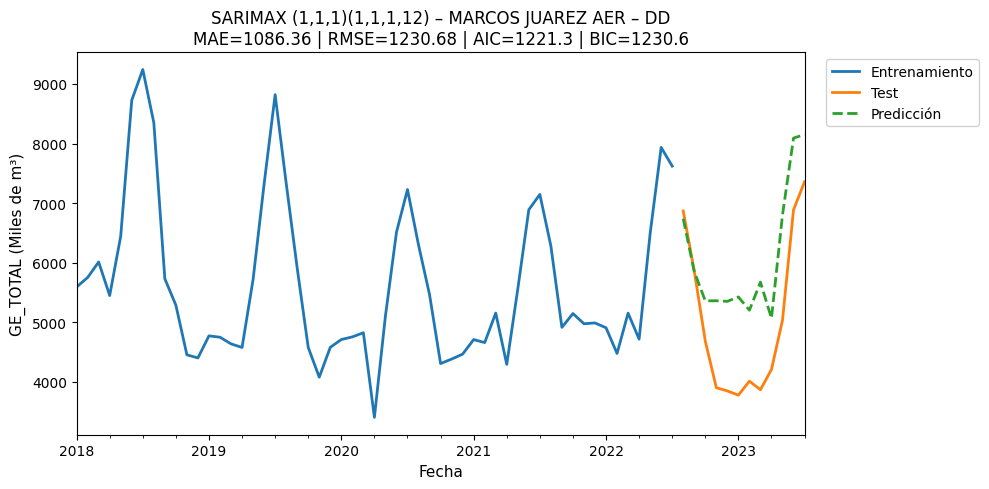


🌡️ SARIMAX con TODAS LAS VARIABLES CLIMÁTICAS


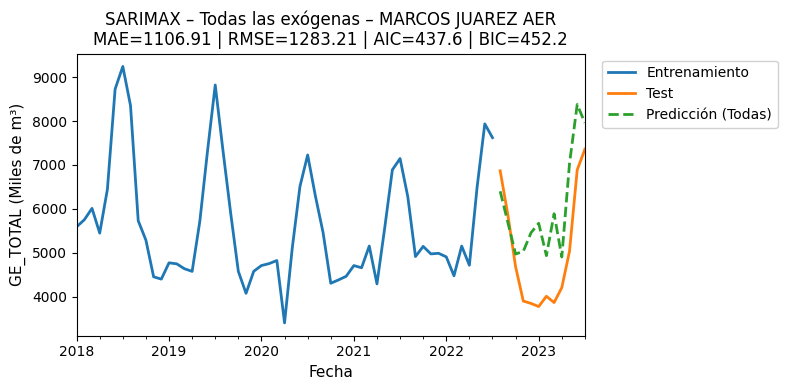



🏷️ Estación: PILAR OBSERVATORI
⚠️ PILAR OBSERVATORI tiene pocos datos (46 meses).


🏷️ Estación: RIO CUARTO AERO

📊 SARIMAX con una única exógena: TEMP


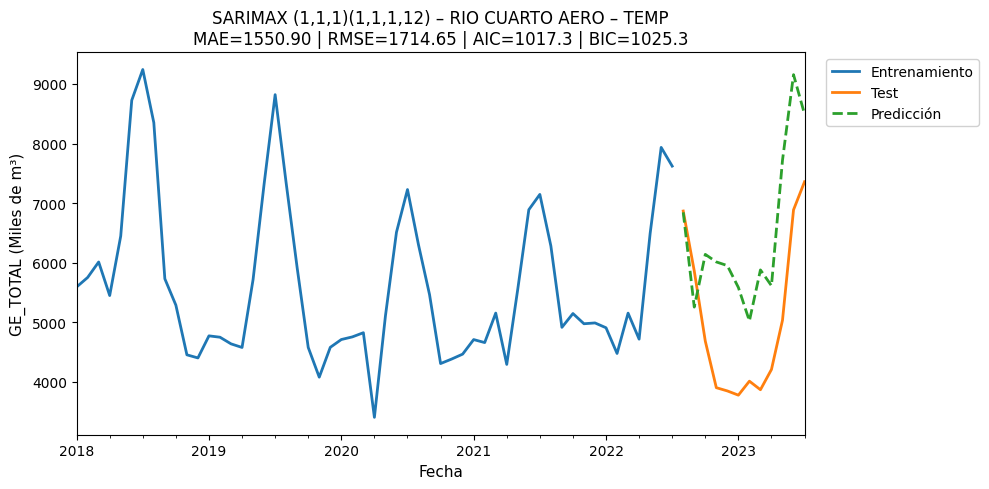


📊 SARIMAX con una única exógena: HUM


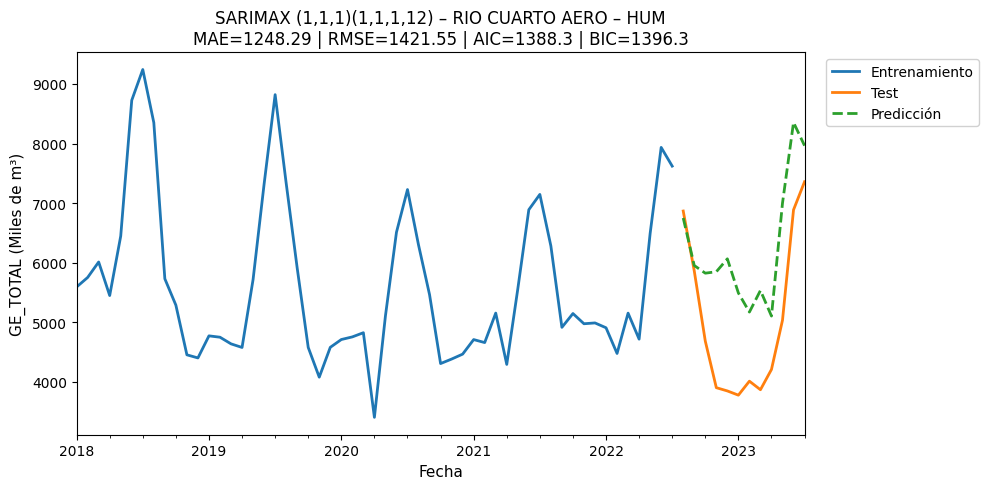


📊 SARIMAX con una única exógena: PNM


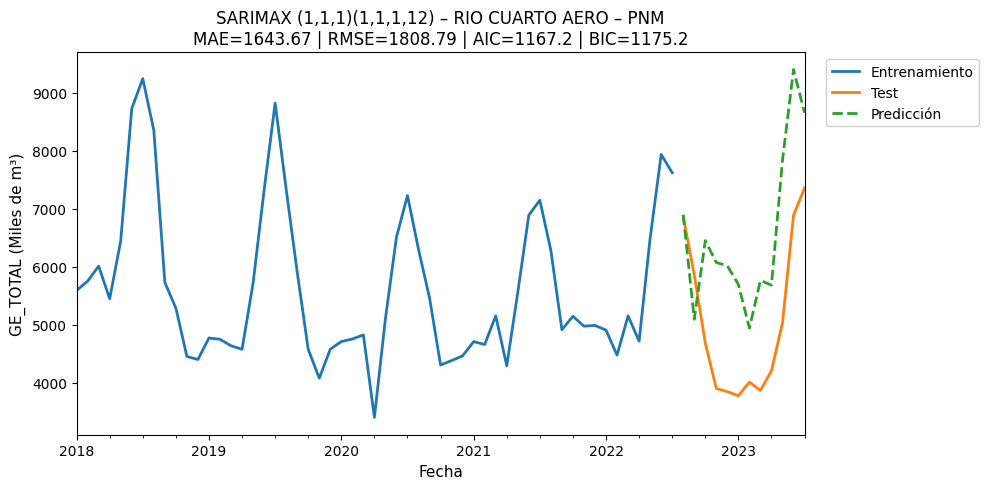


📊 SARIMAX con una única exógena: FF


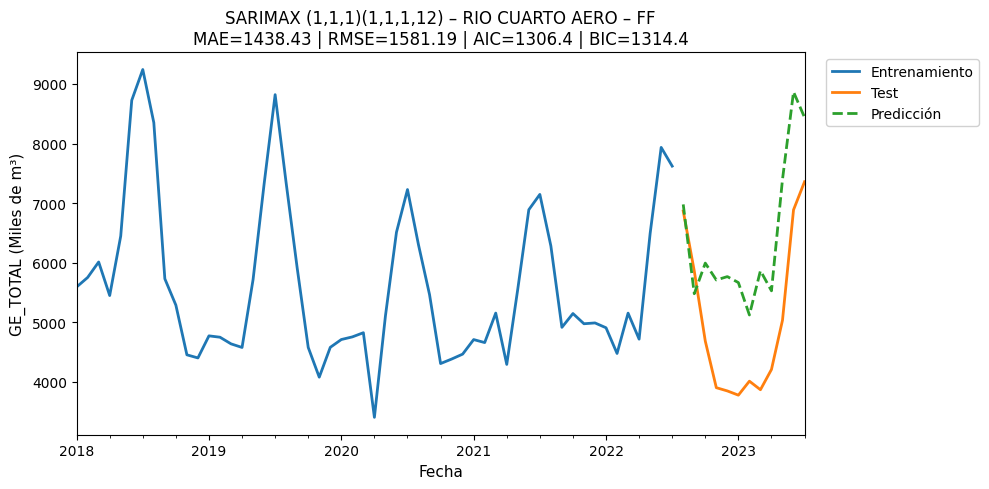


📊 SARIMAX con una única exógena: DD


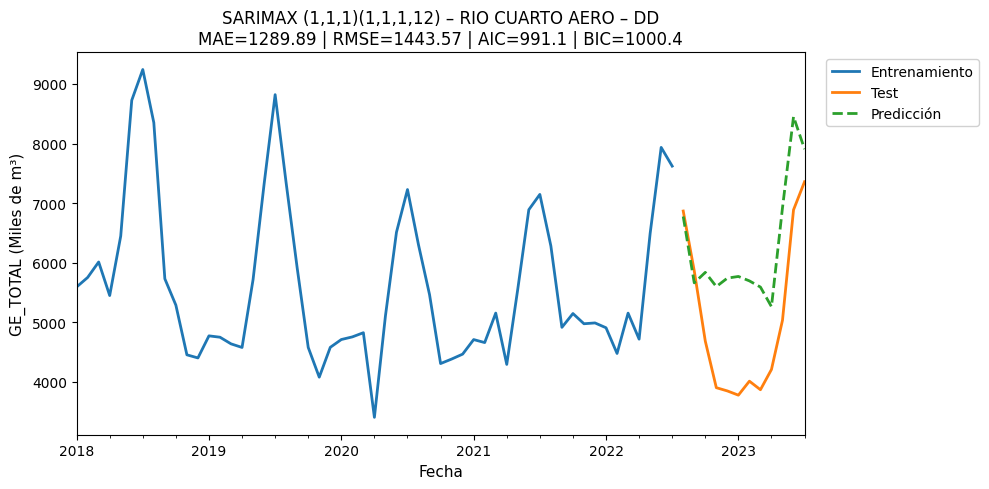


🌡️ SARIMAX con TODAS LAS VARIABLES CLIMÁTICAS


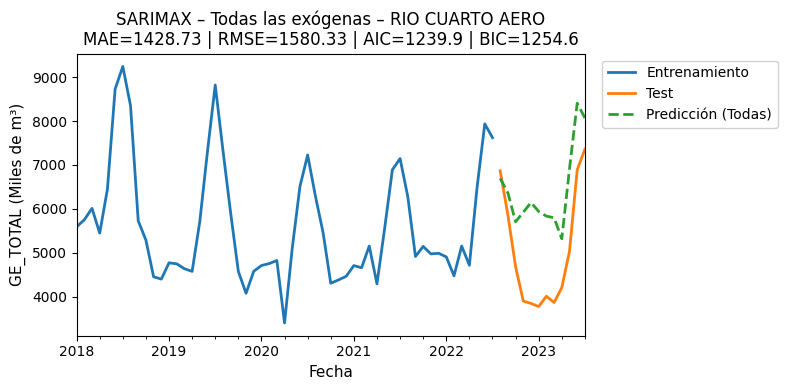



🏷️ Estación: VILLA DE MARIA DE
⚠️ VILLA DE MARIA DE tiene pocos datos (46 meses).


🏷️ Estación: VILLA DOLORES AER

📊 SARIMAX con una única exógena: TEMP


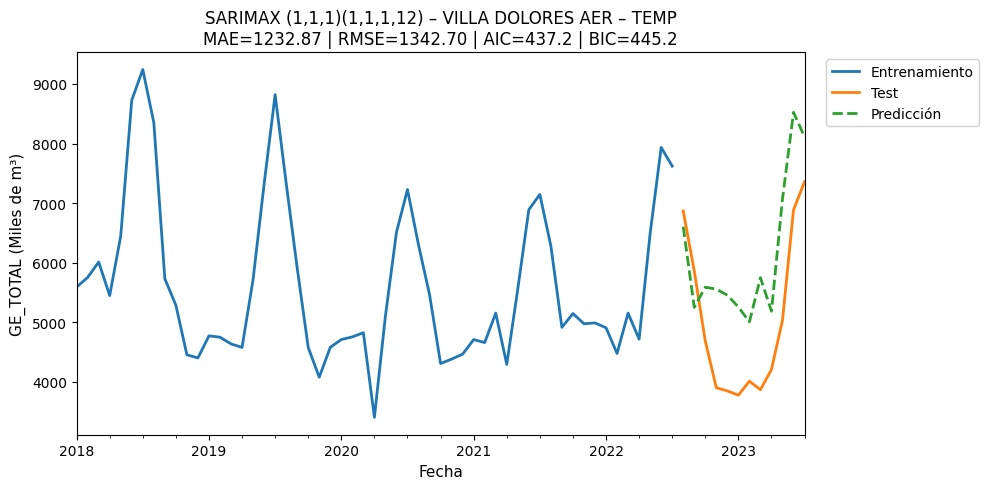


📊 SARIMAX con una única exógena: HUM


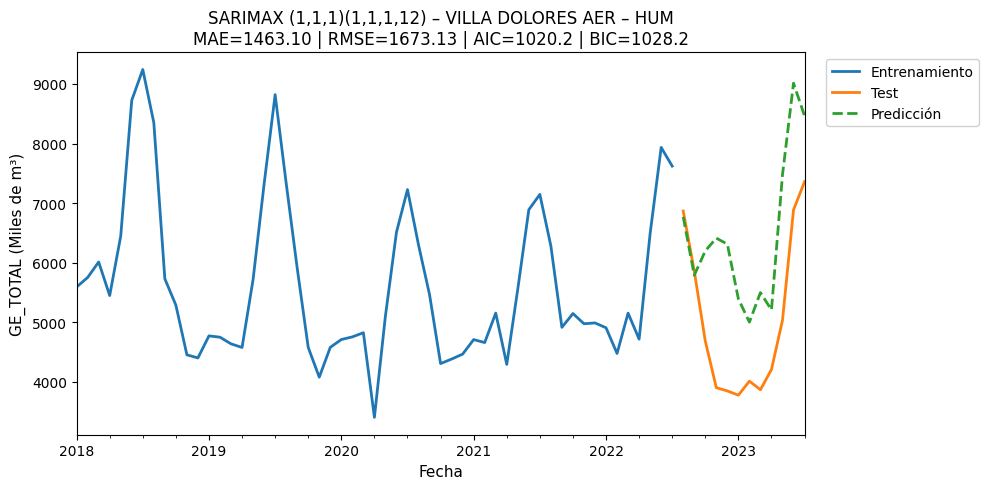


📊 SARIMAX con una única exógena: PNM


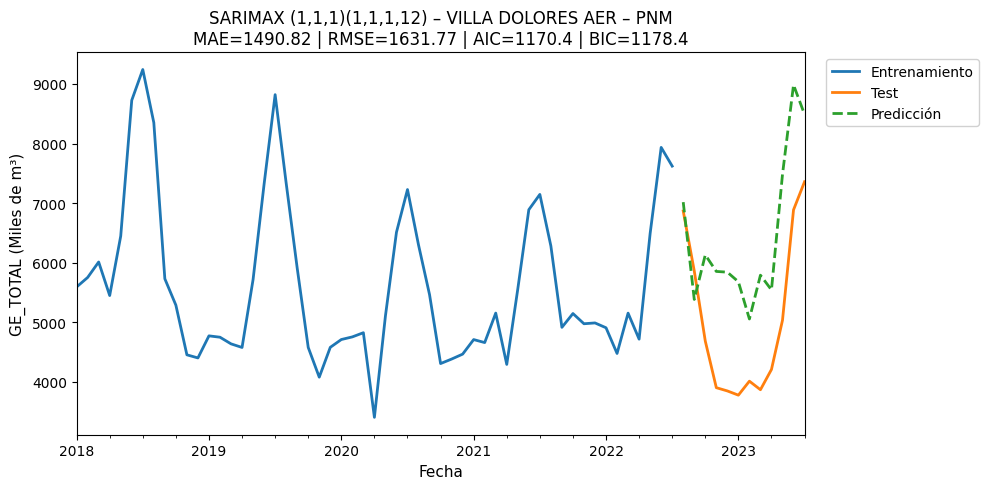


📊 SARIMAX con una única exógena: FF


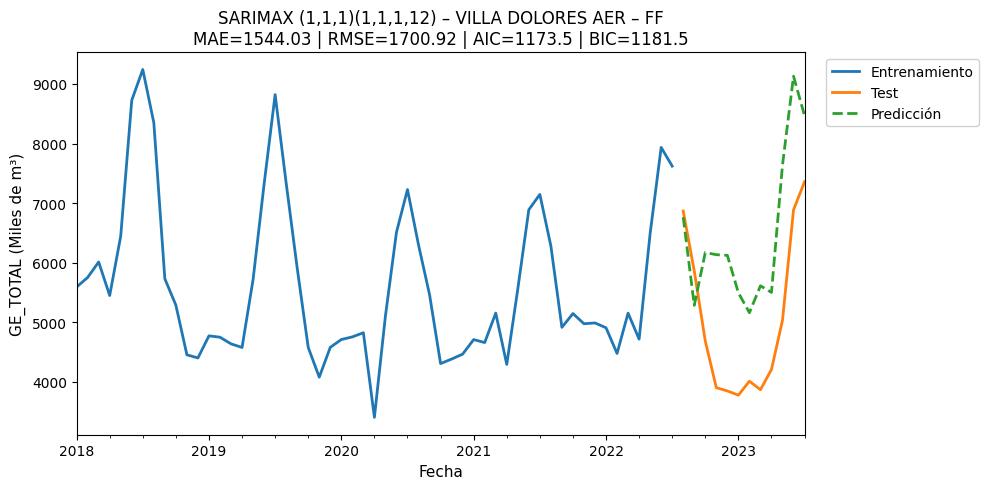


📊 SARIMAX con una única exógena: DD


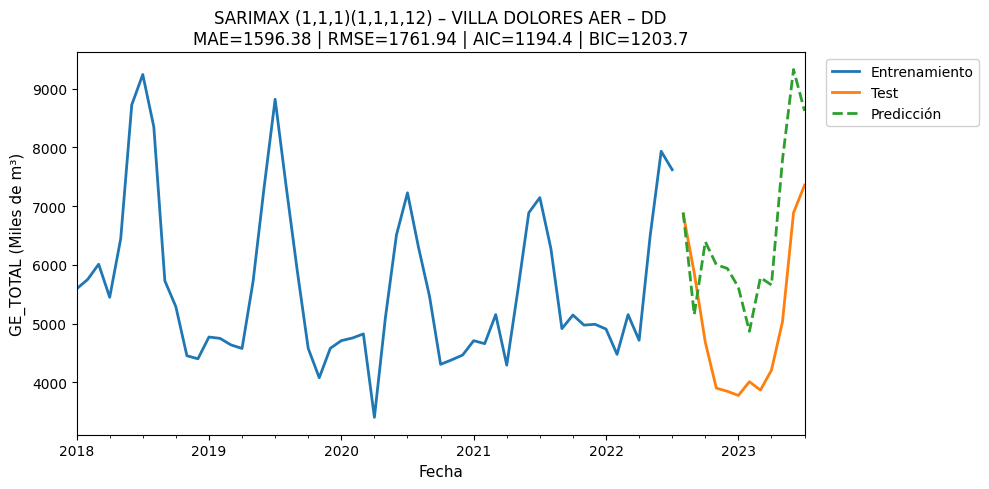


🌡️ SARIMAX con TODAS LAS VARIABLES CLIMÁTICAS


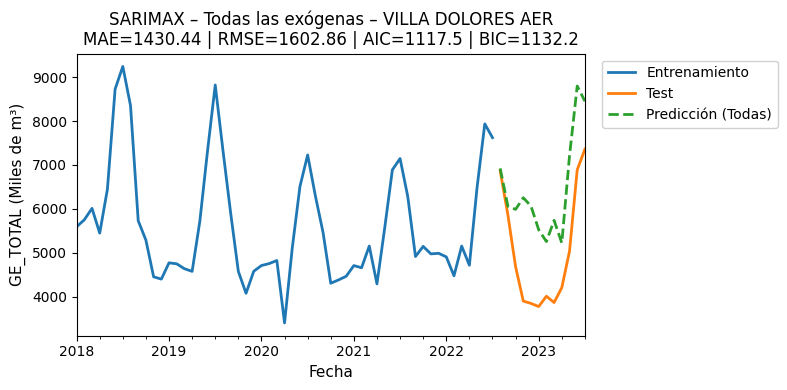


========== RESUMEN DE MODELOS ==========

             Estación Exógena          MAE         RMSE          AIC  \
0        CORDOBA AERO     HUM   903.053389  1014.868402   440.707501   
1        CORDOBA AERO     ALL  1308.050205  1454.030256  1130.402457   
2        CORDOBA AERO     PNM  1336.787597  1473.338946  1184.731487   
3        CORDOBA AERO      DD  1339.831309  1523.897153  1162.607190   
4        CORDOBA AERO    TEMP  1383.603632  1520.217892  1061.113001   
5        CORDOBA AERO      FF  1508.743789  1669.369878  1238.682631   
6   CORDOBA OBSERVATO     HUM   783.183178   878.742291   440.127613   
7   CORDOBA OBSERVATO     ALL  1329.790372  1481.786412  1031.353927   
8   CORDOBA OBSERVATO      DD  1381.075103  1523.090612  1129.420492   
9   CORDOBA OBSERVATO      FF  1469.886858  1618.892383  1129.005891   
10  CORDOBA OBSERVATO     PNM  1556.057043  1711.000996  1251.619081   
11  CORDOBA OBSERVATO    TEMP  1620.244038  1784.453369   974.284574   
12     LABOULAYE AERO

,Estación,Exógena,MAE,RMSE,AIC,BIC
0,CORDOBA AERO,HUM,903.053389,1014.868402,440.707501,448.700728
1,CORDOBA AERO,ALL,1308.050205,1454.030256,1130.402457,1145.056707
2,CORDOBA AERO,PNM,1336.787597,1473.338946,1184.731487,1192.724714
3,CORDOBA AERO,DD,1339.831309,1523.897153,1162.607190,1171.932621
4,CORDOBA AERO,TEMP,1383.603632,1520.217892,1061.113001,1069.106228
5,CORDOBA AERO,FF,1508.743789,1669.369878,1238.682631,1246.675858
6,CORDOBA OBSERVATO,HUM,783.183178,878.742291,440.127613,448.120840
7,CORDOBA OBSERVATO,ALL,1329.790372,1481.786412,1031.353927,1046.008177
8,CORDOBA OBSERVATO,DD,1381.075103,1523.090612,1129.420492,1138.745924
9,CORDOBA OBSERVATO,FF,1469.886858,1618.892383,1129.005891,1136.999118


In [ ]:
# ===========================================
# 1️⃣ IMPORTS
# ===========================================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.preprocessing import StandardScaler
import warnings
warnings.filterwarnings("ignore")

# ===========================================
# 2️⃣ PREPARACIÓN DE DATOS
# ===========================================
df_smn = df_smn.copy()
df_aux2 = df_aux2.copy()

df_smn['MES_ANIO'] = pd.to_datetime(df_smn['MES_ANIO'], errors='coerce')
df_aux2.index = pd.to_datetime(df_aux2.index, errors='coerce')

# Variables exógenas originales
cols_exog = ['TEMP','HUM','PNM','FF','DD']
for col in cols_exog:
    df_smn[col] = pd.to_numeric(df_smn[col], errors='coerce')

# DD → sin/cos
df_smn['DD_sin'] = np.sin(np.deg2rad(df_smn['DD']))
df_smn['DD_cos'] = np.cos(np.deg2rad(df_smn['DD']))

# Escalar exógenas
cols_exog_std = ['TEMP','HUM','PNM','FF','DD_sin','DD_cos']
scaler = StandardScaler()
df_smn[cols_exog_std] = scaler.fit_transform(df_smn[cols_exog_std])

# ===========================================
# 3️⃣ MODELOS SARIMAX FIJOS
# ===========================================
resultados_basicos = {}
estaciones_pocos_datos = []
min_meses = 48

order = (1,1,1)
seasonal_order = (1,1,1,12)

for estacion, df_estacion in df_smn.groupby('ESTACION'):

    print(f"\n\n==============================")
    print(f"🏷️ Estación: {estacion}")
    print("==============================")

    df_estacion = df_estacion.set_index('MES_ANIO').asfreq('MS')

    fecha_inicio = df_estacion.index.min()
    fecha_fin = df_estacion.index.max()

    df_gas_recorte = df_aux2.loc[(df_aux2.index >= fecha_inicio) &
                                 (df_aux2.index <= fecha_fin)]

    fechas_comunes = df_gas_recorte.index.intersection(df_estacion.index)
    df_gas_recorte = df_gas_recorte.loc[fechas_comunes]
    df_estacion = df_estacion.loc[fechas_comunes]

    if len(df_gas_recorte) < min_meses:
        print(f"⚠️ {estacion} tiene pocos datos ({len(df_gas_recorte)} meses).")
        estaciones_pocos_datos.append(estacion)
        continue

    # Serie objetivo
    serie = df_gas_recorte['GE_TOTAL']

    var_train = serie.iloc[:-12]
    var_test  = serie.iloc[-12:]

    # =====================================================
    # 3.1 ENTRENAMIENTO POR VARIABLE EXÓGENA
    # =====================================================
    for col in cols_exog:
        print(f"\n📊 SARIMAX con una única exógena: {col}")

        if col == 'DD':
            exog_train = df_estacion[['DD_sin', 'DD_cos']].iloc[:-12]
            exog_test  = df_estacion[['DD_sin', 'DD_cos']].iloc[-12:]
        else:
            exog_train = df_estacion[[col]].iloc[:-12]
            exog_test  = df_estacion[[col]].iloc[-12:]

        try:
            modelo = SARIMAX(
                var_train,
                exog=exog_train,
                order=order,
                seasonal_order=seasonal_order,
                enforce_stationarity=False,
                enforce_invertibility=False
            )
            res = modelo.fit(disp=False)
            pred = res.get_forecast(steps=12, exog=exog_test).predicted_mean

            mae = np.mean(np.abs(var_test - pred))
            rmse = np.sqrt(np.mean((var_test - pred)**2))
            aic = res.aic
            bic = res.bic

            resultados_basicos[(estacion, col)] = {
                'modelo': res,
                'pred': pred,
                'mae': mae,
                'rmse': rmse,
                'aic': aic,
                'bic': bic
            }

            # =======================
            # GRÁFICO DE RESULTADOS
            # =======================
            fig, ax = plt.subplots(figsize=(10, 5))

            var_train.plot(ax=ax, label='Entrenamiento', linewidth=2)
            var_test.plot(ax=ax, label='Test', linewidth=2)
            pred.plot(ax=ax, label='Predicción', linestyle='--', linewidth=2)

            ax.set_title(
                f"SARIMAX (1,1,1)(1,1,1,12) – {estacion} – {col}\n"
                f"MAE={mae:.2f} | RMSE={rmse:.2f} | AIC={aic:.1f} | BIC={bic:.1f}",
                fontsize=12,

            )

            ax.set_ylabel("GE_TOTAL (Miles de m³)", fontsize=11)
            ax.set_xlabel("Fecha", fontsize=11)



            ax.legend(
                loc='upper left',
                bbox_to_anchor=(1.02, 1),
                frameon=True,
                framealpha=0.9
            )

            plt.tight_layout()
            plt.show()

        except Exception as e:
            print(f"❌ Error al ajustar modelo con {col}: {e}")

    # =====================================================
    # 3.2 ENTRENAMIENTO CON TODAS LAS EXÓGENAS
    # =====================================================
    print(f"\n🌡️ SARIMAX con TODAS LAS VARIABLES CLIMÁTICAS")

    exog_cols_all = ['TEMP','HUM','PNM','FF','DD_sin','DD_cos']

    exog_train = df_estacion[exog_cols_all].iloc[:-12]
    exog_test  = df_estacion[exog_cols_all].iloc[-12:]

    try:
        modelo = SARIMAX(
            var_train,
            exog=exog_train,
            order=order,
            seasonal_order=seasonal_order,
            enforce_stationarity=False,
            enforce_invertibility=False
        )
        res = modelo.fit(disp=False)
        pred = res.get_forecast(steps=12, exog=exog_test).predicted_mean

        mae = np.mean(np.abs(var_test - pred))
        rmse = np.sqrt(np.mean((var_test - pred)**2))
        aic = res.aic
        bic = res.bic

        resultados_basicos[(estacion, 'ALL')] = {
            'modelo': res,
            'pred': pred,
            'mae': mae,
            'rmse': rmse,
            'aic': aic,
            'bic': bic
        }

        # =======================
        # GRÁFICO – TODAS LAS EXÓGENAS
        # =======================
        fig, ax = plt.subplots(figsize=(8, 4))

        var_train.plot(ax=ax, label='Entrenamiento', linewidth=2)
        var_test.plot(ax=ax, label='Test', linewidth=2)
        pred.plot(ax=ax, label='Predicción (Todas)', linestyle='--', linewidth=2)

        ax.set_title(
            f"SARIMAX – Todas las exógenas – {estacion}\n"
            f"MAE={mae:.2f} | RMSE={rmse:.2f} | AIC={aic:.1f} | BIC={bic:.1f}",
            fontsize=12,

        )

        ax.set_ylabel("GE_TOTAL (Miles de m³)", fontsize=11)
        ax.set_xlabel("Fecha", fontsize=11)


        ax.legend(
            loc='upper left',
            bbox_to_anchor=(1.02, 1),
            frameon=True,
            framealpha=0.9
        )

        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"❌ Error con todas las exógenas: {e}")

# =======================================================
# TABLA DE RESULTADOS COMPARATIVA
# =======================================================
print("\n========== RESUMEN DE MODELOS ==========\n")

tabla_resultados = pd.DataFrame([
    {
        'Estación': k[0],
        'Exógena': k[1],
        'MAE': v.get('mae'),
        'RMSE': v.get('rmse'),
        'AIC': v.get('aic'),
        'BIC': v.get('bic')
    }
    for k, v in resultados_basicos.items()
])

tabla_resultados = tabla_resultados.sort_values(['Estación','MAE']).reset_index(drop=True)

print(tabla_resultados)

from IPython.display import display
display(tabla_resultados)


## GE_TOTAL y VARIABLES EXÓGENAS DE A UNA Y BÚSQUEDA DE PARÁMETROS



In [ ]:
# ======================================================
# 1️⃣ IMPORTS
# ======================================================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.preprocessing import StandardScaler
import warnings
warnings.filterwarnings("ignore")

# ======================================================
# 2️⃣ CONFIGURACIÓN GENERAL
# ======================================================

df_smn = df_smn.copy()
df_aux2 = df_aux2.copy()

# Fechas
df_smn["MES_ANIO"] = pd.to_datetime(df_smn["MES_ANIO"], errors="coerce")
df_aux2.index = pd.to_datetime(df_aux2.index, errors="coerce")

# Variables exógenas
cols_exog = ["TEMP", "HUM", "PNM", "FF", "DD"]
for col in cols_exog:
    df_smn[col] = pd.to_numeric(df_smn[col], errors="coerce")

# Dirección del viento → sen/cos
df_smn["DD_sin"] = np.sin(np.deg2rad(df_smn["DD"]))
df_smn["DD_cos"] = np.cos(np.deg2rad(df_smn["DD"]))

# Todas las columnas exógenas posibles
cols_exog_all = ["TEMP", "HUM", "PNM", "FF", "DD_sin", "DD_cos"]

# Escalado
scaler = StandardScaler()
df_smn[cols_exog_all] = scaler.fit_transform(df_smn[cols_exog_all])

# ======================================================
# 3️⃣ BÚSQUEDA DE PARÁMETROS PARA GE_TOTAL
# ======================================================

param_grid = [
    (p, d, q, P, D, Q, s)
    for p in [0, 1]
    for d in [1]
    for q in [0, 1]
    for P in [0, 1]
    for D in [1]
    for Q in [0, 1]
    for s in [12]
]

min_meses = 48
resultados = {}

for estacion, df_est in df_smn.groupby("ESTACION"):

    print(f"\n🏷️ Estación: {estacion}")

    df_est = df_est.set_index("MES_ANIO").asfreq("MS")

    inicio, fin = df_est.index.min(), df_est.index.max()
    df_gas = df_aux2.loc[(df_aux2.index >= inicio) & (df_aux2.index <= fin)]

    fechas = df_gas.index.intersection(df_est.index)
    df_gas = df_gas.loc[fechas]
    df_est = df_est.loc[fechas]

    if len(df_gas) < min_meses:
        print(f"⚠️ {estacion}: pocos datos ({len(df_gas)} meses). Salteada.")
        continue

    serie = df_gas["GE_TOTAL"]

    if serie.std() < 1e-3:
        print(f"⚠️ {estacion}: serie casi constante. Salteada.")
        continue

    train = serie.iloc[:-12]
    test  = serie.iloc[-12:]

    todos_modelos = []

    for col in cols_exog:

        print(f"   → Variable exógena: {col}")

        if col == "DD":
            exog_train = df_est[["DD_sin", "DD_cos"]].iloc[:-12]
            exog_test  = df_est[["DD_sin", "DD_cos"]].iloc[-12:]
        else:
            exog_train = df_est[[col]].iloc[:-12]
            exog_test  = df_est[[col]].iloc[-12:]

        for (p, d, q, P, D, Q, s) in param_grid:
            try:
                modelo = SARIMAX(
                    train,
                    exog=exog_train,
                    order=(p, d, q),
                    seasonal_order=(P, D, Q, s),
                    enforce_stationarity=False,
                    enforce_invertibility=False
                )

                ajuste = modelo.fit(disp=False)
                pred = ajuste.get_forecast(steps=12, exog=exog_test).predicted_mean

                mae  = np.mean(np.abs(test - pred))
                rmse = np.sqrt(np.mean((test - pred) ** 2))
                aic  = ajuste.aic
                bic  = ajuste.bic

                todos_modelos.append({
                    "estacion": estacion,
                    "variable": col,
                    "orden": (p, d, q, P, D, Q, s),
                    "mae": mae,
                    "rmse": rmse,
                    "aic": aic,
                    "bic": bic
                })

            except Exception:
                continue

    if todos_modelos:
        df_temp = pd.DataFrame(todos_modelos)
        resultados[estacion] = df_temp.sort_values("rmse").head(10)

# ======================================================
# 4️⃣ GUARDAR EXCEL (TOP-10 POR ESTACIÓN)
# ======================================================

writer = pd.ExcelWriter("resumen_mejores_GE_TOTAL.xlsx", engine="openpyxl")

for est, df_top in resultados.items():
    df_top.to_excel(writer, sheet_name=est[:31], index=False)

writer.close()

print("\n📁 Archivo generado: resumen_mejores_GE_TOTAL.xlsx")

# ======================================================
# 5️⃣ SELECCIÓN DEL MEJOR MODELO FINAL POR ESTACIÓN
# ======================================================

seleccion_final = []

for estacion, df_top in resultados.items():
    fila = df_top.loc[df_top["rmse"].idxmin()].copy()
    fila["estacion"] = estacion
    seleccion_final.append(fila)

df_final = pd.DataFrame(seleccion_final)

df_final.to_excel("seleccion_final_por_estacion_GE_TOTAL.xlsx", index=False)

print("\n🏆 Archivo con mejores modelos finales:")
print("👉 seleccion_final_por_estacion_GE_TOTAL.xlsx")



🏷️ Estación: CORDOBA AERO
   → Variable exógena: TEMP
   → Variable exógena: HUM
   → Variable exógena: PNM
   → Variable exógena: FF
   → Variable exógena: DD

🏷️ Estación: CORDOBA OBSERVATO
   → Variable exógena: TEMP
   → Variable exógena: HUM
   → Variable exógena: PNM
   → Variable exógena: FF
   → Variable exógena: DD

🏷️ Estación: ESCUELA DE AVIACI
⚠️ ESCUELA DE AVIACI: pocos datos (46 meses). Salteada.

🏷️ Estación: LABOULAYE AERO
   → Variable exógena: TEMP
   → Variable exógena: HUM
   → Variable exógena: PNM
   → Variable exógena: FF
   → Variable exógena: DD

🏷️ Estación: MARCOS JUAREZ AER
   → Variable exógena: TEMP
   → Variable exógena: HUM
   → Variable exógena: PNM
   → Variable exógena: FF
   → Variable exógena: DD

🏷️ Estación: PILAR OBSERVATORI
⚠️ PILAR OBSERVATORI: pocos datos (46 meses). Salteada.

🏷️ Estación: RIO CUARTO AERO
   → Variable exógena: TEMP
   → Variable exógena: HUM
   → Variable exógena: PNM
   → Variable exógena: FF
   → Variable exógena: DD

🏷️ 


📈 Generando gráficos finales por estación (GE_TOTAL)...

📍 Estación: CORDOBA AERO — variable exógena: TEMP


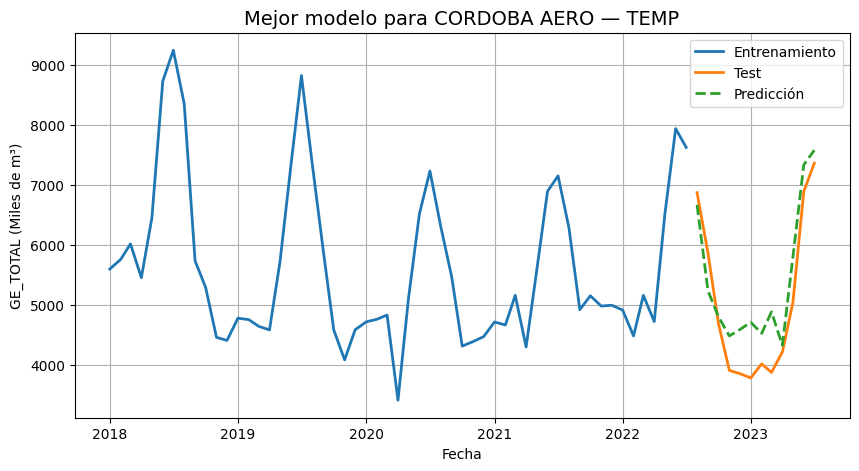


📍 Estación: CORDOBA OBSERVATO — variable exógena: HUM


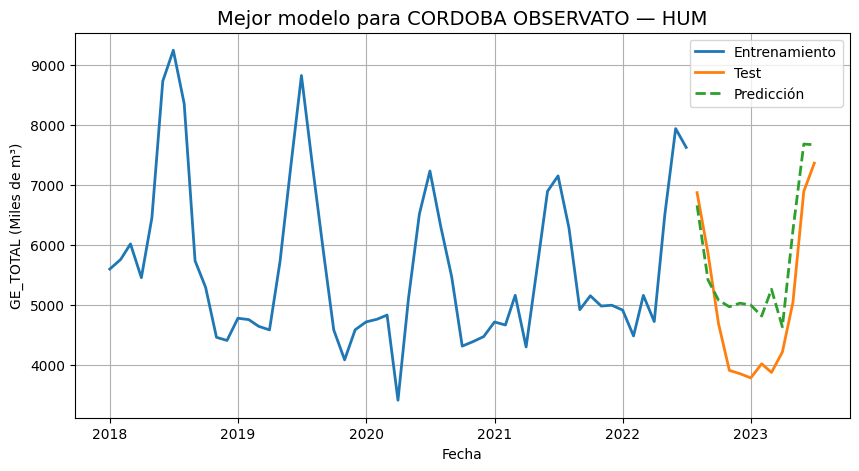


📍 Estación: LABOULAYE AERO — variable exógena: TEMP


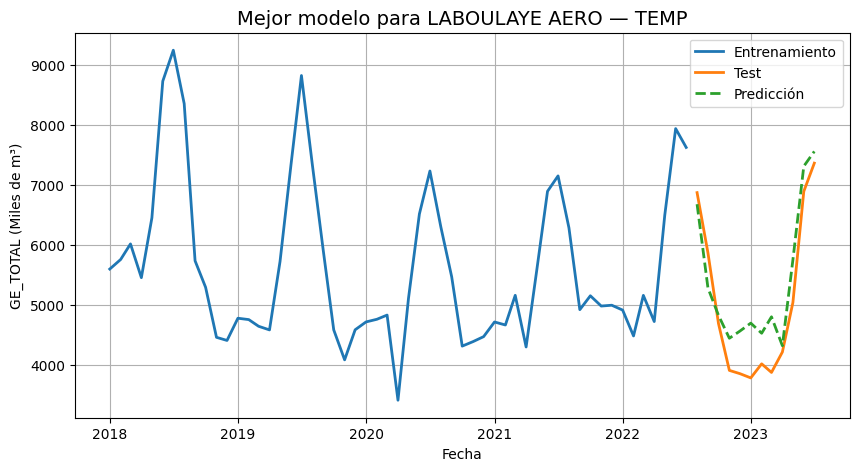


📍 Estación: MARCOS JUAREZ AER — variable exógena: HUM


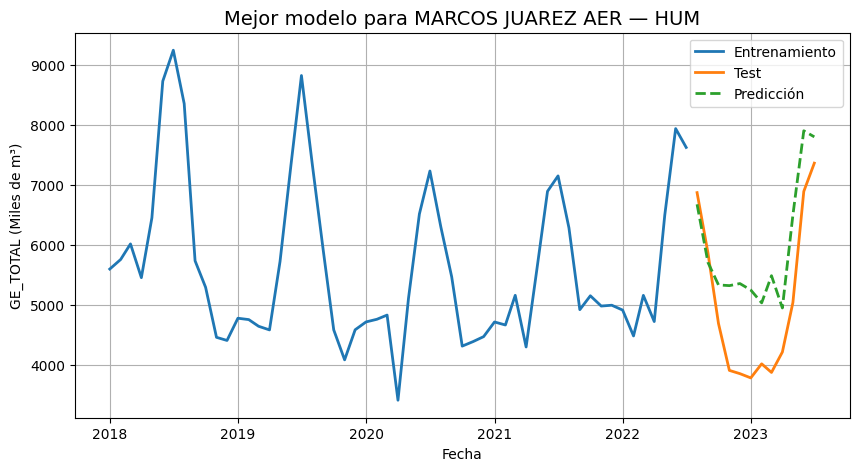


📍 Estación: RIO CUARTO AERO — variable exógena: DD


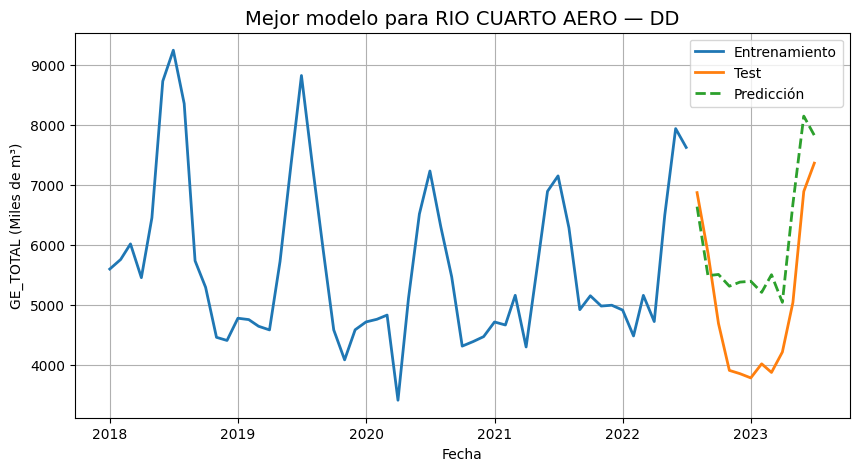


📍 Estación: VILLA DOLORES AER — variable exógena: DD


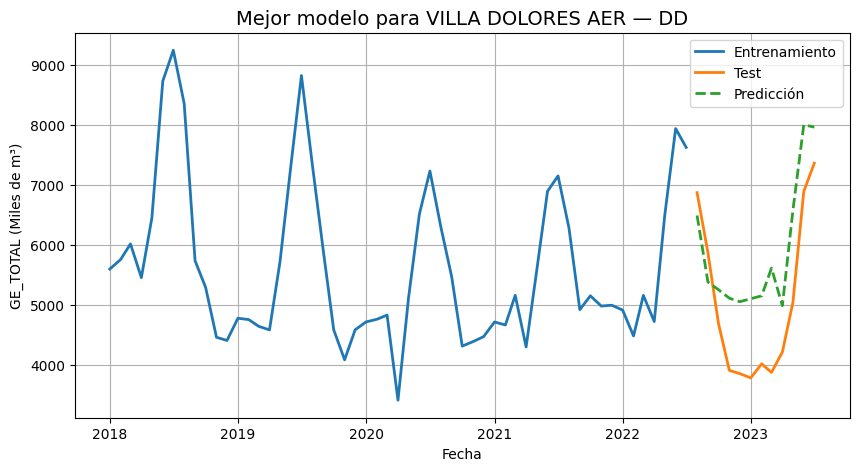

In [ ]:
# ======================================================
# 6️⃣ GRAFICAR EL MEJOR MODELO POR ESTACIÓN (GE_TOTAL)
# ======================================================

import ast
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX

df_final = pd.read_excel("seleccion_final_por_estacion_GE_TOTAL.xlsx")

variable_gas = "GE_TOTAL"

print("\n📈 Generando gráficos finales por estación (GE_TOTAL)...")

for i, fila in df_final.iterrows():

    estacion = fila["estacion"]
    orden = ast.literal_eval(fila["orden"])
    variable_exog = fila["variable"]

    print(f"\n📍 Estación: {estacion} — variable exógena: {variable_exog}")

    # --- Preparar datos ---
    df_est = df_smn[df_smn["ESTACION"] == estacion].copy()
    df_est = df_est.set_index("MES_ANIO").asfreq("MS")

    inicio, fin = df_est.index.min(), df_est.index.max()
    df_gas = df_aux2.loc[(df_aux2.index >= inicio) & (df_aux2.index <= fin)]

    fechas = df_gas.index.intersection(df_est.index)
    df_est = df_est.loc[fechas]
    df_gas = df_gas.loc[fechas]

    serie = df_gas[variable_gas]

    # División train–test
    train = serie.iloc[:-12]
    test  = serie.iloc[-12:]

    # --- Exógena correspondiente ---
    if variable_exog == "DD":
        exog_train = df_est[["DD_sin", "DD_cos"]].iloc[:-12]
        exog_test  = df_est[["DD_sin", "DD_cos"]].iloc[-12:]
    else:
        exog_train = df_est[[variable_exog]].iloc[:-12]
        exog_test  = df_est[[variable_exog]].iloc[-12:]

    # --- Entrenar modelo final ---
    modelo = SARIMAX(
        train,
        exog=exog_train,
        order=orden[:3],
        seasonal_order=orden[3:],
        enforce_stationarity=False,
        enforce_invertibility=False
    ).fit(disp=False)

    pred = modelo.get_forecast(steps=12, exog=exog_test).predicted_mean

    # ======================================================
    # 📉 GRÁFICO FINAL
    # ======================================================
    plt.figure(figsize=(10, 5))

    plt.plot(train.index, train, label="Entrenamiento", linewidth=2)
    plt.plot(test.index, test, label="Test", linewidth=2)
    plt.plot(pred.index, pred, label="Predicción", linestyle="--", linewidth=2)

    plt.title(f"Mejor modelo para {estacion} — {variable_exog}", fontsize=14)
    plt.xlabel("Fecha")
    plt.ylabel("GE_TOTAL (Miles de m³)")
    plt.legend()
    plt.grid()

    plt.show()


## GE_TOTAL CON TODAS LAS VARIAbLES EXÓGENAS Y BÚSQUEDA DE PARÁMETROS

In [ ]:
# ======================================================
# 1️⃣ IMPORTS
# ======================================================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.preprocessing import StandardScaler
import warnings
warnings.filterwarnings("ignore")

# ======================================================
# 2️⃣ CONFIGURACIÓN GENERAL
# ======================================================

# Elegir variable de gas: 'GE_RES' o 'GE_TOTAL'
variable_gas = 'GE_TOTAL'

print(f"\n🔄 MODELANDO VARIABLE DE GAS: {variable_gas}\n")

df_smn = df_smn.copy()
df_aux2 = df_aux2.copy()

# Fechas
df_smn['MES_ANIO'] = pd.to_datetime(df_smn['MES_ANIO'], errors='coerce')
df_aux2.index = pd.to_datetime(df_aux2.index, errors='coerce')

# Variables exógenas originales
cols_exog = ['TEMP','HUM','PNM','FF','DD']

# Asegurar numéricos
for col in cols_exog:
    df_smn[col] = pd.to_numeric(df_smn[col], errors='coerce')

# Transformación de dirección del viento
df_smn['DD_sin'] = np.sin(np.deg2rad(df_smn['DD']))
df_smn['DD_cos'] = np.cos(np.deg2rad(df_smn['DD']))

# Variables exógenas para SARIMAX FINAL
cols_exog_all = ['TEMP','HUM','PNM','FF','DD_sin','DD_cos']

# Escalado
scaler = StandardScaler()
df_smn[cols_exog_all] = scaler.fit_transform(df_smn[cols_exog_all])

# ======================================================
# 3️⃣ BÚSQUEDA DE PARÁMETROS SARIMAX (TODAS LAS EXÓGENAS)
# ======================================================

param_grid = [
    (p,d,q,P,D,Q,s)
    for p in [0,1]
    for d in [1]
    for q in [0,1]
    for P in [0,1]
    for D in [1]
    for Q in [0,1]
    for s in [12]
]

min_meses = 48
resultados = {}
estaciones_descartadas = []

for estacion, df_est in df_smn.groupby("ESTACION"):

    print(f"\n🏷️ Estación: {estacion.upper()}")

    # Indexar por fecha
    df_est = df_est.set_index("MES_ANIO").asfreq("MS")

    # Alinear con tiempos de gas
    inicio, fin = df_est.index.min(), df_est.index.max()
    df_gas = df_aux2.loc[(df_aux2.index >= inicio) & (df_aux2.index <= fin)]

    fechas_comunes = df_gas.index.intersection(df_est.index)
    df_gas = df_gas.loc[fechas_comunes]
    df_est = df_est.loc[fechas_comunes]

    if len(df_gas) < min_meses:
        print(f"⚠️ {estacion}: pocos datos ({len(df_gas)} meses). Se descarta.")
        estaciones_descartadas.append(estacion)
        continue

    serie = df_gas[variable_gas]

    if serie.std() < 1e-3:
        print(f"⚠️ {estacion}: serie casi constante. No se modela.")
        continue

    # División train–test
    train = serie.iloc[:-12]
    test = serie.iloc[-12:]

    exog_train = df_est[cols_exog_all].iloc[:-12]
    exog_test = df_est[cols_exog_all].iloc[-12:]

    mejores = []

    # PROBAR TODOS LOS MODELOS
    for (p,d,q,P,D,Q,s) in param_grid:
        try:
            modelo = SARIMAX(
                train,
                exog=exog_train,
                order=(p,d,q),
                seasonal_order=(P,D,Q,s),
                enforce_stationarity=False,
                enforce_invertibility=False
            )

            ajuste = modelo.fit(disp=False)

            pred = ajuste.get_forecast(steps=12, exog=exog_test).predicted_mean

            mae = np.mean(np.abs(test - pred))
            rmse = np.sqrt(np.mean((test - pred)**2))
            aic = ajuste.aic
            bic = ajuste.bic

            mejores.append({
                "estacion": estacion,
                "orden": (p,d,q,P,D,Q,s),
                "mae": mae,
                "rmse": rmse,
                "aic": aic,
                "bic": bic,
                "pred": pred,
                "modelo": ajuste
            })

        except Exception as e:
            print(f"  ❌ Error en SARIMA({p},{d},{q})×({P},{D},{Q},{s}): {e}")

    # Guardar todos los modelos probados para la estación
    if mejores:
        df_mejores = pd.DataFrame(mejores)

        # Guardar top 10 por estación
        resultados[estacion] = df_mejores.sort_values("rmse").head(10)


# ======================================================
# 4️⃣ CREAR EXCEL CON TODOS LOS TOP-10 POR ESTACIÓN
# ======================================================

writer = pd.ExcelWriter("resumen_mejores_GE_TOTAL_multivariado.xlsx", engine="openpyxl")

for est, df_top in resultados.items():
    df_top.to_excel(writer, sheet_name=est[:31], index=False)

writer.close()

print("\n📁 Archivo generado: resumen_mejores_GE_TOTAL_multivariado.xlsx")


# ======================================================
# 5️⃣ SELECCIÓN DEL MEJOR MODELO GLOBAL POR ESTACIÓN
#    (criterio: RMSE mínimo)
# ======================================================

seleccion_final_para_excel = []

for estacion, df_top in resultados.items():
    mejor_fila_df = df_top.loc[df_top['rmse'].idxmin()]
    # Convert the Series to dictionary and add necessary keys
    row_dict = mejor_fila_df.to_dict()
    row_dict['estacion'] = estacion # Ensure station name is a column
    row_dict['variable'] = 'ALL_EXOG' # Add a placeholder for all exogenous variables
    seleccion_final_para_excel.append(row_dict)

df_final = pd.DataFrame(seleccion_final_para_excel)
# Ensure the 'variable' column is present and in the desired order
df_final = df_final[['estacion', 'variable', 'orden', 'mae', 'rmse', 'aic', 'bic', 'pred', 'modelo']]
df_final.to_excel("seleccion_final_GE_TOTAL.xlsx", index=False)

print("\n🏆 Selección final por estación guardada en:")
print("👉 seleccion_final_GE_TOTAL.xlsx")


🔄 MODELANDO VARIABLE DE GAS: GE_TOTAL


🏷️ Estación: CORDOBA AERO

🏷️ Estación: CORDOBA OBSERVATO

🏷️ Estación: ESCUELA DE AVIACI
⚠️ ESCUELA DE AVIACI: pocos datos (46 meses). Se descarta.

🏷️ Estación: LABOULAYE AERO

🏷️ Estación: MARCOS JUAREZ AER

🏷️ Estación: PILAR OBSERVATORI
⚠️ PILAR OBSERVATORI: pocos datos (46 meses). Se descarta.

🏷️ Estación: RIO CUARTO AERO

🏷️ Estación: VILLA DE MARIA DE
⚠️ VILLA DE MARIA DE: pocos datos (46 meses). Se descarta.

🏷️ Estación: VILLA DOLORES AER

📁 Archivo generado: resumen_mejores_GE_TOTAL_multivariado.xlsx

🏆 Selección final por estación guardada en:
👉 seleccion_final_GE_TOTAL.xlsx


In [ ]:
# ===========================================
# 1️⃣ Imports
# ===========================================
import pandas as pd
import matplotlib.pyplot as plt
import ast
from statsmodels.tsa.statespace.sarimax import SARIMAX

# ===========================================
# 2️⃣ Lectura del resumen final
# ===========================================
df_final = pd.read_excel("seleccion_final_GE_TOTAL.xlsx")

print("Modelos finales por estación cargados correctamente.")
df_final


Modelos finales por estación cargados correctamente.


,estacion,variable,orden,mae,rmse,aic,bic,pred,modelo
0,CORDOBA AERO,ALL_EXOG,"(1, 1, 1, 1, 1, 0, 12)",1032.362350,1202.798073,452.043098,465.716056,2022-08-01 6782.236937\n2022-09-01 5810....,<statsmodels.tsa.statespace.sarimax.SARIMAXRes...
1,CORDOBA OBSERVATO,ALL_EXOG,"(1, 1, 1, 1, 1, 0, 12)",1249.210100,1359.582547,457.803950,471.476908,2022-08-01 6520.485858\n2022-09-01 5433....,<statsmodels.tsa.statespace.sarimax.SARIMAXRes...
2,LABOULAYE AERO,ALL_EXOG,"(0, 1, 0, 1, 1, 1, 12)",828.544317,941.261446,457.384501,469.690163,2022-08-01 6742.637723\n2022-09-01 5587....,<statsmodels.tsa.statespace.sarimax.SARIMAXRes...
3,MARCOS JUAREZ AER,ALL_EXOG,"(1, 1, 1, 0, 1, 0, 12)",1014.190988,1135.425547,616.469613,631.669528,2022-08-01 6465.355187\n2022-09-01 6107....,<statsmodels.tsa.statespace.sarimax.SARIMAXRes...
4,RIO CUARTO AERO,ALL_EXOG,"(1, 1, 1, 1, 1, 1, 12)",1223.028251,1378.234420,442.984314,457.638564,2022-08-01 6724.807941\n2022-09-01 5892....,<statsmodels.tsa.statespace.sarimax.SARIMAXRes...
5,VILLA DOLORES AER,ALL_EXOG,"(1, 1, 1, 0, 1, 0, 12)",1043.246724,1182.646436,626.278007,641.477922,2022-08-01 6733.271929\n2022-09-01 5734....,<statsmodels.tsa.statespace.sarimax.SARIMAXRes...



📌 Generando modelo final para estación: CORDOBA AERO
   → Orden elegido: (1, 1, 1, 1, 1, 0, 12)


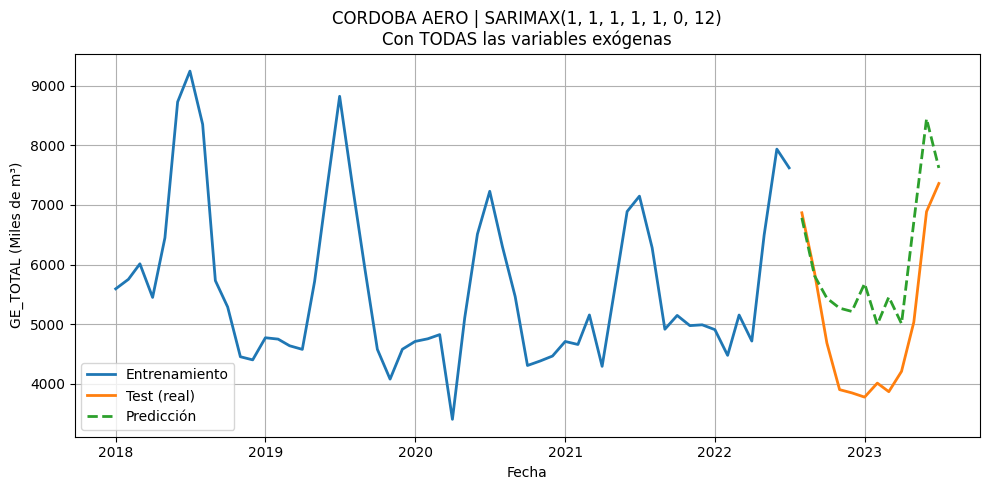


📌 Generando modelo final para estación: CORDOBA OBSERVATO
   → Orden elegido: (1, 1, 1, 1, 1, 0, 12)


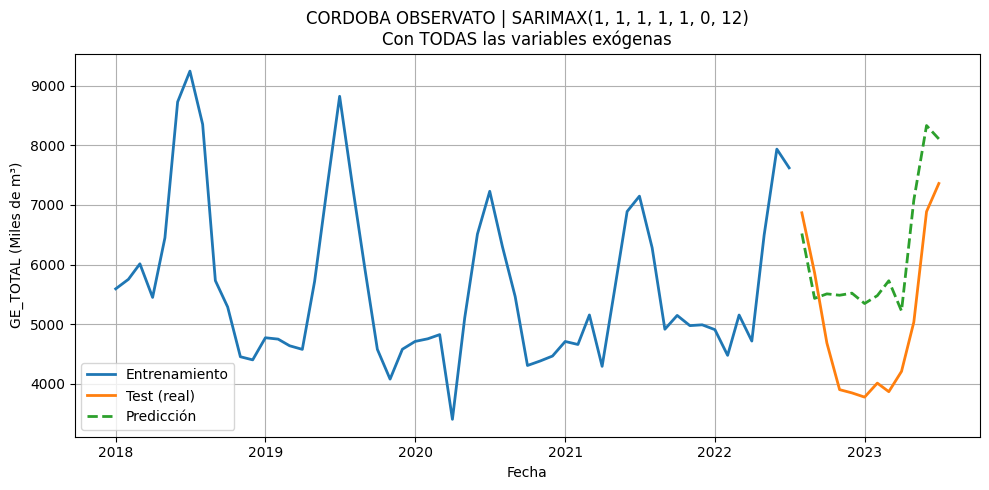


📌 Generando modelo final para estación: LABOULAYE AERO
   → Orden elegido: (0, 1, 0, 1, 1, 1, 12)


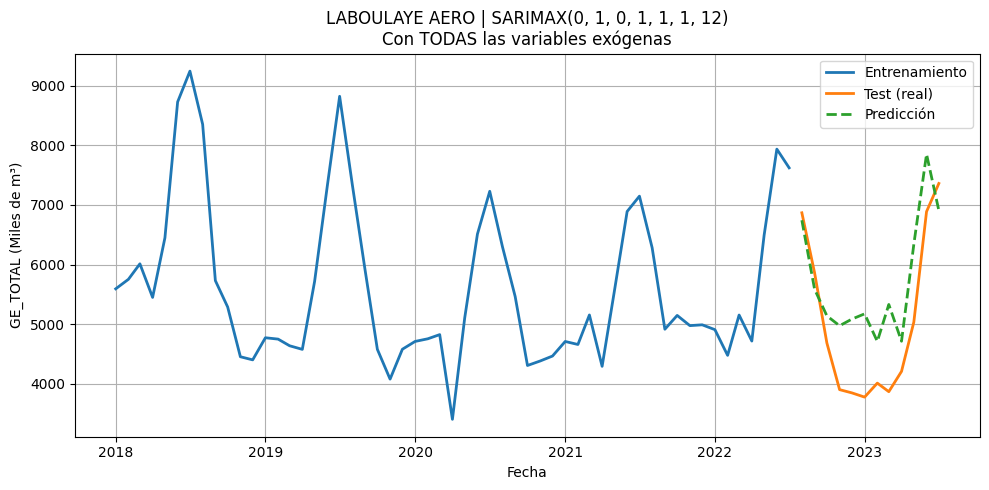


📌 Generando modelo final para estación: MARCOS JUAREZ AER
   → Orden elegido: (1, 1, 1, 0, 1, 0, 12)


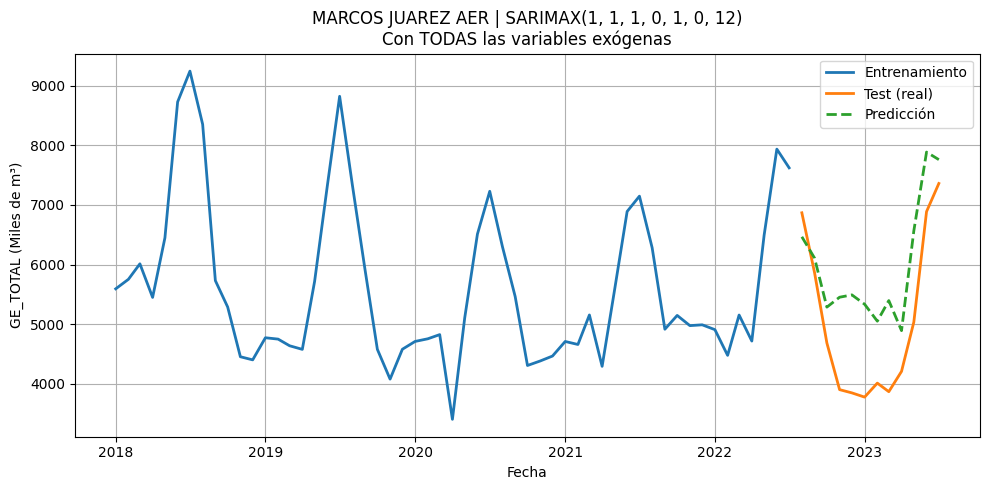


📌 Generando modelo final para estación: RIO CUARTO AERO
   → Orden elegido: (1, 1, 1, 1, 1, 1, 12)


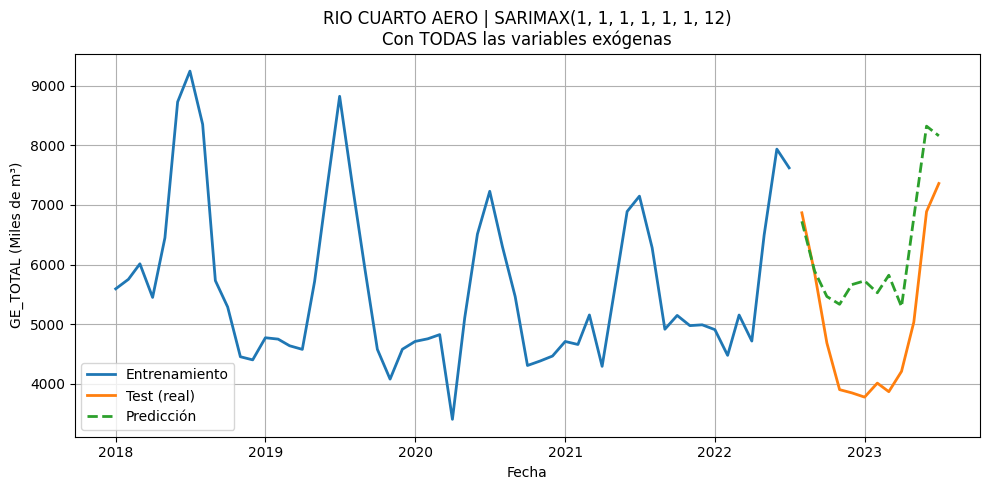


📌 Generando modelo final para estación: VILLA DOLORES AER
   → Orden elegido: (1, 1, 1, 0, 1, 0, 12)


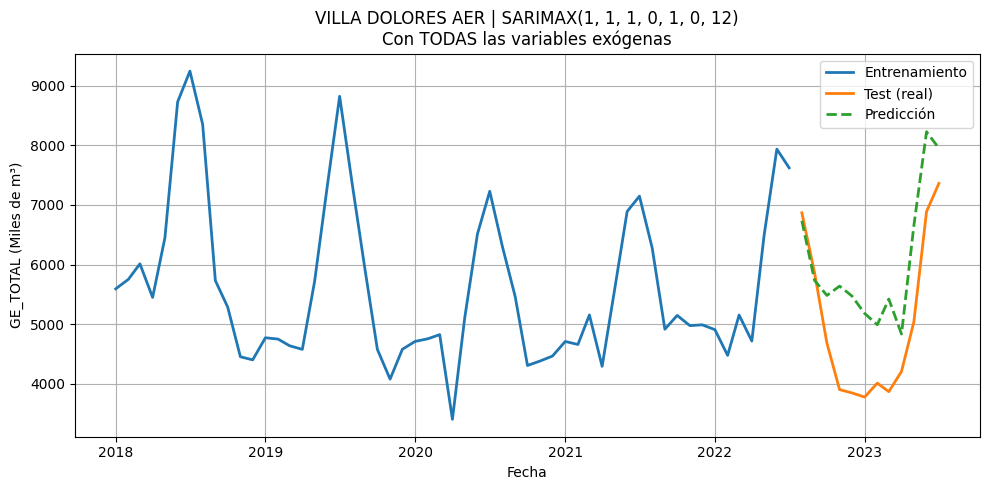

In [ ]:
# ===========================================
# 📌 GRAFICAR MODELO FINAL POR ESTACIÓN (TODAS LAS EXÓGENAS)
#       → con entrenamiento, test y predicción
# ===========================================

variable_objetivo = "GE_TOTAL"
cols_exog_all = ['TEMP','HUM','PNM','FF','DD_sin','DD_cos']

def graficar_modelo_estacion(estacion, df_final, df_aux2, variable_objetivo):

    print(f"\n📌 Generando modelo final para estación: {estacion}")

    # Fila seleccionada del mejor modelo
    fila = df_final[df_final["estacion"] == estacion].iloc[0]

    # Orden SARIMAX
    orden = ast.literal_eval(fila["orden"])
    print(f"   → Orden elegido: {orden}")

    # Serie objetivo
    serie = df_aux2[variable_objetivo]

    # Datos de estación SMN
    df_est = df_smn[df_smn["ESTACION"] == estacion].set_index("MES_ANIO").asfreq("MS")

    # Fechas coincidentes
    fechas = serie.index.intersection(df_est.index)
    serie = serie.loc[fechas]
    df_est = df_est.loc[fechas]

    # Exógenas completas
    exog_all = df_est[cols_exog_all]

    # Dividir entrenamiento y test (12 meses)
    train = serie.iloc[:-12]
    test = serie.iloc[-12:]

    exog_train = exog_all.iloc[:-12]
    exog_test = exog_all.iloc[-12:]

    # Ajuste del modelo final
    model = SARIMAX(
        train,
        exog=exog_train,
        order=tuple(orden[:3]),
        seasonal_order=tuple(orden[3:]),
        enforce_stationarity=False,
        enforce_invertibility=False
    )

    fitted = model.fit(disp=False)

    # Predicción (12 pasos)
    pred = fitted.get_forecast(steps=12, exog=exog_test).predicted_mean

    # ================== GRÁFICO ==================
    plt.figure(figsize=(10,5))

    plt.plot(train, label="Entrenamiento", linewidth=2)
    plt.plot(test, label="Test (real)", linewidth=2)
    plt.plot(pred, '--', label="Predicción", linewidth=2)

    plt.title(f"{estacion} | SARIMAX{orden}\nCon TODAS las variables exógenas")
    plt.xlabel("Fecha")
    plt.ylabel("GE_TOTAL (Miles de m³)")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


# ===========================================
# Ejecutar para todas las estaciones finales
# ===========================================
for estacion in df_final["estacion"].unique():
    graficar_modelo_estacion(estacion, df_final, df_aux2, variable_objetivo)


# SARIMA solo GAS ENTREGADO

La siguiente celda busca el mejor modelo SARIMA univariado por variable de gas, es decir, sin variables exógenas.
Es una primera etapa de diagnóstico (te dice qué órdenes (p,d,q)(P,D,Q,12) funcionan bien por sí solos).



Esta celda:

* Recorre automáticamente todas las series de gas entregado (GE_TOTAL, GE_IND, GE_GNC, GE_SDB, GE_ENTES, GE_COM, GE_CEN, GE_RES).

* Hace la búsqueda de hiperparámetros SARIMAX (AIC, BIC, MAE, RMSE).

* Guarda todo en un Excel, con una pestaña para cada tipo de gas. El excel es: resultados_modelos_sarimax_todos

* Muestra los mejores 10 modelos según cada métrica (AIC, BIC, MAE, RMSE).



In [ ]:
# ===========================================
# 🔍 BÚSQUEDA DE HIPERPARÁMETROS SARIMAX PARA TODAS LAS SERIES DE GAS
# ===========================================

import itertools
import pandas as pd
import numpy as np
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_absolute_error, mean_squared_error
import math

# --- Configuración de búsqueda ---
p = d = q = range(0, 2)
P = D = Q = range(0, 2)
s = 12  # estacionalidad mensual
param_combinations = list(itertools.product(p, [1], q, P, [1], Q))

# --- Variables de gas a analizar ---
variables_gas = ["GE_TOTAL", "GE_IND", "GE_GNC", "GE_SDB", "GE_ENTES", "GE_COM", "GE_CEN", "GE_RES"]

# --- Diccionario para guardar resultados por variable ---
resultados_por_variable = {}

# --- Bucle principal ---
for var in variables_gas:
    print(f"\n============================")
    print(f"🏭 Analizando variable: {var}")
    print(f"============================")

    serie = df_aux2[var].dropna()

    # División en entrenamiento y test
    n_test = 12
    var_entrenamiento = serie.iloc[:-n_test]
    var_test = serie.iloc[-n_test:]

    results = []

    for (p_, d_, q_, P_, D_, Q_) in param_combinations:
        try:
            model = SARIMAX(var_entrenamiento,
                            order=(p_, d_, q_),
                            seasonal_order=(P_, D_, Q_, s),
                            enforce_stationarity=False,
                            enforce_invertibility=False)
            result = model.fit(disp=False)

            # Predicciones
            pred = result.get_forecast(steps=len(var_test))
            pred_mean = pred.predicted_mean

            # Métricas
            mae = mean_absolute_error(var_test, pred_mean)
            rmse = math.sqrt(mean_squared_error(var_test, pred_mean))

            results.append({
                'variable': var,
                'order': (p_, d_, q_),
                'seasonal_order': (P_, D_, Q_, s),
                'AIC': result.aic,
                'BIC': result.bic,
                'MAE': mae,
                'RMSE': rmse
            })

        except Exception as e:
            print(f"❌ Error con {(p_, d_, q_)} x {(P_, D_, Q_, s)} → {e}")
            continue

    # Guardar resultados
    df_results = pd.DataFrame(results).sort_values(by='AIC').reset_index(drop=True)
    resultados_por_variable[var] = df_results

    # Mostrar los mejores modelos según cada métrica
    print("\n🏆 Mejores modelos según AIC:")
    display(df_results.nsmallest(10, 'AIC')[['order', 'seasonal_order', 'AIC']])
    print("\n🏆 Mejores modelos según BIC:")
    display(df_results.nsmallest(10, 'BIC')[['order', 'seasonal_order', 'BIC']])
    print("\n🏆 Mejores modelos según MAE:")
    display(df_results.nsmallest(10, 'MAE')[['order', 'seasonal_order', 'MAE']])
    print("\n🏆 Mejores modelos según RMSE:")
    display(df_results.nsmallest(10, 'RMSE')[['order', 'seasonal_order', 'RMSE']])

# --- Guardar todo en Excel (una hoja por variable) ---
excel_path = "/content/resultados_modelos_sarimax_todos.xlsx"
with pd.ExcelWriter(excel_path) as writer:
    for var, df_var in resultados_por_variable.items():
        df_var.to_excel(writer, sheet_name=var, index=False)

print(f"\n💾 Todos los resultados guardados en: {excel_path}")



🏭 Analizando variable: GE_TOTAL

🏆 Mejores modelos según AIC:


,order,seasonal_order,AIC
0,"(1, 1, 1)","(1, 1, 1, 12)",2287.038681
1,"(1, 1, 1)","(0, 1, 1, 12)",2287.938751
2,"(0, 1, 1)","(1, 1, 1, 12)",2300.559400
3,"(0, 1, 1)","(0, 1, 1, 12)",2301.940219
4,"(0, 1, 0)","(1, 1, 1, 12)",2314.645087
5,"(0, 1, 0)","(0, 1, 1, 12)",2315.388794
6,"(1, 1, 0)","(1, 1, 1, 12)",2315.648352
7,"(1, 1, 0)","(0, 1, 1, 12)",2316.728778
8,"(1, 1, 1)","(1, 1, 0, 12)",2331.596284
9,"(1, 1, 0)","(1, 1, 0, 12)",2350.504799



🏆 Mejores modelos según BIC:


,order,seasonal_order,BIC
1,"(1, 1, 1)","(0, 1, 1, 12)",2299.927600
0,"(1, 1, 1)","(1, 1, 1, 12)",2302.024742
3,"(0, 1, 1)","(0, 1, 1, 12)",2310.931856
2,"(0, 1, 1)","(1, 1, 1, 12)",2312.548249
5,"(0, 1, 0)","(0, 1, 1, 12)",2321.396686
4,"(0, 1, 0)","(1, 1, 1, 12)",2323.656926
7,"(1, 1, 0)","(0, 1, 1, 12)",2325.740617
6,"(1, 1, 0)","(1, 1, 1, 12)",2327.664137
8,"(1, 1, 1)","(1, 1, 0, 12)",2343.612069
9,"(1, 1, 0)","(1, 1, 0, 12)",2359.516638



🏆 Mejores modelos según MAE:


,order,seasonal_order,MAE
1,"(1, 1, 1)","(0, 1, 1, 12)",561.129546
5,"(0, 1, 0)","(0, 1, 1, 12)",611.563437
8,"(1, 1, 1)","(1, 1, 0, 12)",644.072498
7,"(1, 1, 0)","(0, 1, 1, 12)",644.842601
3,"(0, 1, 1)","(0, 1, 1, 12)",658.496157
0,"(1, 1, 1)","(1, 1, 1, 12)",702.351922
4,"(0, 1, 0)","(1, 1, 1, 12)",796.921218
6,"(1, 1, 0)","(1, 1, 1, 12)",836.602281
12,"(1, 1, 1)","(0, 1, 0, 12)",853.294322
2,"(0, 1, 1)","(1, 1, 1, 12)",856.982619



🏆 Mejores modelos según RMSE:


,order,seasonal_order,RMSE
1,"(1, 1, 1)","(0, 1, 1, 12)",645.360518
5,"(0, 1, 0)","(0, 1, 1, 12)",700.791136
7,"(1, 1, 0)","(0, 1, 1, 12)",739.794793
8,"(1, 1, 1)","(1, 1, 0, 12)",741.844380
3,"(0, 1, 1)","(0, 1, 1, 12)",756.402957
0,"(1, 1, 1)","(1, 1, 1, 12)",795.339683
4,"(0, 1, 0)","(1, 1, 1, 12)",906.571667
12,"(1, 1, 1)","(0, 1, 0, 12)",942.969006
6,"(1, 1, 0)","(1, 1, 1, 12)",953.984931
2,"(0, 1, 1)","(1, 1, 1, 12)",979.021517



🏭 Analizando variable: GE_IND

🏆 Mejores modelos según AIC:


,order,seasonal_order,AIC
0,"(1, 1, 1)","(0, 1, 1, 12)",1815.396770
1,"(1, 1, 1)","(1, 1, 1, 12)",1815.529884
2,"(0, 1, 1)","(0, 1, 1, 12)",1822.723001
3,"(0, 1, 1)","(1, 1, 1, 12)",1823.323400
4,"(1, 1, 0)","(0, 1, 1, 12)",1836.198382
5,"(0, 1, 0)","(1, 1, 1, 12)",1836.632503
6,"(1, 1, 0)","(1, 1, 1, 12)",1837.082809
7,"(0, 1, 0)","(0, 1, 1, 12)",1837.423489
8,"(1, 1, 1)","(1, 1, 0, 12)",1838.171429
9,"(1, 1, 0)","(1, 1, 0, 12)",1846.464968



🏆 Mejores modelos según BIC:


,order,seasonal_order,BIC
0,"(1, 1, 1)","(0, 1, 1, 12)",1827.385620
1,"(1, 1, 1)","(1, 1, 1, 12)",1830.515945
2,"(0, 1, 1)","(0, 1, 1, 12)",1831.714638
3,"(0, 1, 1)","(1, 1, 1, 12)",1835.312249
7,"(0, 1, 0)","(0, 1, 1, 12)",1843.431381
4,"(1, 1, 0)","(0, 1, 1, 12)",1845.210221
5,"(0, 1, 0)","(1, 1, 1, 12)",1845.644342
6,"(1, 1, 0)","(1, 1, 1, 12)",1849.098594
8,"(1, 1, 1)","(1, 1, 0, 12)",1850.187215
9,"(1, 1, 0)","(1, 1, 0, 12)",1855.476807



🏆 Mejores modelos según MAE:


,order,seasonal_order,MAE
1,"(1, 1, 1)","(1, 1, 1, 12)",99.102650
0,"(1, 1, 1)","(0, 1, 1, 12)",116.109480
12,"(1, 1, 1)","(0, 1, 0, 12)",122.710405
13,"(0, 1, 1)","(0, 1, 0, 12)",132.005604
14,"(1, 1, 0)","(0, 1, 0, 12)",136.157199
15,"(0, 1, 0)","(0, 1, 0, 12)",140.740201
3,"(0, 1, 1)","(1, 1, 1, 12)",141.470132
6,"(1, 1, 0)","(1, 1, 1, 12)",143.978477
5,"(0, 1, 0)","(1, 1, 1, 12)",146.654648
2,"(0, 1, 1)","(0, 1, 1, 12)",148.615987



🏆 Mejores modelos según RMSE:


,order,seasonal_order,RMSE
1,"(1, 1, 1)","(1, 1, 1, 12)",119.292394
0,"(1, 1, 1)","(0, 1, 1, 12)",138.075355
12,"(1, 1, 1)","(0, 1, 0, 12)",150.051184
13,"(0, 1, 1)","(0, 1, 0, 12)",160.936228
3,"(0, 1, 1)","(1, 1, 1, 12)",161.781895
6,"(1, 1, 0)","(1, 1, 1, 12)",164.481242
14,"(1, 1, 0)","(0, 1, 0, 12)",166.099790
5,"(0, 1, 0)","(1, 1, 1, 12)",166.860288
2,"(0, 1, 1)","(0, 1, 1, 12)",169.521765
4,"(1, 1, 0)","(0, 1, 1, 12)",170.160734



🏭 Analizando variable: GE_GNC

🏆 Mejores modelos según AIC:


,order,seasonal_order,AIC
0,"(0, 1, 1)","(0, 1, 1, 12)",1616.998765
1,"(1, 1, 1)","(0, 1, 1, 12)",1617.769320
2,"(0, 1, 1)","(1, 1, 1, 12)",1618.869129
3,"(1, 1, 1)","(1, 1, 1, 12)",1619.635118
4,"(1, 1, 0)","(0, 1, 1, 12)",1630.557184
5,"(1, 1, 0)","(1, 1, 1, 12)",1632.443142
6,"(0, 1, 0)","(0, 1, 1, 12)",1633.136058
7,"(0, 1, 0)","(1, 1, 1, 12)",1635.021051
8,"(1, 1, 1)","(1, 1, 0, 12)",1666.815955
9,"(1, 1, 0)","(1, 1, 0, 12)",1671.747949



🏆 Mejores modelos según BIC:


,order,seasonal_order,BIC
0,"(0, 1, 1)","(0, 1, 1, 12)",1625.990402
1,"(1, 1, 1)","(0, 1, 1, 12)",1629.758169
2,"(0, 1, 1)","(1, 1, 1, 12)",1630.857978
3,"(1, 1, 1)","(1, 1, 1, 12)",1634.621179
6,"(0, 1, 0)","(0, 1, 1, 12)",1639.143950
4,"(1, 1, 0)","(0, 1, 1, 12)",1639.569022
7,"(0, 1, 0)","(1, 1, 1, 12)",1644.032890
5,"(1, 1, 0)","(1, 1, 1, 12)",1644.458927
8,"(1, 1, 1)","(1, 1, 0, 12)",1678.831740
9,"(1, 1, 0)","(1, 1, 0, 12)",1680.759788



🏆 Mejores modelos según MAE:


,order,seasonal_order,MAE
2,"(0, 1, 1)","(1, 1, 1, 12)",45.933586
3,"(1, 1, 1)","(1, 1, 1, 12)",46.147550
0,"(0, 1, 1)","(0, 1, 1, 12)",46.232935
1,"(1, 1, 1)","(0, 1, 1, 12)",46.299864
5,"(1, 1, 0)","(1, 1, 1, 12)",49.961465
4,"(1, 1, 0)","(0, 1, 1, 12)",50.577066
7,"(0, 1, 0)","(1, 1, 1, 12)",58.883922
6,"(0, 1, 0)","(0, 1, 1, 12)",59.416876
13,"(0, 1, 1)","(0, 1, 0, 12)",65.417042
12,"(1, 1, 1)","(0, 1, 0, 12)",83.568094



🏆 Mejores modelos según RMSE:


,order,seasonal_order,RMSE
2,"(0, 1, 1)","(1, 1, 1, 12)",52.883893
0,"(0, 1, 1)","(0, 1, 1, 12)",52.884420
3,"(1, 1, 1)","(1, 1, 1, 12)",53.275646
1,"(1, 1, 1)","(0, 1, 1, 12)",53.357934
5,"(1, 1, 0)","(1, 1, 1, 12)",56.448987
4,"(1, 1, 0)","(0, 1, 1, 12)",56.626641
7,"(0, 1, 0)","(1, 1, 1, 12)",64.828161
6,"(0, 1, 0)","(0, 1, 1, 12)",64.992590
13,"(0, 1, 1)","(0, 1, 0, 12)",71.242806
12,"(1, 1, 1)","(0, 1, 0, 12)",88.978509



🏭 Analizando variable: GE_SDB

🏆 Mejores modelos según AIC:


,order,seasonal_order,AIC
0,"(1, 1, 1)","(1, 1, 1, 12)",1452.562212
1,"(1, 1, 1)","(0, 1, 1, 12)",1453.811051
2,"(0, 1, 1)","(1, 1, 1, 12)",1470.979881
3,"(0, 1, 1)","(0, 1, 1, 12)",1471.156411
4,"(1, 1, 0)","(1, 1, 1, 12)",1486.869628
5,"(1, 1, 0)","(0, 1, 1, 12)",1489.500460
6,"(0, 1, 0)","(1, 1, 1, 12)",1490.732338
7,"(1, 1, 1)","(1, 1, 0, 12)",1492.475891
8,"(0, 1, 0)","(0, 1, 1, 12)",1494.499248
9,"(0, 1, 1)","(1, 1, 0, 12)",1517.551456



🏆 Mejores modelos según BIC:


,order,seasonal_order,BIC
1,"(1, 1, 1)","(0, 1, 1, 12)",1465.799900
0,"(1, 1, 1)","(1, 1, 1, 12)",1467.548274
3,"(0, 1, 1)","(0, 1, 1, 12)",1480.148048
2,"(0, 1, 1)","(1, 1, 1, 12)",1482.968730
5,"(1, 1, 0)","(0, 1, 1, 12)",1498.512299
4,"(1, 1, 0)","(1, 1, 1, 12)",1498.885413
6,"(0, 1, 0)","(1, 1, 1, 12)",1499.744177
8,"(0, 1, 0)","(0, 1, 1, 12)",1500.507140
7,"(1, 1, 1)","(1, 1, 0, 12)",1504.491676
9,"(0, 1, 1)","(1, 1, 0, 12)",1526.583362



🏆 Mejores modelos según MAE:


,order,seasonal_order,MAE
1,"(1, 1, 1)","(0, 1, 1, 12)",37.545109
0,"(1, 1, 1)","(1, 1, 1, 12)",38.331395
6,"(0, 1, 0)","(1, 1, 1, 12)",50.773434
12,"(1, 1, 1)","(0, 1, 0, 12)",51.601713
8,"(0, 1, 0)","(0, 1, 1, 12)",54.224060
7,"(1, 1, 1)","(1, 1, 0, 12)",56.038904
4,"(1, 1, 0)","(1, 1, 1, 12)",63.628833
11,"(0, 1, 0)","(1, 1, 0, 12)",63.703178
15,"(0, 1, 0)","(0, 1, 0, 12)",68.040719
5,"(1, 1, 0)","(0, 1, 1, 12)",68.539207



🏆 Mejores modelos según RMSE:


,order,seasonal_order,RMSE
1,"(1, 1, 1)","(0, 1, 1, 12)",45.526486
0,"(1, 1, 1)","(1, 1, 1, 12)",45.554854
6,"(0, 1, 0)","(1, 1, 1, 12)",61.209669
8,"(0, 1, 0)","(0, 1, 1, 12)",64.312390
12,"(1, 1, 1)","(0, 1, 0, 12)",66.080561
7,"(1, 1, 1)","(1, 1, 0, 12)",67.847028
4,"(1, 1, 0)","(1, 1, 1, 12)",73.316094
5,"(1, 1, 0)","(0, 1, 1, 12)",77.022007
11,"(0, 1, 0)","(1, 1, 0, 12)",77.698102
3,"(0, 1, 1)","(0, 1, 1, 12)",79.067831



🏭 Analizando variable: GE_ENTES

🏆 Mejores modelos según AIC:


,order,seasonal_order,AIC
0,"(1, 1, 1)","(0, 1, 1, 12)",1108.596887
1,"(1, 1, 1)","(1, 1, 1, 12)",1109.375297
2,"(0, 1, 1)","(1, 1, 1, 12)",1131.207882
3,"(0, 1, 1)","(0, 1, 1, 12)",1131.700827
4,"(0, 1, 0)","(1, 1, 1, 12)",1136.618422
5,"(1, 1, 0)","(1, 1, 1, 12)",1138.124095
6,"(0, 1, 0)","(0, 1, 1, 12)",1138.181093
7,"(1, 1, 0)","(0, 1, 1, 12)",1139.740988
8,"(1, 1, 1)","(1, 1, 0, 12)",1147.353663
9,"(1, 1, 0)","(1, 1, 0, 12)",1174.871148



🏆 Mejores modelos según BIC:


,order,seasonal_order,BIC
0,"(1, 1, 1)","(0, 1, 1, 12)",1120.585736
1,"(1, 1, 1)","(1, 1, 1, 12)",1124.361359
3,"(0, 1, 1)","(0, 1, 1, 12)",1140.692464
2,"(0, 1, 1)","(1, 1, 1, 12)",1143.196731
6,"(0, 1, 0)","(0, 1, 1, 12)",1144.188985
4,"(0, 1, 0)","(1, 1, 1, 12)",1145.630260
7,"(1, 1, 0)","(0, 1, 1, 12)",1148.752827
5,"(1, 1, 0)","(1, 1, 1, 12)",1150.139880
8,"(1, 1, 1)","(1, 1, 0, 12)",1159.369448
9,"(1, 1, 0)","(1, 1, 0, 12)",1183.882987



🏆 Mejores modelos según MAE:


,order,seasonal_order,MAE
3,"(0, 1, 1)","(0, 1, 1, 12)",5.493630
0,"(1, 1, 1)","(0, 1, 1, 12)",5.850216
8,"(1, 1, 1)","(1, 1, 0, 12)",6.197900
1,"(1, 1, 1)","(1, 1, 1, 12)",6.711765
7,"(1, 1, 0)","(0, 1, 1, 12)",7.095155
12,"(1, 1, 1)","(0, 1, 0, 12)",7.496616
6,"(0, 1, 0)","(0, 1, 1, 12)",7.878440
2,"(0, 1, 1)","(1, 1, 1, 12)",8.861306
5,"(1, 1, 0)","(1, 1, 1, 12)",9.420001
4,"(0, 1, 0)","(1, 1, 1, 12)",10.035084



🏆 Mejores modelos según RMSE:


,order,seasonal_order,RMSE
3,"(0, 1, 1)","(0, 1, 1, 12)",6.954633
0,"(1, 1, 1)","(0, 1, 1, 12)",7.045752
7,"(1, 1, 0)","(0, 1, 1, 12)",7.598221
1,"(1, 1, 1)","(1, 1, 1, 12)",7.867173
6,"(0, 1, 0)","(0, 1, 1, 12)",8.347822
8,"(1, 1, 1)","(1, 1, 0, 12)",8.625140
2,"(0, 1, 1)","(1, 1, 1, 12)",9.309265
5,"(1, 1, 0)","(1, 1, 1, 12)",9.936251
4,"(0, 1, 0)","(1, 1, 1, 12)",10.836319
12,"(1, 1, 1)","(0, 1, 0, 12)",11.580740



🏭 Analizando variable: GE_COM

🏆 Mejores modelos según AIC:


,order,seasonal_order,AIC
0,"(1, 1, 1)","(0, 1, 1, 12)",1399.102765
1,"(1, 1, 1)","(1, 1, 1, 12)",1401.102712
2,"(0, 1, 1)","(0, 1, 1, 12)",1411.850728
3,"(0, 1, 1)","(1, 1, 1, 12)",1413.840166
4,"(1, 1, 0)","(0, 1, 1, 12)",1422.848987
5,"(1, 1, 0)","(1, 1, 1, 12)",1424.607788
6,"(0, 1, 0)","(0, 1, 1, 12)",1426.176607
7,"(0, 1, 0)","(1, 1, 1, 12)",1427.613761
8,"(1, 1, 1)","(1, 1, 0, 12)",1458.000383
9,"(1, 1, 0)","(1, 1, 0, 12)",1472.183355



🏆 Mejores modelos según BIC:


,order,seasonal_order,BIC
0,"(1, 1, 1)","(0, 1, 1, 12)",1411.091614
1,"(1, 1, 1)","(1, 1, 1, 12)",1416.088774
2,"(0, 1, 1)","(0, 1, 1, 12)",1420.842365
3,"(0, 1, 1)","(1, 1, 1, 12)",1425.829016
4,"(1, 1, 0)","(0, 1, 1, 12)",1431.860826
6,"(0, 1, 0)","(0, 1, 1, 12)",1432.184499
5,"(1, 1, 0)","(1, 1, 1, 12)",1436.623573
7,"(0, 1, 0)","(1, 1, 1, 12)",1436.625600
8,"(1, 1, 1)","(1, 1, 0, 12)",1470.016169
9,"(1, 1, 0)","(1, 1, 0, 12)",1481.195194



🏆 Mejores modelos según MAE:


,order,seasonal_order,MAE
8,"(1, 1, 1)","(1, 1, 0, 12)",15.257240
1,"(1, 1, 1)","(1, 1, 1, 12)",16.878913
0,"(1, 1, 1)","(0, 1, 1, 12)",16.880237
2,"(0, 1, 1)","(0, 1, 1, 12)",16.917850
12,"(1, 1, 1)","(0, 1, 0, 12)",16.989591
3,"(0, 1, 1)","(1, 1, 1, 12)",17.268347
4,"(1, 1, 0)","(0, 1, 1, 12)",19.795902
5,"(1, 1, 0)","(1, 1, 1, 12)",20.884110
6,"(0, 1, 0)","(0, 1, 1, 12)",23.902122
7,"(0, 1, 0)","(1, 1, 1, 12)",25.976466



🏆 Mejores modelos según RMSE:


,order,seasonal_order,RMSE
2,"(0, 1, 1)","(0, 1, 1, 12)",18.473236
3,"(0, 1, 1)","(1, 1, 1, 12)",18.852449
1,"(1, 1, 1)","(1, 1, 1, 12)",19.026972
0,"(1, 1, 1)","(0, 1, 1, 12)",19.028160
8,"(1, 1, 1)","(1, 1, 0, 12)",19.601890
4,"(1, 1, 0)","(0, 1, 1, 12)",22.121071
12,"(1, 1, 1)","(0, 1, 0, 12)",23.326372
5,"(1, 1, 0)","(1, 1, 1, 12)",23.680805
6,"(0, 1, 0)","(0, 1, 1, 12)",27.593637
7,"(0, 1, 0)","(1, 1, 1, 12)",29.619148



🏭 Analizando variable: GE_CEN

🏆 Mejores modelos según AIC:


,order,seasonal_order,AIC
0,"(1, 1, 1)","(0, 1, 1, 12)",2256.380973
1,"(1, 1, 1)","(1, 1, 1, 12)",2258.116808
2,"(0, 1, 1)","(0, 1, 1, 12)",2275.357799
3,"(0, 1, 1)","(1, 1, 1, 12)",2277.129686
4,"(0, 1, 0)","(0, 1, 1, 12)",2288.068771
5,"(1, 1, 0)","(0, 1, 1, 12)",2289.906160
6,"(0, 1, 0)","(1, 1, 1, 12)",2289.918486
7,"(1, 1, 0)","(1, 1, 1, 12)",2291.724637
8,"(1, 1, 1)","(1, 1, 0, 12)",2307.791616
9,"(1, 1, 0)","(1, 1, 0, 12)",2332.075060



🏆 Mejores modelos según BIC:


,order,seasonal_order,BIC
0,"(1, 1, 1)","(0, 1, 1, 12)",2268.369822
1,"(1, 1, 1)","(1, 1, 1, 12)",2273.102870
2,"(0, 1, 1)","(0, 1, 1, 12)",2284.349436
3,"(0, 1, 1)","(1, 1, 1, 12)",2289.118535
4,"(0, 1, 0)","(0, 1, 1, 12)",2294.076663
5,"(1, 1, 0)","(0, 1, 1, 12)",2298.917998
6,"(0, 1, 0)","(1, 1, 1, 12)",2298.930325
7,"(1, 1, 0)","(1, 1, 1, 12)",2303.740423
8,"(1, 1, 1)","(1, 1, 0, 12)",2319.807401
9,"(1, 1, 0)","(1, 1, 0, 12)",2341.086899



🏆 Mejores modelos según MAE:


,order,seasonal_order,MAE
2,"(0, 1, 1)","(0, 1, 1, 12)",402.640552
4,"(0, 1, 0)","(0, 1, 1, 12)",404.693117
5,"(1, 1, 0)","(0, 1, 1, 12)",405.417679
3,"(0, 1, 1)","(1, 1, 1, 12)",425.897507
6,"(0, 1, 0)","(1, 1, 1, 12)",426.675498
0,"(1, 1, 1)","(0, 1, 1, 12)",429.811803
7,"(1, 1, 0)","(1, 1, 1, 12)",429.870898
1,"(1, 1, 1)","(1, 1, 1, 12)",450.323107
8,"(1, 1, 1)","(1, 1, 0, 12)",468.382290
12,"(1, 1, 1)","(0, 1, 0, 12)",533.248251



🏆 Mejores modelos según RMSE:


,order,seasonal_order,RMSE
2,"(0, 1, 1)","(0, 1, 1, 12)",495.088416
4,"(0, 1, 0)","(0, 1, 1, 12)",497.672171
5,"(1, 1, 0)","(0, 1, 1, 12)",498.658332
3,"(0, 1, 1)","(1, 1, 1, 12)",528.631624
6,"(0, 1, 0)","(1, 1, 1, 12)",529.254248
0,"(1, 1, 1)","(0, 1, 1, 12)",530.259252
7,"(1, 1, 0)","(1, 1, 1, 12)",533.798027
1,"(1, 1, 1)","(1, 1, 1, 12)",560.709722
8,"(1, 1, 1)","(1, 1, 0, 12)",585.878491
11,"(0, 1, 1)","(1, 1, 0, 12)",692.977241



🏭 Analizando variable: GE_RES

🏆 Mejores modelos según AIC:


,order,seasonal_order,AIC
0,"(1, 1, 1)","(0, 1, 1, 12)",2077.881270
1,"(1, 1, 1)","(1, 1, 1, 12)",2079.431203
2,"(0, 1, 1)","(0, 1, 1, 12)",2103.250859
3,"(0, 1, 1)","(1, 1, 1, 12)",2105.168391
4,"(1, 1, 0)","(0, 1, 1, 12)",2120.249787
5,"(0, 1, 0)","(0, 1, 1, 12)",2121.024613
6,"(1, 1, 0)","(1, 1, 1, 12)",2122.224244
7,"(0, 1, 0)","(1, 1, 1, 12)",2122.979245
8,"(1, 1, 1)","(1, 1, 0, 12)",2131.067590
9,"(0, 1, 1)","(1, 1, 0, 12)",2164.176894



🏆 Mejores modelos según BIC:


,order,seasonal_order,BIC
0,"(1, 1, 1)","(0, 1, 1, 12)",2089.870119
1,"(1, 1, 1)","(1, 1, 1, 12)",2094.417264
2,"(0, 1, 1)","(0, 1, 1, 12)",2112.242495
3,"(0, 1, 1)","(1, 1, 1, 12)",2117.157240
5,"(0, 1, 0)","(0, 1, 1, 12)",2127.032505
4,"(1, 1, 0)","(0, 1, 1, 12)",2129.261626
7,"(0, 1, 0)","(1, 1, 1, 12)",2131.991084
6,"(1, 1, 0)","(1, 1, 1, 12)",2134.240029
8,"(1, 1, 1)","(1, 1, 0, 12)",2143.083376
9,"(0, 1, 1)","(1, 1, 0, 12)",2173.208800



🏆 Mejores modelos según MAE:


,order,seasonal_order,MAE
4,"(1, 1, 0)","(0, 1, 1, 12)",141.300563
6,"(1, 1, 0)","(1, 1, 1, 12)",142.866447
0,"(1, 1, 1)","(0, 1, 1, 12)",153.809809
1,"(1, 1, 1)","(1, 1, 1, 12)",155.415930
2,"(0, 1, 1)","(0, 1, 1, 12)",181.207865
5,"(0, 1, 0)","(0, 1, 1, 12)",182.703112
7,"(0, 1, 0)","(1, 1, 1, 12)",182.796641
3,"(0, 1, 1)","(1, 1, 1, 12)",188.885098
10,"(1, 1, 0)","(1, 1, 0, 12)",217.237304
8,"(1, 1, 1)","(1, 1, 0, 12)",227.916842



🏆 Mejores modelos según RMSE:


,order,seasonal_order,RMSE
4,"(1, 1, 0)","(0, 1, 1, 12)",197.318633
6,"(1, 1, 0)","(1, 1, 1, 12)",201.301322
5,"(0, 1, 0)","(0, 1, 1, 12)",216.952282
7,"(0, 1, 0)","(1, 1, 1, 12)",219.754512
0,"(1, 1, 1)","(0, 1, 1, 12)",221.312301
1,"(1, 1, 1)","(1, 1, 1, 12)",229.961261
2,"(0, 1, 1)","(0, 1, 1, 12)",248.107326
3,"(0, 1, 1)","(1, 1, 1, 12)",258.088436
10,"(1, 1, 0)","(1, 1, 0, 12)",353.264237
11,"(0, 1, 0)","(1, 1, 0, 12)",357.696685



💾 Todos los resultados guardados en: /content/resultados_modelos_sarimax_todos.xlsx


Y después, en esta última celda aparte, selecciona los modelos que coincidan entre las 4 métricas (o las 3 que sean iguales) como los más consistentes. Y guarda en un excel: modelos_consistentes

In [ ]:
# ===========================================
# 🧠 SELECCIÓN DE MODELOS CONSISTENTES (AIC, BIC, MAE, RMSE)
# ===========================================

import pandas as pd

excel_path = "/content/resultados_modelos_sarimax_todos.xlsx"
xls = pd.ExcelFile(excel_path)

modelos_consistentes = []

# 🔧 Función auxiliar para convertir de texto a tupla
def convertir_a_tupla(valor):
    if isinstance(valor, str):
        valor = valor.strip("()").replace(" ", "")
        try:
            return tuple(map(int, valor.split(",")))
        except:
            return valor
    return valor

for hoja in xls.sheet_names:
    df = pd.read_excel(xls, sheet_name=hoja)

    # Convertir columnas a tuplas por si se guardaron como texto
    if 'order' in df.columns:
        df['order'] = df['order'].apply(convertir_a_tupla)
    if 'seasonal_order' in df.columns:
        df['seasonal_order'] = df['seasonal_order'].apply(convertir_a_tupla)

    # Tomar los mejores modelos por cada métrica
    top_aic = df.nsmallest(5, 'AIC')
    top_bic = df.nsmallest(5, 'BIC')
    top_mae = df.nsmallest(5, 'MAE')
    top_rmse = df.nsmallest(5, 'RMSE')

    # Buscar modelos que aparezcan en las 4 listas
    comunes = set(map(tuple, top_aic[['order', 'seasonal_order']].values)) \
             & set(map(tuple, top_bic[['order', 'seasonal_order']].values)) \
             & set(map(tuple, top_mae[['order', 'seasonal_order']].values)) \
             & set(map(tuple, top_rmse[['order', 'seasonal_order']].values))

    if comunes:
        for modelo in comunes:
            modelos_consistentes.append({
                'variable': hoja,
                'order': modelo[0],
                'seasonal_order': modelo[1]
            })

# Convertir a DataFrame final
df_consistentes = pd.DataFrame(modelos_consistentes)

# Mostrar y guardar resultados
if not df_consistentes.empty:
    print("✅ Modelos consistentes encontrados entre AIC, BIC, MAE y RMSE:")
    display(df_consistentes)
else:
    print("⚠️ No hay modelos que coincidan en las 4 métricas exactamente.")

# Guardar resultados en Excel
salida_path = "/content/modelos_consistentes.xlsx"
df_consistentes.to_excel(salida_path, index=False)
print(f"💾 Guardado como: {salida_path}")


✅ Modelos consistentes encontrados entre AIC, BIC, MAE y RMSE:


,variable,order,seasonal_order
0,GE_TOTAL,"(0, 1, 1)","(0, 1, 1, 12)"
1,GE_TOTAL,"(1, 1, 1)","(0, 1, 1, 12)"
2,GE_IND,"(1, 1, 1)","(0, 1, 1, 12)"
3,GE_IND,"(1, 1, 1)","(1, 1, 1, 12)"
4,GE_GNC,"(1, 1, 1)","(0, 1, 1, 12)"
5,GE_GNC,"(0, 1, 1)","(0, 1, 1, 12)"
6,GE_GNC,"(0, 1, 1)","(1, 1, 1, 12)"
7,GE_GNC,"(1, 1, 1)","(1, 1, 1, 12)"
8,GE_SDB,"(1, 1, 1)","(0, 1, 1, 12)"
9,GE_SDB,"(1, 1, 1)","(1, 1, 1, 12)"


💾 Guardado como: /content/modelos_consistentes.xlsx


Por último una última celda que:

Lee el archivo modelos_consistentes.xlsx (el que se acaba de generar).

Usa los modelos listados ahí (una fila por variable con sus órdenes).

Entrena cada modelo SARIMA con esos parámetros.

Genera las predicciones y grafica la comparación entrenamiento / test / predicción para cada variable.

Guarda los gráficos automáticamente en /content/predicciones_finales/.


🏷️ Entrenando mejor modelo para: GE_TOTAL
   order=(0, 1, 1), seasonal_order=(0, 1, 1, 12)


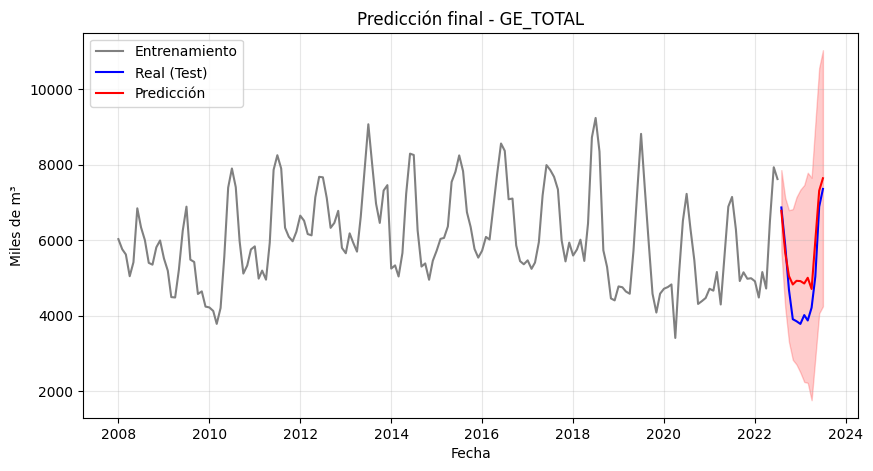


🏷️ Entrenando mejor modelo para: GE_TOTAL
   order=(1, 1, 1), seasonal_order=(0, 1, 1, 12)


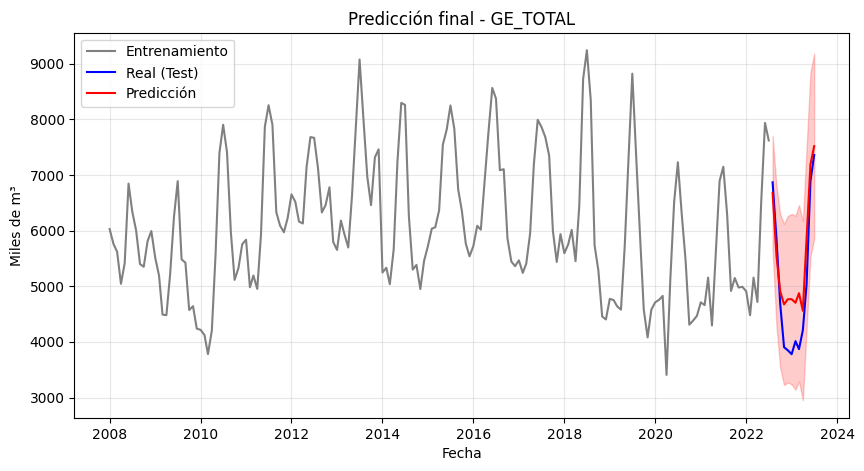


🏷️ Entrenando mejor modelo para: GE_IND
   order=(1, 1, 1), seasonal_order=(0, 1, 1, 12)


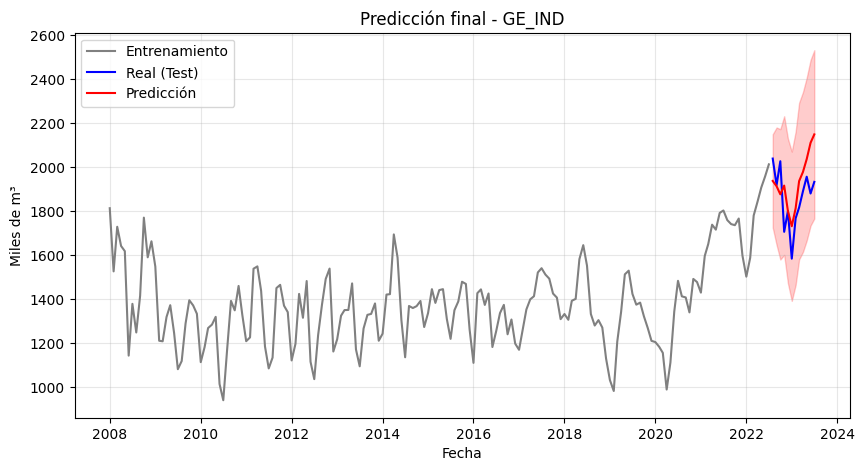


🏷️ Entrenando mejor modelo para: GE_IND
   order=(1, 1, 1), seasonal_order=(1, 1, 1, 12)


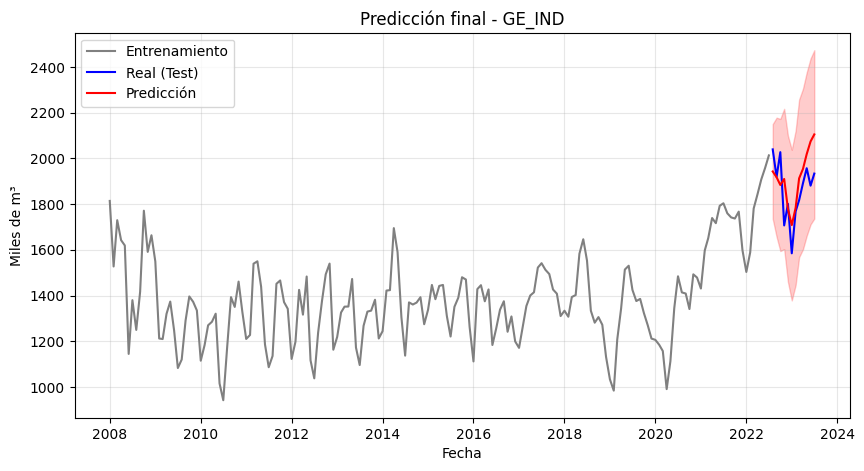


🏷️ Entrenando mejor modelo para: GE_GNC
   order=(1, 1, 1), seasonal_order=(0, 1, 1, 12)


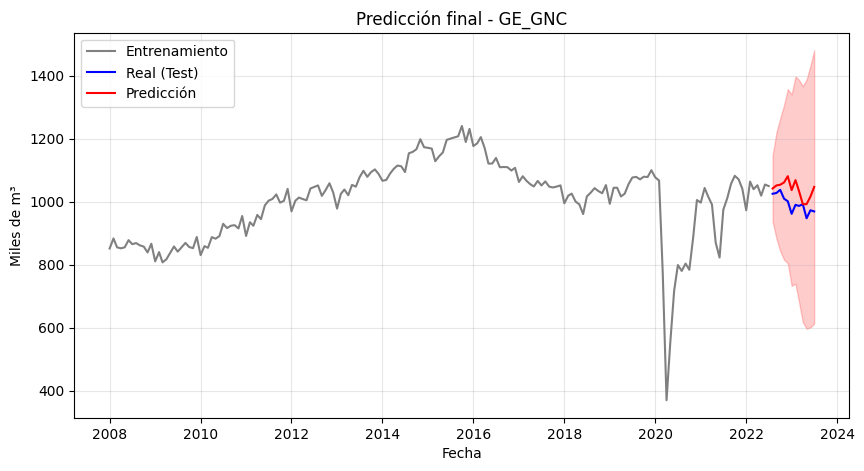


🏷️ Entrenando mejor modelo para: GE_GNC
   order=(0, 1, 1), seasonal_order=(0, 1, 1, 12)


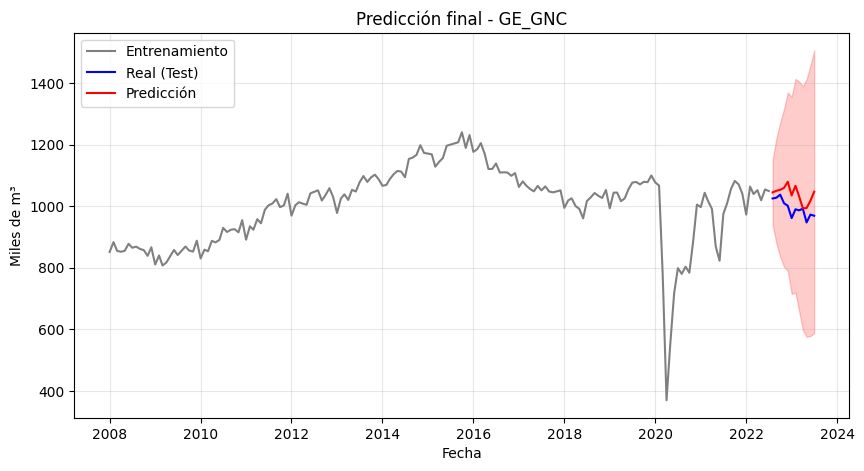


🏷️ Entrenando mejor modelo para: GE_GNC
   order=(0, 1, 1), seasonal_order=(1, 1, 1, 12)


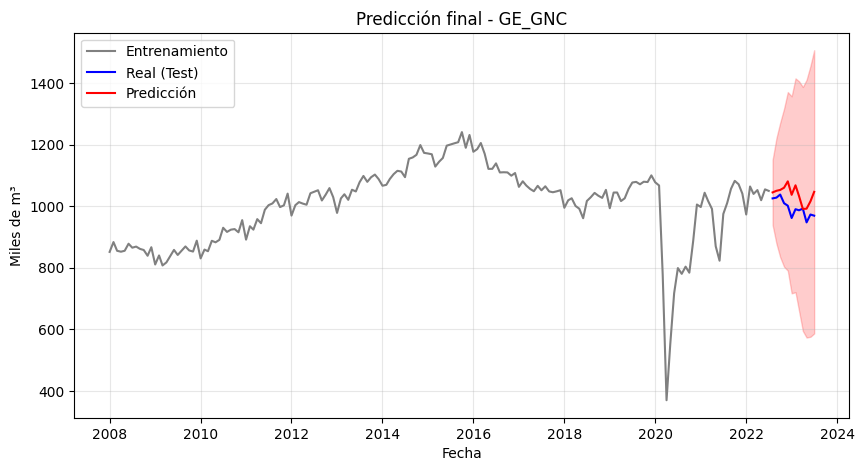


🏷️ Entrenando mejor modelo para: GE_GNC
   order=(1, 1, 1), seasonal_order=(1, 1, 1, 12)


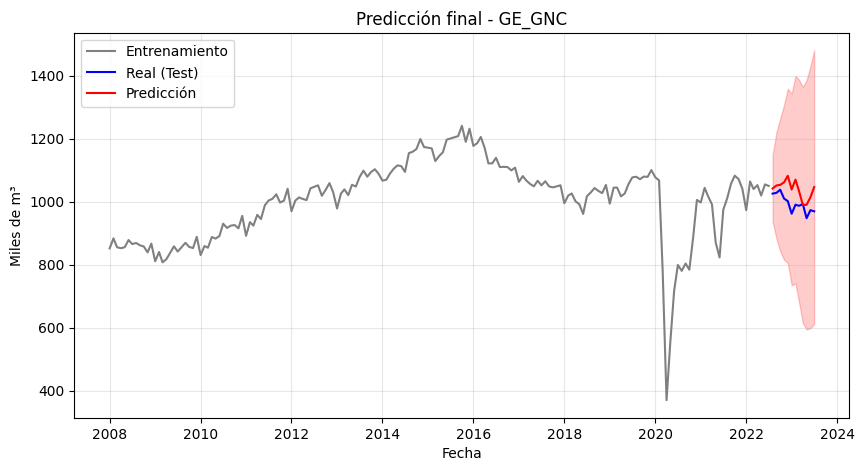


🏷️ Entrenando mejor modelo para: GE_SDB
   order=(1, 1, 1), seasonal_order=(0, 1, 1, 12)


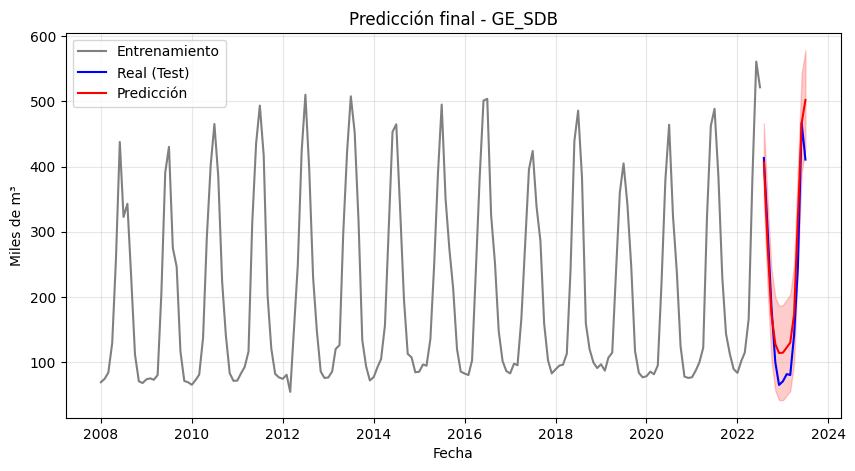


🏷️ Entrenando mejor modelo para: GE_SDB
   order=(1, 1, 1), seasonal_order=(1, 1, 1, 12)


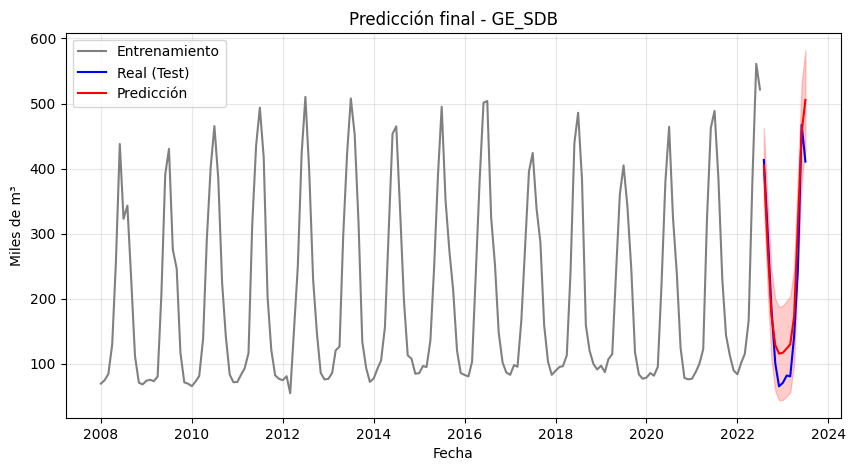


🏷️ Entrenando mejor modelo para: GE_ENTES
   order=(1, 1, 1), seasonal_order=(0, 1, 1, 12)


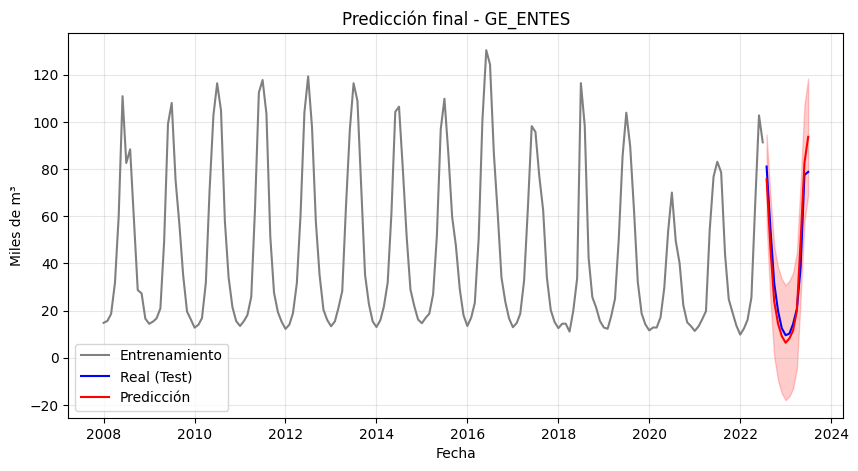


🏷️ Entrenando mejor modelo para: GE_ENTES
   order=(0, 1, 1), seasonal_order=(0, 1, 1, 12)


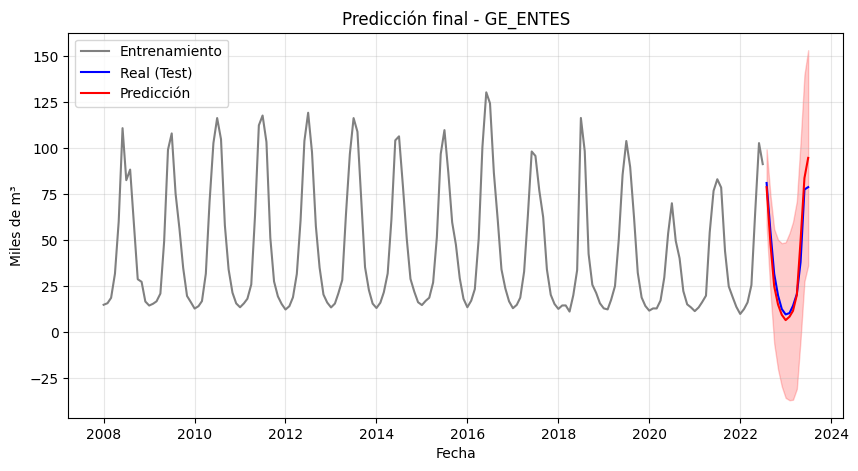


🏷️ Entrenando mejor modelo para: GE_ENTES
   order=(1, 1, 1), seasonal_order=(1, 1, 1, 12)


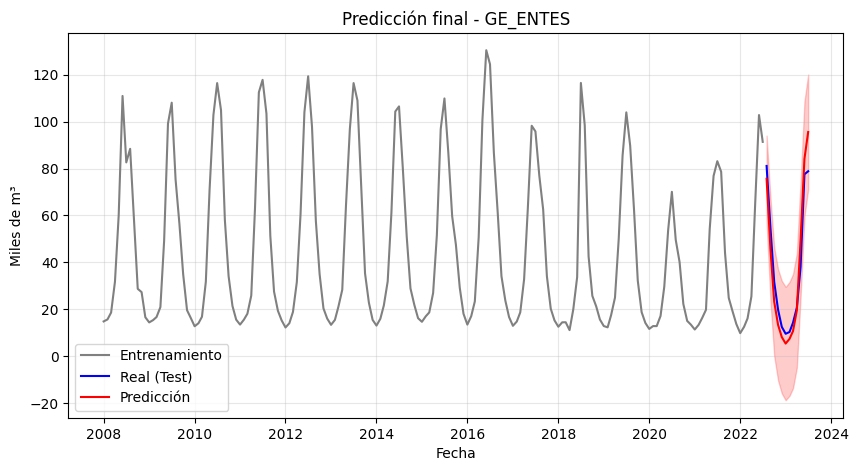


🏷️ Entrenando mejor modelo para: GE_COM
   order=(1, 1, 1), seasonal_order=(1, 1, 1, 12)


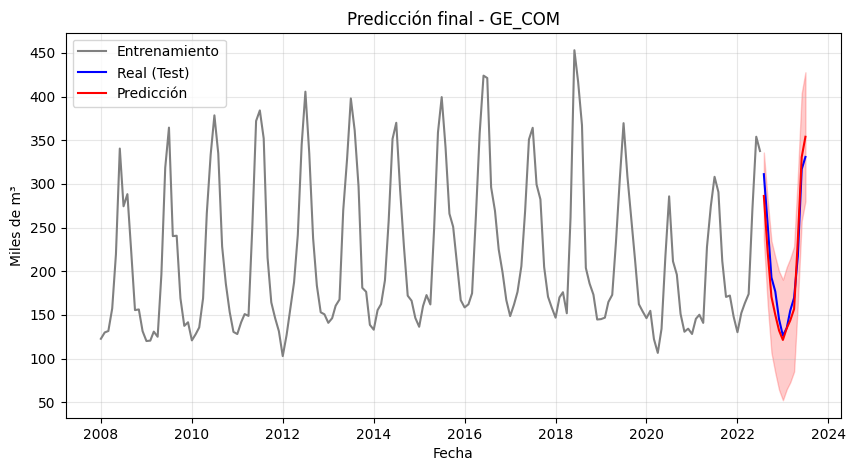


🏷️ Entrenando mejor modelo para: GE_COM
   order=(0, 1, 1), seasonal_order=(0, 1, 1, 12)


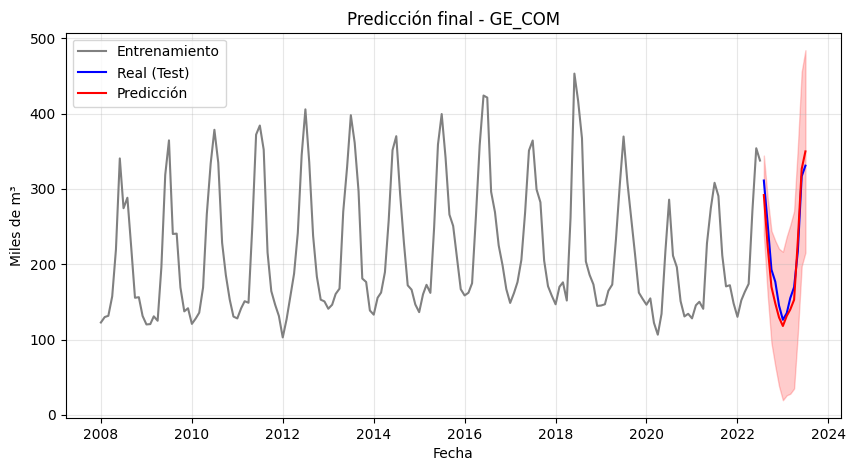


🏷️ Entrenando mejor modelo para: GE_COM
   order=(1, 1, 1), seasonal_order=(0, 1, 1, 12)


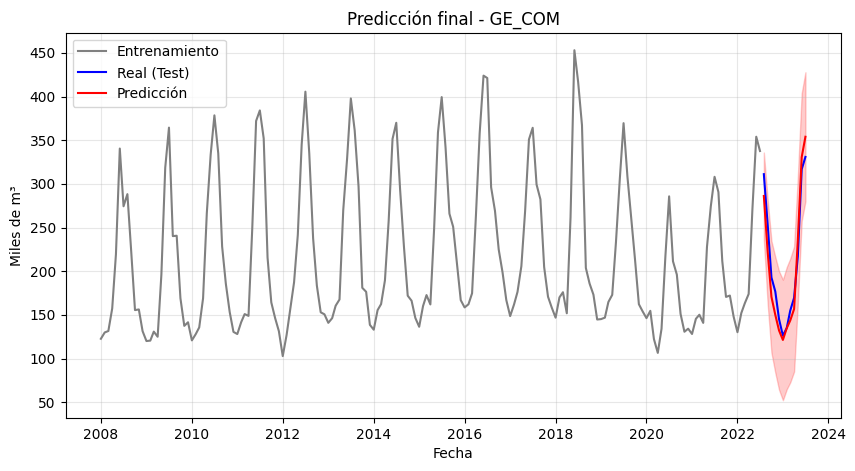


🏷️ Entrenando mejor modelo para: GE_CEN
   order=(0, 1, 0), seasonal_order=(0, 1, 1, 12)


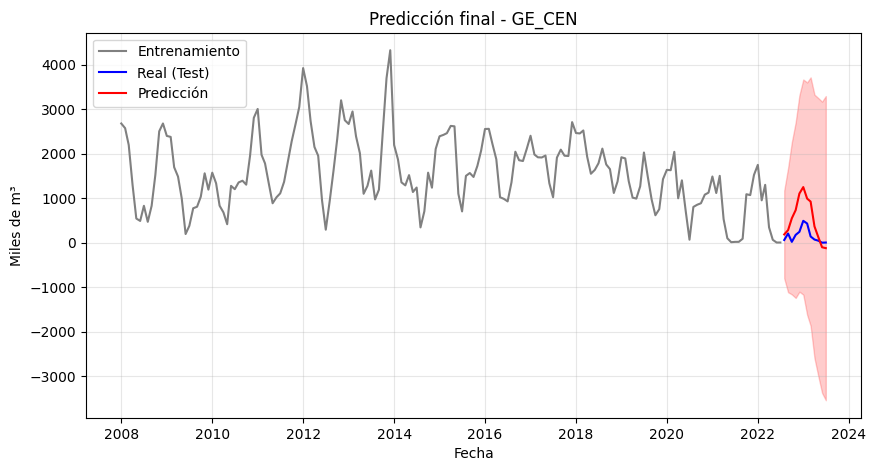


🏷️ Entrenando mejor modelo para: GE_CEN
   order=(0, 1, 1), seasonal_order=(0, 1, 1, 12)


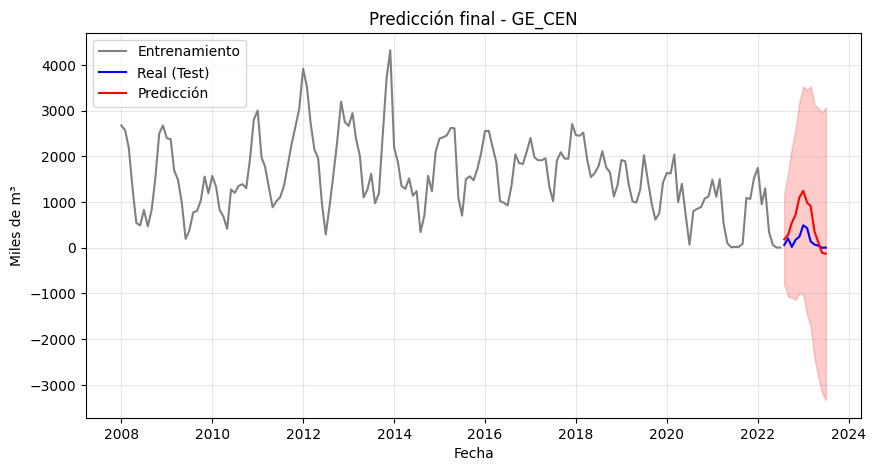


🏷️ Entrenando mejor modelo para: GE_CEN
   order=(0, 1, 1), seasonal_order=(1, 1, 1, 12)


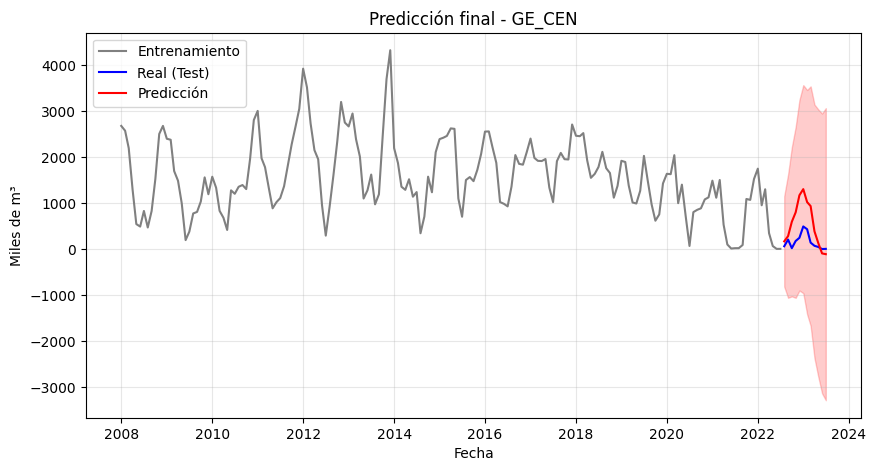


🏷️ Entrenando mejor modelo para: GE_RES
   order=(1, 1, 1), seasonal_order=(0, 1, 1, 12)


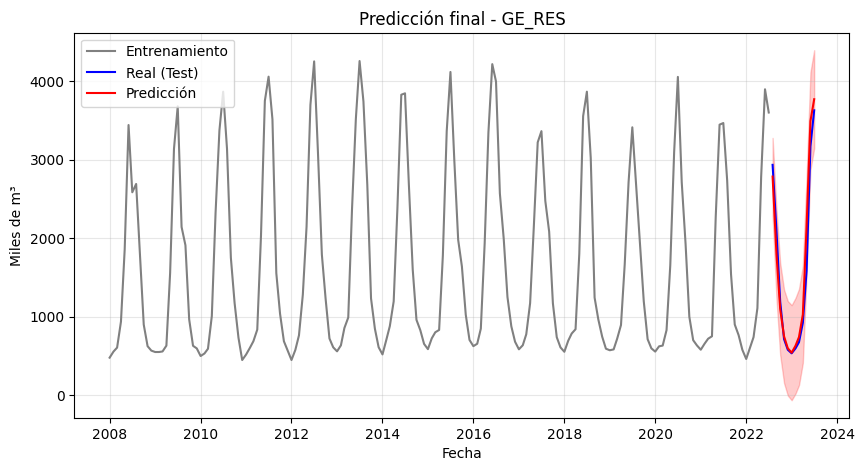


🎉 Listo: se generaron y mostraron todas las predicciones finales.


In [ ]:
# ===========================================
# 4️⃣ Entrenar y graficar los "mejores de los mejores" modelos SARIMA
# ===========================================
import ast
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Leer el archivo con los modelos consistentes
df_consistentes = pd.read_excel("/content/modelos_consistentes.xlsx")

# Recorremos cada modelo seleccionado
for i, fila in df_consistentes.iterrows():
    variable = fila["variable"]
    order = ast.literal_eval(fila["order"])
    seasonal_order = ast.literal_eval(fila["seasonal_order"])

    print(f"\n🏷️ Entrenando mejor modelo para: {variable}")
    print(f"   order={order}, seasonal_order={seasonal_order}")

    # Usamos df_aux2 (sin exógenas)
    serie = df_aux2[variable].dropna()

    # División entrenamiento / test
    train = serie.iloc[:-12]
    test = serie.iloc[-12:]

    # Entrenamiento del modelo
    model = SARIMAX(train, order=order, seasonal_order=seasonal_order,
                    enforce_stationarity=False, enforce_invertibility=False)
    results = model.fit(disp=False)

    # Predicción
    pred = results.get_forecast(steps=12)
    pred_mean = pred.predicted_mean
    pred_ci = pred.conf_int()

    # Gráfico
    plt.figure(figsize=(10,5))
    plt.plot(train.index, train, label='Entrenamiento', color='gray')
    plt.plot(test.index, test, label='Real (Test)', color='blue')
    plt.plot(pred_mean.index, pred_mean, label='Predicción', color='red')
    plt.fill_between(pred_ci.index, pred_ci.iloc[:, 0], pred_ci.iloc[:, 1],
                     color='red', alpha=0.2)
    plt.title(f"Predicción final - {variable}")
    #Etiquetas de los ejes
    plt.xlabel("Fecha")
    plt.ylabel("Miles de m³")
    plt.legend()
    plt.grid(True, alpha=0.3)

    # Mostrar directamente en Colab
    plt.show()

print("\n🎉 Listo: se generaron y mostraron todas las predicciones finales.")


## EMISIONES SOLO USANDO GAS

La celda a continuación:

Usa los modelos que se eligieron en df_consistentes.

Calcula emisiones para cada tipo de gas entregado.

Genera gráficos del gas y de las emisiones (histórico + predicción).

Guarda las imágenes en la carpeta graficos_emisiones/.

In [ ]:
## Conversión del Factor de Emisión de Gas Natural

# ----------------------------------------------------
# 1. Datos de entrada (Ingresa tus valores aquí)
# ----------------------------------------------------

# Factor de Emisión en toneladas de CO2 por tonelada equivalente de petróleo (tCO2/tep)
factor_emision_tco2_tep = 2.351

# Poder Calorífico Inferior (PCI) del gas natural en kilocalorías por metro cúbico (kcal/m³)
# Utilizamos el valor específico que proporcionaste.
pci_kcal_m3 = 9300

# ----------------------------------------------------
# 2. Constantes
# ----------------------------------------------------

# Definición de Tonelada Equivalente de Petróleo (tep) en kilocalorías (kcal)
# 1 tep = 10.000.000 kcal
kcal_por_tep = 10_000_000

# Factor para convertir toneladas a kilogramos
kg_por_tonelada = 1000

# ----------------------------------------------------
# 3. Cálculos
# ----------------------------------------------------

# Paso A: Calcular el factor de conversión de energía (tep/m³)
# Mide cuántas tep hay por cada metro cúbico de gas.
factor_conversion_tep_m3 = pci_kcal_m3 / kcal_por_tep

# Paso B: Aplicar la conversión de unidades
# Fórmula: (tCO2/tep) * (kg/t) * (tep/m³) = kgCO2/m³
factor_emision_kgco2_m3 = factor_emision_tco2_tep * kg_por_tonelada * factor_conversion_tep_m3

# ----------------------------------------------------
# 4. Resultados
# ----------------------------------------------------

print("--- Conversión de Factor de Emisión de Gas Natural ---")
print(f"1. Factor de Emisión inicial (tCO2/tep): {factor_emision_tco2_tep}")
print(f"2. PCI del Gas Natural (kcal/m³): {pci_kcal_m3}")
print(f"3. Factor de Conversión calculado (tep/m³): {factor_conversion_tep_m3:.6f}")
print("--------------------------------------------------")
print(f"Resultado Final: {factor_emision_kgco2_m3:.4f} kgCO2/m³")
print("--------------------------------------------------")

--- Conversión de Factor de Emisión de Gas Natural ---
1. Factor de Emisión inicial (tCO2/tep): 2.351
2. PCI del Gas Natural (kcal/m³): 9300
3. Factor de Conversión calculado (tep/m³): 0.000930
--------------------------------------------------
Resultado Final: 2.1864 kgCO2/m³
--------------------------------------------------


In [ ]:
## Conversión del Factor de Emisión del IPCC (kgCO2/TJ) a kgCO2/m³

# ----------------------------------------------------
# 1. Datos de entrada (Ingresa tus valores aquí)
# ----------------------------------------------------

# Factor de Emisión del IPCC en kgCO2 por Terajoule (kgCO2/TJ)
factor_emision_ipcc_kgco2_tj = 56100

# Poder Calorífico Inferior (PCI) del gas natural en kilocalorías por metro cúbico (kcal/m³)
pci_kcal_m3 = 9300

# ----------------------------------------------------
# 2. Constantes de Conversión de Energía
# ----------------------------------------------------

# Relación kJ a kcal (Valor estándar de la caloría termoquímica)
kJ_por_kcal = 4.1868

# Relación TJ a kJ (1 Terajoule = 1,000,000,000 kJ)
kJ_por_TJ = 1e9  # 10**9

# ----------------------------------------------------
# 3. Cálculos
# ----------------------------------------------------

# Paso A: Calcular la equivalencia de Terajoule a Kilocalorías (kcal/TJ)
# TJ -> kJ -> kcal
kcal_por_TJ = kJ_por_TJ / kJ_por_kcal

# Paso B: Aplicar la fórmula de conversión
# La fórmula convierte la energía de la unidad TJ a m³ usando el PCI.
# Fórmula: (kgCO2/TJ) * (TJ/kcal) * (kcal/m³) = kgCO2/m³
factor_emision_kgco2_m3_ipcc = factor_emision_ipcc_kgco2_tj * (pci_kcal_m3 / kcal_por_TJ)

# ----------------------------------------------------
# 4. Resultados
# ----------------------------------------------------

print("--- Conversión de Factor de Emisión del IPCC ---")
print(f"1. Factor de Emisión IPCC (kgCO2/TJ): {factor_emision_ipcc_kgco2_tj}")
print(f"2. PCI del Gas Natural (kcal/m³): {pci_kcal_m3}")
print(f"3. Equivalencia calculada (kcal/TJ): {kcal_por_TJ:.2f}")
print("--------------------------------------------------")
print(f"Resultado Final: {factor_emision_kgco2_m3_ipcc:.4f} kgCO2/m³")
print("--------------------------------------------------")

--- Conversión de Factor de Emisión del IPCC ---
1. Factor de Emisión IPCC (kgCO2/TJ): 56100
2. PCI del Gas Natural (kcal/m³): 9300
3. Equivalencia calculada (kcal/TJ): 238845896.63
--------------------------------------------------
Resultado Final: 2.1844 kgCO2/m³
--------------------------------------------------


In [ ]:
df = pd.read_excel("/content/modelos_consistentes.xlsx")
df.columns


Index(['variable', 'order', 'seasonal_order'], dtype='object')


El siguiente código hace lo siguiente:
- Generar predicciones y gráficos de emisiones desde modelos consistentes
- Lee modelos_consistentes.xlsx (cols: variable, order, seasonal_order)
- Usa df_aux2 (index datetime) con columnas:
GE_TOTAL, GE_IND, GE_GNC, GE_SDB, GE_ENTES, GE_COM, GE_CEN, GE_RES
- Factores (kg CO2 / m3), pero para mejorar la visibilidad de los gráficos se pasa toneladas/m3
- Guarda gráficos y resumen en /content/graficos_emisiones
- Se guarda en un zip a todos los gráficos


In [ ]:
# ===========================================
# 📌 0. Imports
# ===========================================
import ast
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
from statsmodels.tsa.statespace.sarimax import SARIMAX
import warnings
warnings.filterwarnings("ignore")

from google.colab import files
import shutil


# ===========================================
# 📂 1. Crear carpeta para guardar los gráficos
# ===========================================
output_folder = "/content/graficos_emisiones"
os.makedirs(output_folder, exist_ok=True)

print("📁 Carpeta creada:", output_folder)


# ===========================================
# 📄 2. Leer archivo con los modelos consistentes
# ===========================================
df_cons = pd.read_excel("/content/modelos_consistentes.xlsx")

# Convertir strings de tuplas a tuplas reales
df_cons["order"] = df_cons["order"].apply(ast.literal_eval)
df_cons["seasonal_order"] = df_cons["seasonal_order"].apply(ast.literal_eval)

print("✔ Archivo de modelos consistentes cargado.")
print(df_cons.head())


# ===========================================
# 📊 3. Dataset maestro con todas las variables de gas
# ===========================================
# Debe existir en tu sesión como df_aux2
print("📌 Variables disponibles en df_aux2:", df_aux2.columns.tolist())


# ===========================================
# 💨 4. Factores de emisión correctos
# ===========================================
# kg CO2 por m³ de GN (NCV 9300 kcal)
factores_emision = {
    "IPCC": 2.1844,
    "ARG": 2.1864
}


# ===========================================
# 📈 5. Entrenamiento, predicción y gráficos
# ===========================================
for idx, fila in df_cons.iterrows():

    variable = fila["variable"]
    order = fila["order"]
    seasonal_order = fila["seasonal_order"]

    print(f"\n==============================")
    print(f"📌 Procesando: {variable}")
    print(f"   Modelo: {order} × {seasonal_order}")
    print("==============================")

    # Extraer la serie mensual
    serie = df_aux2[variable].dropna()

    # División 12 meses test
    train = serie.iloc[:-12]
    test = serie.iloc[-12:]

    # Entrenar SARIMA
    model = SARIMAX(
        train,
        order=order,
        seasonal_order=seasonal_order,
        enforce_stationarity=False,
        enforce_invertibility=False
    )
    results = model.fit(disp=False)

    # Predicción 12 meses
    pred = results.get_forecast(steps=12)
    forecast = pred.predicted_mean

    # ===========================================
    # 💨 Cálculo de emisiones
    # ===========================================
    emisiones_hist = pd.DataFrame(index=serie.index)
    emisiones_pred = pd.DataFrame(index=forecast.index)

    for nombre, factor in factores_emision.items():
        # histórico
        emisiones_hist[nombre] = (serie * factor) / 1000  # toneladas
        # predicción
        emisiones_pred[nombre] = (forecast * factor) / 1000  # toneladas

    # ===========================================
    # 📊 Gráficos
    # ===========================================
    fig, axs = plt.subplots(2, 1, figsize=(10, 7), sharex=True)

    # Gas (train / test / predicción)
    axs[0].plot(train.index, train, label="Train", color="gray", linestyle="--")
    axs[0].plot(test.index, test, label="Test", color="orange", linestyle="--")
    axs[0].plot(forecast.index, forecast, label="Predicción", color="blue")
    axs[0].set_title(f"Predicción de Gas – {variable}")
    axs[0].set_ylabel("m³ (9300 kcal)")
    axs[0].legend()

    # Emisiones
    for nombre in factores_emision.keys():
        axs[1].plot(emisiones_hist.index, emisiones_hist[nombre], label=f"Histórico {nombre}")
        axs[1].plot(emisiones_pred.index, emisiones_pred[nombre], linestyle="--", label=f"Predicción {nombre}")

    axs[1].set_title(f"Emisiones de CO₂ (toneladas) – {variable}")
    axs[1].set_ylabel("t CO₂")
    axs[1].legend()

    plt.tight_layout()

    # Guardar gráfico PNG
    filename = f"{variable}_SARIMA_{order}_{seasonal_order}.png".replace(" ", "")
    filepath = os.path.join(output_folder, filename)
    plt.savefig(filepath, dpi=300, bbox_inches="tight")
    plt.close()

    print(f"✔ Gráfico guardado: {filepath}")


# ===========================================
# 🎁 6. Crear ZIP descargable
# ===========================================
zip_path = "/content/graficos_emisiones.zip"
shutil.make_archive("/content/graficos_emisiones", "zip", output_folder)

print("\n🎉 LISTO: ZIP generado")
print("➡ Descargalo abajo cuando aparezca")

files.download(zip_path)


📁 Carpeta creada: /content/graficos_emisiones
✔ Archivo de modelos consistentes cargado.
   variable      order seasonal_order
0  GE_TOTAL  (0, 1, 1)  (0, 1, 1, 12)
1  GE_TOTAL  (1, 1, 1)  (0, 1, 1, 12)
2    GE_IND  (1, 1, 1)  (0, 1, 1, 12)
3    GE_IND  (1, 1, 1)  (1, 1, 1, 12)
4    GE_GNC  (1, 1, 1)  (0, 1, 1, 12)
📌 Variables disponibles en df_aux2: ['GE_TOTAL', 'US_TOTAL', 'GE_SDB', 'US_SDB', 'GE_RES', 'US_RES', 'GE_IND', 'US_IND', 'GE_GNC', 'US_GNC', 'GE_ENTES', 'US_ENTES', 'GE_COM', 'US_COM', 'GE_CEN', 'US_CENT', 'Time', 'MES_ANIO']

📌 Procesando: GE_TOTAL
   Modelo: (0, 1, 1) × (0, 1, 1, 12)
✔ Gráfico guardado: /content/graficos_emisiones/GE_TOTAL_SARIMA_(0,1,1)_(0,1,1,12).png

📌 Procesando: GE_TOTAL
   Modelo: (1, 1, 1) × (0, 1, 1, 12)
✔ Gráfico guardado: /content/graficos_emisiones/GE_TOTAL_SARIMA_(1,1,1)_(0,1,1,12).png

📌 Procesando: GE_IND
   Modelo: (1, 1, 1) × (0, 1, 1, 12)
✔ Gráfico guardado: /content/graficos_emisiones/GE_IND_SARIMA_(1,1,1)_(0,1,1,12).png

📌 Procesando: GE

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# MÉTRICAS PARA EVALUAR MODELOS

AIC y BIC eligen el modelo más apropiado.

RMSE y MAE comprueban qué tan bien predice ese modelo.

1. AIC (Akaike Information Criterion)

Qué mide: qué tan bien se ajusta el modelo a los datos, penalizando la complejidad (cantidad de parámetros).

Interpretación: cuanto más bajo, mejor.

Sirve para comparar varios modelos: el que tenga menor AIC es el más eficiente (ajuste bueno sin ser demasiado complejo).

Se usa mucho en ARIMA/SARIMA porque tiene en cuenta el equilibrio entre bondad del ajuste y simplicidad.

Ejemplo:
Si tenés un modelo SARIMA(1,1,1)(1,1,1,12) con AIC = 3100 y otro SARIMA(1,1,0)(1,1,1,12) con AIC = 3080 → el segundo es preferible.

2. BIC (Bayesian Information Criterion)

Parecido al AIC, pero penaliza aún más los modelos con muchos parámetros.

También cuanto más bajo, mejor.

Si AIC y BIC difieren, el BIC suele preferir el modelo más simple.

Aclaración: AIC favorece el ajuste, BIC favorece la parsimonia (simpleza).

3. RMSE (Root Mean Squared Error)

Error cuadrático medio, mide la diferencia promedio entre valores predichos y observados.

Se calcula sobre los datos de test (no de entrenamiento).

Cuanto más bajo, mejor precisión de predicción.

Penaliza más los errores grandes (porque los eleva al cuadrado antes de promediarlos).

4. MAE (Mean Absolute Error)

Similar al RMSE, pero sin elevar al cuadrado los errores.

Mide el error promedio absoluto (sin importar el signo).

Es más robusto frente a valores atípicos.

# Método inverso, propuesta

## Con HDD
Se usan los datos horarios del SMN (solo de temperatura) y se usan para redistribuir el gas mensual en base a estos.

Se toma los datos horarios del SMN (temperatura), se calcula pesos diarios/horarios (por defecto HDD — Heating Degree Days: max(0, T_base − TEMP)), normaliza por mes y distribuye el consumo mensual de gas hacia días y horas.

Se incluyen opciones (HDD), cubre los casos en que el consumo mensual está por estación o solo a nivel provincia, y genera los DataFrame finales consumo_diario y consumo_horario. También opcionalmente calcula emisiones con factores.

Funcionamiento del código:

1- Convertir datos horarios SMN a datos diarios

Toma tu df_interp horario y calcula:

Temperatura diaria promedio (media aritmética diaria)

(también FF, HUM, PNM pero no nos interesan ahora)

2- Calcular un "peso" diario en base a la temperatura: HDD (Heating Degree Day)
El HDD se calcula así:

HDD = max(0, T_base – TEMP_diaria)

Cuanto más frío esté un día, mayor será su HDD, por lo tanto, mayor será su peso.

Luego normaliza los HDD dentro del mes, de manera que:
Suma(Peso_dia) = 1  en ese mes

3- Tomar el consumo mensual de gas (df_aux2) y repartirlo entre días

Supongamos que julio 2021 tuvo:

Consumo mensual = 1000 m³

Día 1: peso = 0.03

Día 2: peso = 0.04

…

Entonces:
consumo_dia = peso_dia * consumo_mensual

En este caso se eligieron dos meses como ejemplo, julio del 2021 y diciembre del 2021, pero podría hacerse para cualquier otro mes siempre y cuando se dispongan los datos del consumo mensual de gas y los datos horarios meteorológicos del mes que se elija.



In [ ]:
import pandas as pd

path_interp = '/content/drive/MyDrive/PS/BASE_DATO/DF_SMN_HORARIO.xlsx'
df_interp = pd.read_excel(path_interp)

print(df_interp.head())


           FECHA_HORA  TEMP   HUM     PNM     DD    FF      ESTACION  \
0 2018-01-01 00:00:00  18.2   0.0  1015.0  180.0   9.0  CORDOBA AERO   
1 2018-01-01 01:00:00  18.0   0.0  1013.7  160.0  13.0  CORDOBA AERO   
2 2018-01-01 02:00:00  18.0  99.0  1012.0  110.0   4.0  CORDOBA AERO   
3 2018-01-01 03:00:00  17.7  99.0  1010.5  200.0   4.0  CORDOBA AERO   
4 2018-01-01 04:00:00  17.8   0.0  1010.7  230.0  13.0  CORDOBA AERO   

   OUTLIER_MAD  OUTLIER_MCD  OUTLIER_FINAL MES_ANIO  MES  HORA  
0          1.0          1.0            1.0  2018-01    1     0  
1          1.0          1.0            1.0  2018-01    1     1  
2          0.0          0.0            1.0  2018-01    1     2  
3          0.0          0.0            1.0  2018-01    1     3  
4          1.0          1.0            1.0  2018-01    1     4  


In [ ]:
import pandas as pd
import numpy as np

def redistribuir_gas_HDD(df_interp, df_aux2, meses, T_base=18):
    """
    meses: lista de meses seleccionados en formato 'YYYY-MM'
           ej.: ['2021-07', '2021-12']
    """

    # --- Preparar df horario ---
    df = df_interp.copy()
    df['FECHA_HORA'] = pd.to_datetime(df['FECHA_HORA'])
    df['DAY'] = df['FECHA_HORA'].dt.floor('D')
    df['MES'] = df['FECHA_HORA'].dt.to_period('M').dt.to_timestamp()

    # Filtrar solo los meses pedidos
    meses_ts = [pd.to_datetime(m).to_period('M').to_timestamp() for m in meses]
    df = df[df['MES'].isin(meses_ts)]

    # --- Promedio diario ---
    df_daily = (
        df.groupby(['ESTACION', 'DAY'])
          .agg(TEMP=('TEMP','mean'))
          .reset_index()
    )
    df_daily['DAY'] = pd.to_datetime(df_daily['DAY'])
    df_daily['MES'] = df_daily['DAY'].dt.to_period('M').dt.start_time

    # --- HDD diario ---
    df_daily['HDD'] = np.maximum(0, T_base - df_daily['TEMP'])

    # --- Normalización mensual de HDD ---
    df_daily['HDD_sum_mes'] = df_daily.groupby(['ESTACION','MES'])['HDD'].transform('sum')
    df_daily['peso_dia'] = np.where(
        df_daily['HDD_sum_mes'] > 0,
        df_daily['HDD'] / df_daily['HDD_sum_mes'],
        1 / df_daily.groupby(['ESTACION','MES'])['DAY'].transform('count')   # caso extremo sin frío
    )

    # --- Preparar df_aux2 ---
    df_gas = df_aux2.copy()
    df_gas.index = pd.to_datetime(df_gas.index).to_period('M').to_timestamp()

    # Filtrar gas solo a los meses elegidos
    df_gas_filt = df_gas[df_gas.index.isin(meses_ts)]

    # --- Merge entre gas mensual y pesos diarios ---
    df_daily = df_daily.merge(
        df_gas_filt,
        left_on='MES',
        right_index=True,
        how='left'
    )

    # Suponemos que el consumo a redistribuir es df_aux2['GE_RES']
    df_daily['consumo_dia_m3'] = df_daily['GE_RES'] * df_daily['peso_dia']

    return df_daily


# Ejemplo de uso
meses = ['2021-07', '2021-12']

resultado = redistribuir_gas_HDD(
    df_interp=df_interp,
    df_aux2=df_aux2,
    meses=meses,
    T_base=18
)

resultado.head()


,ESTACION,DAY,TEMP,MES,HDD,HDD_sum_mes,peso_dia,GE_TOTAL,US_TOTAL,GE_SDB,...,GE_GNC,US_GNC,GE_ENTES,US_ENTES,GE_COM,US_COM,GE_CEN,US_CENT,Time,consumo_dia_m3
0,CORDOBA AERO,2021-07-01,8.425000,2021-07-01,9.575000,218.245652,0.043873,7146.258065,23408.193548,488.645161,...,974.903226,9.612903,83.129032,79.580645,308.096774,780.193548,18.709677,0.193548,162,152.195398
1,CORDOBA AERO,2021-07-02,8.387500,2021-07-01,9.612500,218.245652,0.044044,7146.258065,23408.193548,488.645161,...,974.903226,9.612903,83.129032,79.580645,308.096774,780.193548,18.709677,0.193548,162,152.791463
2,CORDOBA AERO,2021-07-03,8.437500,2021-07-01,9.562500,218.245652,0.043815,7146.258065,23408.193548,488.645161,...,974.903226,9.612903,83.129032,79.580645,308.096774,780.193548,18.709677,0.193548,162,151.996709
3,CORDOBA AERO,2021-07-04,12.308333,2021-07-01,5.691667,218.245652,0.026079,7146.258065,23408.193548,488.645161,...,974.903226,9.612903,83.129032,79.580645,308.096774,780.193548,18.709677,0.193548,162,90.469501
4,CORDOBA AERO,2021-07-05,11.166667,2021-07-01,6.833333,218.245652,0.031310,7146.258065,23408.193548,488.645161,...,974.903226,9.612903,83.129032,79.580645,308.096774,780.193548,18.709677,0.193548,162,108.616385


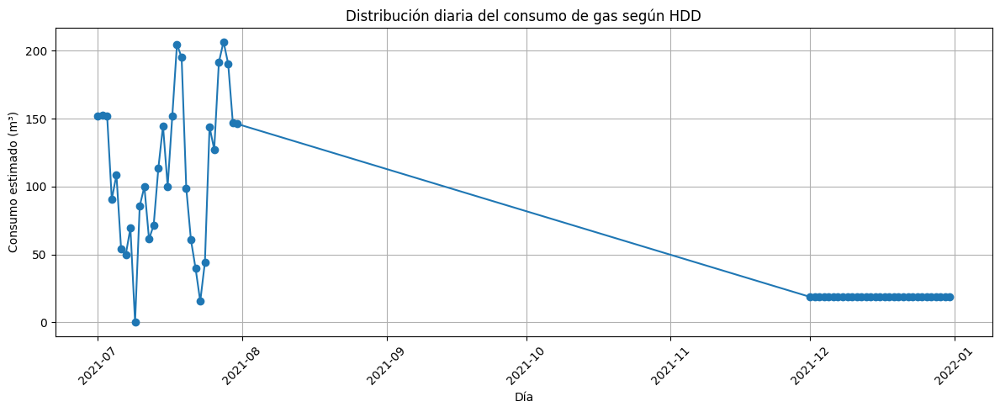

In [ ]:
import matplotlib.pyplot as plt

# Filtrar por estación
estacion = 'CORDOBA AERO'

df_plot = resultado[resultado['ESTACION'] == estacion].copy()

plt.figure(figsize=(12,5))
plt.plot(df_plot['DAY'], df_plot['consumo_dia_m3'], marker='o')
plt.title('Distribución diaria del consumo de gas según HDD')
plt.xlabel('Día')
plt.ylabel('Consumo estimado (m³)')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


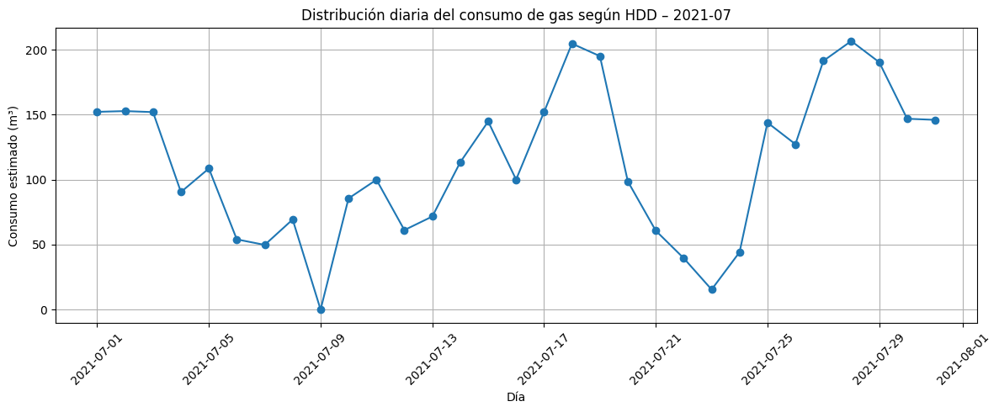

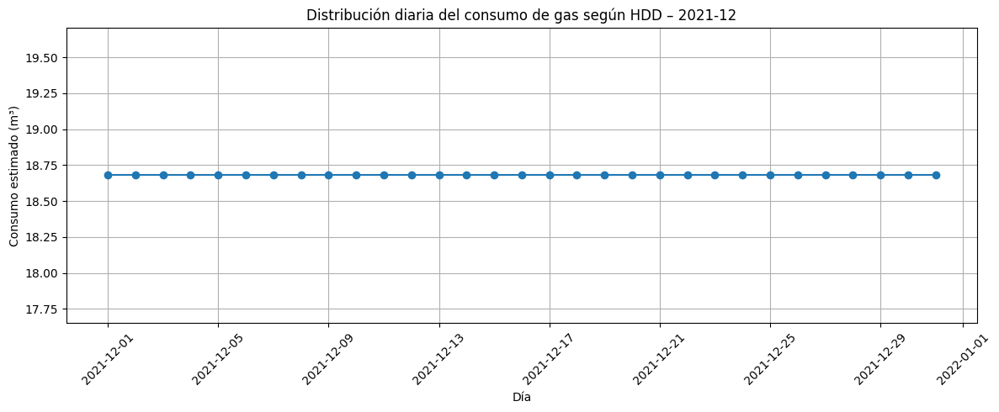

In [ ]:
import matplotlib.pyplot as plt

# Filtrar por estación
estacion = 'CORDOBA AERO'
df_plot = resultado[resultado['ESTACION'] == estacion].copy()

# --- Lista de meses a graficar ---
meses_a_graficar = ['2021-07', '2021-12']

for mes in meses_a_graficar:
    df_mes = df_plot[df_plot['MES'].dt.strftime('%Y-%m') == mes]

    plt.figure(figsize=(12,5))
    plt.plot(df_mes['DAY'], df_mes['consumo_dia_m3'], marker='o')
    plt.title(f'Distribución diaria del consumo de gas según HDD – {mes}')
    plt.xlabel('Día')
    plt.ylabel('Consumo estimado (m³)')
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


In [ ]:
df_mes.columns


Index(['ESTACION', 'DAY', 'TEMP', 'MES', 'HDD', 'HDD_sum_mes', 'peso_dia',
       'GE_TOTAL', 'US_TOTAL', 'GE_SDB', 'US_SDB', 'GE_RES', 'US_RES',
       'GE_IND', 'US_IND', 'GE_GNC', 'US_GNC', 'GE_ENTES', 'US_ENTES',
       'GE_COM', 'US_COM', 'GE_CEN', 'US_CENT', 'Time', 'consumo_dia_m3'],
      dtype='object')

In [ ]:
df_mes[["DAY", "HDD", "consumo_dia_m3"]].head(10)


,DAY,HDD,consumo_dia_m3
31,2021-12-01,0.0,18.67846
32,2021-12-02,0.0,18.67846
33,2021-12-03,0.0,18.67846
34,2021-12-04,0.0,18.67846
35,2021-12-05,0.0,18.67846
36,2021-12-06,0.0,18.67846
37,2021-12-07,0.0,18.67846
38,2021-12-08,0.0,18.67846
39,2021-12-09,0.0,18.67846
40,2021-12-10,0.0,18.67846


In [ ]:
df_mes = resultado[resultado['MES'] == '2021-07-01']
df_mes[['DAY', 'HDD', 'consumo_dia_m3']].head(10)


,DAY,HDD,consumo_dia_m3
0,2021-07-01,9.575000,152.195398
1,2021-07-02,9.612500,152.791463
2,2021-07-03,9.562500,151.996709
3,2021-07-04,5.691667,90.469501
4,2021-07-05,6.833333,108.616385
5,2021-07-06,3.400000,54.043274
6,2021-07-07,3.133333,49.804586
7,2021-07-08,4.362500,69.342290
8,2021-07-09,0.000000,0.000000
9,2021-07-10,5.383333,85.568518


**Método inverso para conseguir datos horarios de gas**

Paso 1: Preparar dataframe horario con HDD por hora.

In [ ]:
#df_h = df_interp.copy()
#df_h['FECHA_HORA'] = pd.to_datetime(df_h['FECHA_HORA'])
#df_h['DAY'] = df_h['FECHA_HORA'].dt.floor('D')
#T_base = 18
# Calcular HDD horario
#df_h['HDD_hour'] = np.maximum(0, T_base - df_h['TEMP'])


Paso 2: Asignar a cada hora el consumo del día correspondiente. Se necesita unir df_h con el resultado diario.

In [ ]:
#df_h2 = df_h.merge(
    #resultado[['ESTACION','DAY','consumo_dia_m3']],
    #left_on=['ESTACION','DAY'],
    #right_on=['ESTACION','DAY'],
    #how='left'
#)


Paso 3: Pesos horarios dentro de cada día.

In [ ]:
# suma de HDD del día
#df_h2['HDD_sum_day'] = df_h2.groupby(['ESTACION','DAY'])['HDD_hour'].transform('sum')

# si HDD = 0 (día sin calefacción), reparto uniforme
#mask = df_h2['HDD_sum_day'] == 0
#df_h2.loc[mask, 'peso_hora'] = 1 / df_h2.groupby(['ESTACION','DAY'])['HORA'].transform('count')
#df_h2.loc[~mask, 'peso_hora'] = df_h2['HDD_hour'] / df_h2['HDD_sum_day']

# consumo horario final
#df_h2['consumo_hora_m3'] = df_h2['peso_hora'] * df_h2['consumo_dia_m3']


Paso 4: Gráfico de la curva suave de consumo estimado por hora

In [ ]:
#df_plot_h = df_h2[df_h2['ESTACION'] == estacion]

#plt.figure(figsize=(14,5))
#plt.plot(df_plot_h['FECHA_HORA'], df_plot_h['consumo_hora_m3'])
#plt.title('Distribución horaria del consumo de gas según HDD por hora')
#plt.xlabel('Fecha y hora')
#plt.ylabel('Consumo horario estimado (m³)')
#plt.grid(True)
#plt.tight_layout()
#plt.show()


In [ ]:
#df_plot_h = df_h2[df_h2['ESTACION'] == estacion]

# --- JULIO 2021 ---
#df_julio = df_plot_h[df_plot_h['FECHA_HORA'].dt.to_period('M') == '2021-07']

#plt.figure(figsize=(14,5))
#plt.plot(df_julio['FECHA_HORA'], df_julio['consumo_hora_m3'])
#plt.title('Distribución horaria del consumo de gas – Julio 2021')
#plt.xlabel('Fecha y hora')
#plt.ylabel('Consumo horario estimado (m³)')
#plt.grid(True)
#plt.tight_layout()
#plt.show()


# --- DICIEMBRE 2021 ---
#df_diciembre = df_plot_h[df_plot_h['FECHA_HORA'].dt.to_period('M') == '2021-12']

#plt.figure(figsize=(14,5))
#plt.plot(df_diciembre['FECHA_HORA'], df_diciembre['consumo_hora_m3'])
#plt.title('Distribución horaria del consumo de gas – Diciembre 2021')
#plt.xlabel('Fecha y hora')
#plt.ylabel('Consumo horario estimado (m³)')
#plt.grid(True)
#plt.tight_layout()
#lt.show()


NOTA: Parece raro que haya días que dé un consumo más alto que en invierno en diciembre como picos muy puntuales. Pero eso es totalmente esperable con el método HDD si no se filtra lo que pasa cuando la temperatura de un día de verano casualmente da un HDD > 0.
Y sí puede pasar en diciembre si justo hubo una madrugada muy fría (por ejemplo 13°C–14°C) → porque:

HDD = max(0, T_base – T_media_diaria)


Con T_base=18°C:

día de julio típico → T_media 8°C → HDD=10

pero un día atípico de diciembre con T_media 14°C → HDD=4

Y si ese mes de diciembre tiene muchos días con HDD=0, entonces:

los pocos días con HDD>0 reciben todo el peso del mes,

y eso genera picos grandes cuando distribuís el gas mensual.

Es un artefacto natural del método. No es un error.

Para que el consumo horario tenga sentido:

Primero hay que separar consumo base del consumo dependiente del clima.

Solo así:

Julio tendrá picos.

Diciembre quedará plano.

No habrá explosiones numéricas por dividir por HDD ≈ 0.

Aclaración: El consumo real de gas está directamente asociado a la necesidad de calefacción, y eso se mide mejor hora a hora que por día.
✔ Si usás HDD diarios y repartís parejo dentro del día, perdés información clave, por ejemplo:

A las 3 de la tarde en julio hace 19 °C → no hay calefacción

A las 7 de la mañana hace 5 °C → sí hay demanda

✔ Si usás HDD diarios para distribuir, Diciembre (verano) te da distribuciones extrañas porque:

Algunos días tienen HDD ~0 pero la fórmula diaria obliga a repartir consumo igualmente.

No capta las horas reales con demanda (que en verano son casi cero).

1. Estimar el consumo base con regresión lineal mensual vs HDD.


2. Calcular el consumo térmico.

3. Distribuir el consumo térmico por hora según HDD.

Para esto necesitamos:

df_aux2: consumo mensual de gas.

df_interp: temperaturas horarias.

Asumiremos que el HDD se calcula como:

HDD=max(𝑇base−𝑇hora,0)

y por defecto tomamos T_base = 18°C.

Aquí va el código completo:

In [ ]:
print(df_aux2.columns.tolist())


['GE_TOTAL', 'US_TOTAL', 'GE_SDB', 'US_SDB', 'GE_RES', 'US_RES', 'GE_IND', 'US_IND', 'GE_GNC', 'US_GNC', 'GE_ENTES', 'US_ENTES', 'GE_COM', 'US_COM', 'GE_CEN', 'US_CENT', 'Time']


In [ ]:
print(df_interp.columns.tolist())

['FECHA_HORA', 'TEMP', 'HUM', 'PNM', 'DD', 'FF', 'ESTACION', 'OUTLIER_MAD', 'OUTLIER_MCD', 'OUTLIER_FINAL', 'MES_ANIO', 'MES', 'HORA']


In [ ]:

df_aux2.columns
df_aux2.head()


,GE_TOTAL,US_TOTAL,GE_SDB,US_SDB,GE_RES,US_RES,GE_IND,US_IND,GE_GNC,US_GNC,GE_ENTES,US_ENTES,GE_COM,US_COM,GE_CEN,US_CENT,Time
Mes,,,,,,,,,,,,,,,,,
2008-01-01,6027.709677,16255.741935,69.322581,0.451613,478.806452,15565.483871,1813.967742,23.612903,851.645161,6.838710,14.806452,64.741935,122.612903,594.387097,2676.548387,0.225806,0
2008-02-01,5758.793103,17449.724138,74.758621,0.482759,556.241379,16709.793103,1527.103448,26.241379,883.586207,7.310345,15.655172,68.931034,129.862069,636.689655,2571.586207,0.275862,1
2008-03-01,5620.806452,16381.129032,84.193548,0.451613,607.096774,15687.096774,1729.645161,25.387097,855.258065,6.838710,18.580645,64.419355,131.516129,596.677419,2194.516129,0.258065,2
2008-04-01,5043.766667,17008.466667,129.566667,0.466667,937.533333,16289.000000,1642.466667,26.200000,852.266667,7.133333,31.733333,66.733333,157.333333,618.700000,1292.866667,0.233333,3
2008-05-01,5413.161290,16544.838710,257.709677,0.451613,1859.032258,15843.516129,1619.000000,25.419355,855.354839,6.903226,60.032258,65.161290,219.483871,603.161290,542.548387,0.225806,4


In [ ]:
df_interp.columns
df_interp.head()

,FECHA_HORA,TEMP,HUM,PNM,DD,FF,ESTACION,OUTLIER_MAD,OUTLIER_MCD,OUTLIER_FINAL,MES_ANIO,MES,HORA
0,2018-01-01 00:00:00,18.2,0.0,1015.0,180.0,9.0,CORDOBA AERO,1.0,1.0,1.0,2018-01,1,0
1,2018-01-01 01:00:00,18.0,0.0,1013.7,160.0,13.0,CORDOBA AERO,1.0,1.0,1.0,2018-01,1,1
2,2018-01-01 02:00:00,18.0,99.0,1012.0,110.0,4.0,CORDOBA AERO,0.0,0.0,1.0,2018-01,1,2
3,2018-01-01 03:00:00,17.7,99.0,1010.5,200.0,4.0,CORDOBA AERO,0.0,0.0,1.0,2018-01,1,3
4,2018-01-01 04:00:00,17.8,0.0,1010.7,230.0,13.0,CORDOBA AERO,1.0,1.0,1.0,2018-01,1,4


In [ ]:
#import pandas as pd
#import numpy as np
#from sklearn.linear_model import LinearRegression
#import matplotlib.pyplot as plt

# ----------------------------
# 0️⃣ Normalizar nombres de columnas
# ----------------------------
#df_aux2.columns = df_aux2.columns.str.strip().str.upper()
#df_interp.columns = df_interp.columns.str.strip().str.upper()

# ----------------------------
# 1️⃣ Preparar fechas en df_aux2
# ----------------------------
#df_aux2.rename(columns={df_aux2.columns[0]:'FECHA'}, inplace=True)
#df_aux2['FECHA'] = pd.to_datetime(df_aux2['FECHA'])
#df_aux2['MES_ANIO'] = df_aux2['FECHA'].dt.to_period('M')  # para merge

# ----------------------------
# 2️⃣ Preparar df_interp
# ----------------------------
#df_interp['FECHA_HORA'] = pd.to_datetime(df_interp['FECHA_HORA'])
#df_interp['MES_ANIO'] = df_interp['FECHA_HORA'].dt.to_period('M')

# ----------------------------
# 3️⃣ Calcular HDD horario
# ----------------------------
#T_base = 18
#df_interp['HDD'] = np.maximum(T_base - df_interp['TEMP'], 0)

# ----------------------------
# 4️⃣ Iterar por estación
# ----------------------------
#estaciones = df_interp['ESTACION'].unique()
#dfs_result = []

#for est in estaciones:
    #df_est = df_interp[df_interp['ESTACION'] == est].copy()

    # HDD mensual por estación
    #hdd_mensual = df_est.groupby('MES_ANIO')['HDD'].sum().reset_index()
    #hdd_mensual.rename(columns={'HDD':'HDD_MENSUAL'}, inplace=True)

    # Consumo mensual
    #df_consumo = df_aux2[['MES_ANIO','GE_RES']].copy()

    # Merge consumo mensual con HDD mensual
    #df_model = pd.merge(df_consumo, hdd_mensual, on='MES_ANIO', how='left')

    # Eliminar filas con NaN antes de regresión
    #df_model_clean = df_model.dropna(subset=['HDD_MENSUAL','GE_RES'])

    # Regresión lineal: Consumo = a + b*HDD
    #X = df_model_clean[['HDD_MENSUAL']]
    #y = df_model_clean['GE_RES']
    #reg = LinearRegression().fit(X, y)
    #a = reg.intercept_
    #b = reg.coef_[0]

    # Consumo térmico mensual
    #df_model['C_TERMICO'] = df_model['GE_RES'] - a

    # Distribuir consumo térmico por hora
    #df_est = pd.merge(df_est, df_model[['MES_ANIO','C_TERMICO']], on='MES_ANIO', how='left')

    # Peso horario = HDD_h / sum(HDD_h mes)
    #df_est['HDD_MES_TOTAL'] = df_est.groupby('MES_ANIO')['HDD'].transform('sum')
    #df_est['PESO_H'] = np.where(df_est['HDD_MES_TOTAL']>0,
                                #df_est['HDD']/df_est['HDD_MES_TOTAL'],
                                #0)

    # Consumo horario = C_termico * PESO_H + base distribuido equitativamente
    #df_est['CONSUMO_H'] = df_est['C_TERMICO']*df_est['PESO_H'] + a/df_est.groupby('MES_ANIO')['FECHA_HORA'].transform('count')

    # Guardar resultados por estación
    #dfs_result.append(df_est)

# ----------------------------
# 5️⃣ Concatenar todas las estaciones
# ----------------------------
#df_final = pd.concat(dfs_result)

# ----------------------------
# 6️⃣ Graficar julio y diciembre 2021
# ----------------------------
#for mes in ['2021-07','2021-12']:
    #df_plot = df_final[df_final['MES_ANIO'] == pd.Period(mes)]
    #plt.figure(figsize=(15,4))
    #for est in estaciones:
        #df_plot_est = df_plot[df_plot['ESTACION'] == est]
        #plt.plot(df_plot_est['FECHA_HORA'], df_plot_est['CONSUMO_H'], label=est)
    #plt.title(f'Consumo horario GE_RES - {mes}')
    #plt.xlabel('Fecha hora')
    #plt.ylabel('Consumo (m3)')
    #plt.legend()
    #plt.show()


Este código:

Normaliza los nombres de columnas.

Calcula los HDD por hora.

Hace regresión lineal mensual eliminando filas con NaN.

Distribuye el consumo térmico por hora según HDD.

Funciona para todas las estaciones del SMN.

Genera gráficas comparando julio y diciembre 2021 por estación.

## SIN HDD

In [ ]:
#Me aseguro que la fecha sea datatime
#Creo una columna con el día
#Calculo la media diaria de temperatura
#Calculo la mín diaria de temperatura
#Uno ambas temperaturas en una sola tabla
#Vinculo los datos de temp diarios con el archivo de gas mensual
#Uno temp diaria con gas mensual

#consumo_mes * (temperatura_día / suma_temperaturas_del_mes)
#(consumo_mes / suma_temperaturas_mes) * suma_temperaturas_mes = consumo_mes
#al sumar todos los días → recuperás exactamente el consumo mensual original
#Versión horaria


usar todas las estaciones sin mezclarlas,

distribuir el gas mensual por temperatura (media y mínima),

que quede listo en un solo bloque limpio,

y después te agrego otra celda para graficar.

In [ ]:
import pandas as pd

# ===========================================================
# 0) PREPARAR df_aux2 (gas mensual)
# ===========================================================
df_aux2 = df_aux2.copy()
df_aux2['MES_ANIO'] = df_aux2.index.to_period('M').astype(str)


# ===========================================================
# 1) PREPARAR df_interp (datos horarios del SMN)
# ===========================================================
df_interp = df_interp.copy()
df_interp['FECHA_HORA'] = pd.to_datetime(df_interp['FECHA_HORA'])
df_interp['FECHA'] = df_interp['FECHA_HORA'].dt.date


# ===========================================================
# 2) CALCULAR TEMP MEDIA DIARIA POR ESTACIÓN
# ===========================================================
df_temp_media = (
    df_interp
    .groupby(['ESTACION', 'FECHA'])['TEMP']
    .mean()
    .reset_index()
    .rename(columns={'TEMP': 'TEMP_MEDIA_DIARIA'})
)


# ===========================================================
# 3) CALCULAR TEMP MÍNIMA DIARIA POR ESTACIÓN
# ===========================================================
df_temp_min = (
    df_interp
    .groupby(['ESTACION', 'FECHA'])['TEMP']
    .min()
    .reset_index()
    .rename(columns={'TEMP': 'TEMP_MIN_DIARIA'})
)


# ===========================================================
# 4) UNIR DATOS MEDIOS Y MÍNIMOS
# ===========================================================
df_diario = df_temp_media.merge(
    df_temp_min,
    on=['ESTACION', 'FECHA'],
    how='left'
)


# ===========================================================
# 5) CREAR COLUMNA MES_ANIO (YYYY-MM)
# ===========================================================
df_diario['MES_ANIO'] = pd.to_datetime(df_diario['FECHA']).dt.to_period('M').astype(str)



# ===========================================================
# 6) UNIR DATOS DIARIOS CON GAS MENSUAL
# ===========================================================
df_join = df_diario.merge(
    df_aux2[['MES_ANIO', 'GE_RES']],
    on='MES_ANIO',
    how='left'
)


# ===========================================================
# 7) DISTRIBUCIÓN DEL GAS SEGÚN TEMP MEDIA DIARIA
# ===========================================================
df_join['TEMP_MEDIA_SUM_MES'] = (
    df_join.groupby(['ESTACION', 'MES_ANIO'])['TEMP_MEDIA_DIARIA'].transform('sum')
)

df_join['GAS_DIARIO_MEDIA'] = (
    df_join['GE_RES'] *
    df_join['TEMP_MEDIA_DIARIA'] /
    df_join['TEMP_MEDIA_SUM_MES']
)


# ===========================================================
# 8) DISTRIBUCIÓN DEL GAS SEGÚN TEMP MÍNIMA DIARIA
# ===========================================================
df_join['TEMP_MIN_SUM_MES'] = (
    df_join.groupby(['ESTACION', 'MES_ANIO'])['TEMP_MIN_DIARIA'].transform('sum')
)

df_join['GAS_DIARIO_MIN'] = (
    df_join['GE_RES'] *
    df_join['TEMP_MIN_DIARIA'] /
    df_join['TEMP_MIN_SUM_MES']
)


# ===========================================================
# 9) RESULTADO FINAL
# ===========================================================
df_join.head()


,ESTACION,FECHA,TEMP_MEDIA_DIARIA,TEMP_MIN_DIARIA,MES_ANIO,GE_RES,TEMP_MEDIA_SUM_MES,GAS_DIARIO_MEDIA,TEMP_MIN_SUM_MES,GAS_DIARIO_MIN
0,CORDOBA AERO,2018-01-01,20.154167,16.5,2018-01,553.870968,702.29683,15.894715,487.7,18.738714
1,CORDOBA AERO,2018-01-02,23.016667,16.1,2018-01,553.870968,702.29683,18.152244,487.7,18.284442
2,CORDOBA AERO,2018-01-03,24.666667,15.9,2018-01,553.870968,702.29683,19.453527,487.7,18.057307
3,CORDOBA AERO,2018-01-04,27.558333,18.1,2018-01,553.870968,702.29683,21.734059,487.7,20.555802
4,CORDOBA AERO,2018-01-05,21.173913,15.9,2018-01,553.870968,702.29683,16.698944,487.7,18.057307


Se puede ver que en la curva roja (la que usa temperatura mínima) te aparecen valores de gas negativos, y eso es imposible en la vida real.

La causa no es un error del código, sino un efecto matemático de distribucón simple usando la regla de tres, la regla de tres respeta los signos, y si hay temperaturas mínimas bajo cero, se generan contribuciones negativas.

Esto pasa mucho en invierno.
Matemáticamente no, el código está haciendo exactamente lo que se pidió.

Pero conceptualmente, no tiene sentido físico asignar gas negativo, porque:

el consumo total no puede ser menor que cero

lo que estamos midiendo es una magnitud “de demanda”, no una variable que admite signo

Por eso, este método no es estable cuando se usa temperatura mínima.

El método de distribución basado en temperatura mínima puede generar valores negativos cuando la mínima diaria es inferior a 0°C, lo que no tiene interpretación física.

Si bien la temperatura mínima o media diaria puede utilizarse para aproximar la relación entre el clima y el consumo energético, este método presenta limitaciones: no existe proporcionalidad directa entre temperatura y consumo, no se considera un umbral mínimo de confort térmico y días con temperaturas superiores a dicho umbral quedarían incluidos en el análisis aunque no sea necesaria calefacción.

Por el contrario, los Heating Degree Days (HDD) incorporan explícitamente ese umbral (generalmente 18°C), de modo que sólo se computa demanda térmica cuando la temperatura ambiente queda por debajo del nivel en el cual es razonable asumir que se enciende la calefacción. Este indicador, desarrollado por el U.S. Weather Bureau a principios del siglo XX y adoptado desde entonces por NOAA, ASHRAE, EIA y la industria energética, constituye el estándar internacional para vincular condiciones climáticas con consumo de calefacción, logrando una representación físicamente coherente y estadísticamente más estable del comportamiento del usuario.

Si se usa solamente la temperatura, se corre el riesgo de asumir que la relación entre temperatura exterior y consumo es lineal, lo cual no es cierto para el comportamiento térmico de las viviendas.
El indicador HDD integra el déficit térmico diario respecto a una temperatura base, y por eso representa mucho mejor la demanda real de calefacción.

Si no quisiera usar los HDD, debería usar alternativas, pero la forma estándar y científicamente aceptada es HDD.
Algunas alternativas para calcular el "peso" para cada día podrían ser:
* Diferencia contra el mínimo absoluto

peso = Tmin_más_fría – Tmin_día

* Exponencial para sensibilidad más fuerte al frío:

peso = exp(-T_min)

* Inversa:

peso = 1 / (T_min + constante)
